# Bayesian PINN: a method to quantify epistemic uncertainties

### Imports

In [1]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

import utils

import numpy as np
from scipy.integrate import solve_ivp
from scipy.stats import norm

import tensorflow as tf
from tensorflow.keras.layers import Dense, Input
import tensorflow_probability as tfp

import matplotlib.pyplot as plt

E0000 00:00:1740144095.768209    9939 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1740144095.771250    9939 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


### Check GPU

In [2]:
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

### Constants

In [3]:
z0 = utils.Z0
zf = utils.ZF

w0 = utils.W0
wf = utils.WF

z_n = zf
w_n = - w0

g = utils.G
g_asts = utils.G_ASTS

C_std = utils.C_STD
C_rs = utils.C_RS
C_gb = utils.C_GB

gamma_std = utils.GAMMA_STD
gamma_rs = utils.GAMMA_RS
gamma_gb = utils.GAMMA_GB

zt1 = utils.ZT1
zt2 = utils.ZT2

### Finite Element Method forward solution

In [4]:
def w_eq_fem(z):
    """
    Computes W_eq for the finite element method.

    Parameters:
        z (float): The logarithm of x = m_DM / T.
        
    Returns:
        float: The definition of W_eq.
    """
    
    return np.log(45 / np.sqrt(32 * np.pi**7) * g / g_asts) + 3/2 * z - np.exp(z)

In [5]:
def returns_dwdz(z, w): 
    """
    Computes the derivative of the Boltzmann equation for comparison purposes.

    Parameters:
        z (float): The logarithm of x = m_DM / T.
        w (float): The logarithm of Y, the number density of DM.
        
    Returns:
        float: The derivative of the Boltzmann equation.
    """

    dwdz = np.exp(C_std - z + 2 * w_eq_fem(z) - w)

    return dwdz 
  
# Time
z = np.linspace(z0, zf, 200) 
  
# ODE solver
sol = solve_ivp(returns_dwdz, [z0, zf], np.array([w0]), method='BDF', dense_output=True, rtol=1e-7, atol=1e-9) 

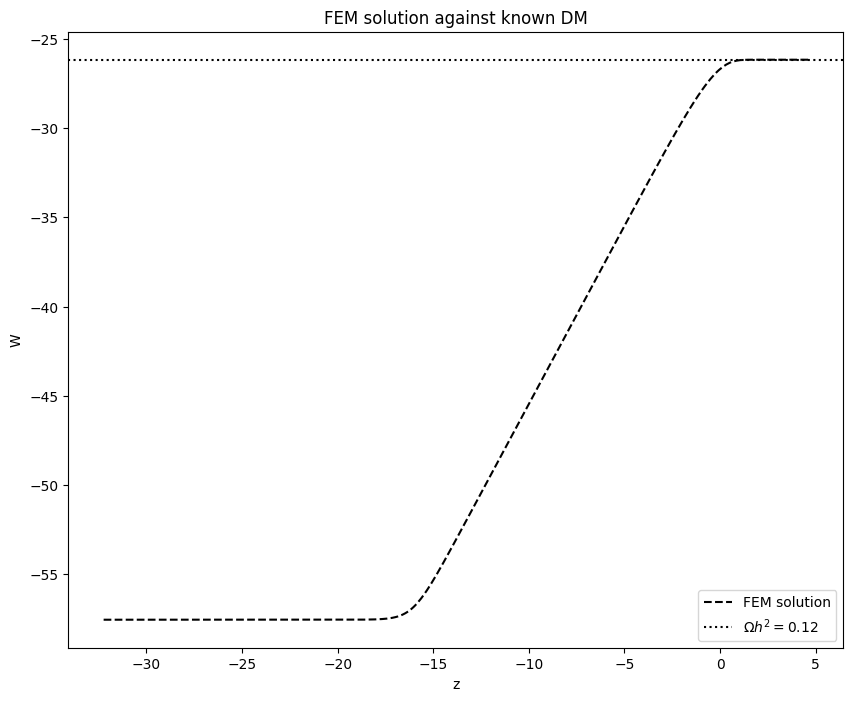

In [6]:
# Plot results 
plt.figure(figsize = (10,8))
plt.plot(sol.t, sol.y.reshape(-1,), color='black', linestyle='--', label = r'FEM solution') 
plt.axhline(wf, color='black', linestyle='dotted', label = r'$\Omega h^2 = 0.12$')
plt.title('FEM solution against known DM')
plt.xlabel('z') 
plt.ylabel('W') 
plt.legend()
plt.show()

### W_eq and softpluts_beta definition for tensorflow

In [7]:
def w_eq(z):
    """
    Computes W_eq for tensorflow.

    Parameters:
        z (float): The logarithm of x = m_DM / T.
        
    Returns:
        float: The definition of W_eq.
    """
    
    return tf.math.log(45 / tf.sqrt(32 * np.pi**7) * g / g_asts) + 3/2 * z - tf.math.exp(z)

### Training step

In [8]:
def kl_div(p_mean, p_std, q_mean, q_std):
    """
    Computes the KL divergence without any stability regulator.

    Parameters:
        p_mean: Posterior mean.
        p_std: Posterior standard deviation.
        q_mean: Prior mean.
        q_std: Prior standard deviation.
        
    Returns:
        KL divergence.
    """
    
    return tf.math.log(q_std / p_std) + (p_std**2 / q_std**2 + (p_mean - q_mean)**2 / q_std**2 - 1.0) / 2

In [9]:
def loss_ode(model, z_co):
    """
    Computes the loss of the Boltzmann equation.

    Parameters:
        model: PINN model.
        z_co: Colocation points.
        
    Returns:
        C: Inverse parameter: proxy for the cross-section.
        ode_loss: Residual of the ODE.
        z0_loss: Initial condition.
        zf_loss: DM data point.
        total_loss: The total loss.
    """
    
    with tf.GradientTape(persistent = False) as tape:
        tape.watch(z_co)
        w = model(z_co)
        
    # ODE derivative
    dw_z = tape.gradient(w, z_co)
    
    # Reparametrization trick
    epsilon = tf.random.normal(shape=())
    C_std = tf.math.softplus(prob_log_std)
    C = prob_mean + C_std * epsilon
    
    # LHS and RHS
    lhs = dw_z * w_n / z_n
    rhs = tf.math.exp(C - z_co * z_n + 2 * w_eq(z_co * z_n) - w * w_n)
    
    # Residual of the ODE
    ode_loss = lhs - rhs
    
    # Computation of the losses
    ode_loss = tf.reduce_mean(tf.math.abs(ode_loss))  
    z0_loss = tf.reduce_mean(tf.math.abs(w[0] - w0 / w_n))
    zf_loss = tf.reduce_mean(tf.math.abs(w[-1] - wf / w_n))
    kl_divergence = kl_div(prob_mean, tf.math.softplus(prob_log_std), prior_dist.loc, prior_dist.scale)
    
    # Total loss
    total_loss = 1e0 * ode_loss + 1e1 * z0_loss + 1e1 * zf_loss + 1e-2 * kl_divergence
    
    return prob_mean, C_std, ode_loss, z0_loss, zf_loss, kl_divergence, total_loss

In [10]:
@tf.function
def step(z_co, model, optm, epoch):
    """
    Computes each step of the forward pass and backpropagation.

    Parameters:
        z_co: Colocation points.
        model: PINN model.
        optm: Optimizer.
        epoch: Current epoch.
        
    Returns:
        C: Inverse parameter: proxy for the cross-section.
        ode_loss: Residual of the ODE.
        z0_loss: Initial condition.
        zf_loss: DM data point.
        total_loss: The total loss.
    """

    with tf.GradientTape(persistent=False) as tape:
        
        prob_mean, C_std, ode_loss, z0_loss, zf_loss, kl_divergence, total_loss = loss_ode(model, z_co)
        
        
    trainable = model.trainable_variables + [prob_mean, prob_log_std]
    
    model_gradients = tape.gradient(total_loss, trainable)
        
    optm.apply_gradients(zip(model_gradients, trainable))
    
    prob_mean.assign_sub(model_gradients[-2] * lr.initial_learning_rate * lr.decay_rate**(epoch // lr.decay_steps))
    prob_log_std.assign_sub(model_gradients[-1] * lr.initial_learning_rate * lr.decay_rate**(epoch // lr.decay_steps))
    
    return prob_mean, C_std, ode_loss, z0_loss, zf_loss, kl_divergence, total_loss

In [11]:
def negative_sigm(x):
    """
    Computes the negative sigmoid.

    Parameters:
        x: Input.
        
    Returns:
        Negative sigmoid.
    """
    
    return - tf.nn.sigmoid(x)

In [12]:
def nn(units, num_layers=4, kernel_init='glorot_uniform'):
    """
    Builds a feedforward neural network model using the Keras functional API.

    The network consists of an input layer followed by a series of Dense layers,
    each using the GELU activation,and a final Dense layer that applies a custom 
    negative sigmoid activation.

    Parameters:
        units (int): Number of units (neurons) in each hidden Dense layer.
        num_layers (int, optional): Total number of Dense layers (including the first one). 
            Default is 4.
        kernel_init (str or tf.keras.initializers.Initializer, optional): Kernel initializer for all Dense layers.
            Default is 'glorot_uniform'.

    Returns:
        tf.keras.Model: A Keras Model instance representing the constructed neural network.
    """
    
    inputs = Input(shape=(1,))
    
    x = Dense(units, activation='gelu', kernel_initializer=kernel_init)(inputs)
    
    for _ in range(num_layers - 1):
        x = Dense(units, activation='gelu', kernel_initializer=kernel_init)(x)

    output = Dense(1, activation=negative_sigm, kernel_initializer=kernel_init)(x)

    
    model = tf.keras.Model(inputs, output)
    
    return model

In [13]:
model = nn(30)

I0000 00:00:1740144097.728722    9939 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9674 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4070, pci bus id: 0000:01:00.0, compute capability: 8.9


In [14]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 1)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 30)             │            60 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 30)             │           930 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 30)             │           930 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 30)             │           930 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 1)              │            31 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,881 (11.25 KB)

 Trainable params: 2,881 (11.25 KB)

 Non-trainable params: 0 (0.00 B)

### Hyperparameters

In [15]:
epochs = 400000

lr = tf.keras.optimizers.schedules.ExponentialDecay(1e-3, 1000, 0.99)

optm = tf.keras.optimizers.Adam(learning_rate=lr, clipvalue=10.0)

### Input parameters

In [16]:
# Colocation points
num_coloc = 500
z_coloc = tf.cast(tf.reshape(tf.linspace(z0 / z_n, zf / z_n, num_coloc), (-1, 1)), tf.float32)

# C posterior
tfd = tfp.distributions
prob_mean = tf.Variable(-11.5, name='prob_mean', trainable=True)
prob_log_std = tf.Variable(0.1, name='prob_log_std', trainable=True)
prob_dist = tfd.Normal(loc=prob_mean, scale=tf.math.softplus(prob_log_std))

# C prior
prior_dist = tfd.Normal(loc=-11.5, scale=1.25)

### Training


Epoch: 1000/400000
Loss: 0.804706335067749
C_mean: -11.756178855895996
C_std: 0.5960870385169983
Loss ODE: 0.786425769329071
Loss z0: 0.00015425682067871094
Loss zf: 0.0012985467910766602
KL divergence: 0.3752518892288208


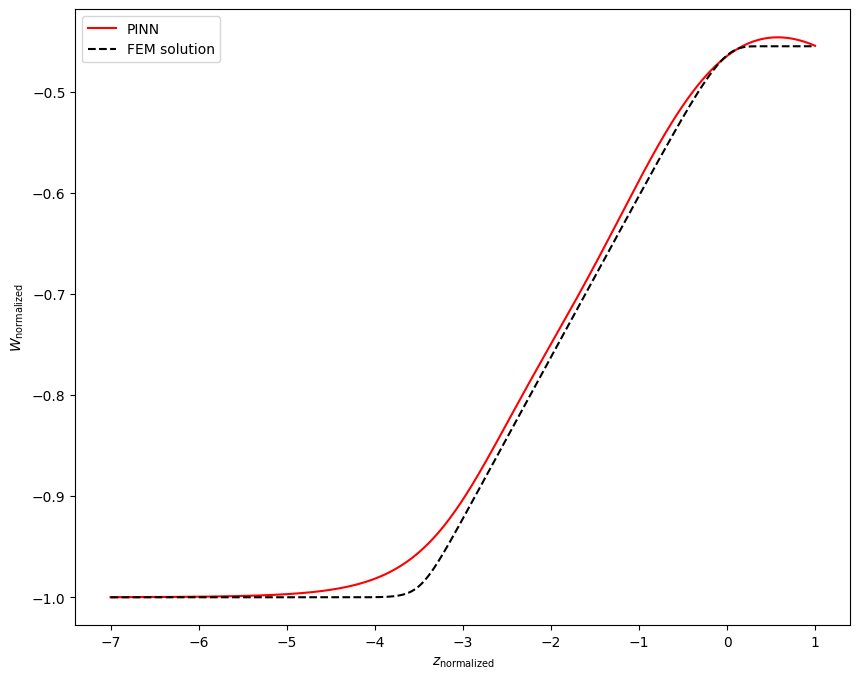


Epoch: 2000/400000
Loss: 0.5181746482849121
C_mean: -11.846275329589844
C_std: 0.41306373476982117
Loss ODE: 0.4953000545501709
Loss z0: 0.00016105175018310547
Loss zf: 0.0014260709285736084
KL divergence: 0.7003381252288818


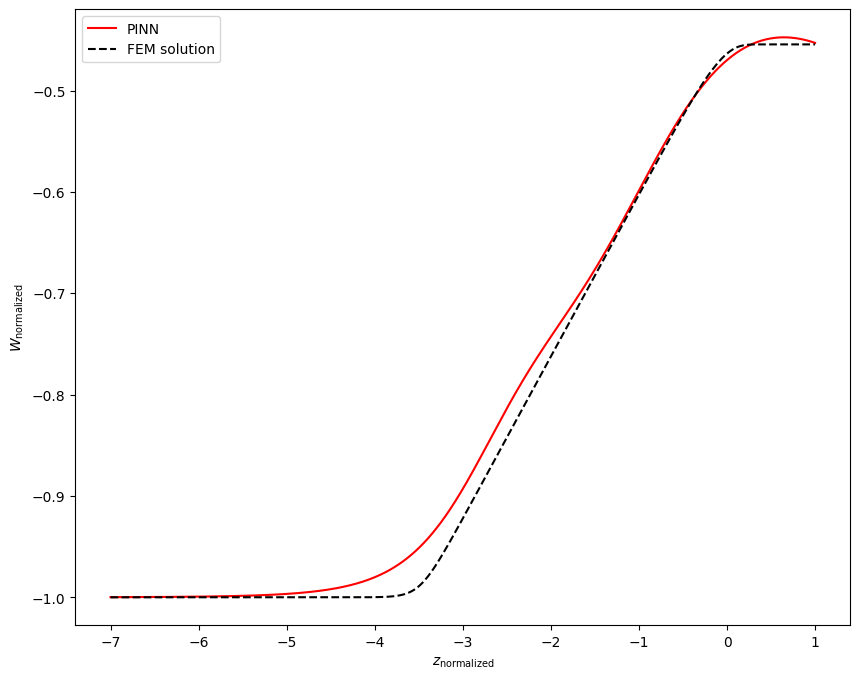


Epoch: 3000/400000
Loss: 0.4382081627845764
C_mean: -11.90359115600586
C_std: 0.2879733443260193
Loss ODE: 0.42371657490730286
Loss z0: 5.614757537841797e-05
Loss zf: 0.00034618377685546875
KL divergence: 1.0468266010284424


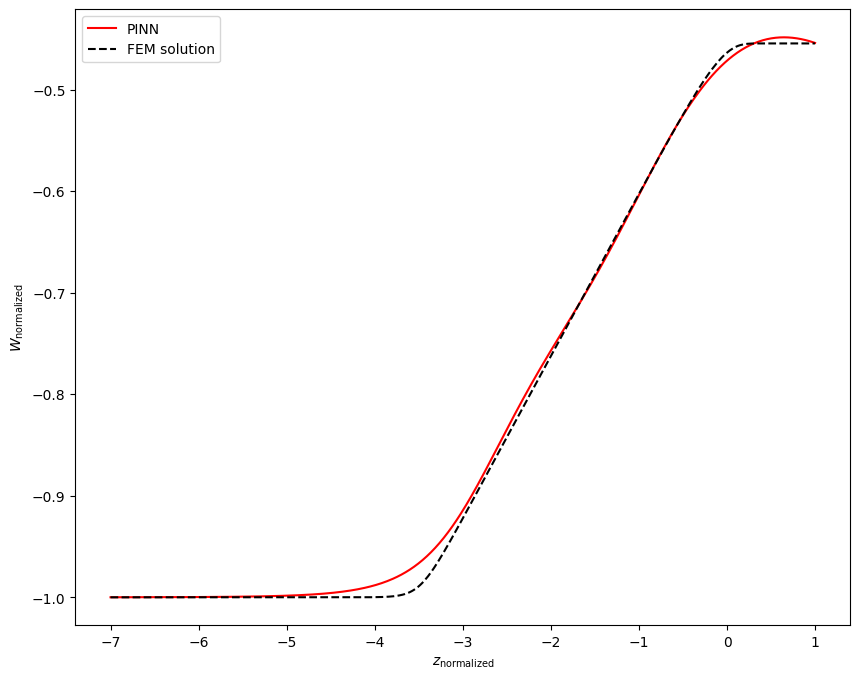


Epoch: 4000/400000
Loss: 0.2593182623386383
C_mean: -11.948578834533691
C_std: 0.20548804104328156
Loss ODE: 0.24270395934581757
Loss z0: 2.5391578674316406e-05
Loss zf: 0.0002524852752685547
KL divergence: 1.3835546970367432


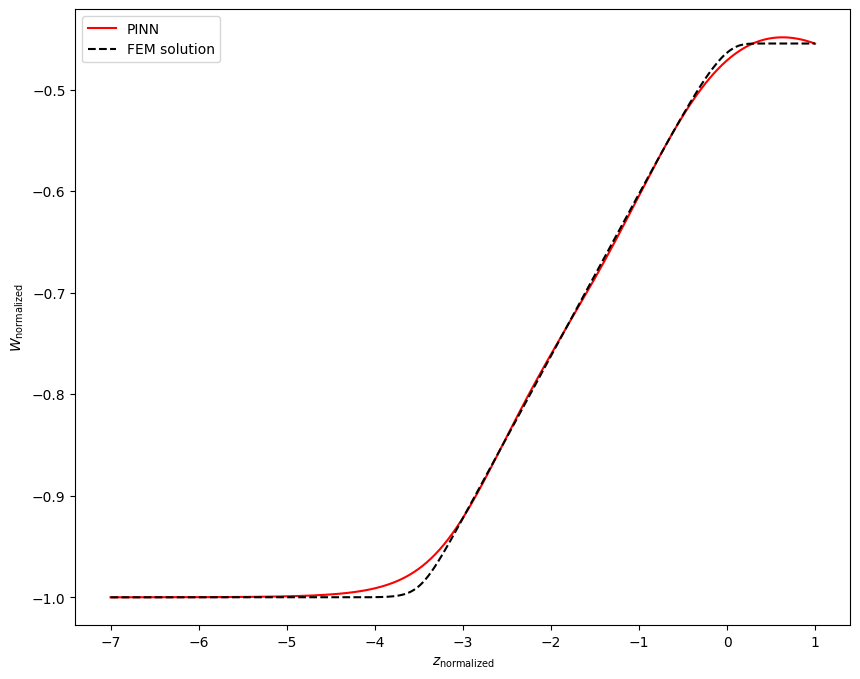


Epoch: 5000/400000
Loss: 0.27874329686164856
C_mean: -11.987911224365234
C_std: 0.15628838539123535
Loss ODE: 0.2581402659416199
Loss z0: 1.1801719665527344e-05
Loss zf: 0.00038510560989379883
KL divergence: 1.6633954048156738


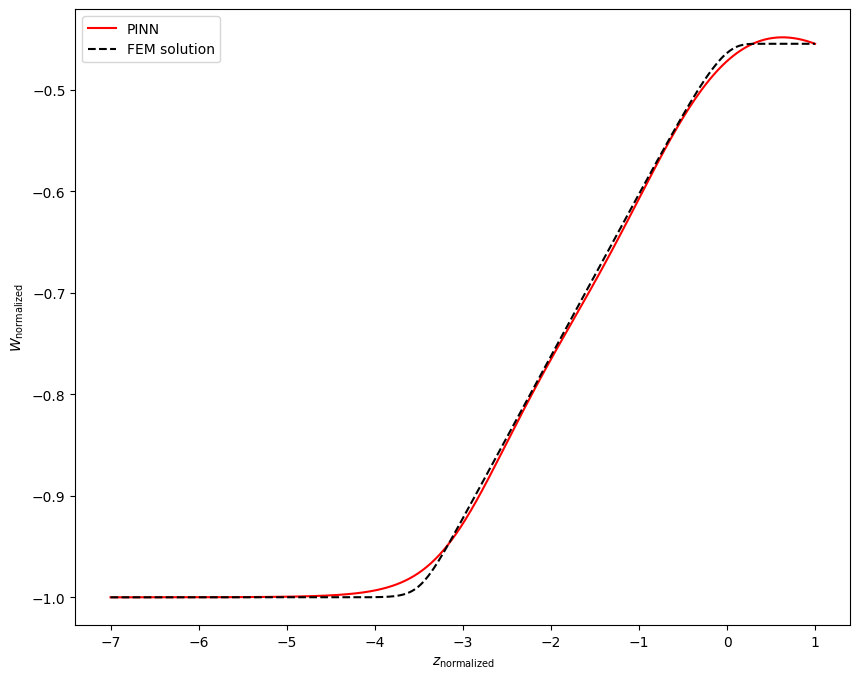


Epoch: 6000/400000
Loss: 0.29994997382164
C_mean: -12.021516799926758
C_std: 0.11492994427680969
Loss ODE: 0.27370256185531616
Loss z0: 6.556510925292969e-06
Loss zf: 0.0006401538848876953
KL divergence: 1.9780304431915283


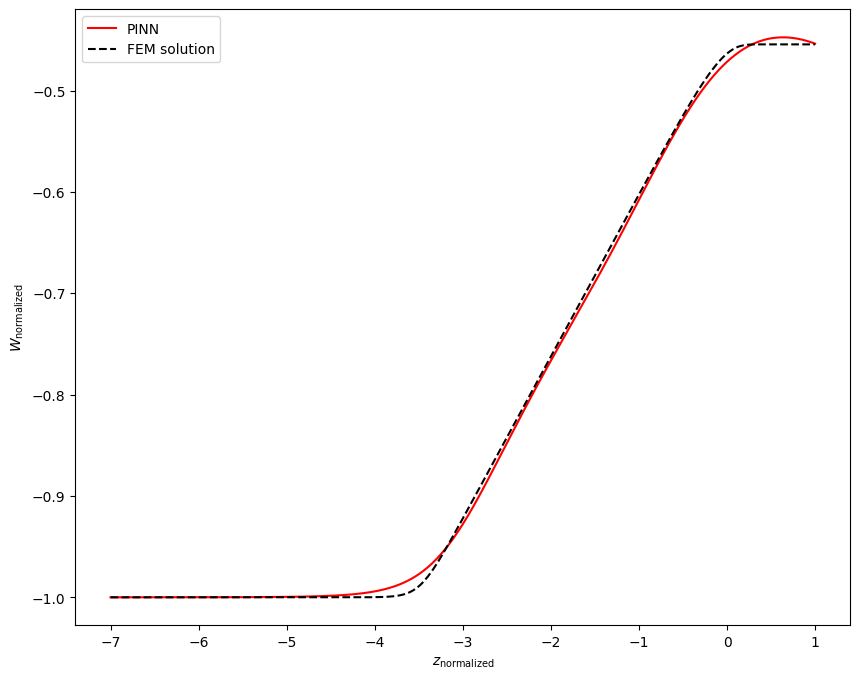


Epoch: 7000/400000
Loss: 0.27936407923698425
C_mean: -12.048457145690918
C_std: 0.08859836310148239
Loss ODE: 0.251961886882782
Loss z0: 2.9802322387695312e-06
Loss zf: 0.0004920363426208496
KL divergence: 2.245201587677002


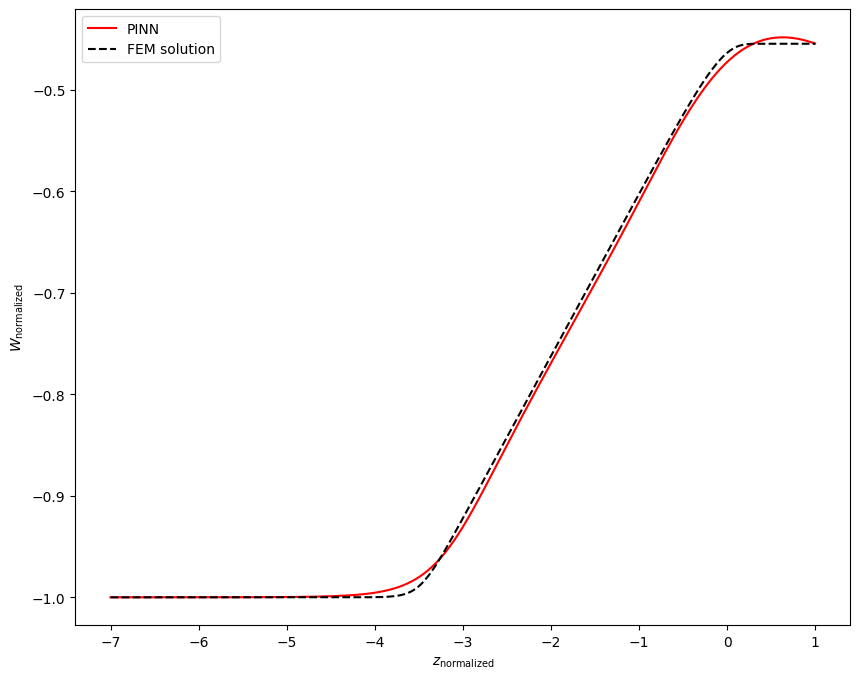


Epoch: 8000/400000
Loss: 0.20063243806362152
C_mean: -12.06518840789795
C_std: 0.07204219698905945
Loss ODE: 0.15806986391544342
Loss z0: 2.0265579223632812e-06
Loss zf: 0.001796424388885498
KL divergence: 2.457805871963501


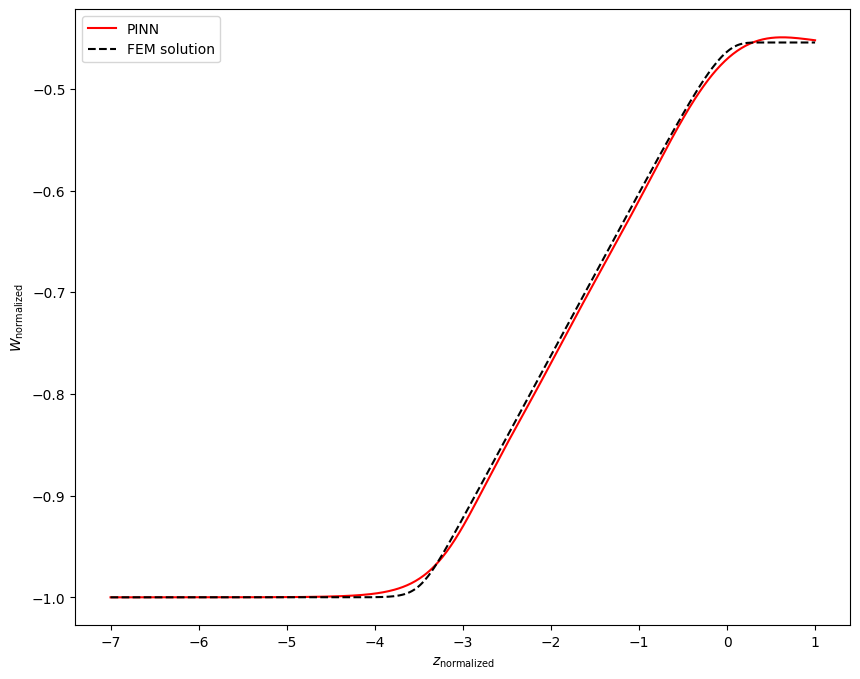


Epoch: 9000/400000
Loss: 0.1048348918557167
C_mean: -12.073965072631836
C_std: 0.060096703469753265
Loss ODE: 0.07579407095909119
Loss z0: 8.344650268554688e-07
Loss zf: 0.00026172399520874023
KL divergence: 2.641523838043213


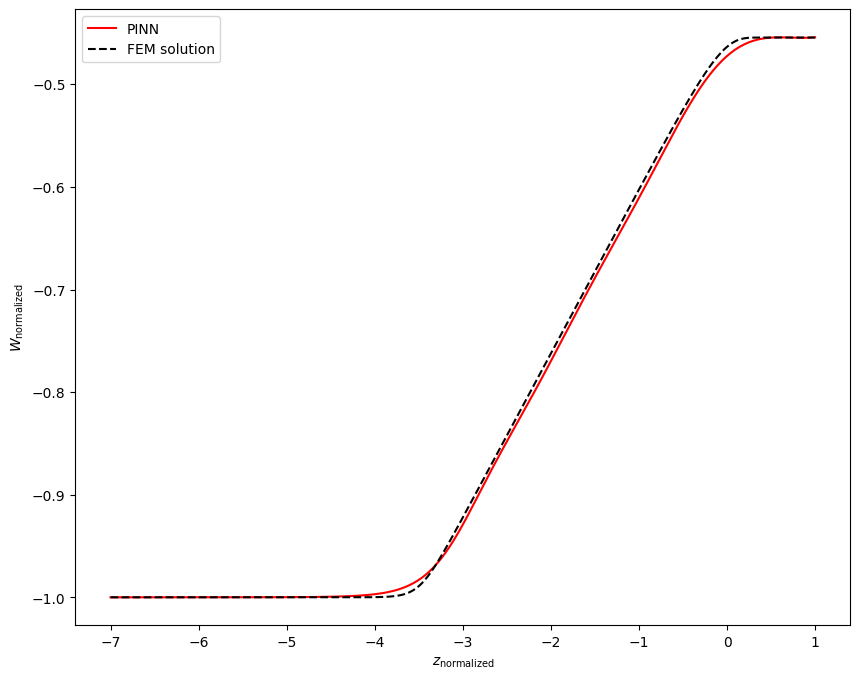


Epoch: 10000/400000
Loss: 0.13111436367034912
C_mean: -12.07515811920166
C_std: 0.050523433834314346
Loss ODE: 0.08730620890855789
Loss z0: 2.384185791015625e-07
Loss zf: 0.0015653371810913086
KL divergence: 2.815239191055298


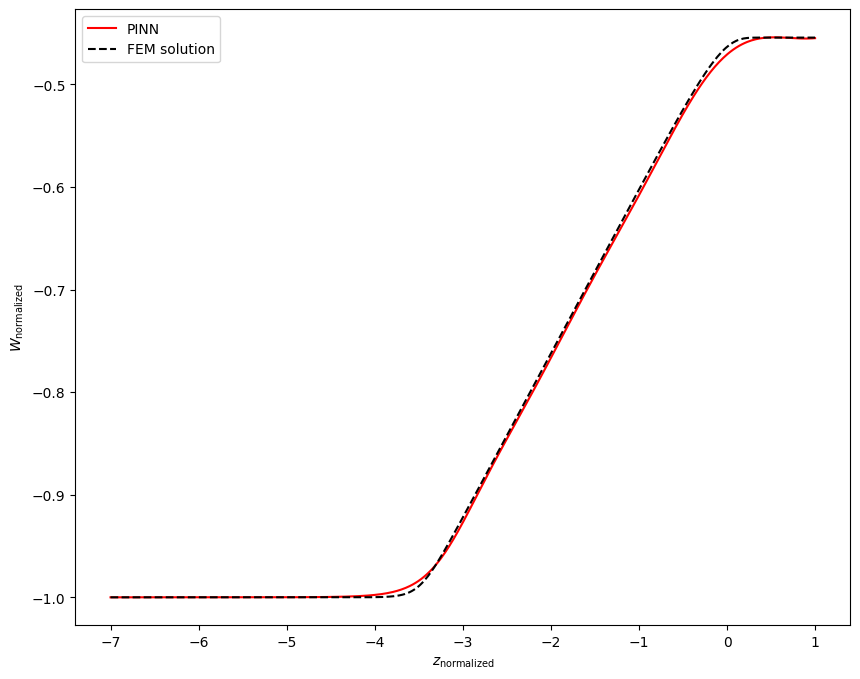


Epoch: 11000/400000
Loss: 0.11685829609632492
C_mean: -12.07051944732666
C_std: 0.045912884175777435
Loss ODE: 0.08469213545322418
Loss z0: 1.1920928955078125e-07
Loss zf: 0.0003076791763305664
KL divergence: 2.908818006515503


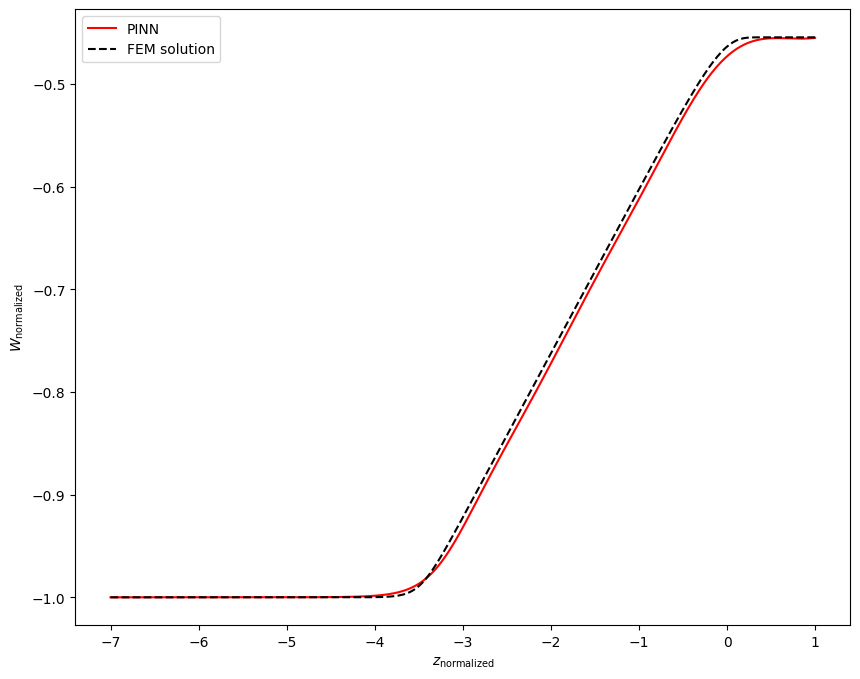


Epoch: 12000/400000
Loss: 0.08655361831188202
C_mean: -12.06521224975586
C_std: 0.040125809609889984
Loss ODE: 0.05566994845867157
Loss z0: 0.0
Loss zf: 4.6700239181518555e-05
KL divergence: 3.0416667461395264


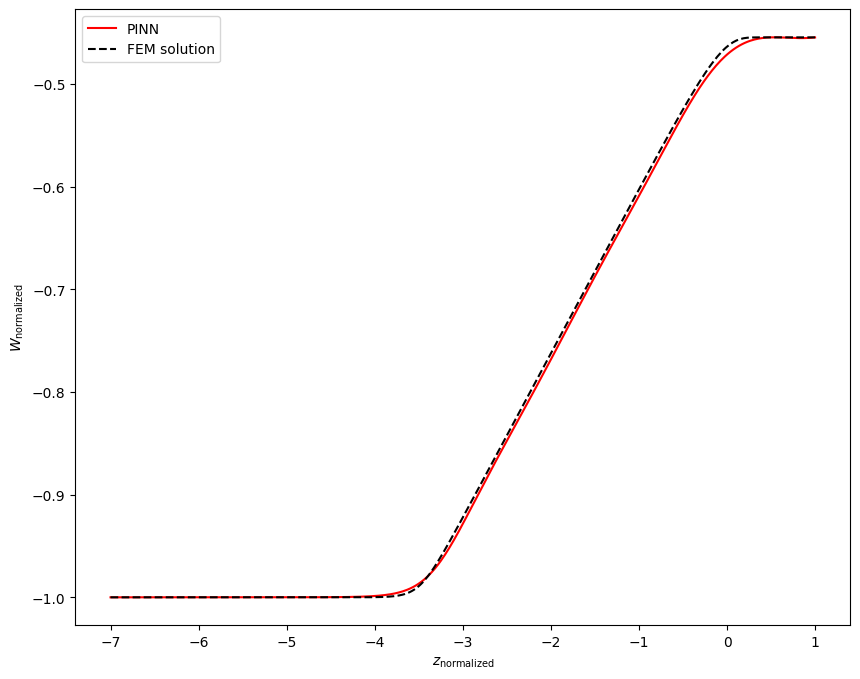


Epoch: 13000/400000
Loss: 0.0961393341422081
C_mean: -12.056995391845703
C_std: 0.037541598081588745
Loss ODE: 0.06327985227108002
Loss z0: 0.0
Loss zf: 0.00018101930618286133
KL divergence: 3.104928970336914


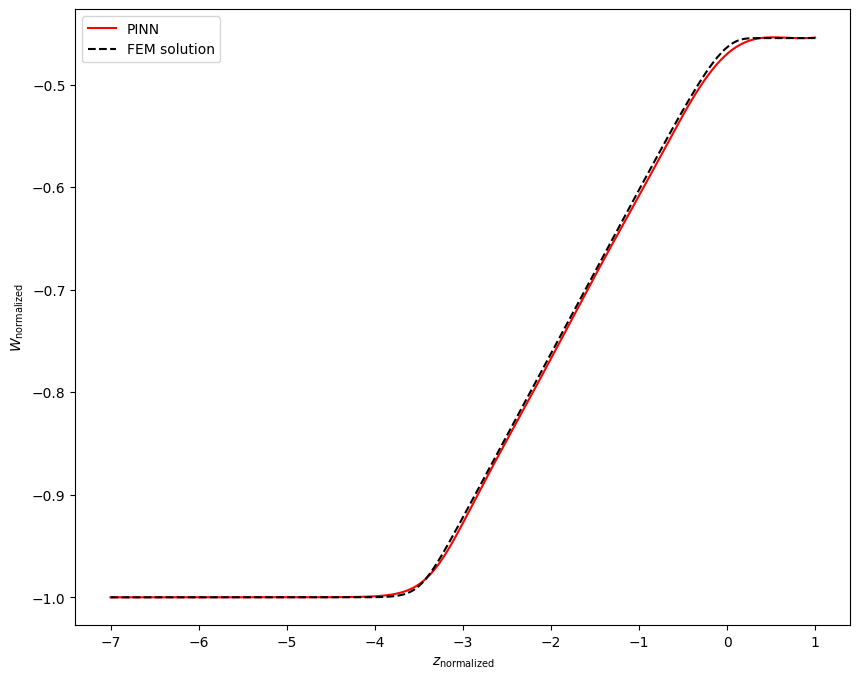


Epoch: 14000/400000
Loss: 0.13047045469284058
C_mean: -12.042928695678711
C_std: 0.03760864958167076
Loss ODE: 0.09350448846817017
Loss z0: 0.0
Loss zf: 0.0005979537963867188
KL divergence: 3.098642587661743


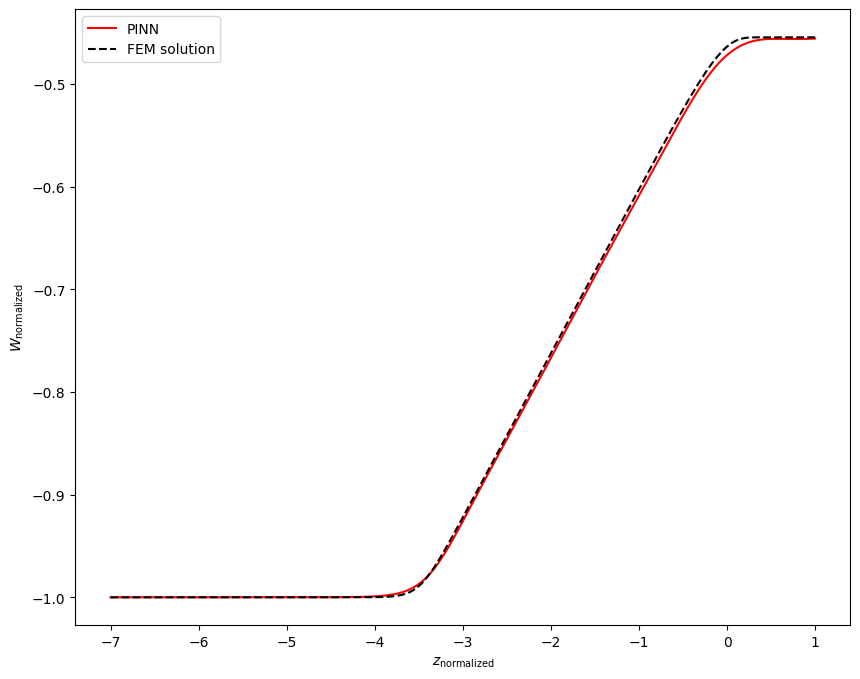


Epoch: 15000/400000
Loss: 0.10365127772092819
C_mean: -12.023598670959473
C_std: 0.03723209351301193
Loss ODE: 0.0662379115819931
Loss z0: 0.0
Loss zf: 0.0006393194198608398
KL divergence: 3.102017402648926


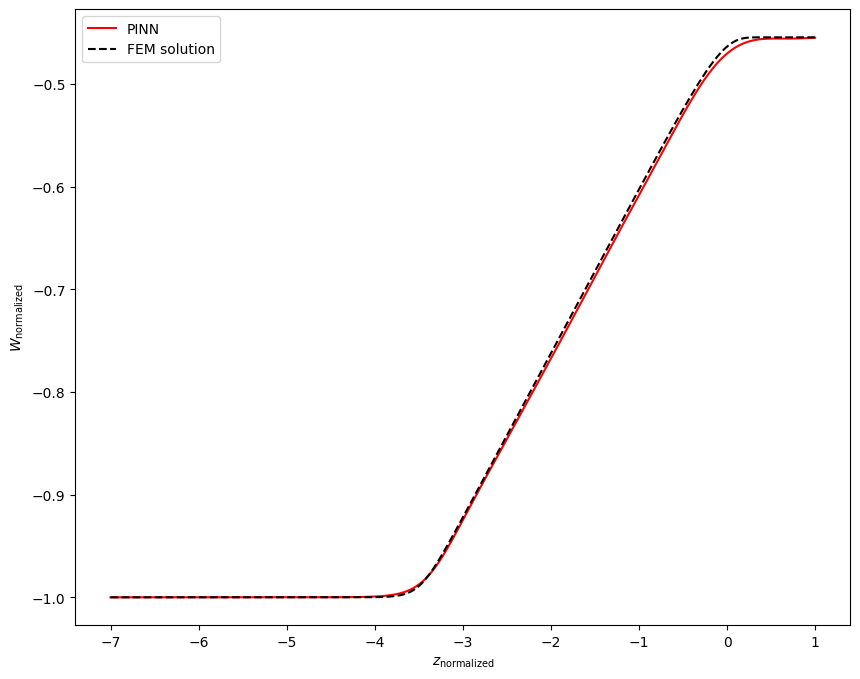


Epoch: 16000/400000
Loss: 0.09813017398118973
C_mean: -12.000118255615234
C_std: 0.036393504589796066
Loss ODE: 0.06200062483549118
Loss z0: 0.0
Loss zf: 0.0004961490631103516
KL divergence: 3.1168060302734375


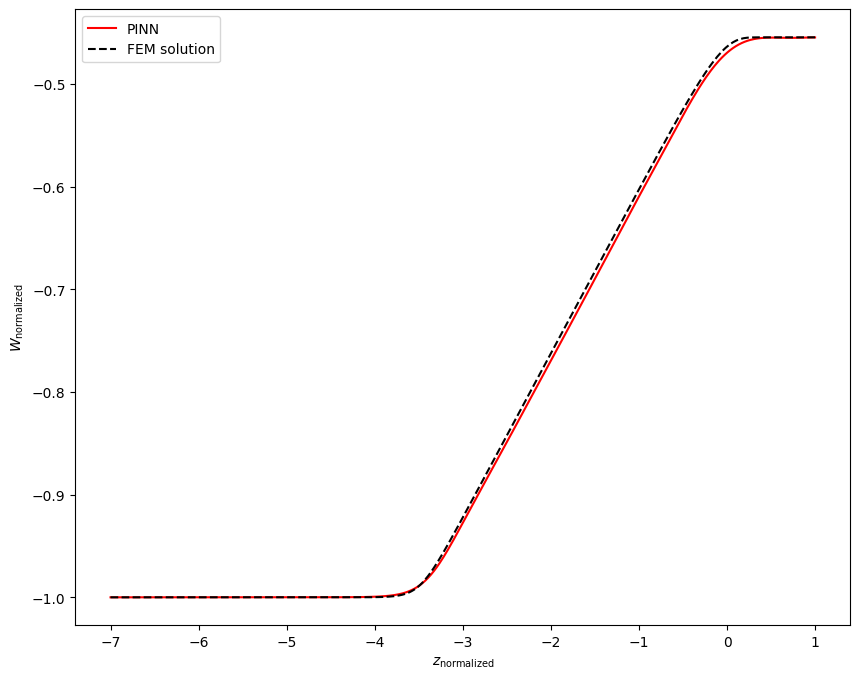


Epoch: 17000/400000
Loss: 0.10471519082784653
C_mean: -11.977542877197266
C_std: 0.03628596290946007
Loss ODE: 0.05693558603525162
Loss z0: 0.0
Loss zf: 0.0016652941703796387
KL divergence: 3.112666130065918


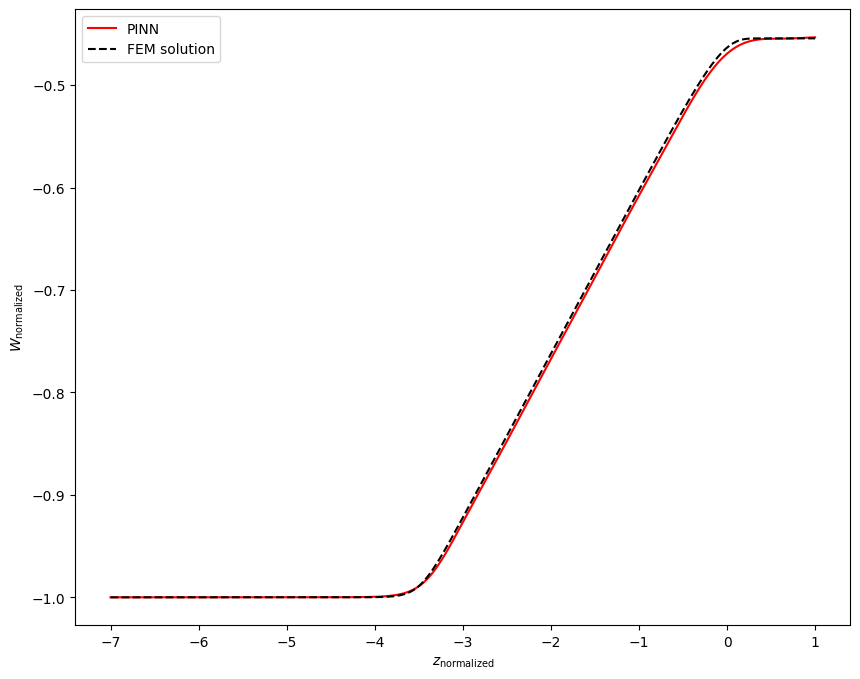


Epoch: 18000/400000
Loss: 0.08617880195379257
C_mean: -11.954644203186035
C_std: 0.035798534750938416
Loss ODE: 0.039243292063474655
Loss z0: 0.0
Loss zf: 0.0015740692615509033
KL divergence: 3.1194815635681152


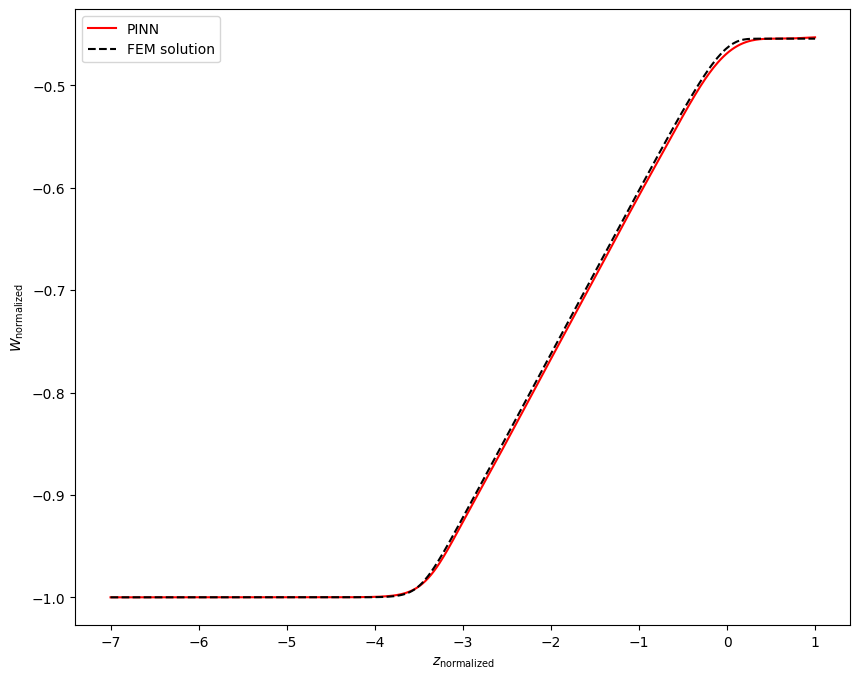


Epoch: 19000/400000
Loss: 0.10558293759822845
C_mean: -11.933435440063477
C_std: 0.036104731261730194
Loss ODE: 0.06925006210803986
Loss z0: 0.0
Loss zf: 0.0005283653736114502
KL divergence: 3.104922294616699


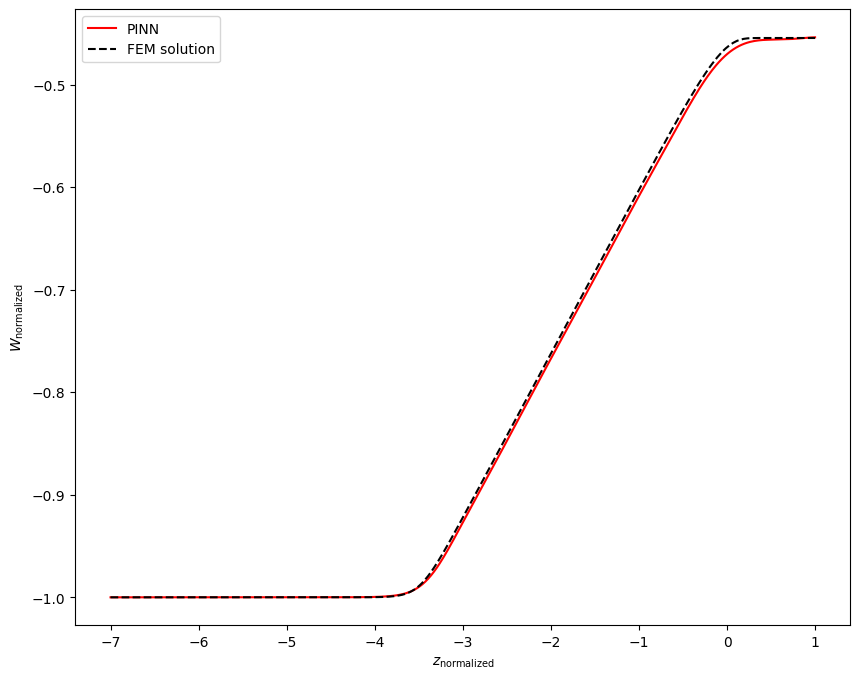


Epoch: 20000/400000
Loss: 0.08087816089391708
C_mean: -11.918447494506836
C_std: 0.036014374345541
Loss ODE: 0.044273193925619125
Loss z0: 0.0
Loss zf: 0.0005572736263275146
KL divergence: 3.1032233238220215


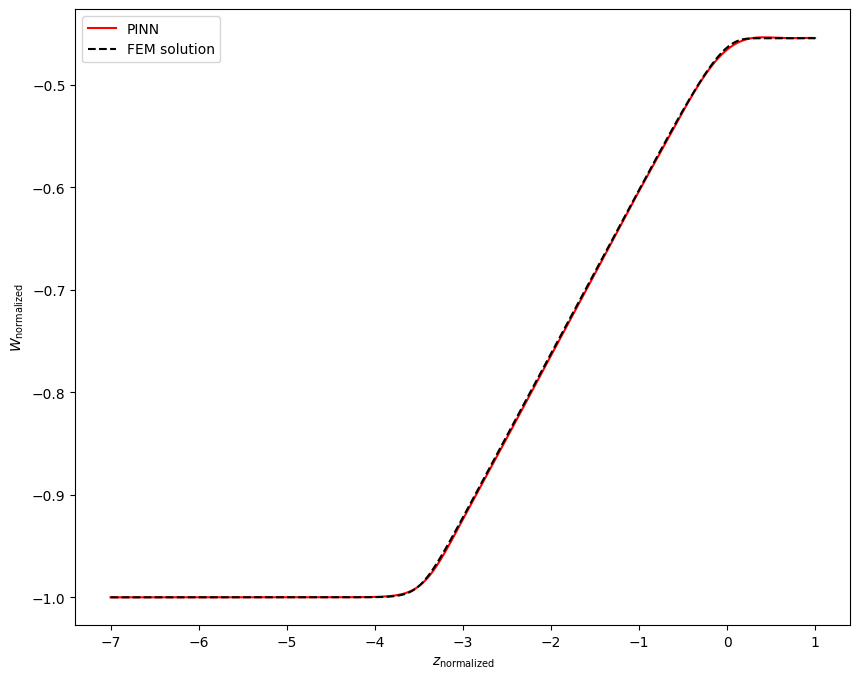


Epoch: 21000/400000
Loss: 0.07340247184038162
C_mean: -11.899739265441895
C_std: 0.03570166230201721
Loss ODE: 0.03974280506372452
Loss z0: 0.0
Loss zf: 0.0002586841583251953
KL divergence: 3.1072824001312256


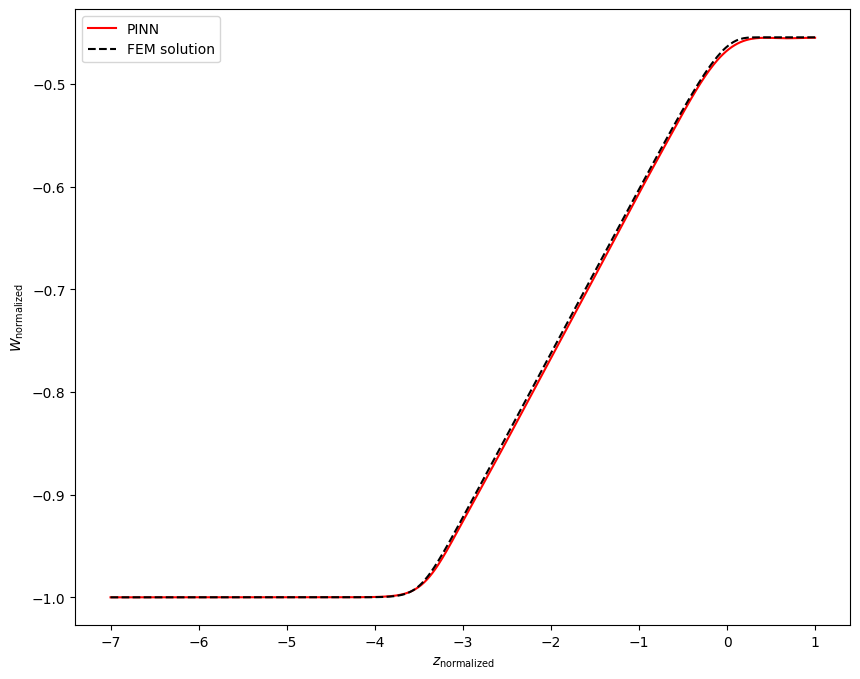


Epoch: 22000/400000
Loss: 0.07589323073625565
C_mean: -11.884502410888672
C_std: 0.03488939255475998
Loss ODE: 0.038612790405750275
Loss z0: 0.0
Loss zf: 0.000601649284362793
KL divergence: 3.126394748687744


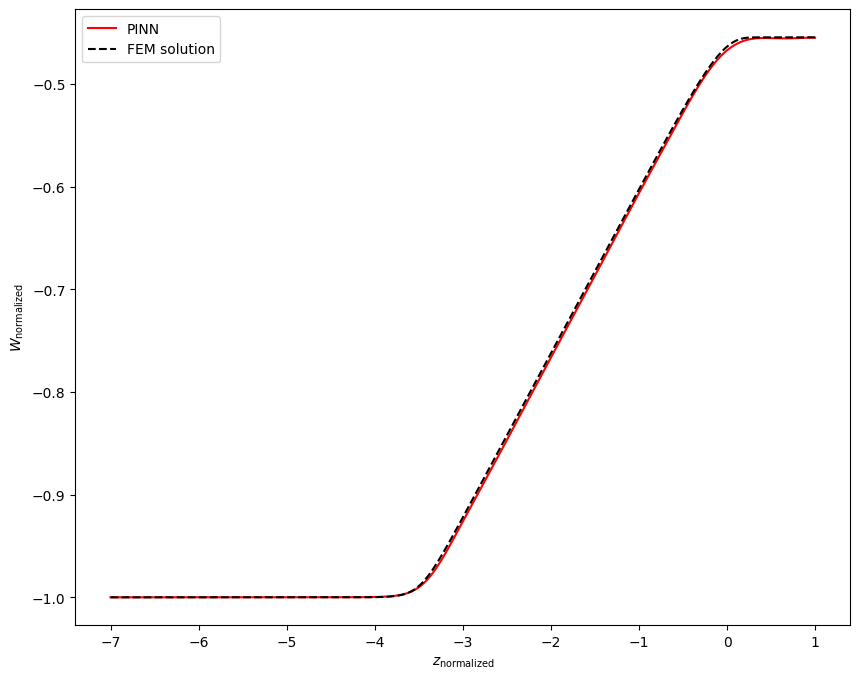


Epoch: 23000/400000
Loss: 0.08480624854564667
C_mean: -11.870736122131348
C_std: 0.033269211649894714
Loss ODE: 0.04492567479610443
Loss z0: 0.0
Loss zf: 0.0008172988891601562
KL divergence: 3.1707584857940674


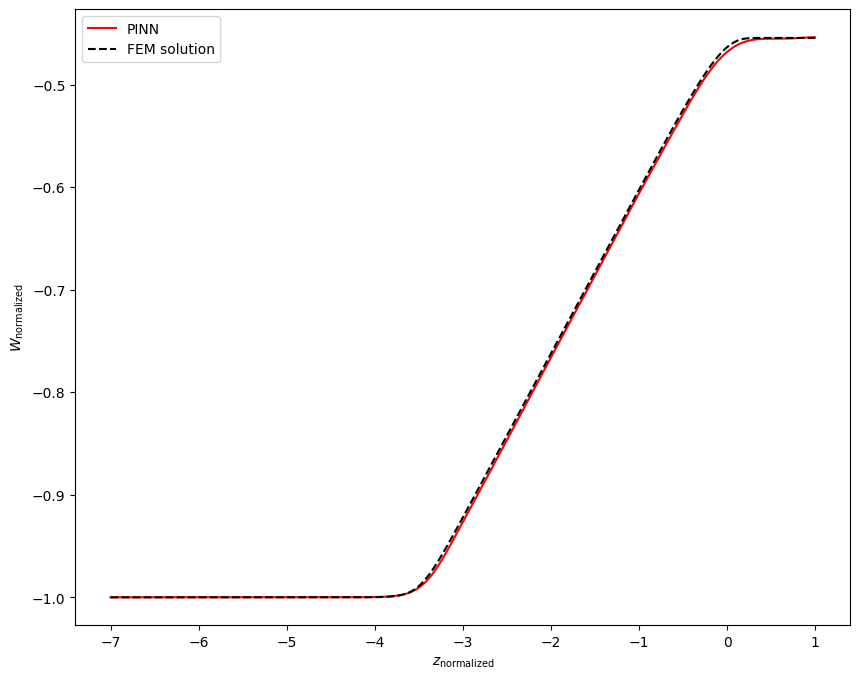


Epoch: 24000/400000
Loss: 0.14607569575309753
C_mean: -11.859223365783691
C_std: 0.032542869448661804
Loss ODE: 0.11115343868732452
Loss z0: 0.0
Loss zf: 0.0003020763397216797
KL divergence: 3.1901488304138184


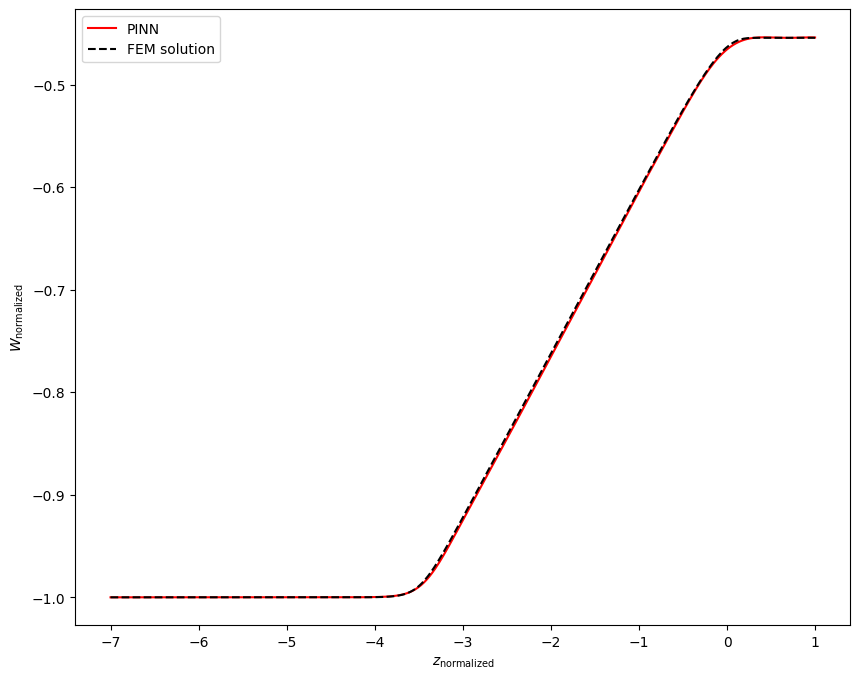


Epoch: 25000/400000
Loss: 0.05906260758638382
C_mean: -11.847217559814453
C_std: 0.031682927161455154
Loss ODE: 0.02371169812977314
Loss z0: 0.0
Loss zf: 0.0003210008144378662
KL divergence: 3.214089870452881


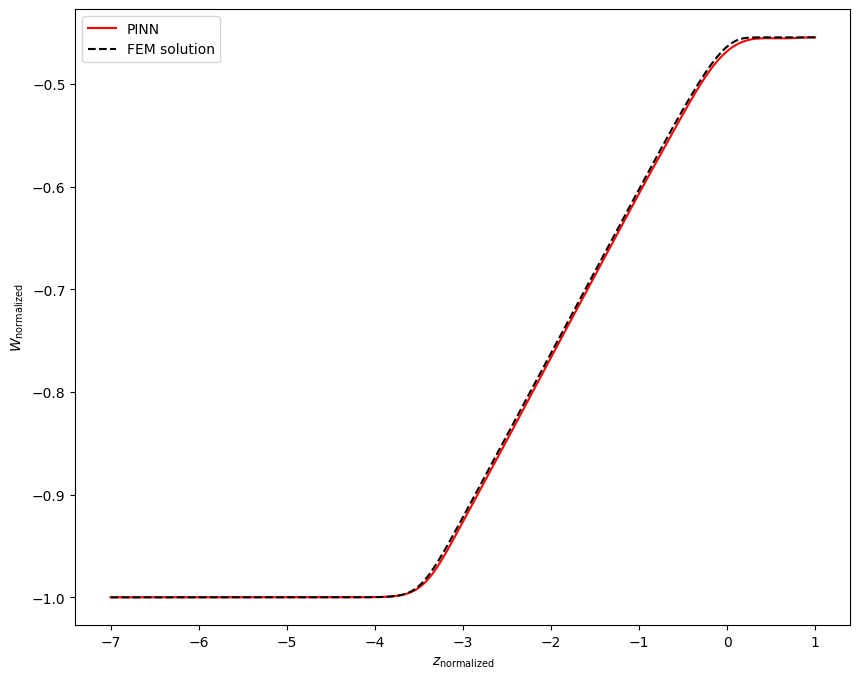


Epoch: 26000/400000
Loss: 0.10723549127578735
C_mean: -11.838739395141602
C_std: 0.03162332624197006
Loss ODE: 0.07419013977050781
Loss z0: 0.0
Loss zf: 9.036064147949219e-05
KL divergence: 3.2141740322113037


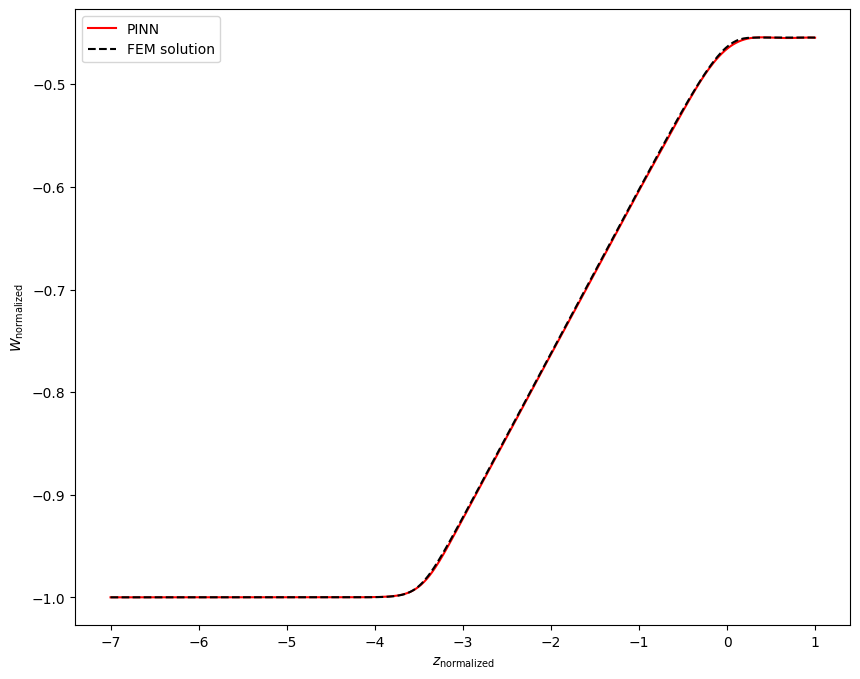


Epoch: 27000/400000
Loss: 0.08229704201221466
C_mean: -11.82996940612793
C_std: 0.03200151026248932
Loss ODE: 0.04601379856467247
Loss z0: 0.0
Loss zf: 0.0004279613494873047
KL divergence: 3.2003633975982666


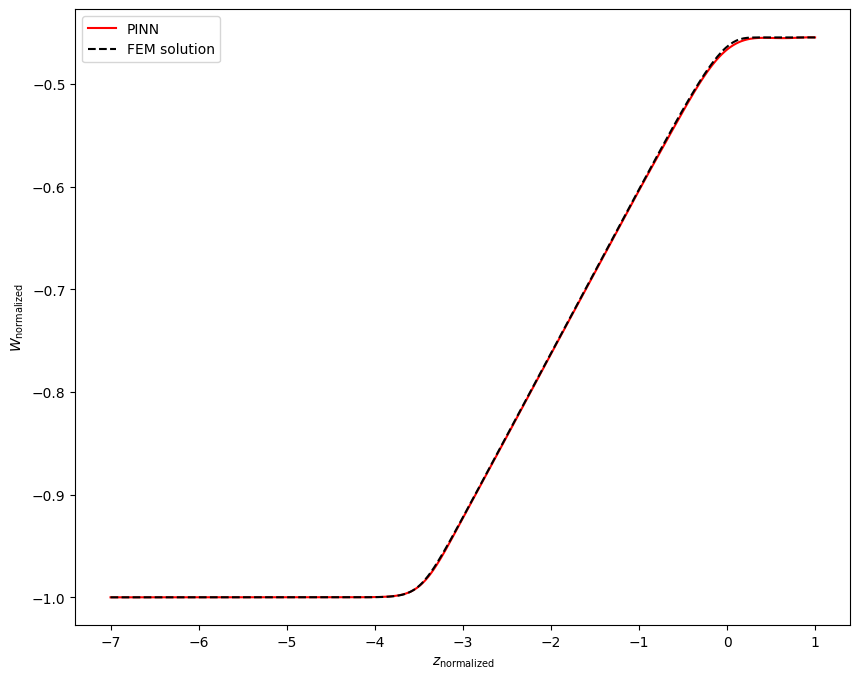


Epoch: 28000/400000
Loss: 0.07719750702381134
C_mean: -11.820551872253418
C_std: 0.032115183770656586
Loss ODE: 0.04351441189646721
Loss z0: 0.0
Loss zf: 0.00017347931861877441
KL divergence: 3.1948301792144775


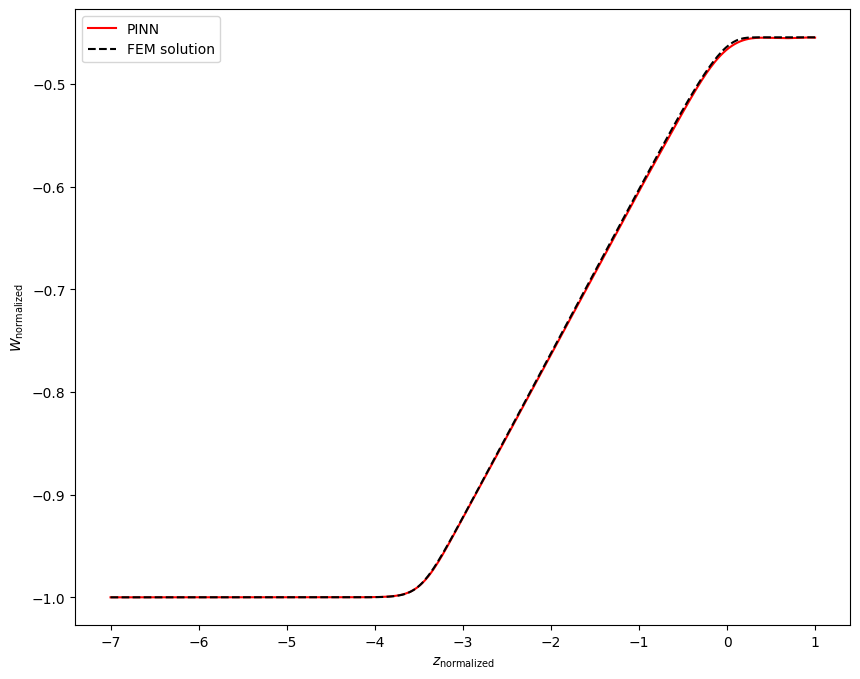


Epoch: 29000/400000
Loss: 0.11753351986408234
C_mean: -11.813624382019043
C_std: 0.03219514712691307
Loss ODE: 0.08439884334802628
Loss z0: 0.0
Loss zf: 0.00012248754501342773
KL divergence: 3.1909799575805664


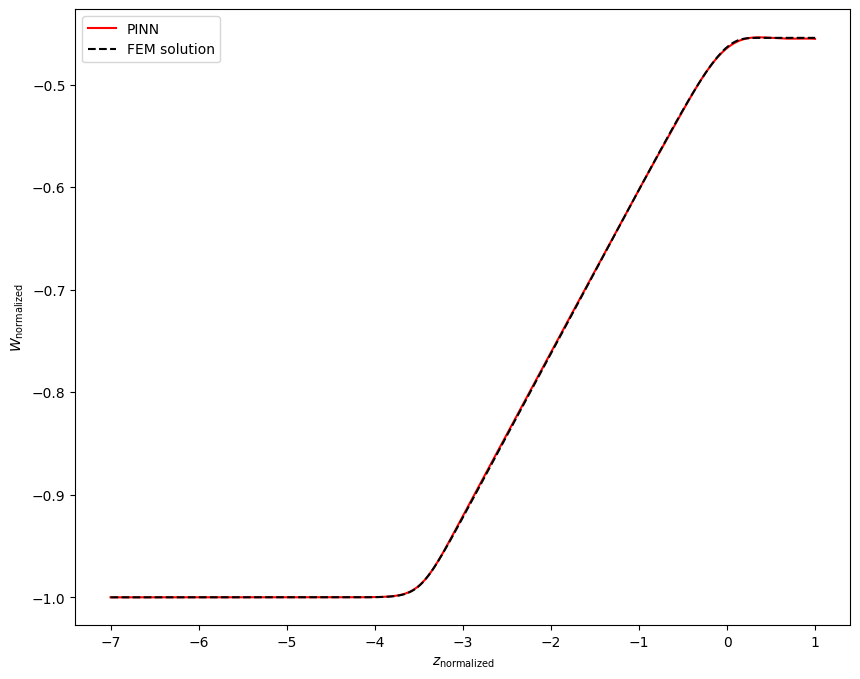


Epoch: 30000/400000
Loss: 0.08788254857063293
C_mean: -11.804193496704102
C_std: 0.033018071204423904
Loss ODE: 0.052718907594680786
Loss z0: 0.0
Loss zf: 0.00035268068313598633
KL divergence: 3.1636834144592285


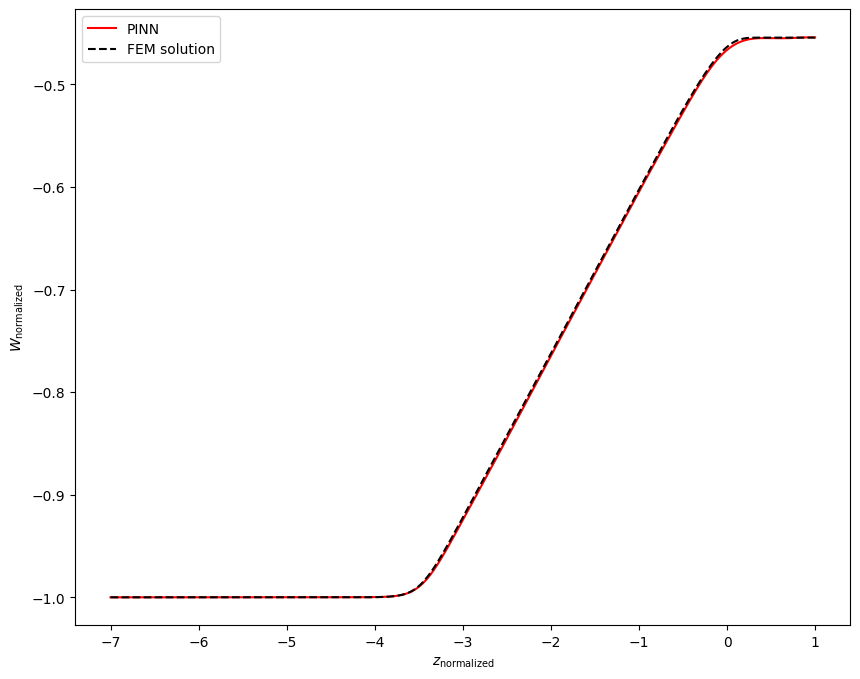


Epoch: 31000/400000
Loss: 0.07220184803009033
C_mean: -11.798188209533691
C_std: 0.03272652253508568
Loss ODE: 0.03278844431042671
Loss z0: 0.0
Loss zf: 0.0007699131965637207
KL divergence: 3.171427011489868


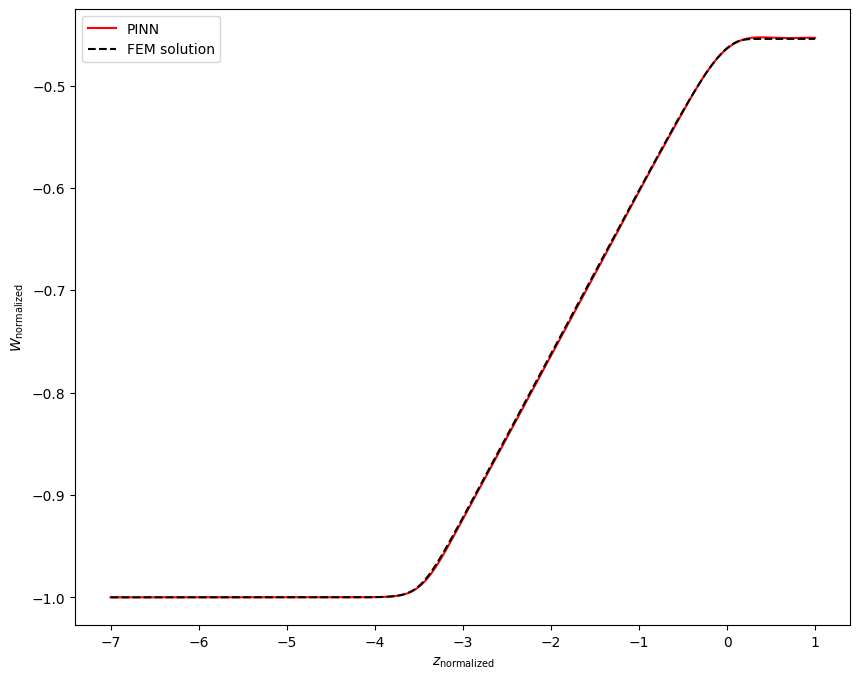


Epoch: 32000/400000
Loss: 0.08458572626113892
C_mean: -11.791254997253418
C_std: 0.03215954452753067
Loss ODE: 0.04657614976167679
Loss z0: 0.0
Loss zf: 0.0006133913993835449
KL divergence: 3.1875667572021484


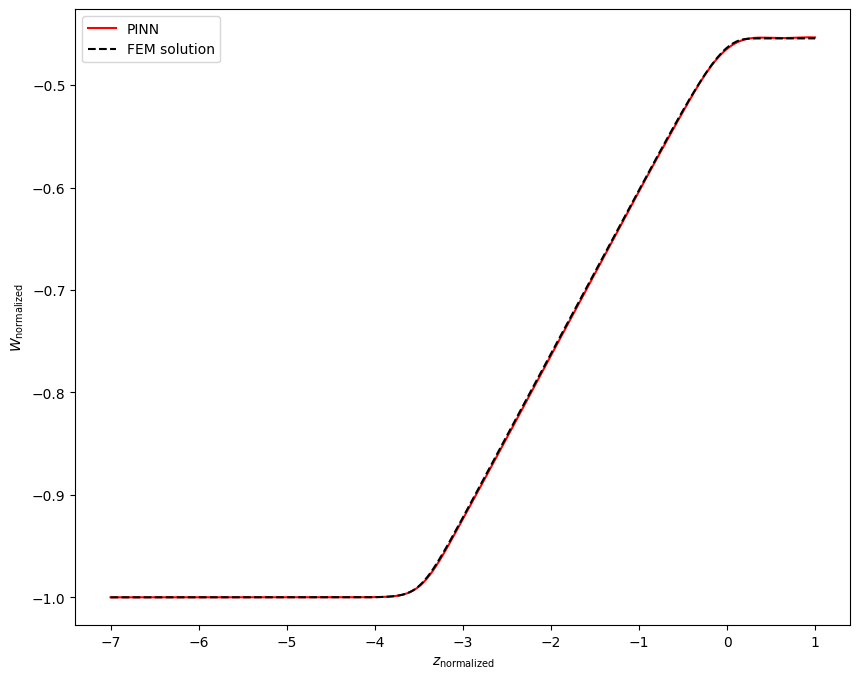


Epoch: 33000/400000
Loss: 0.07986695319414139
C_mean: -11.783717155456543
C_std: 0.031436365097761154
Loss ODE: 0.04080274701118469
Loss z0: 0.0
Loss zf: 0.0006974339485168457
KL divergence: 3.208986759185791


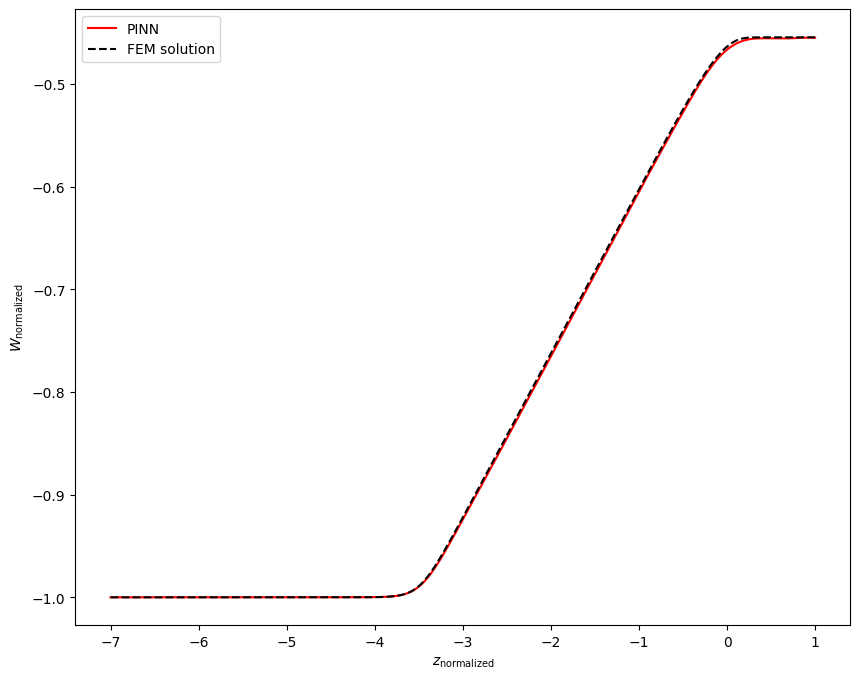


Epoch: 34000/400000
Loss: 0.1430312544107437
C_mean: -11.778997421264648
C_std: 0.030897065997123718
Loss ODE: 0.10701268911361694
Loss z0: 0.0
Loss zf: 0.0003763139247894287
KL divergence: 3.2255425453186035


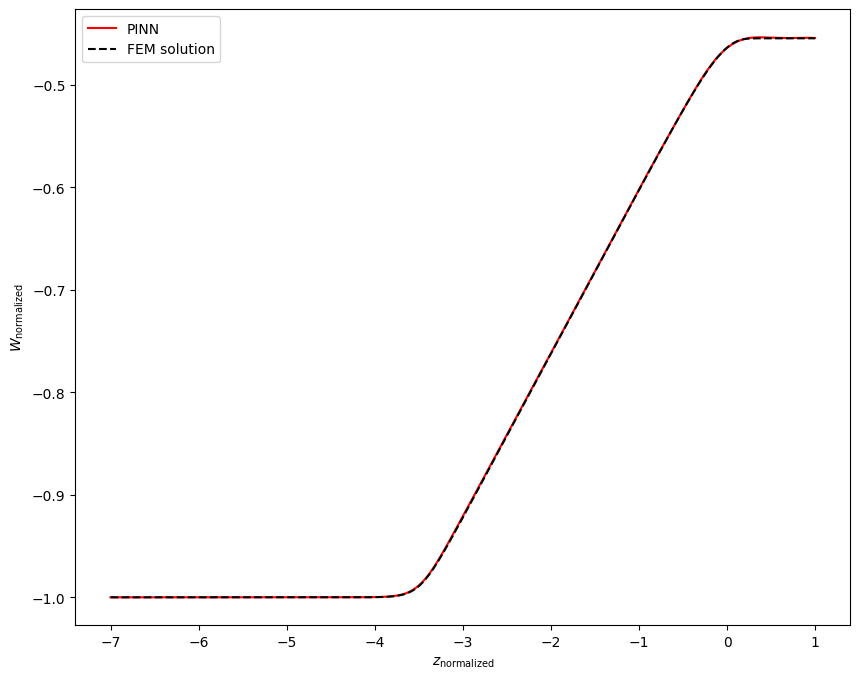


Epoch: 35000/400000
Loss: 0.07225260138511658
C_mean: -11.774161338806152
C_std: 0.03067968599498272
Loss ODE: 0.035104814916849136
Loss z0: 0.0
Loss zf: 0.0004832446575164795
KL divergence: 3.231534242630005


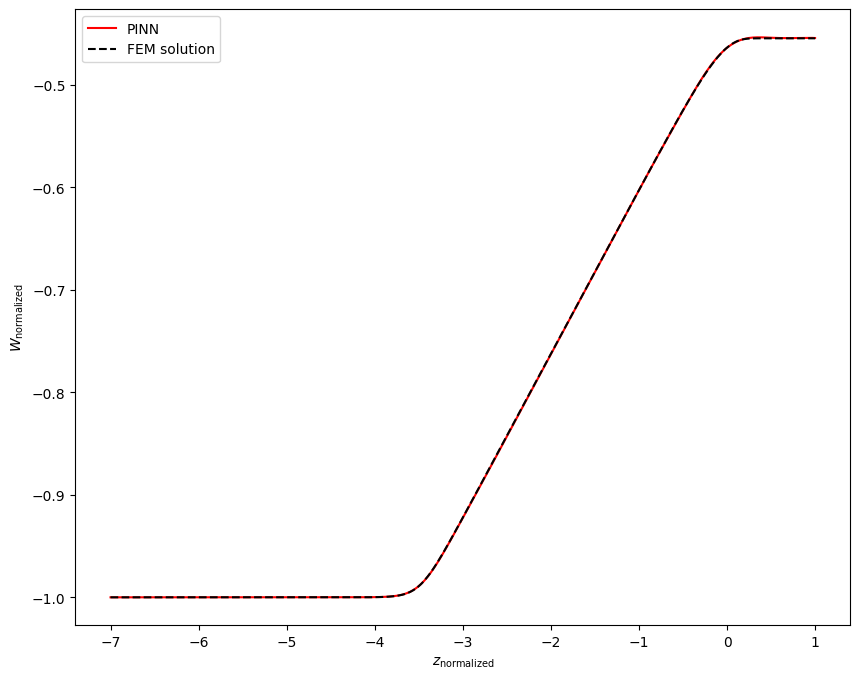


Epoch: 36000/400000
Loss: 0.08457453548908234
C_mean: -11.767476081848145
C_std: 0.030222542583942413
Loss ODE: 0.05100870504975319
Loss z0: 0.0
Loss zf: 0.00011119246482849121
KL divergence: 3.2453901767730713


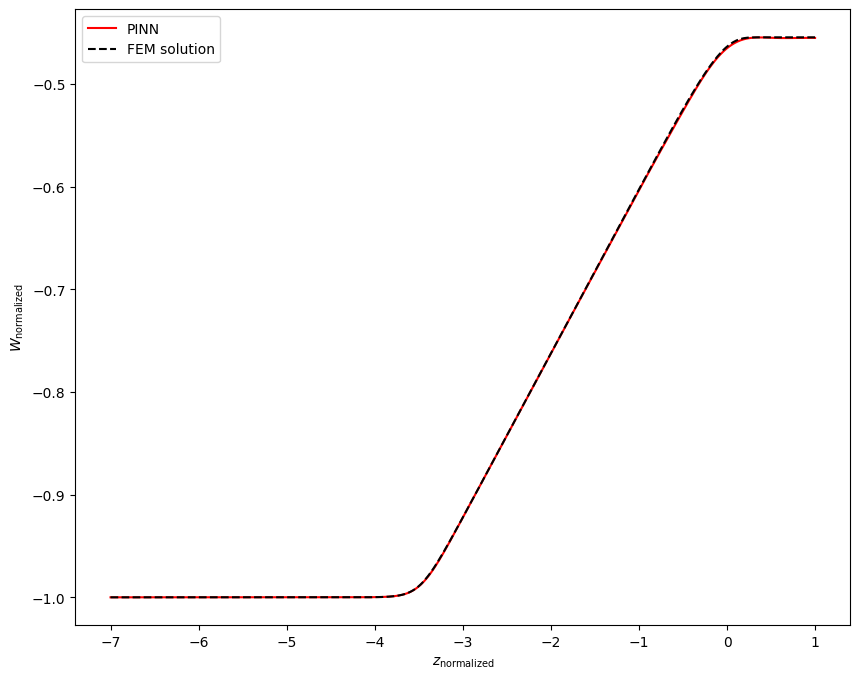


Epoch: 37000/400000
Loss: 0.0592055544257164
C_mean: -11.761848449707031
C_std: 0.029858116060495377
Loss ODE: 0.02360595017671585
Loss z0: 0.0
Loss zf: 0.0003032684326171875
KL divergence: 3.2566921710968018


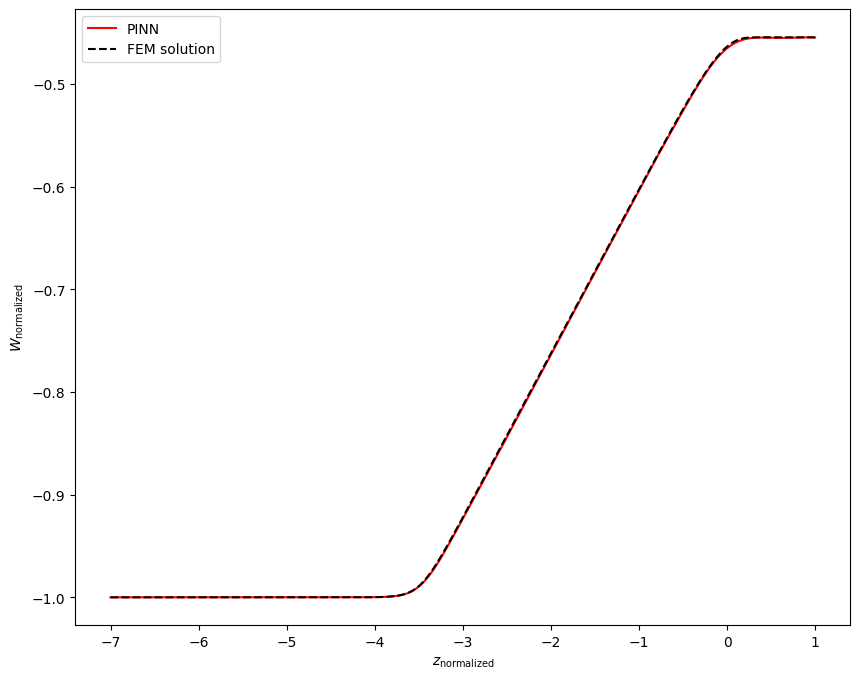


Epoch: 38000/400000
Loss: 0.062123507261276245
C_mean: -11.756600379943848
C_std: 0.029782546684145927
Loss ODE: 0.02937966398894787
Loss z0: 0.0
Loss zf: 1.6123056411743164e-05
KL divergence: 3.258261203765869


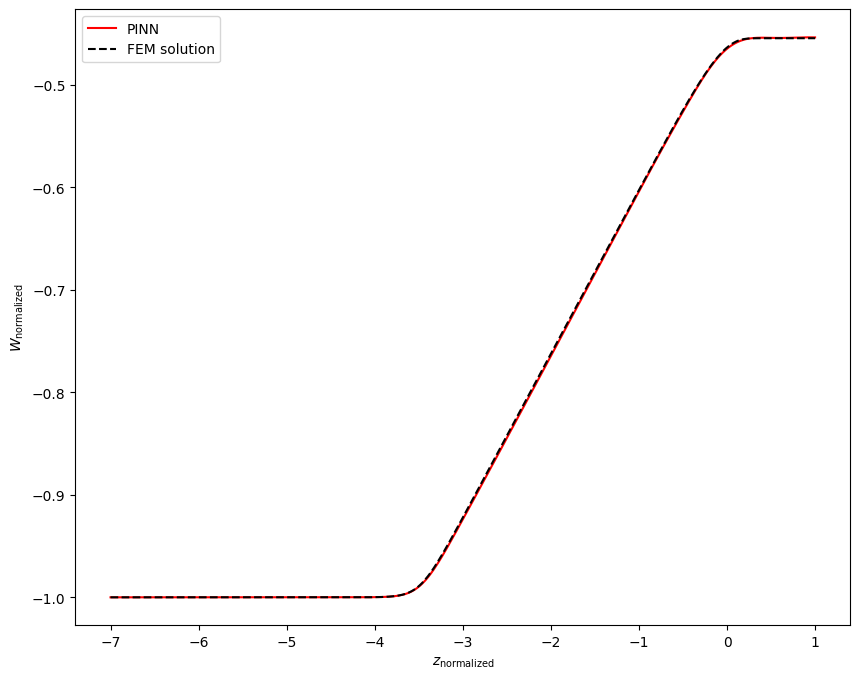


Epoch: 39000/400000
Loss: 0.07291445136070251
C_mean: -11.753824234008789
C_std: 0.030098944902420044
Loss ODE: 0.03885367140173912
Loss z0: 0.0
Loss zf: 0.00015884637832641602
KL divergence: 3.2472317218780518


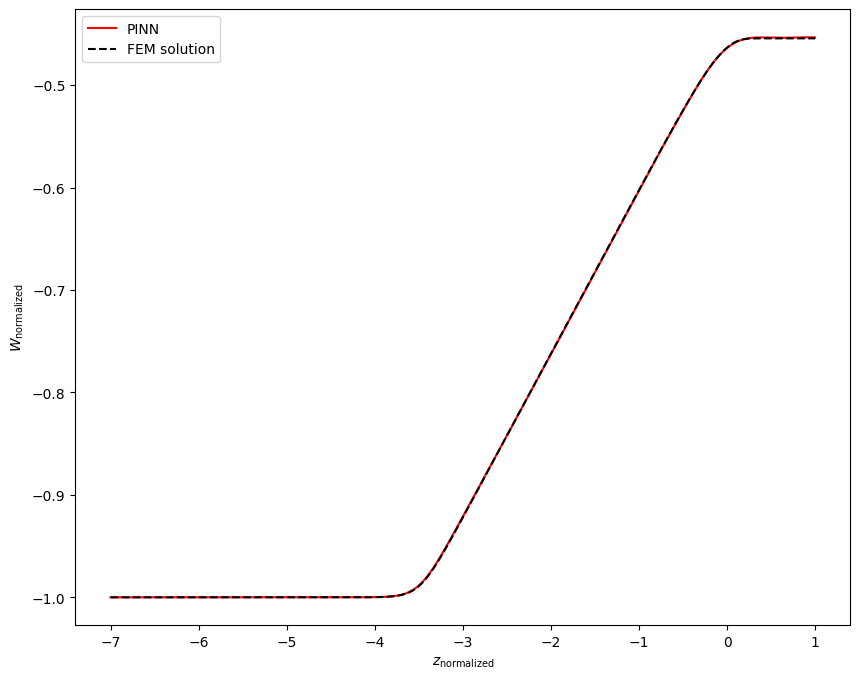


Epoch: 40000/400000
Loss: 0.1135106086730957
C_mean: -11.748473167419434
C_std: 0.029389653354883194
Loss ODE: 0.06694412231445312
Loss z0: 0.0
Loss zf: 0.0013864636421203613
KL divergence: 3.2701852321624756


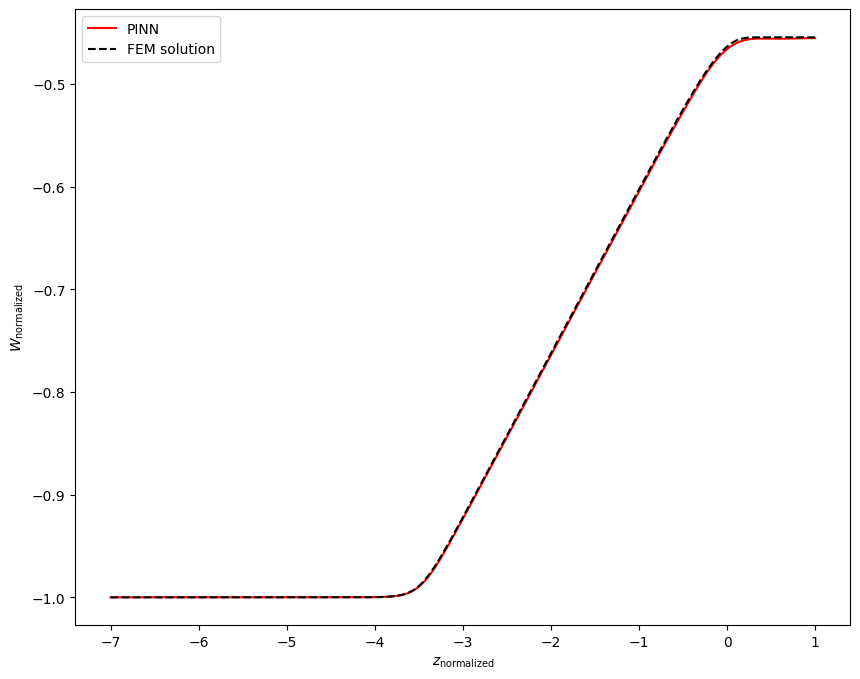


Epoch: 41000/400000
Loss: 0.07760902494192123
C_mean: -11.744743347167969
C_std: 0.029739776626229286
Loss ODE: 0.039793264120817184
Loss z0: 0.0
Loss zf: 0.0005236268043518066
KL divergence: 3.2579493522644043


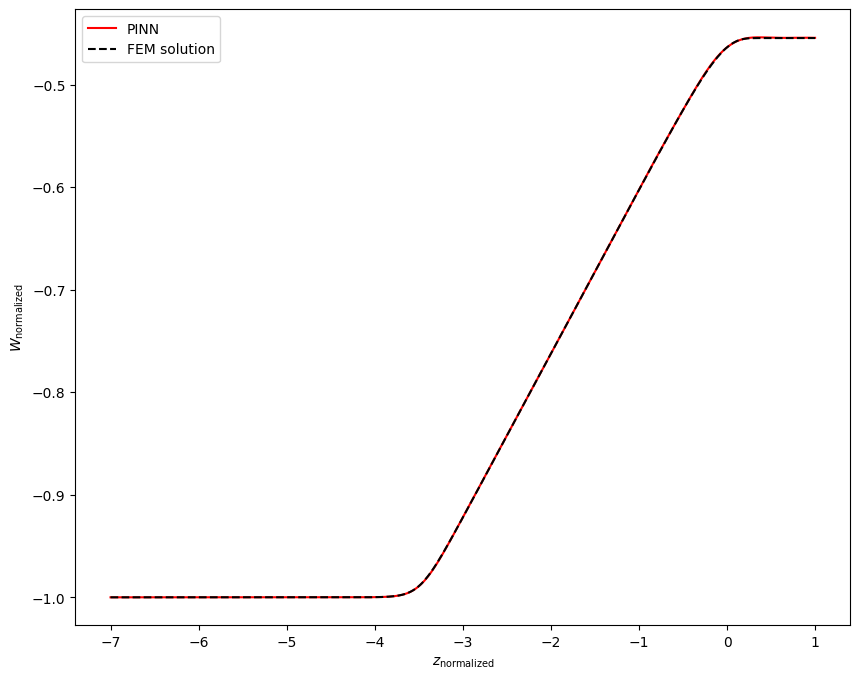


Epoch: 42000/400000
Loss: 0.08596956729888916
C_mean: -11.739922523498535
C_std: 0.030285002663731575
Loss ODE: 0.0489947684109211
Loss z0: 0.0
Loss zf: 0.00045859813690185547
KL divergence: 3.238882303237915


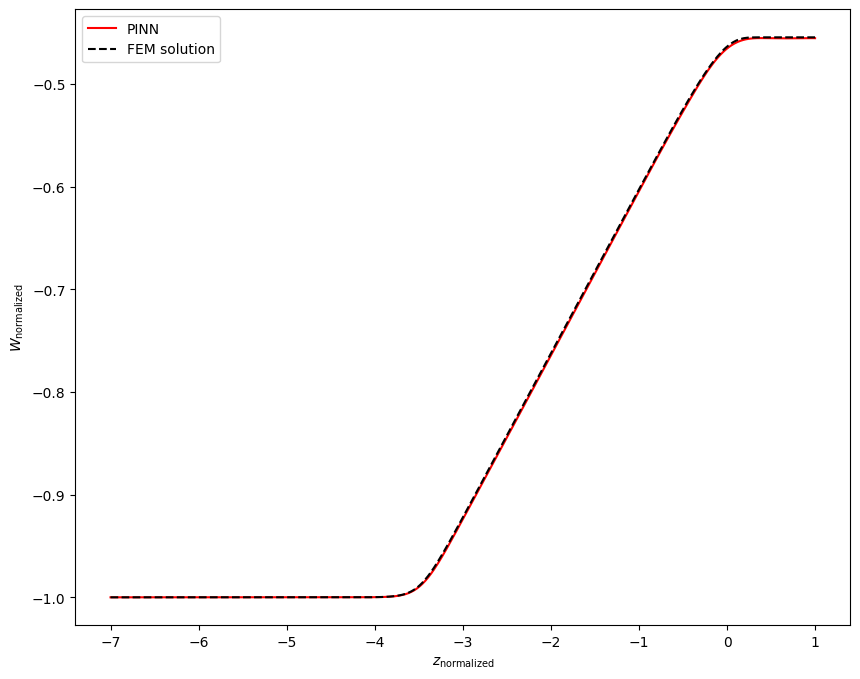


Epoch: 43000/400000
Loss: 0.06465418636798859
C_mean: -11.73779296875
C_std: 0.030221838504076004
Loss ODE: 0.026065247133374214
Loss z0: 0.0
Loss zf: 0.0006181001663208008
KL divergence: 3.2407937049865723


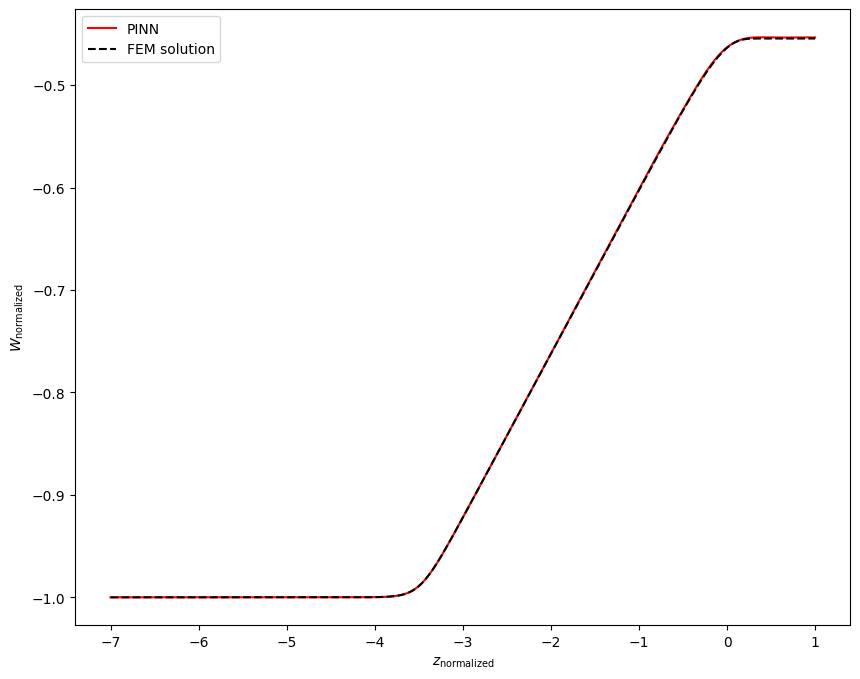


Epoch: 44000/400000
Loss: 0.0700141042470932
C_mean: -11.73375415802002
C_std: 0.030088460072875023
Loss ODE: 0.03332454338669777
Loss z0: 0.0
Loss zf: 0.00042447447776794434
KL divergence: 3.244481325149536


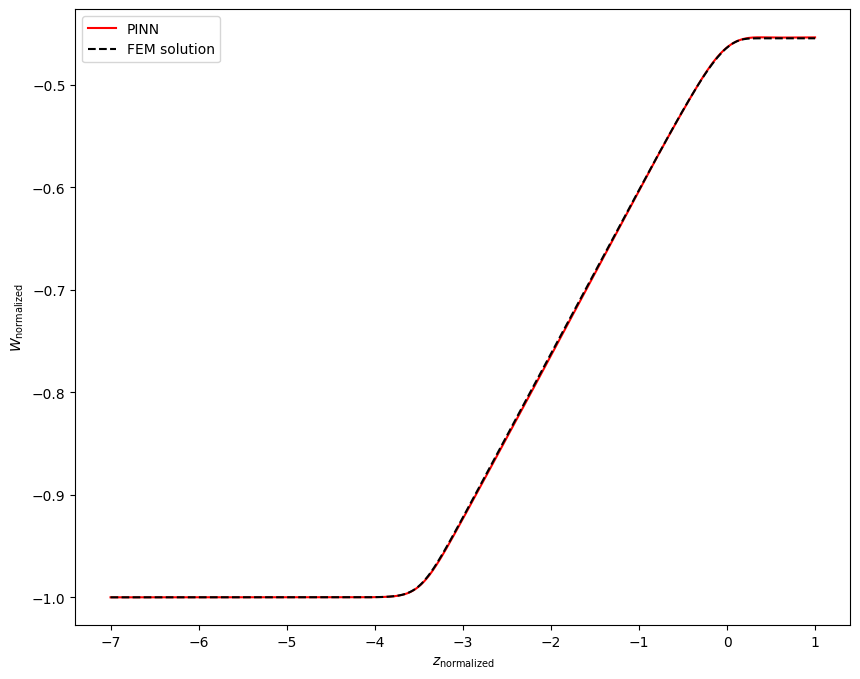


Epoch: 45000/400000
Loss: 0.07055608928203583
C_mean: -11.729793548583984
C_std: 0.030528834089636803
Loss ODE: 0.02959480509161949
Loss z0: 0.0
Loss zf: 0.0008666515350341797
KL divergence: 3.2294774055480957


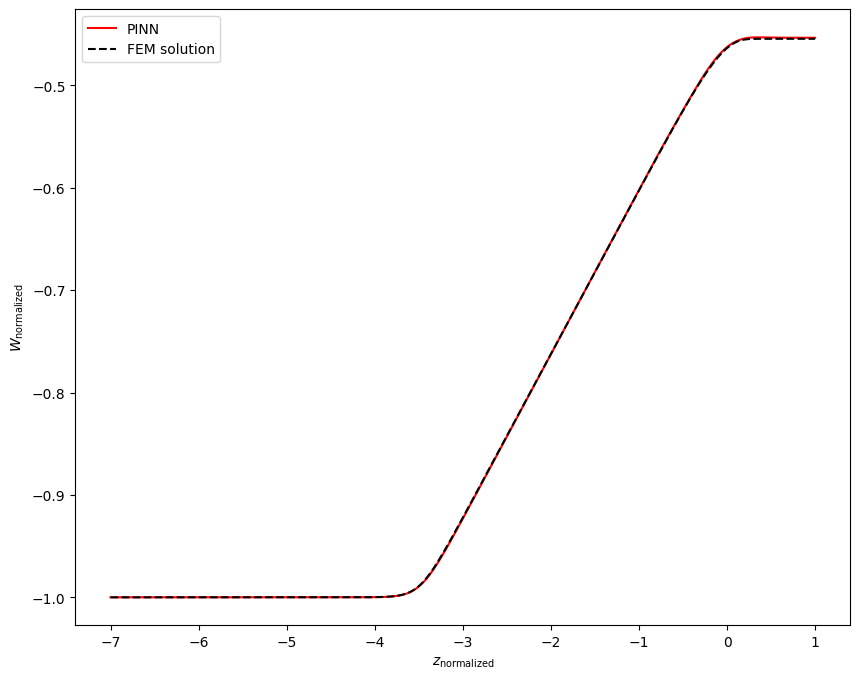


Epoch: 46000/400000
Loss: 0.05498477816581726
C_mean: -11.72683048248291
C_std: 0.02972959168255329
Loss ODE: 0.020287344232201576
Loss z0: 0.0
Loss zf: 0.0002143383026123047
KL divergence: 3.2554051876068115


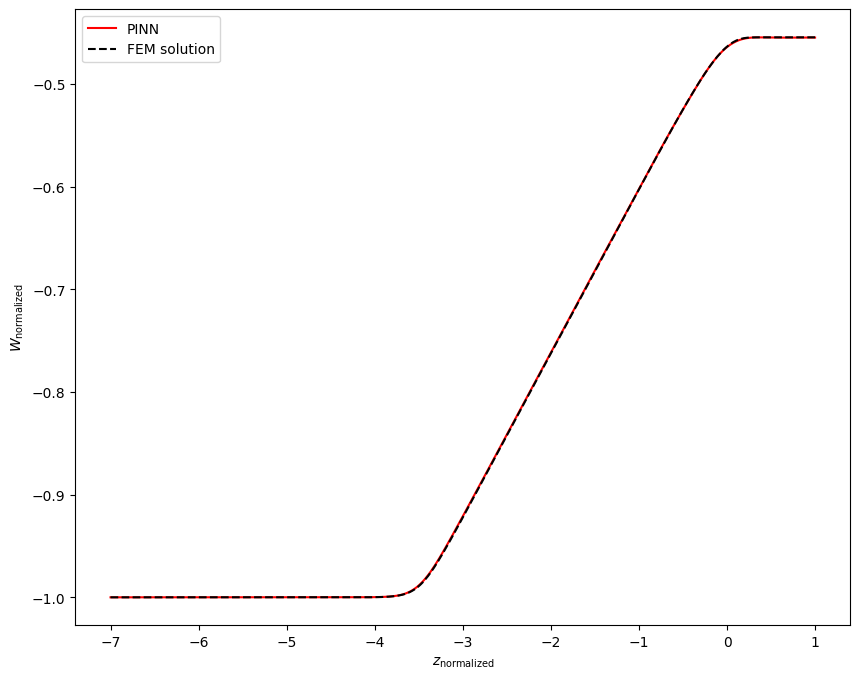


Epoch: 47000/400000
Loss: 0.09751211851835251
C_mean: -11.721700668334961
C_std: 0.02967216446995735
Loss ODE: 0.05765371397137642
Loss z0: 0.0
Loss zf: 0.0007290542125701904
KL divergence: 3.256786584854126


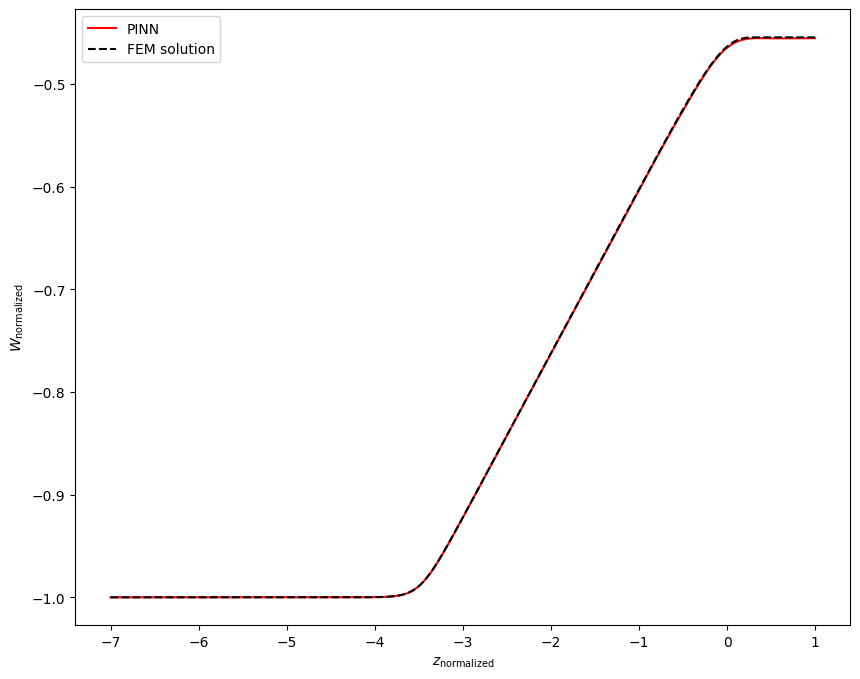


Epoch: 48000/400000
Loss: 0.12810640037059784
C_mean: -11.720486640930176
C_std: 0.02870701067149639
Loss ODE: 0.08969325572252274
Loss z0: 0.0
Loss zf: 0.0005516707897186279
KL divergence: 3.2896440029144287


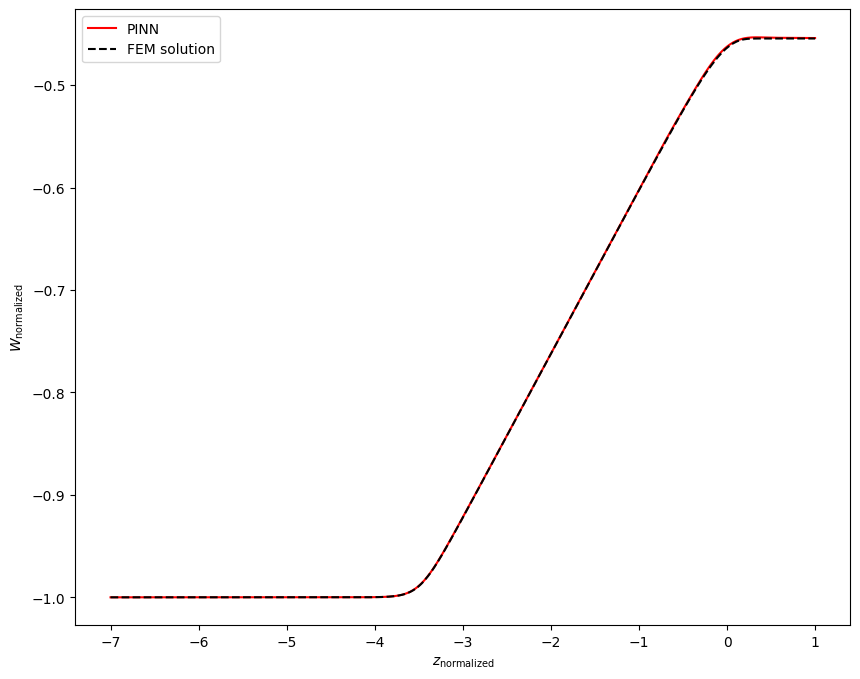


Epoch: 49000/400000
Loss: 0.055085789412260056
C_mean: -11.716192245483398
C_std: 0.028904374688863754
Loss ODE: 0.02048032358288765
Loss z0: 0.0
Loss zf: 0.00017839670181274414
KL divergence: 3.2821497917175293


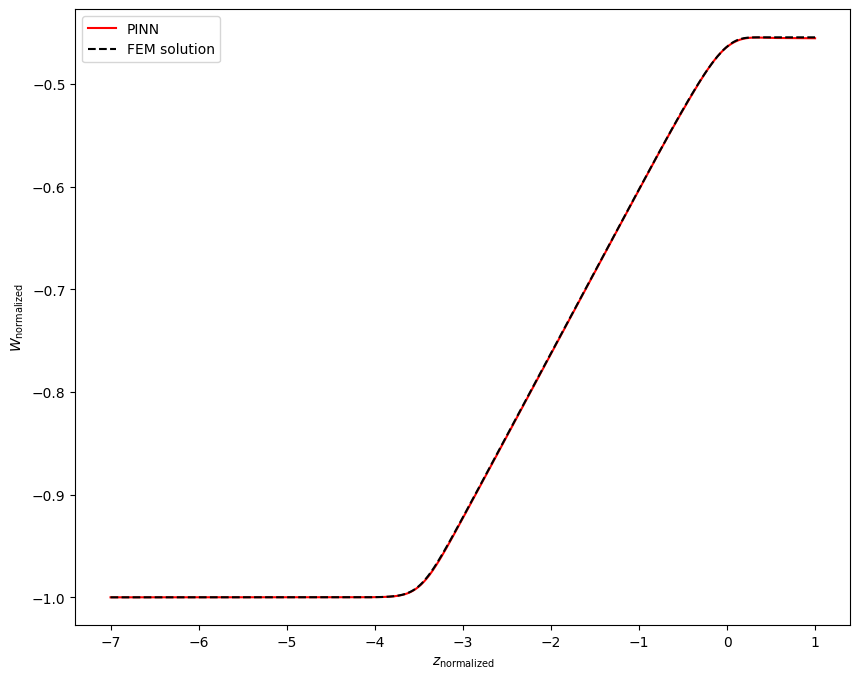


Epoch: 50000/400000
Loss: 0.0965479388833046
C_mean: -11.714825630187988
C_std: 0.029632436111569405
Loss ODE: 0.057885244488716125
Loss z0: 0.0
Loss zf: 0.0006091296672821045
KL divergence: 3.2571399211883545


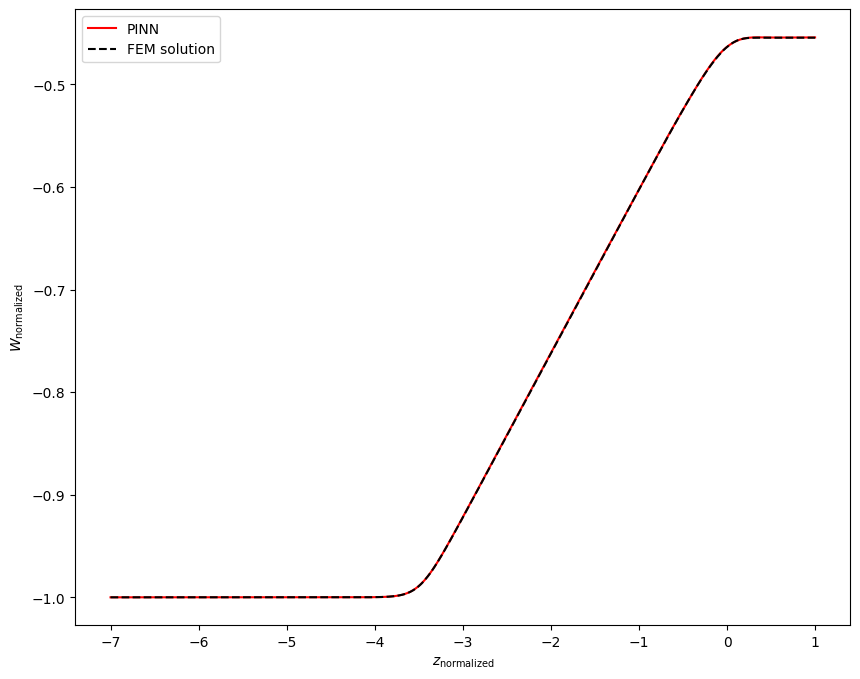


Epoch: 51000/400000
Loss: 0.10232339799404144
C_mean: -11.712503433227539
C_std: 0.028980331495404243
Loss ODE: 0.06578731536865234
Loss z0: 0.0
Loss zf: 0.00037467479705810547
KL divergence: 3.278933525085449


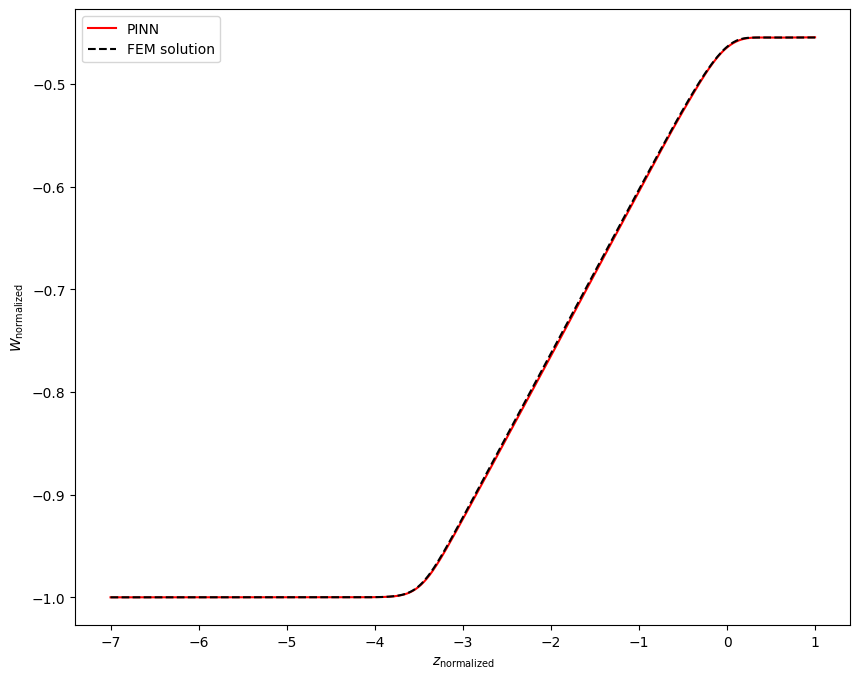


Epoch: 52000/400000
Loss: 0.07078210264444351
C_mean: -11.710319519042969
C_std: 0.029829170554876328
Loss ODE: 0.034626662731170654
Loss z0: 0.0
Loss zf: 0.0003656446933746338
KL divergence: 3.249899387359619


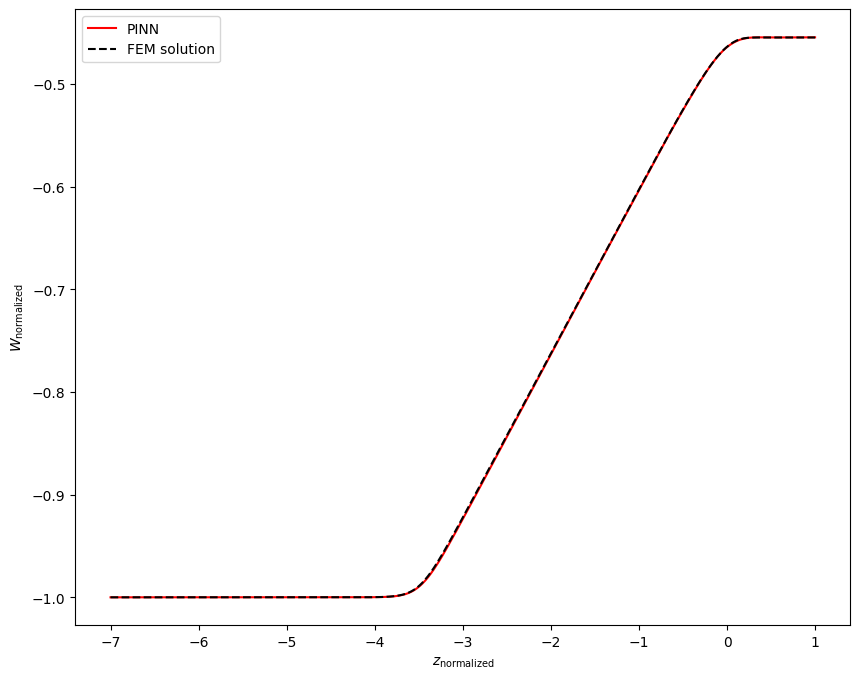


Epoch: 53000/400000
Loss: 0.050246648490428925
C_mean: -11.710955619812012
C_std: 0.02952389419078827
Loss ODE: 0.016832802444696426
Loss z0: 0.0
Loss zf: 8.115172386169434e-05
KL divergence: 3.260232925415039


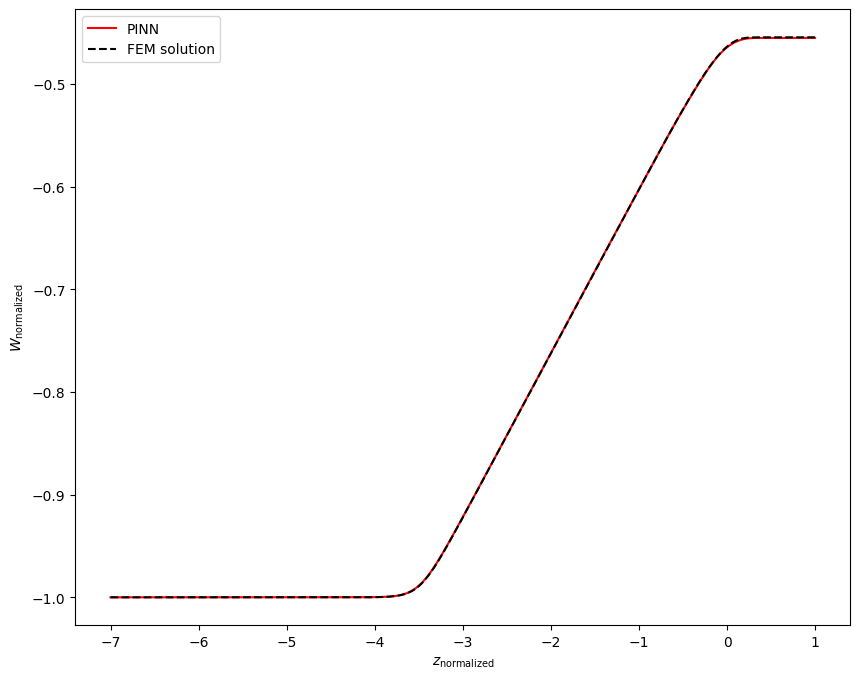


Epoch: 54000/400000
Loss: 0.07667458057403564
C_mean: -11.709759712219238
C_std: 0.028680887073278427
Loss ODE: 0.043683554977178574
Loss z0: 0.0
Loss zf: 1.004338264465332e-05
KL divergence: 3.289059638977051


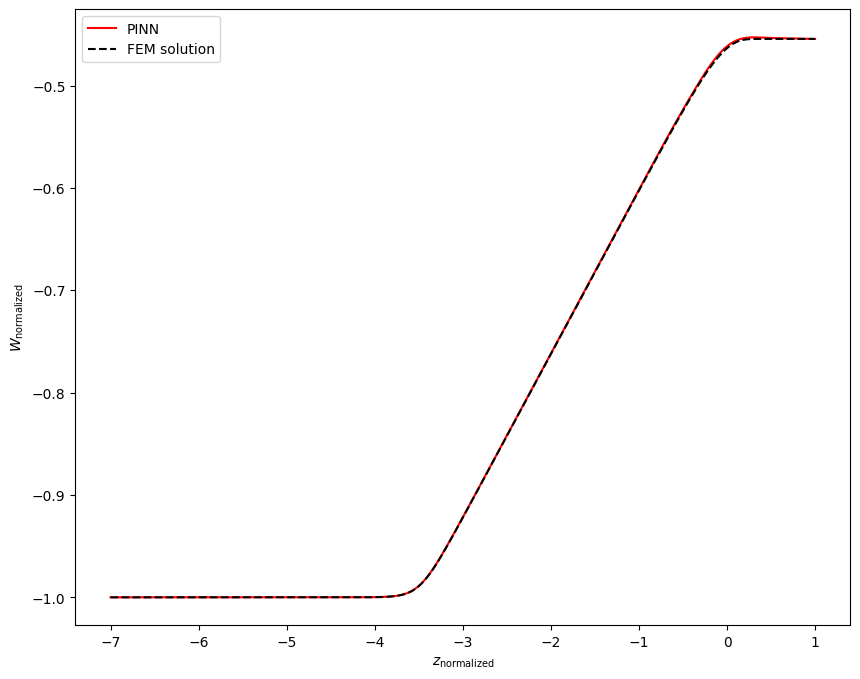


Epoch: 55000/400000
Loss: 0.08104167878627777
C_mean: -11.707523345947266
C_std: 0.028380442410707474
Loss ODE: 0.04353652521967888
Loss z0: 0.0
Loss zf: 0.0004512965679168701
KL divergence: 3.2992188930511475


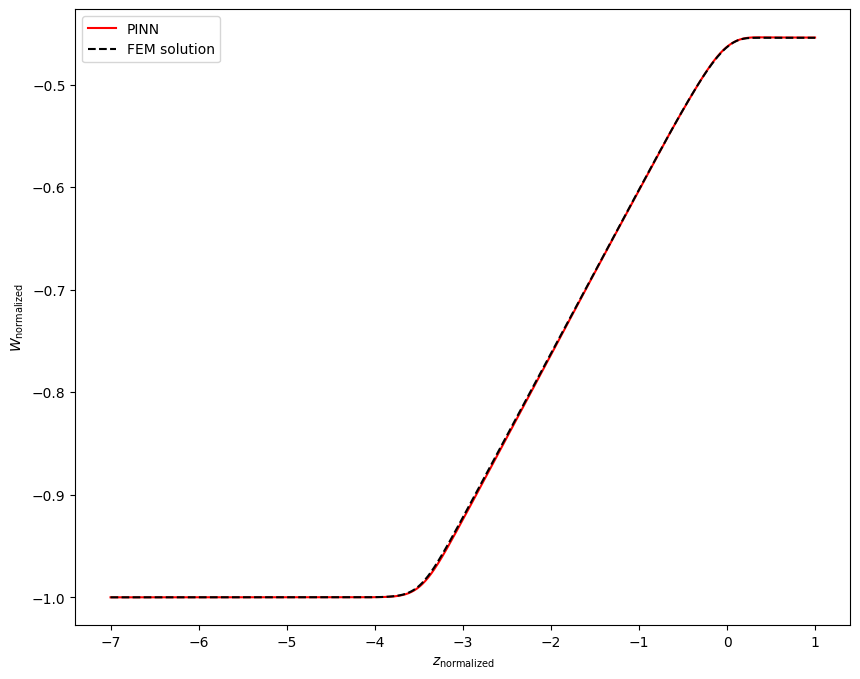


Epoch: 56000/400000
Loss: 0.08684125542640686
C_mean: -11.706897735595703
C_std: 0.02831631526350975
Loss ODE: 0.0400383360683918
Loss z0: 0.0
Loss zf: 0.0013788342475891113
KL divergence: 3.301457405090332


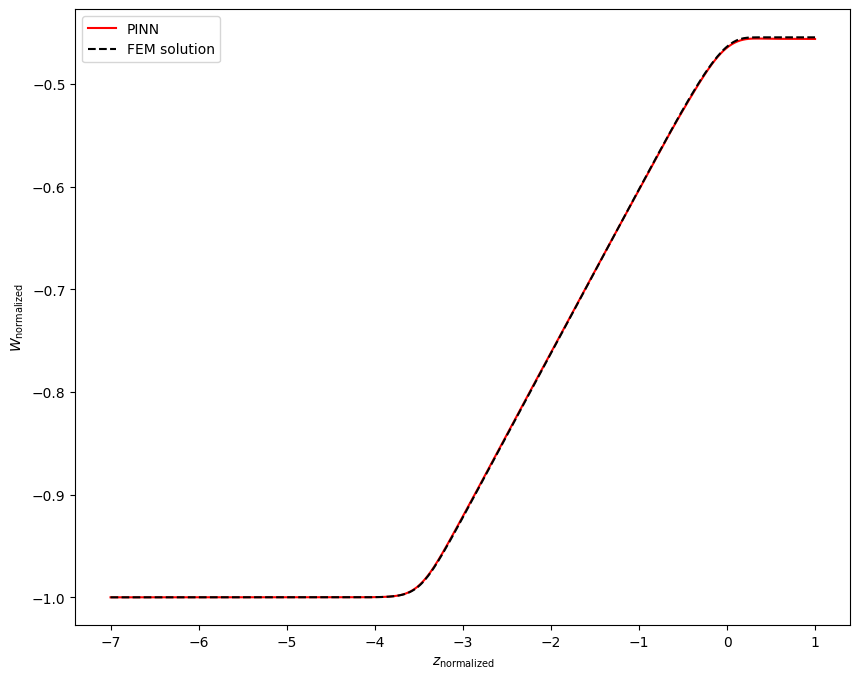


Epoch: 57000/400000
Loss: 0.0918852835893631
C_mean: -11.705347061157227
C_std: 0.028331289067864418
Loss ODE: 0.04796656221151352
Loss z0: 0.0
Loss zf: 0.0010911226272583008
KL divergence: 3.3007500171661377


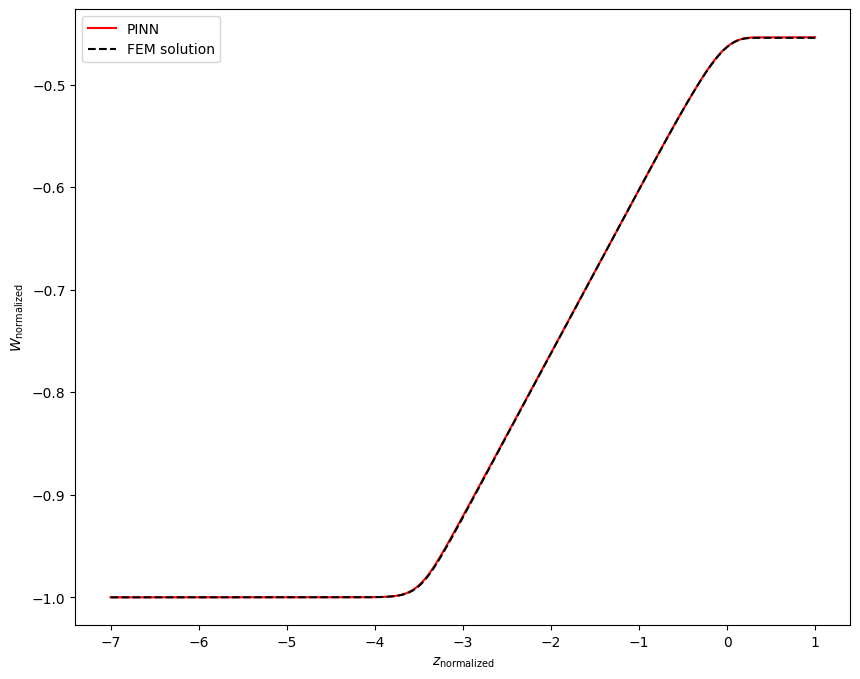


Epoch: 58000/400000
Loss: 0.07995371520519257
C_mean: -11.705113410949707
C_std: 0.027967680245637894
Loss ODE: 0.04325706139206886
Loss z0: 0.0
Loss zf: 0.0003560483455657959
KL divergence: 3.31361722946167


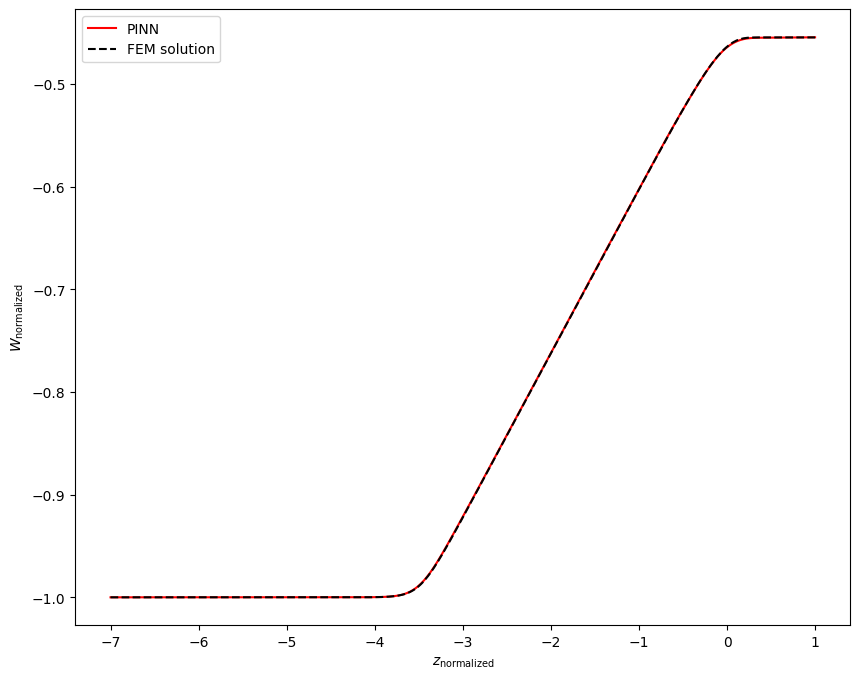


Epoch: 59000/400000
Loss: 0.09389498084783554
C_mean: -11.703123092651367
C_std: 0.027976209297776222
Loss ODE: 0.05490272119641304
Loss z0: 0.0
Loss zf: 0.0005861520767211914
KL divergence: 3.3130741119384766


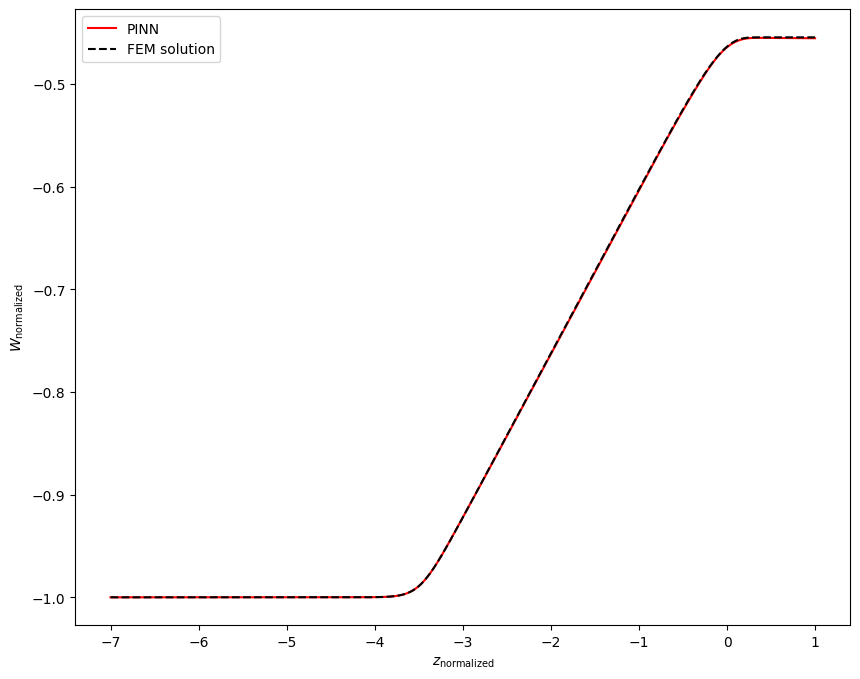


Epoch: 60000/400000
Loss: 0.10903917998075485
C_mean: -11.704968452453613
C_std: 0.028190677985548973
Loss ODE: 0.07384935766458511
Loss z0: 0.0
Loss zf: 0.00021332502365112305
KL divergence: 3.305657148361206


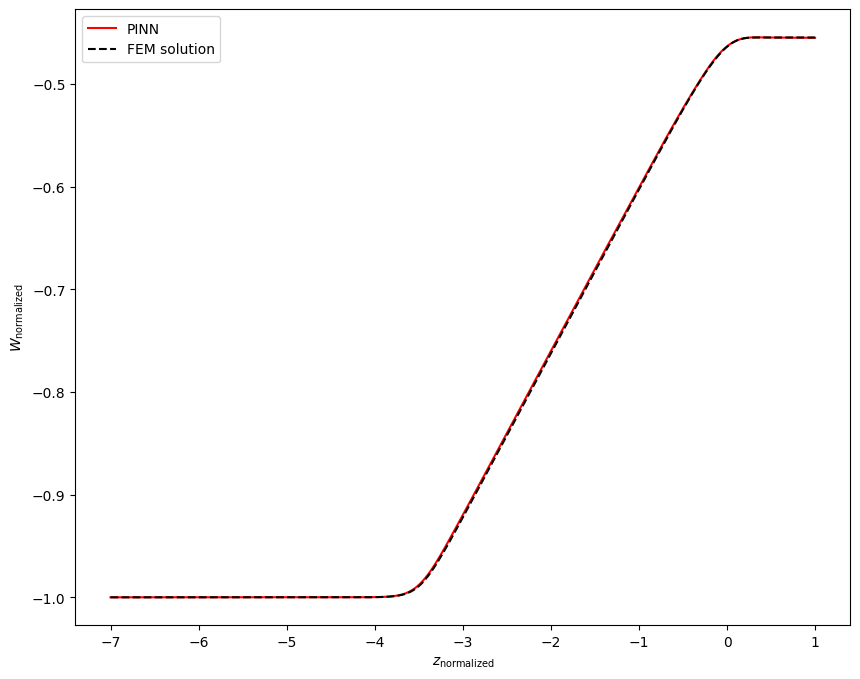


Epoch: 61000/400000
Loss: 0.08577780425548553
C_mean: -11.703091621398926
C_std: 0.028735436499118805
Loss ODE: 0.03868589922785759
Loss z0: 0.0
Loss zf: 0.0014229118824005127
KL divergence: 3.2862789630889893


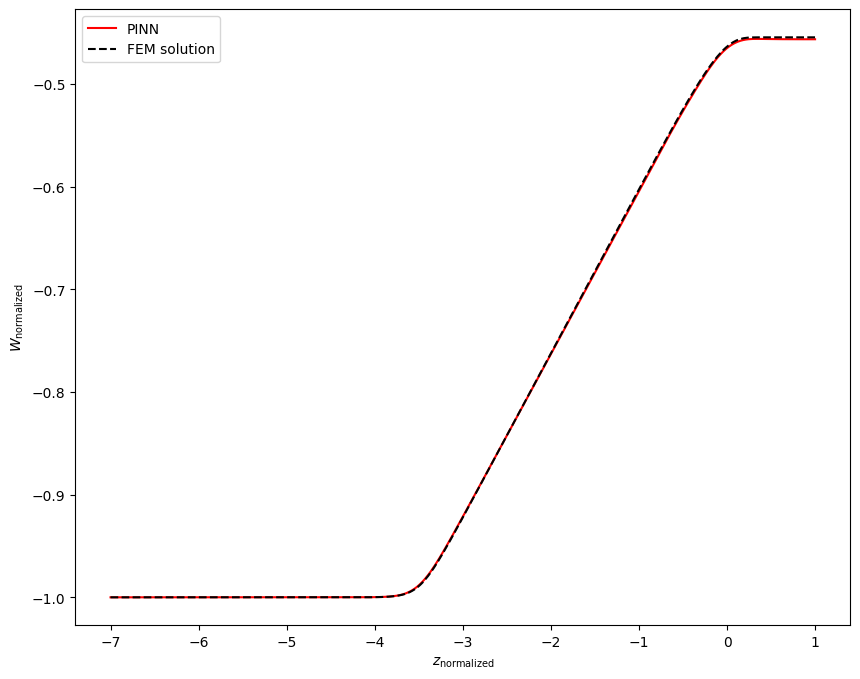


Epoch: 62000/400000
Loss: 0.11409854888916016
C_mean: -11.704076766967773
C_std: 0.028253093361854553
Loss ODE: 0.07059656828641891
Loss z0: 0.0
Loss zf: 0.0010468661785125732
KL divergence: 3.3033320903778076


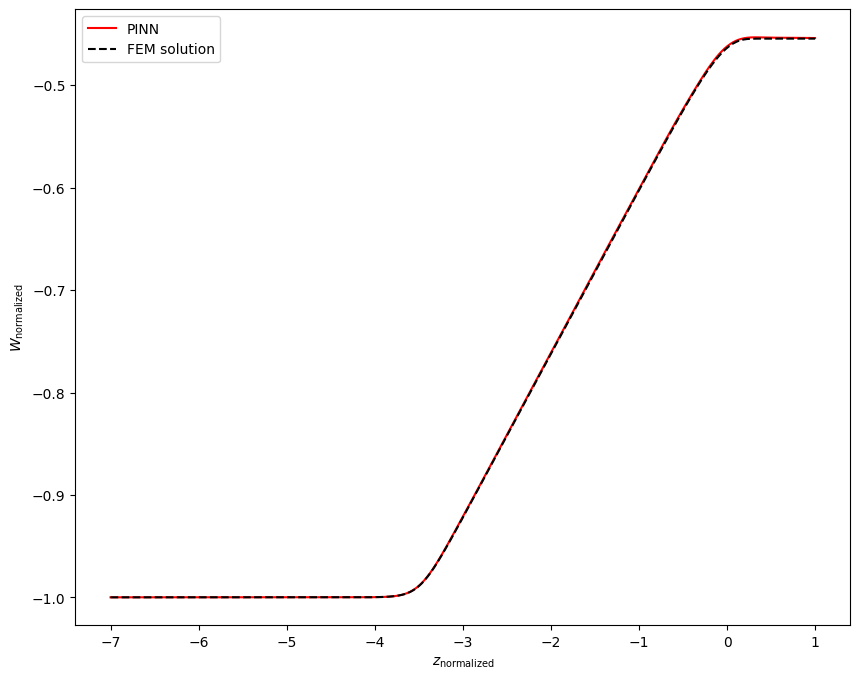


Epoch: 63000/400000
Loss: 0.059176020324230194
C_mean: -11.703213691711426
C_std: 0.027481136843562126
Loss ODE: 0.02199048362672329
Loss z0: 0.0
Loss zf: 0.0003876686096191406
KL divergence: 3.330885410308838


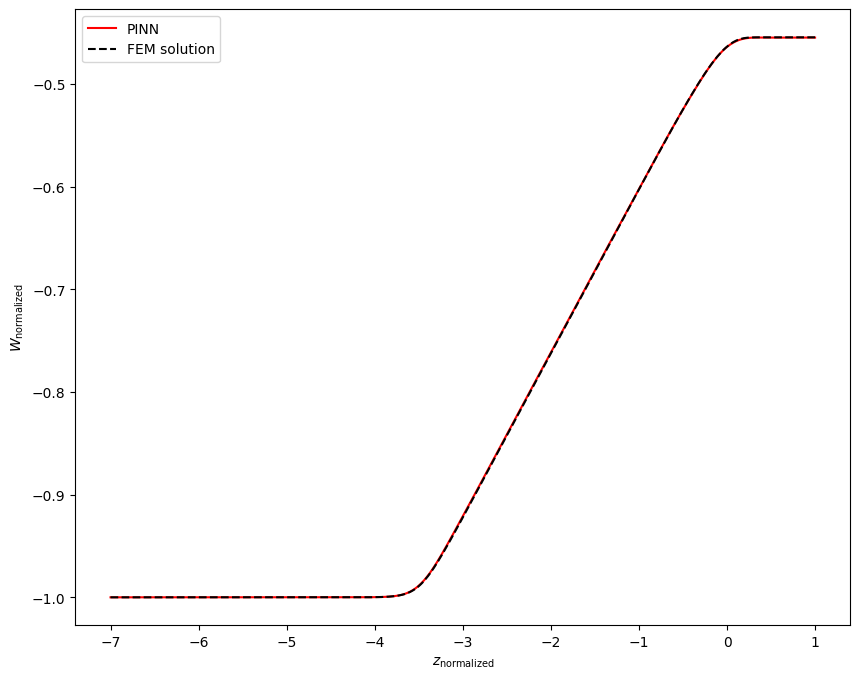


Epoch: 64000/400000
Loss: 0.06623375415802002
C_mean: -11.701908111572266
C_std: 0.026823416352272034
Loss ODE: 0.03228231519460678
Loss z0: 0.0
Loss zf: 4.029273986816406e-05
KL divergence: 3.354851007461548


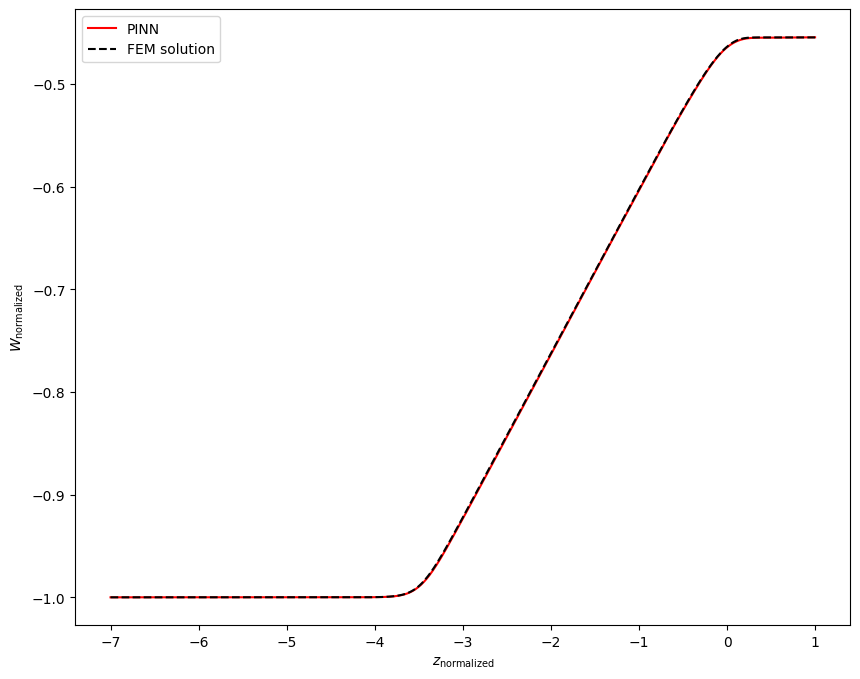


Epoch: 65000/400000
Loss: 0.08546663820743561
C_mean: -11.70182991027832
C_std: 0.0273423008620739
Loss ODE: 0.05096779391169548
Loss z0: 0.0
Loss zf: 0.00011420249938964844
KL divergence: 3.3356823921203613


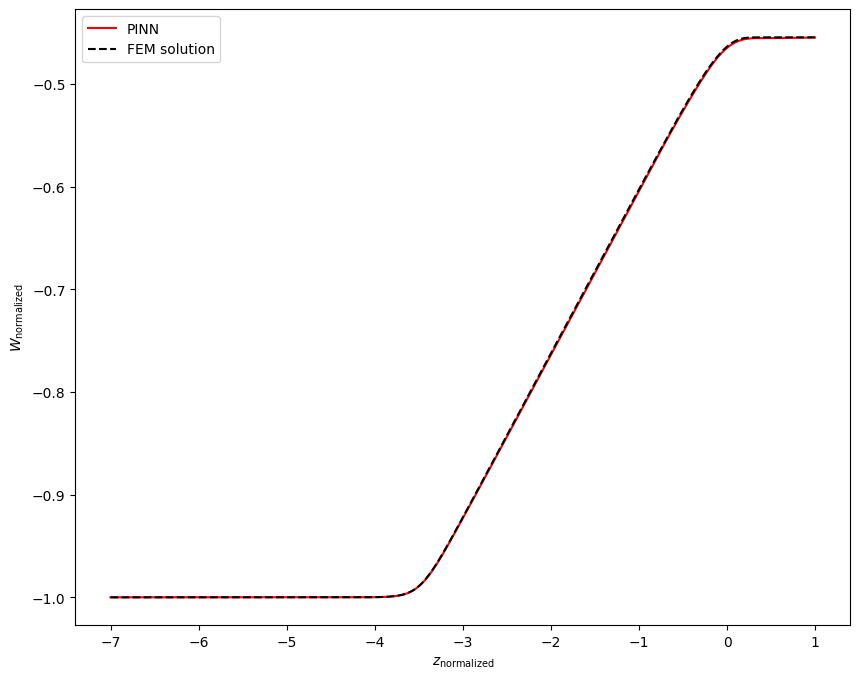


Epoch: 66000/400000
Loss: 0.04781040921807289
C_mean: -11.70091724395752
C_std: 0.027764787897467613
Loss ODE: 0.009795240126550198
Loss z0: 0.0
Loss zf: 0.0004811882972717285
KL divergence: 3.320328712463379


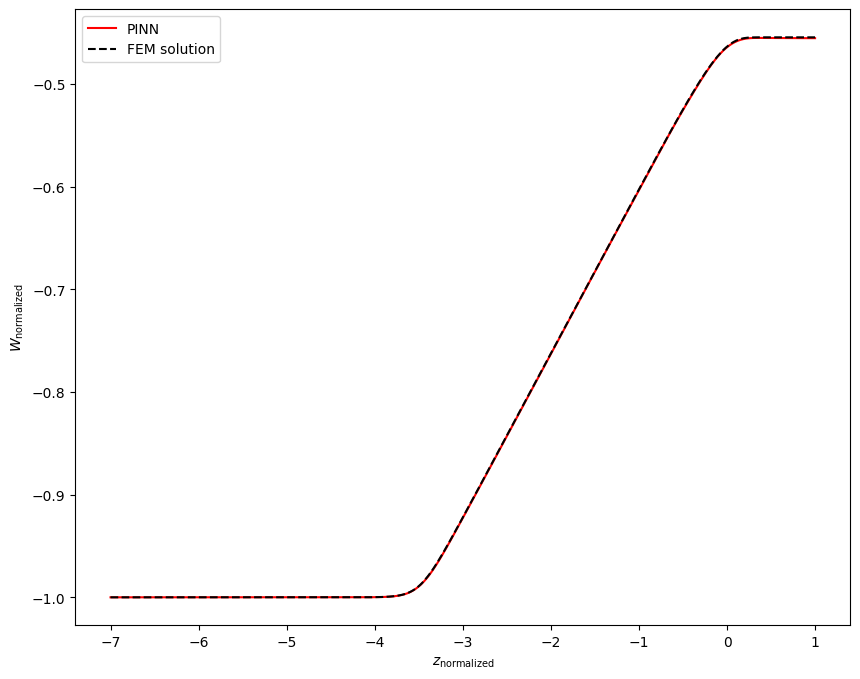


Epoch: 67000/400000
Loss: 0.08447511494159698
C_mean: -11.701889038085938
C_std: 0.02823127806186676
Loss ODE: 0.04946184530854225
Loss z0: 0.0
Loss zf: 0.00019761919975280762
KL divergence: 3.303708076477051


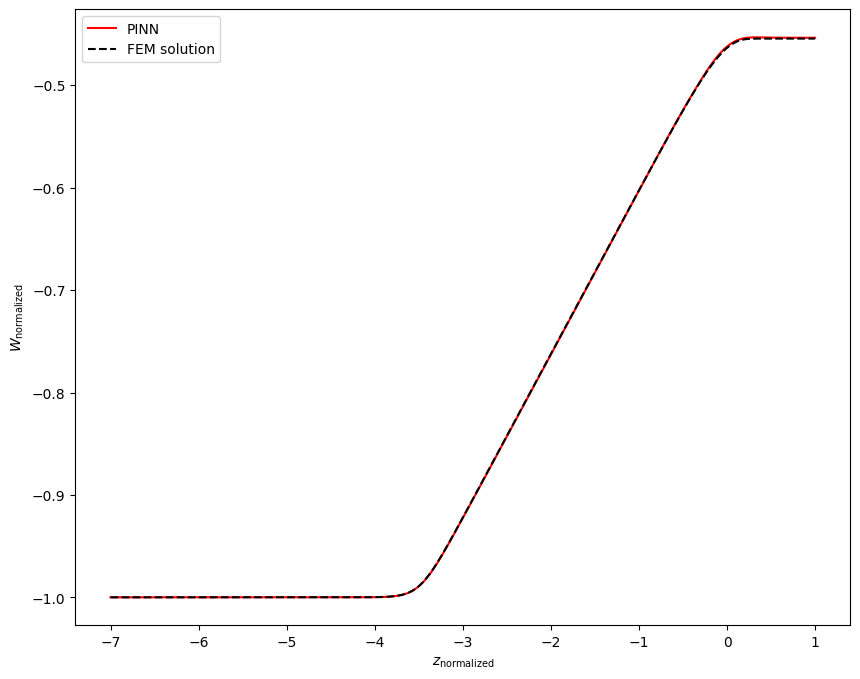


Epoch: 68000/400000
Loss: 0.07611557841300964
C_mean: -11.701967239379883
C_std: 0.028121624141931534
Loss ODE: 0.03965947777032852
Loss z0: 0.0
Loss zf: 0.00033789873123168945
KL divergence: 3.307711362838745


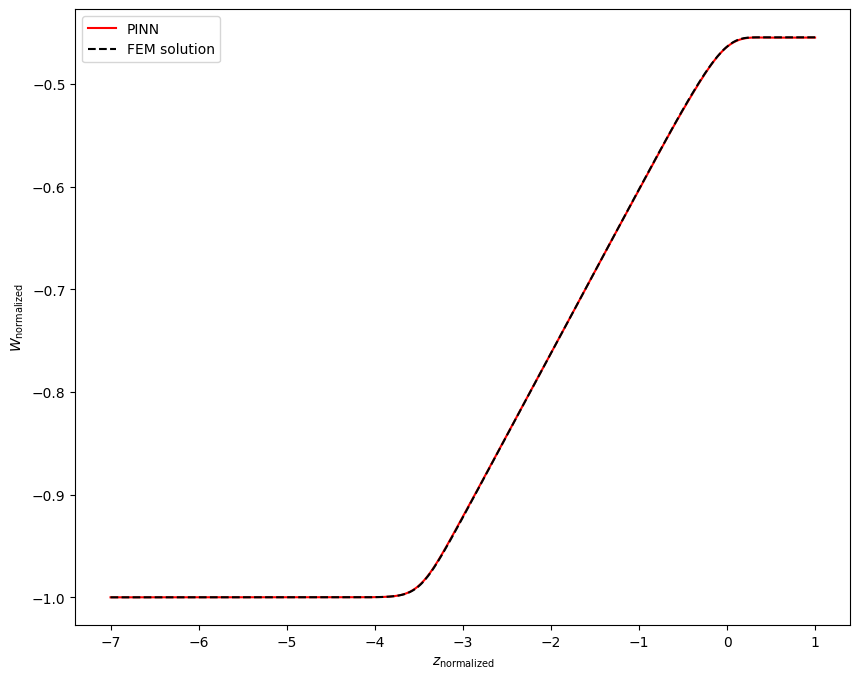


Epoch: 69000/400000
Loss: 0.04695414751768112
C_mean: -11.702744483947754
C_std: 0.028763655573129654
Loss ODE: 0.013803740963339806
Loss z0: 0.0
Loss zf: 2.98917293548584e-05
KL divergence: 3.285149097442627


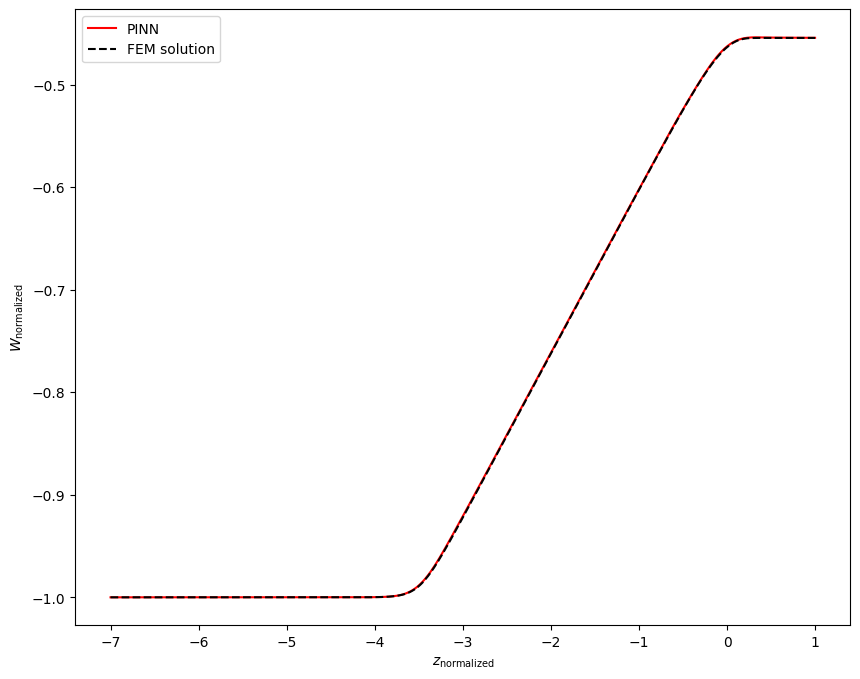


Epoch: 70000/400000
Loss: 0.10813529789447784
C_mean: -11.700997352600098
C_std: 0.027985163033008575
Loss ODE: 0.06849613785743713
Loss z0: 0.0
Loss zf: 0.0006514489650726318
KL divergence: 3.312467336654663


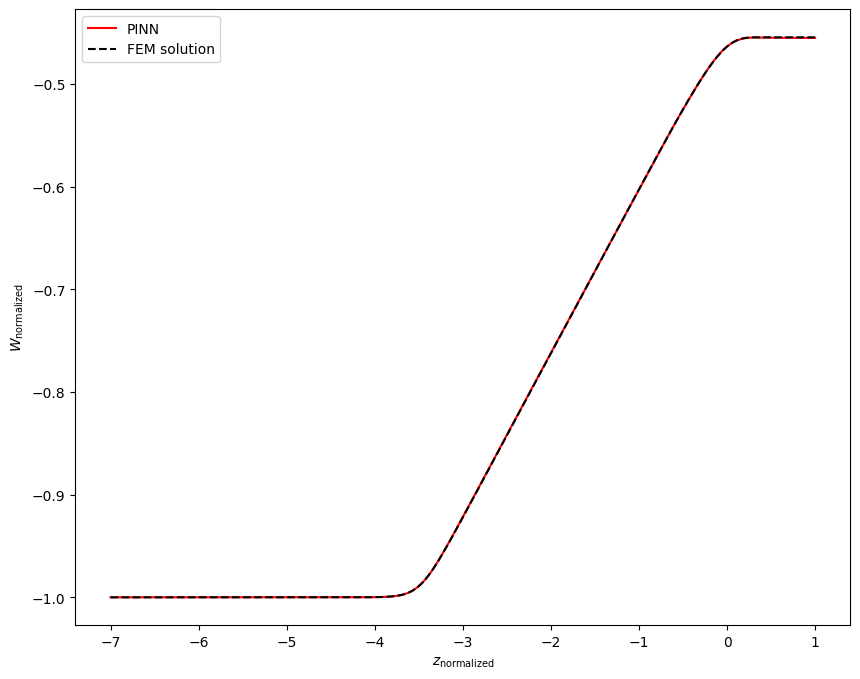


Epoch: 71000/400000
Loss: 0.13525758683681488
C_mean: -11.701730728149414
C_std: 0.02774623967707157
Loss ODE: 0.09794436395168304
Loss z0: 0.0
Loss zf: 0.00041031837463378906
KL divergence: 3.3210034370422363


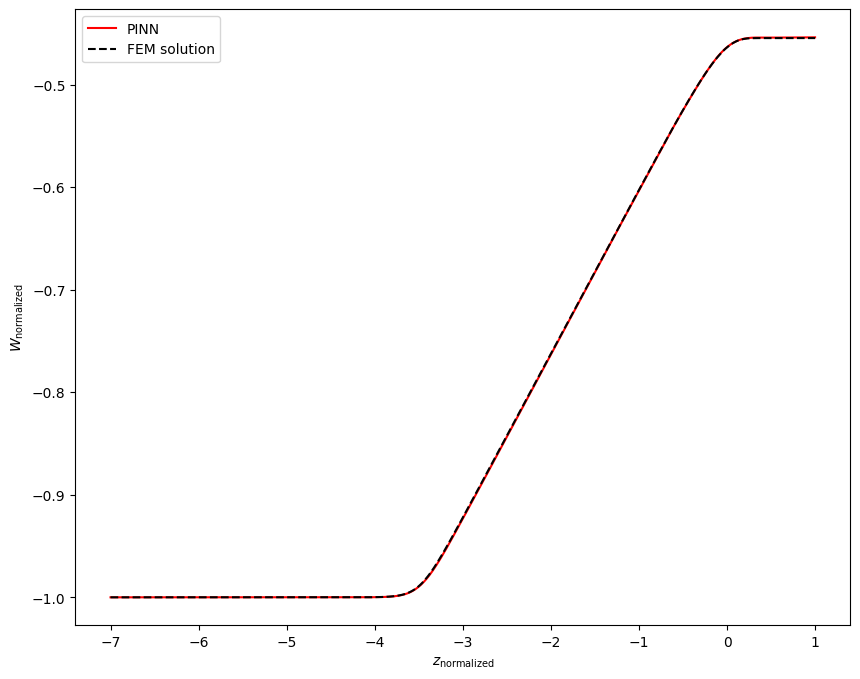


Epoch: 72000/400000
Loss: 0.05466548353433609
C_mean: -11.702028274536133
C_std: 0.027373287826776505
Loss ODE: 0.01740051992237568
Loss z0: 0.0
Loss zf: 0.00039184093475341797
KL divergence: 3.33465576171875


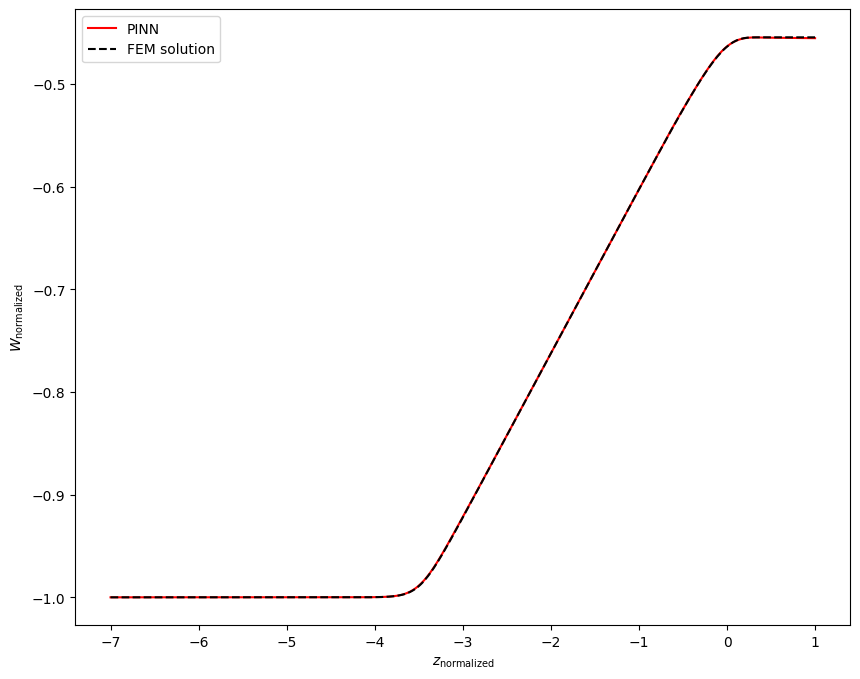


Epoch: 73000/400000
Loss: 0.06224268674850464
C_mean: -11.700932502746582
C_std: 0.027547258883714676
Loss ODE: 0.02624085731804371
Loss z0: 0.0
Loss zf: 0.0002719759941101074
KL divergence: 3.328207015991211


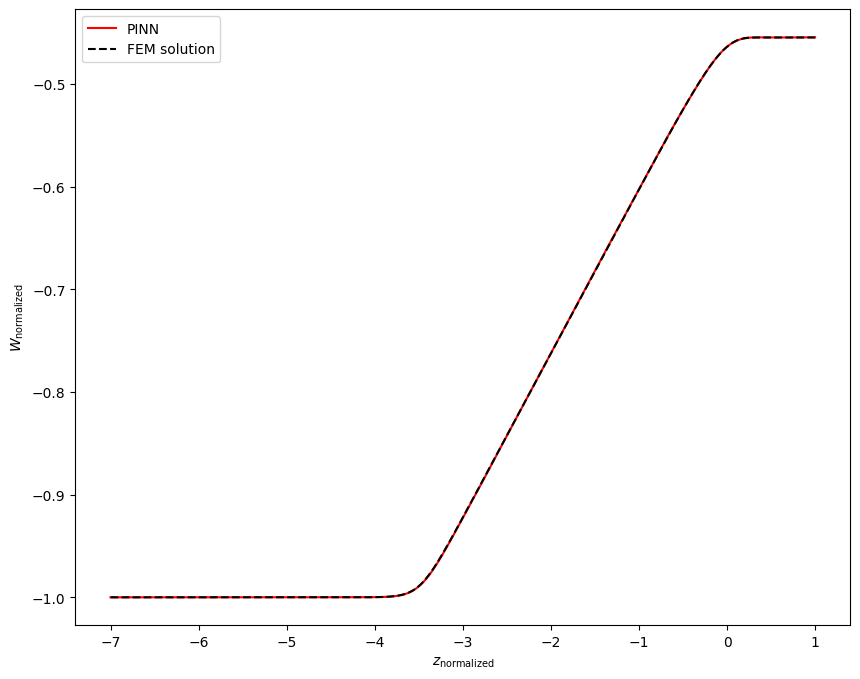


Epoch: 74000/400000
Loss: 0.1155327707529068
C_mean: -11.7014799118042
C_std: 0.028070544824004173
Loss ODE: 0.07323881983757019
Loss z0: 0.0
Loss zf: 0.000920027494430542
KL divergence: 3.3093678951263428


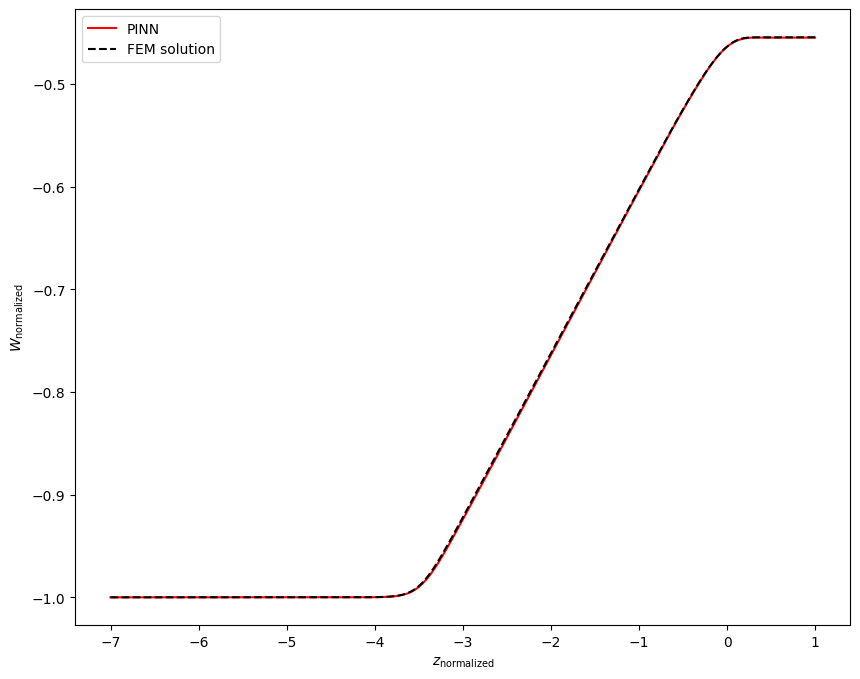


Epoch: 75000/400000
Loss: 0.058471716940402985
C_mean: -11.701842308044434
C_std: 0.02782517671585083
Loss ODE: 0.019141487777233124
Loss z0: 0.0
Loss zf: 0.0006147921085357666
KL divergence: 3.3182308673858643


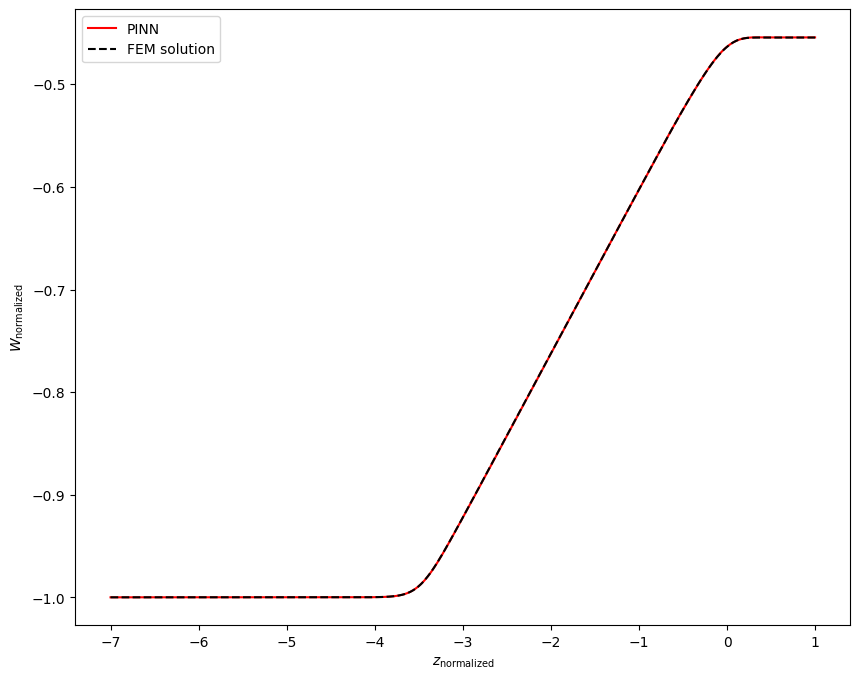


Epoch: 76000/400000
Loss: 0.09364921599626541
C_mean: -11.70181941986084
C_std: 0.027845140546560287
Loss ODE: 0.0559970885515213
Loss z0: 0.0
Loss zf: 0.0004476308822631836
KL divergence: 3.31758189201355


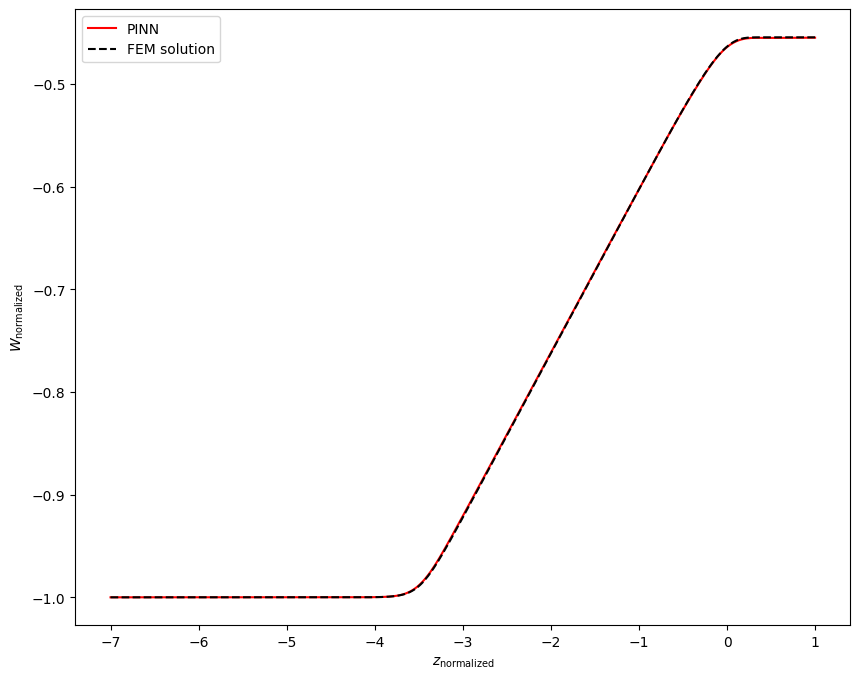


Epoch: 77000/400000
Loss: 0.07346212863922119
C_mean: -11.700828552246094
C_std: 0.027667483314871788
Loss ODE: 0.035117585211992264
Loss z0: 0.0
Loss zf: 0.0005106031894683838
KL divergence: 3.3238508701324463


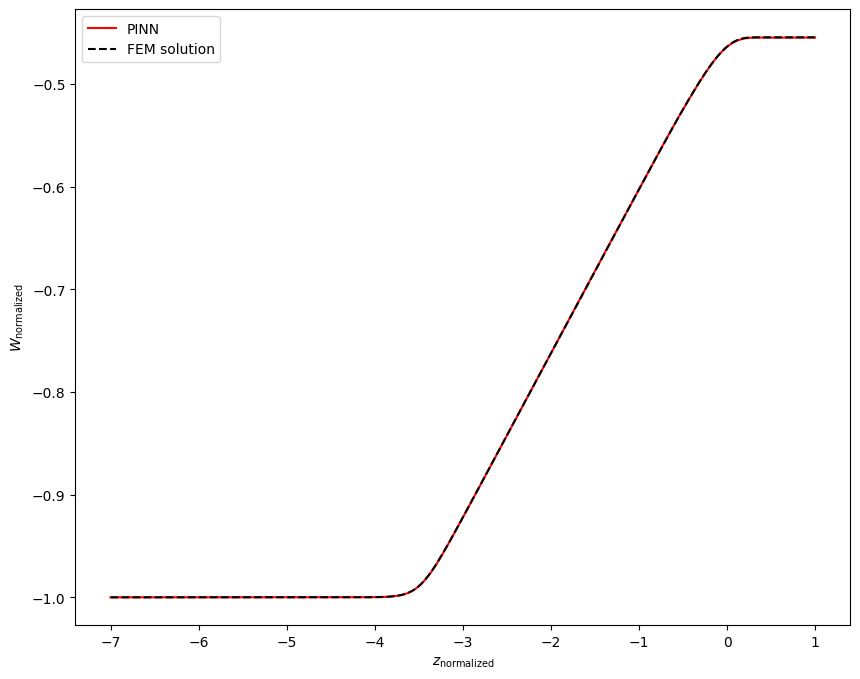


Epoch: 78000/400000
Loss: 0.07060667872428894
C_mean: -11.700758934020996
C_std: 0.027049586176872253
Loss ODE: 0.0326860286295414
Loss z0: 0.0
Loss zf: 0.0004457533359527588
KL divergence: 3.3463118076324463


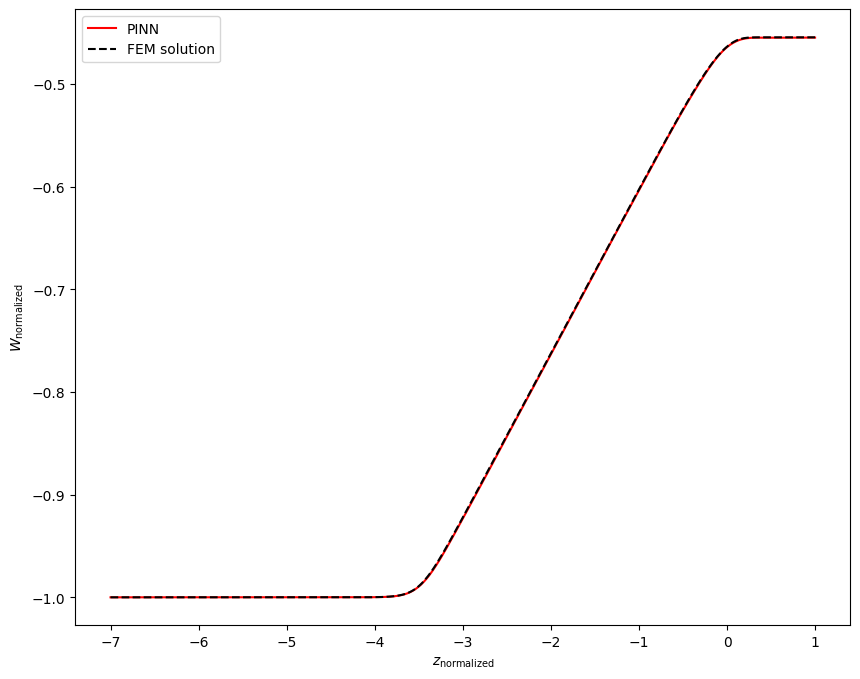


Epoch: 79000/400000
Loss: 0.06801408529281616
C_mean: -11.700345993041992
C_std: 0.027469687163829803
Loss ODE: 0.028379570692777634
Loss z0: 0.0
Loss zf: 0.0006324946880340576
KL divergence: 3.3309571743011475


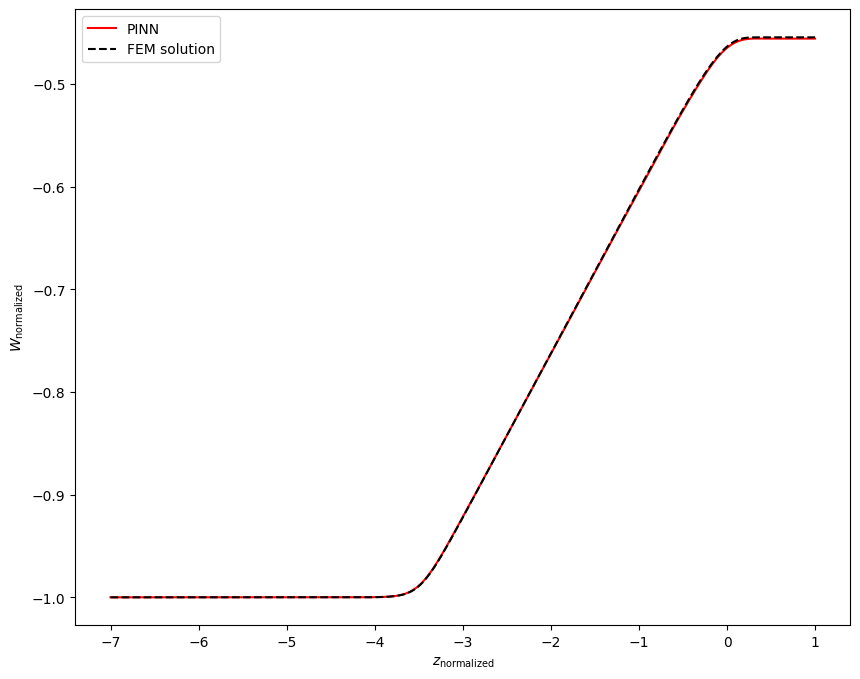


Epoch: 80000/400000
Loss: 0.11325462907552719
C_mean: -11.699739456176758
C_std: 0.026760516688227654
Loss ODE: 0.07220977544784546
Loss z0: 0.0
Loss zf: 0.0007475614547729492
KL divergence: 3.356924057006836


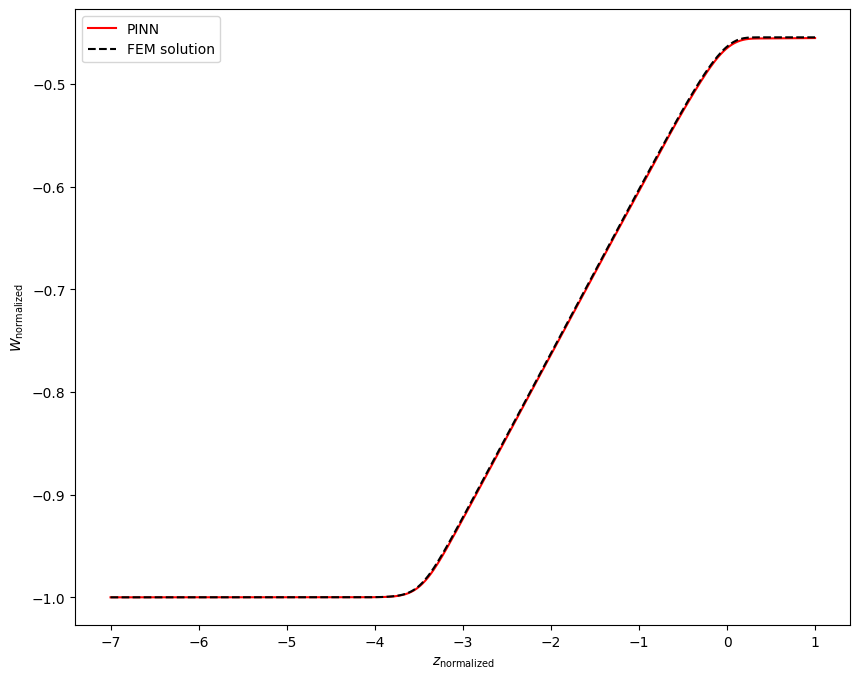


Epoch: 81000/400000
Loss: 0.049217045307159424
C_mean: -11.699625015258789
C_std: 0.0272089671343565
Loss ODE: 0.01265938114374876
Loss z0: 0.0
Loss zf: 0.0003153979778289795
KL divergence: 3.3403685092926025


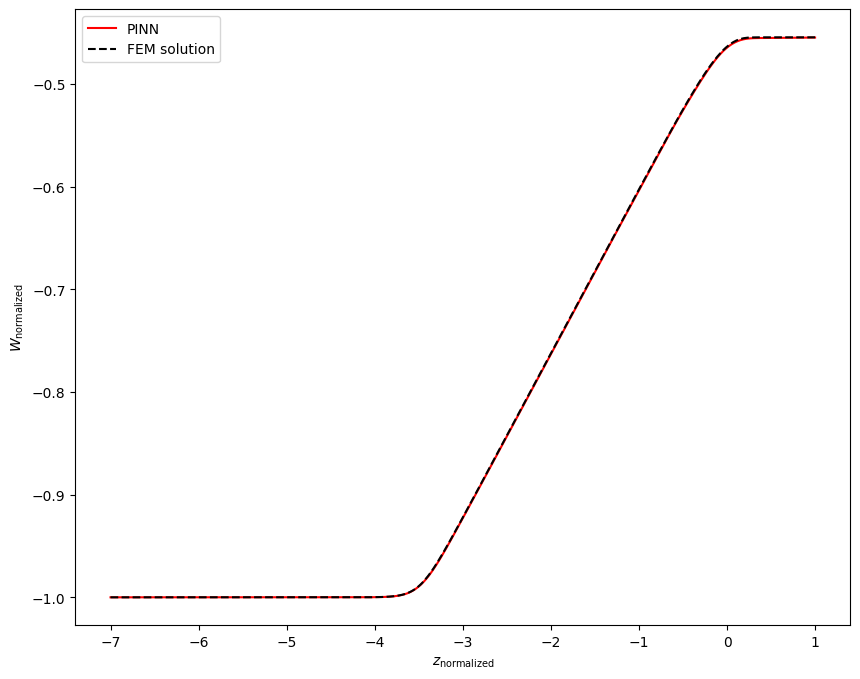


Epoch: 82000/400000
Loss: 0.06312800198793411
C_mean: -11.698925018310547
C_std: 0.02707511931657791
Loss ODE: 0.02355242893099785
Loss z0: 0.0
Loss zf: 0.0006123185157775879
KL divergence: 3.3452389240264893


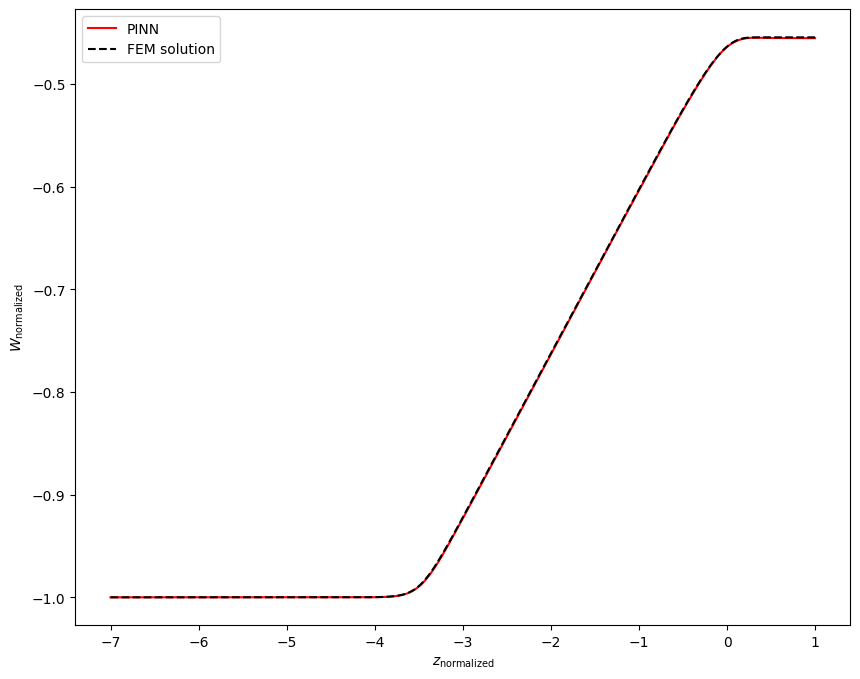


Epoch: 83000/400000
Loss: 0.05479006469249725
C_mean: -11.69930362701416
C_std: 0.02667040377855301
Loss ODE: 0.020020896568894386
Loss z0: 0.0
Loss zf: 0.00011658668518066406
KL divergence: 3.3603298664093018


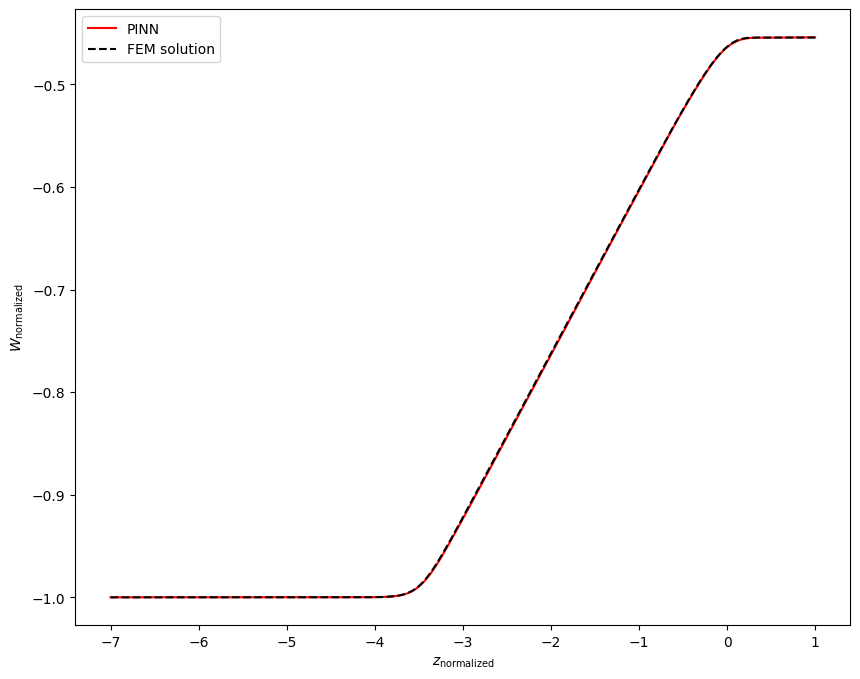


Epoch: 84000/400000
Loss: 0.09783416241407394
C_mean: -11.700567245483398
C_std: 0.0265726950019598
Loss ODE: 0.0590021088719368
Loss z0: 0.0
Loss zf: 0.0005191564559936523
KL divergence: 3.364048957824707


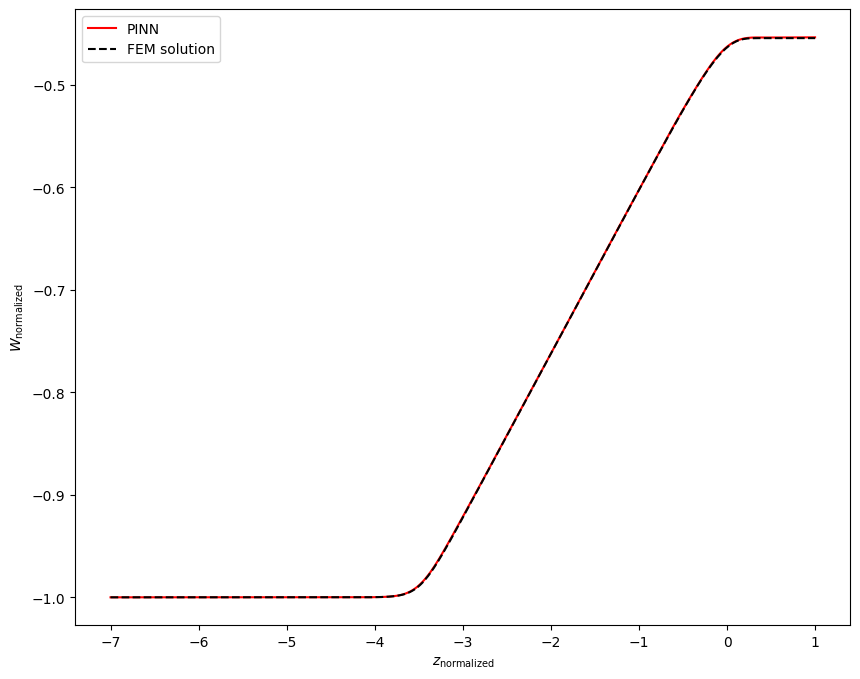


Epoch: 85000/400000
Loss: 0.12806972861289978
C_mean: -11.699758529663086
C_std: 0.026709547266364098
Loss ODE: 0.079265296459198
Loss z0: 0.0
Loss zf: 0.0015216171741485596
KL divergence: 3.3588268756866455


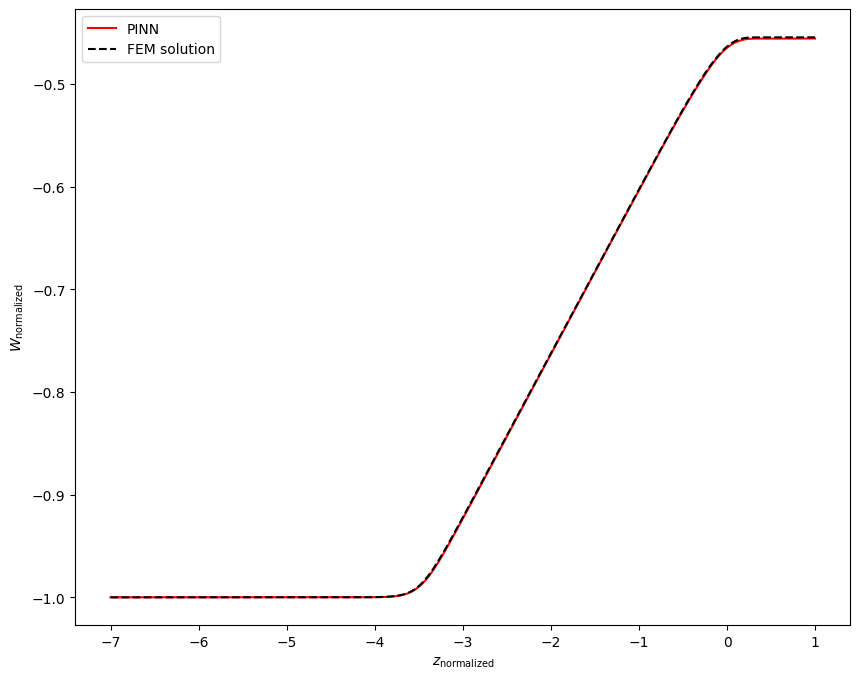


Epoch: 86000/400000
Loss: 0.05877923220396042
C_mean: -11.700596809387207
C_std: 0.0266385767608881
Loss ODE: 0.02387881837785244
Loss z0: 0.0
Loss zf: 0.0001284480094909668
KL divergence: 3.36159348487854


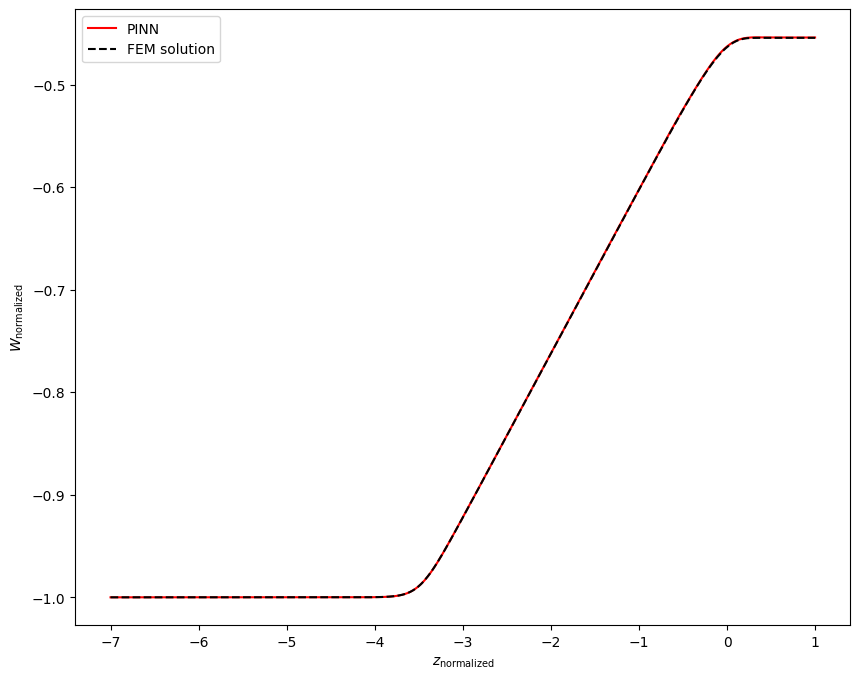


Epoch: 87000/400000
Loss: 0.08113376051187515
C_mean: -11.70014476776123
C_std: 0.026406586170196533
Loss ODE: 0.043647825717926025
Loss z0: 0.0
Loss zf: 0.0003782212734222412
KL divergence: 3.3703722953796387


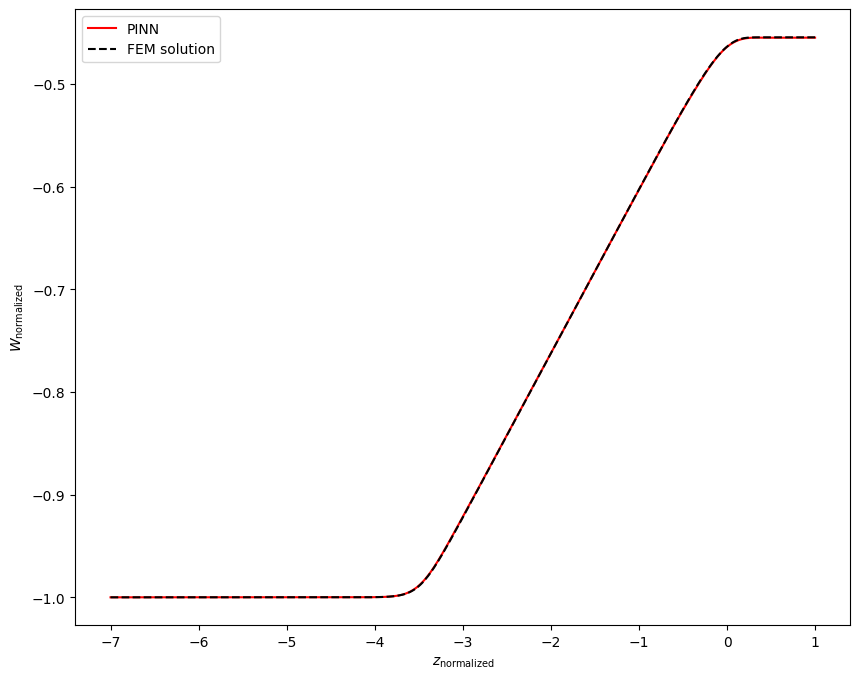


Epoch: 88000/400000
Loss: 0.08918215334415436
C_mean: -11.69986343383789
C_std: 0.02667098119854927
Loss ODE: 0.04893326014280319
Loss z0: 0.0
Loss zf: 0.0006645917892456055
KL divergence: 3.3602981567382812


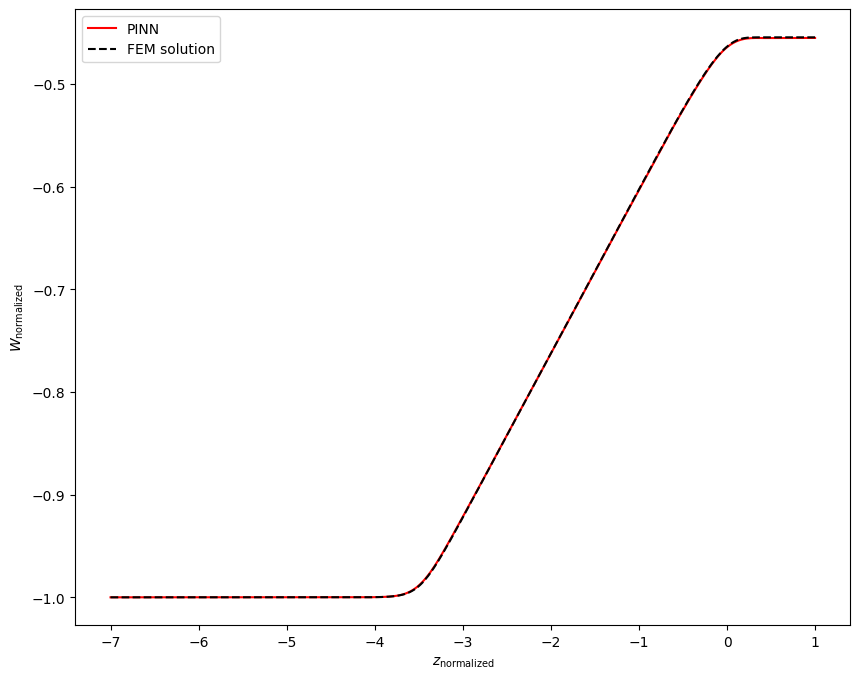


Epoch: 89000/400000
Loss: 0.06437551230192184
C_mean: -11.699621200561523
C_std: 0.026558563113212585
Loss ODE: 0.020760029554367065
Loss z0: 0.0
Loss zf: 0.0009969770908355713
KL divergence: 3.3645713329315186


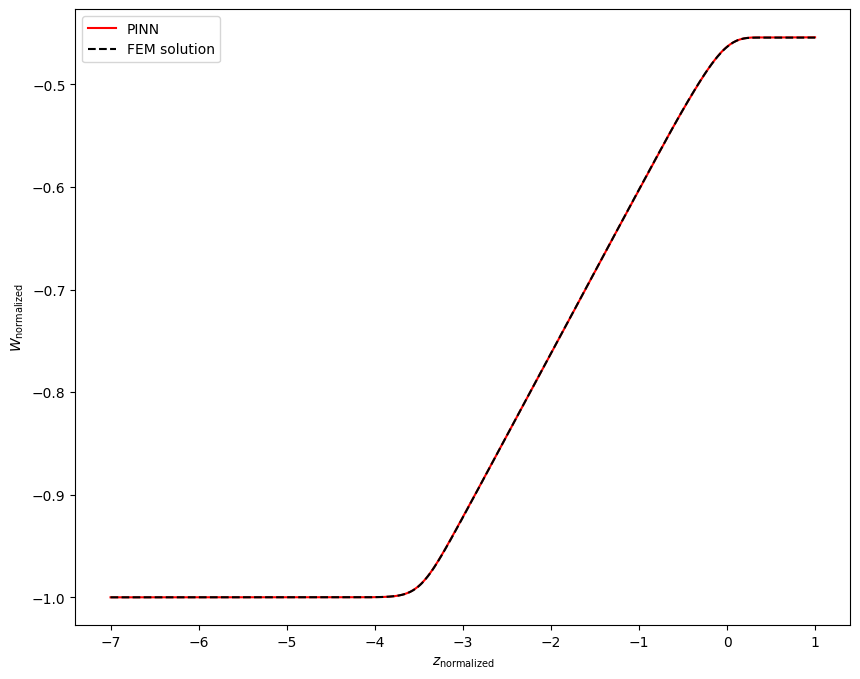


Epoch: 90000/400000
Loss: 0.05139446258544922
C_mean: -11.699950218200684
C_std: 0.02619490586221218
Loss ODE: 0.01513621024787426
Loss z0: 0.0
Loss zf: 0.0002474486827850342
KL divergence: 3.3783767223358154


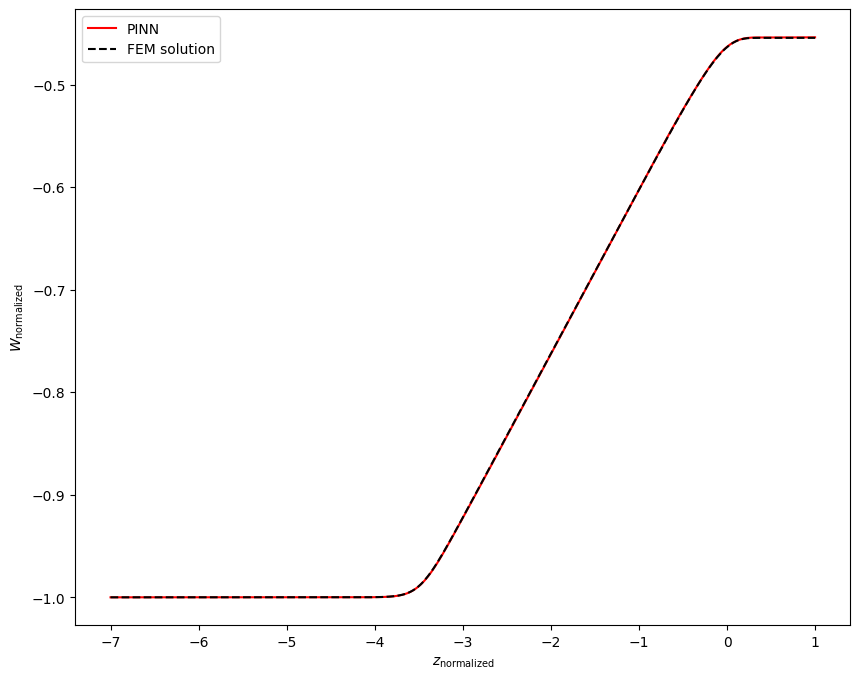


Epoch: 91000/400000
Loss: 0.07849672436714172
C_mean: -11.700970649719238
C_std: 0.02628861926496029
Loss ODE: 0.04301883652806282
Loss z0: 0.0
Loss zf: 0.0001729428768157959
KL divergence: 3.374845504760742


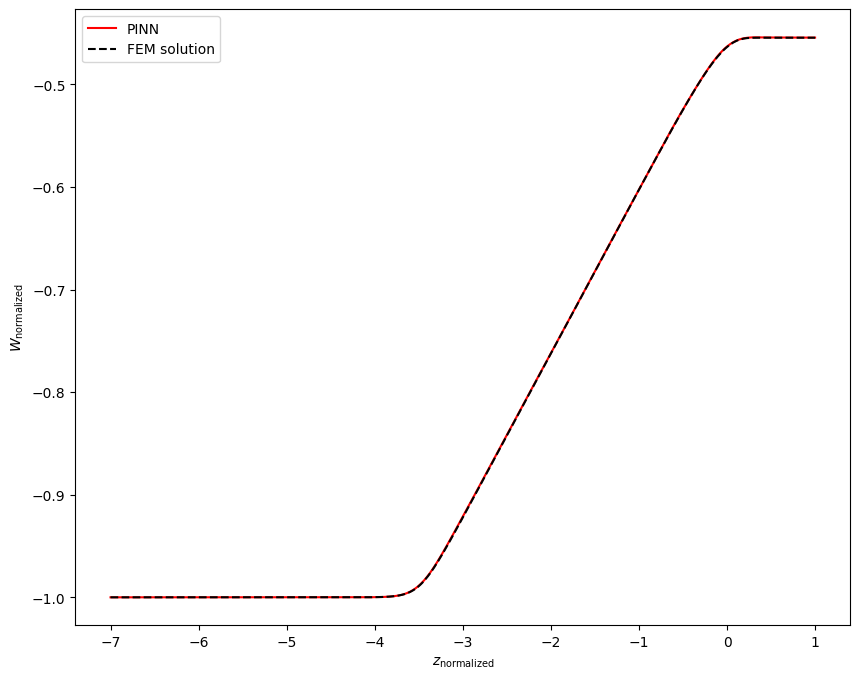


Epoch: 92000/400000
Loss: 0.08763711154460907
C_mean: -11.700379371643066
C_std: 0.026674438267946243
Loss ODE: 0.04788370057940483
Loss z0: 0.0
Loss zf: 0.0006150305271148682
KL divergence: 3.3603110313415527


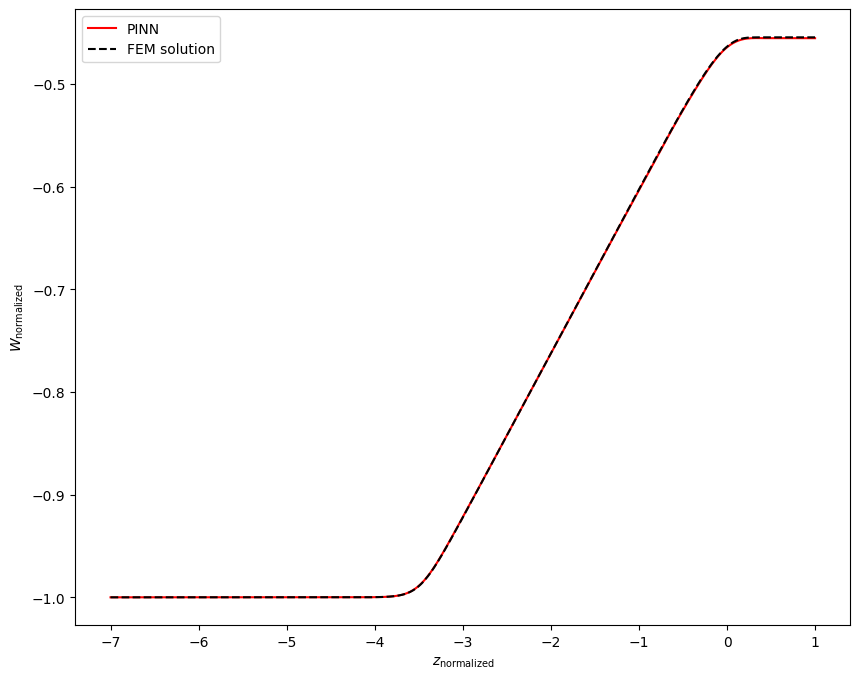


Epoch: 93000/400000
Loss: 0.10034635663032532
C_mean: -11.700450897216797
C_std: 0.026929480955004692
Loss ODE: 0.06250268220901489
Loss z0: 0.0
Loss zf: 0.0004335641860961914
KL divergence: 3.350803852081299


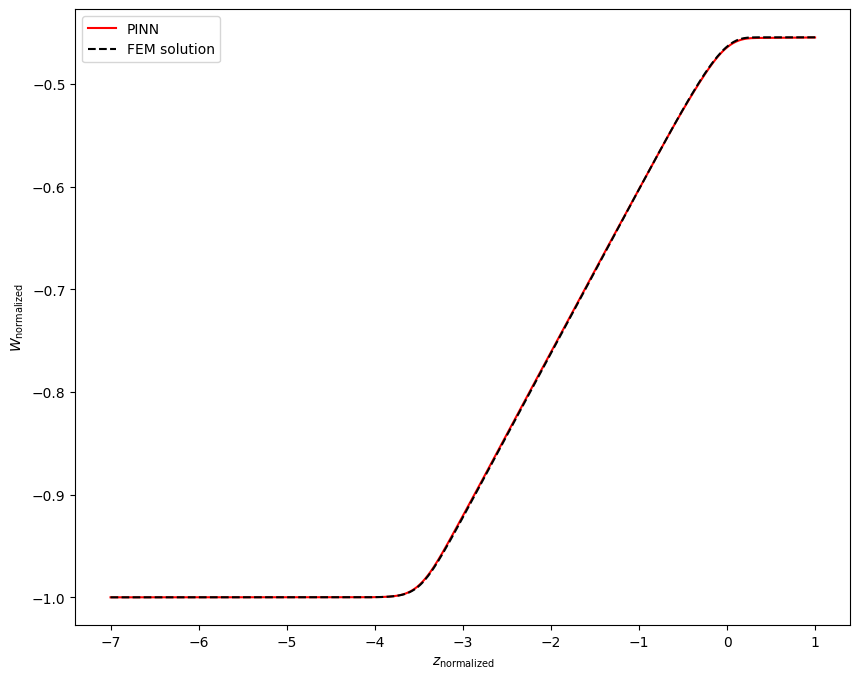


Epoch: 94000/400000
Loss: 0.10811568796634674
C_mean: -11.69954776763916
C_std: 0.026318928226828575
Loss ODE: 0.0687590017914772
Loss z0: 0.0
Loss zf: 0.000562131404876709
KL divergence: 3.3735368251800537


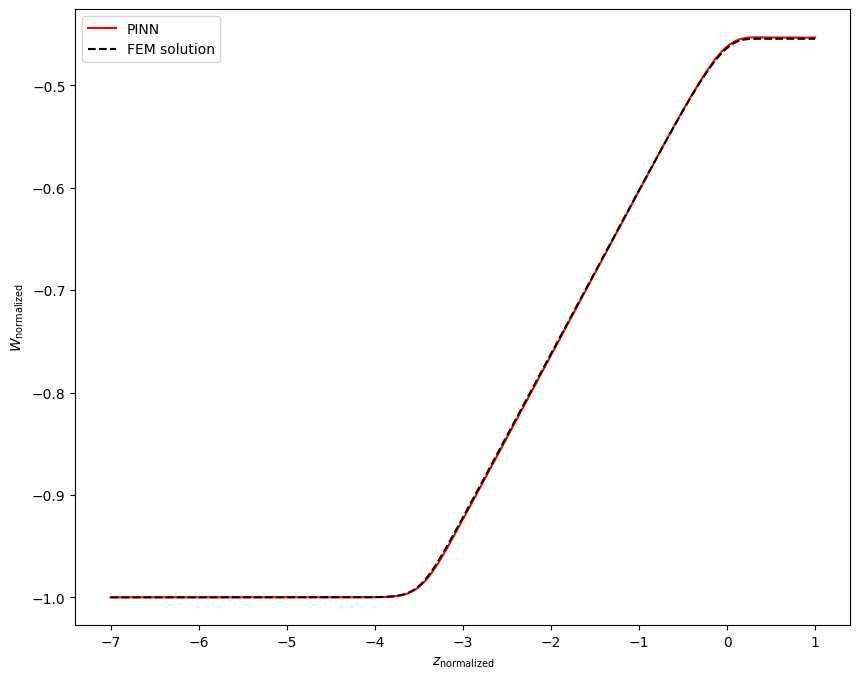


Epoch: 95000/400000
Loss: 0.14531874656677246
C_mean: -11.699379920959473
C_std: 0.02647984027862549
Loss ODE: 0.10230305045843124
Loss z0: 0.0
Loss zf: 0.0009341537952423096
KL divergence: 3.367415189743042


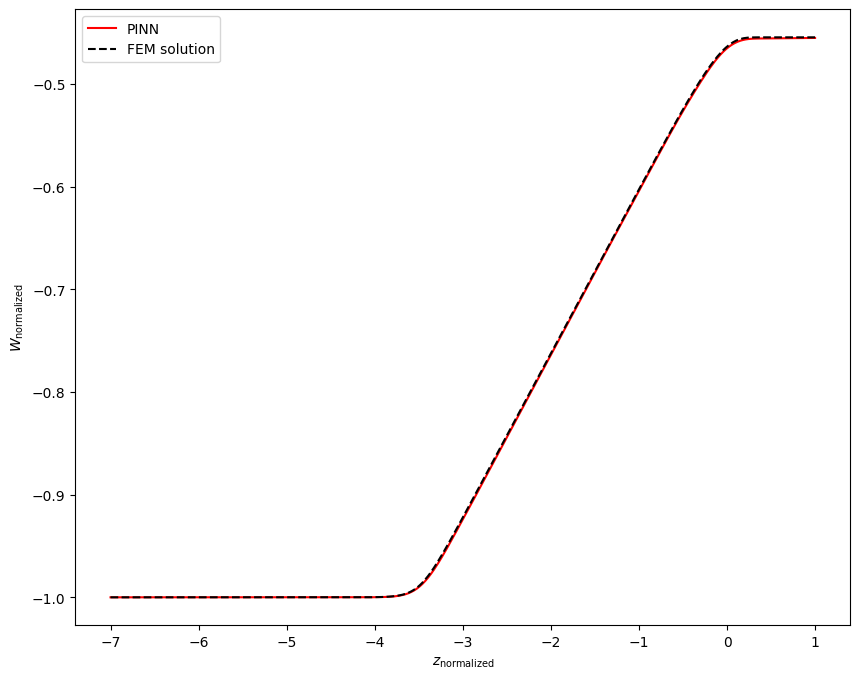


Epoch: 96000/400000
Loss: 0.06603394448757172
C_mean: -11.699766159057617
C_std: 0.026718145236372948
Loss ODE: 0.027971642091870308
Loss z0: 0.0
Loss zf: 0.0004477202892303467
KL divergence: 3.358510732650757


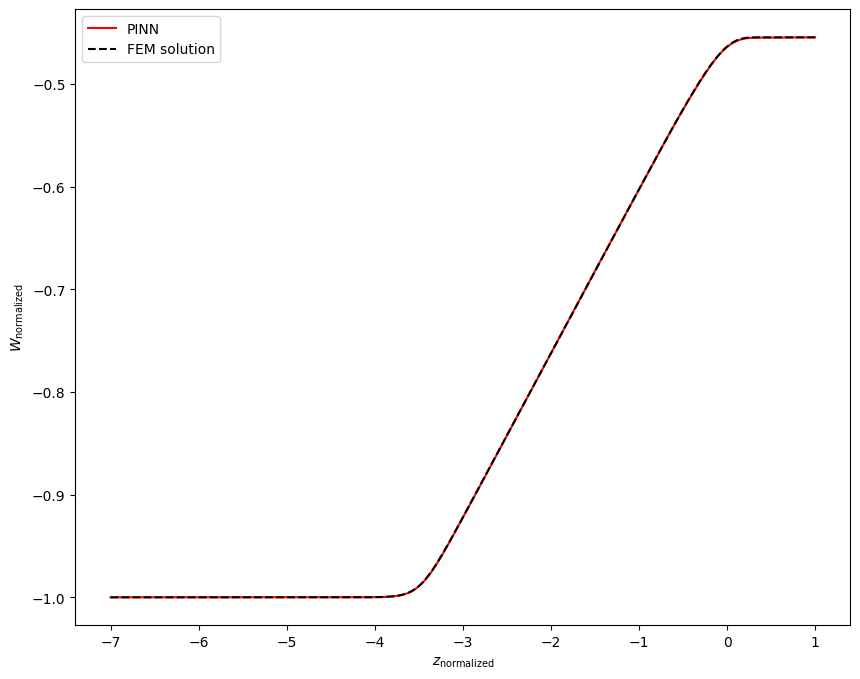


Epoch: 97000/400000
Loss: 0.0632387325167656
C_mean: -11.699725151062012
C_std: 0.02656860649585724
Loss ODE: 0.027716247364878654
Loss z0: 0.0
Loss zf: 0.0001881122589111328
KL divergence: 3.3641366958618164


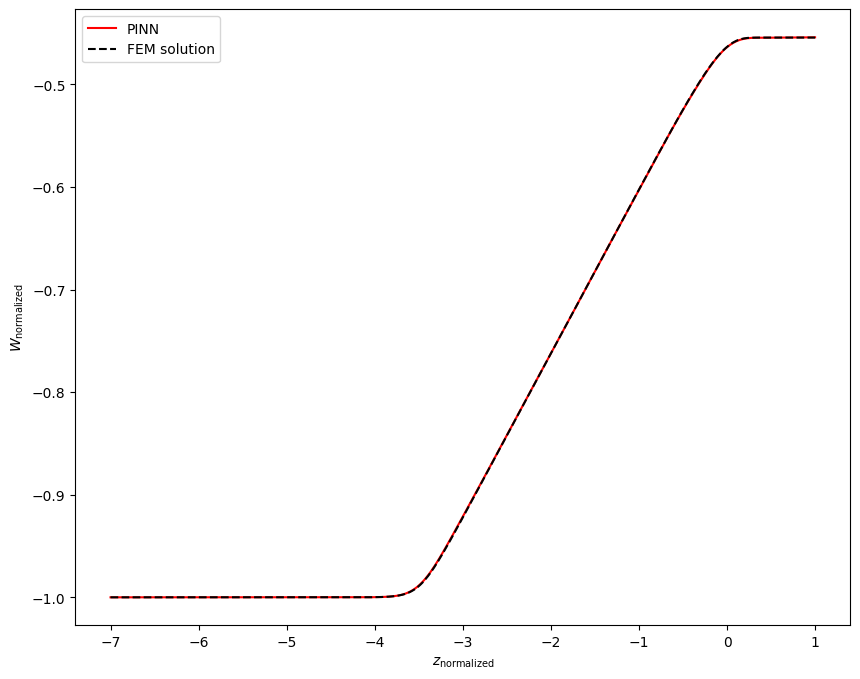


Epoch: 98000/400000
Loss: 0.06786730140447617
C_mean: -11.698735237121582
C_std: 0.026355162262916565
Loss ODE: 0.02137792855501175
Loss z0: 0.0
Loss zf: 0.0012768208980560303
KL divergence: 3.3721165657043457


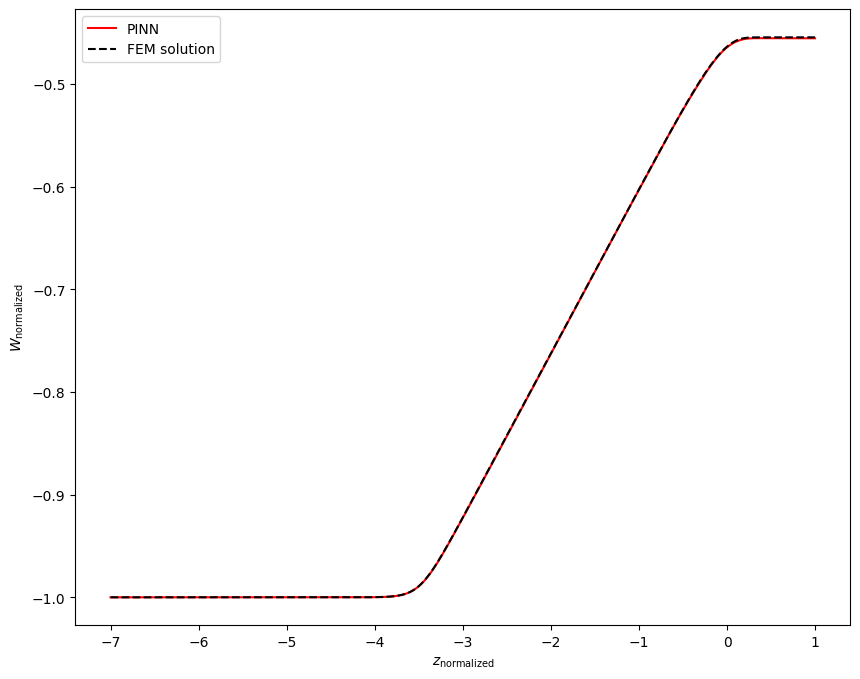


Epoch: 99000/400000
Loss: 0.06563887000083923
C_mean: -11.699211120605469
C_std: 0.026243845000863075
Loss ODE: 0.03025476448237896
Loss z0: 0.0
Loss zf: 0.0001620650291442871
KL divergence: 3.3763458728790283


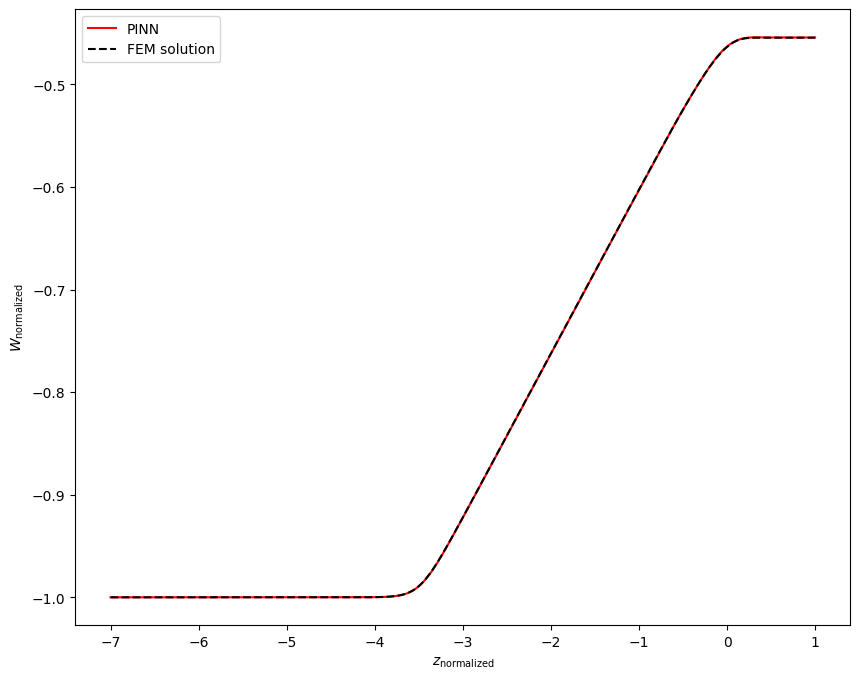


Epoch: 100000/400000
Loss: 0.04626934230327606
C_mean: -11.698949813842773
C_std: 0.026112936437129974
Loss ODE: 0.012155754491686821
Loss z0: 0.0
Loss zf: 3.001093864440918e-05
KL divergence: 3.381347894668579


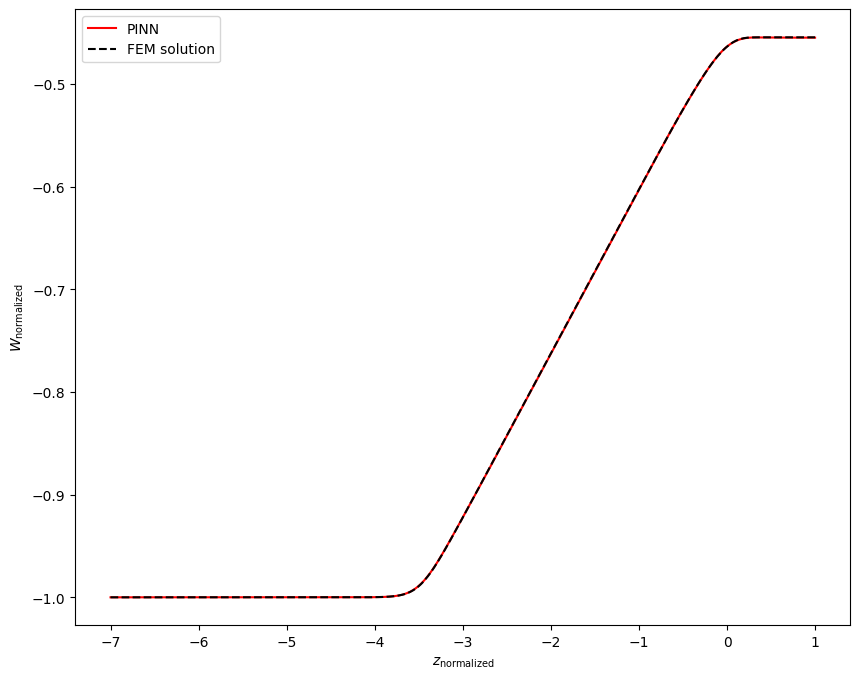


Epoch: 101000/400000
Loss: 0.06321927905082703
C_mean: -11.699274063110352
C_std: 0.02623315528035164
Loss ODE: 0.019992731511592865
Loss z0: 0.0
Loss zf: 0.0009458363056182861
KL divergence: 3.376818895339966


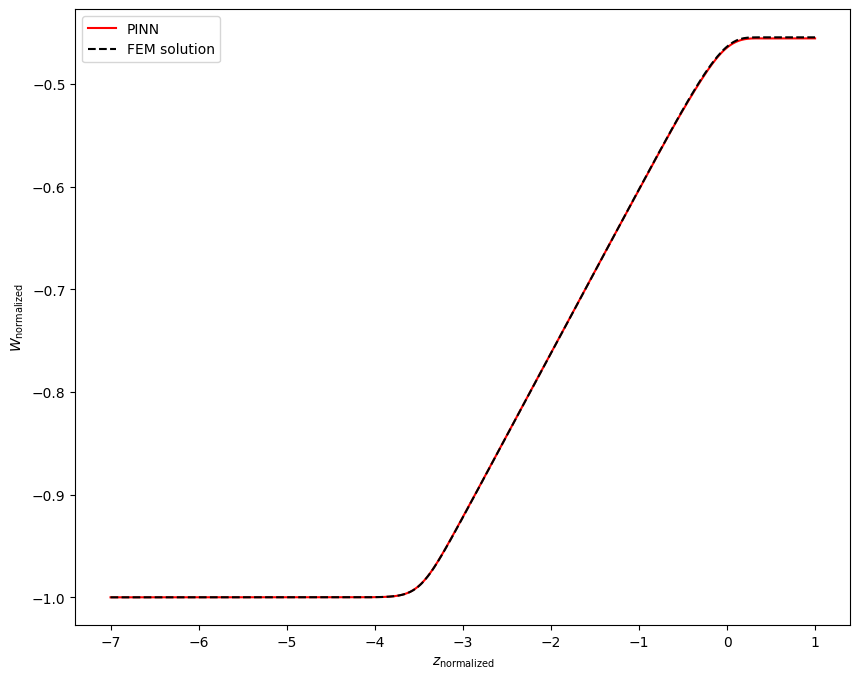


Epoch: 102000/400000
Loss: 0.07648956030607224
C_mean: -11.699496269226074
C_std: 0.026244184002280235
Loss ODE: 0.03643267974257469
Loss z0: 0.0
Loss zf: 0.0006292462348937988
KL divergence: 3.376441717147827


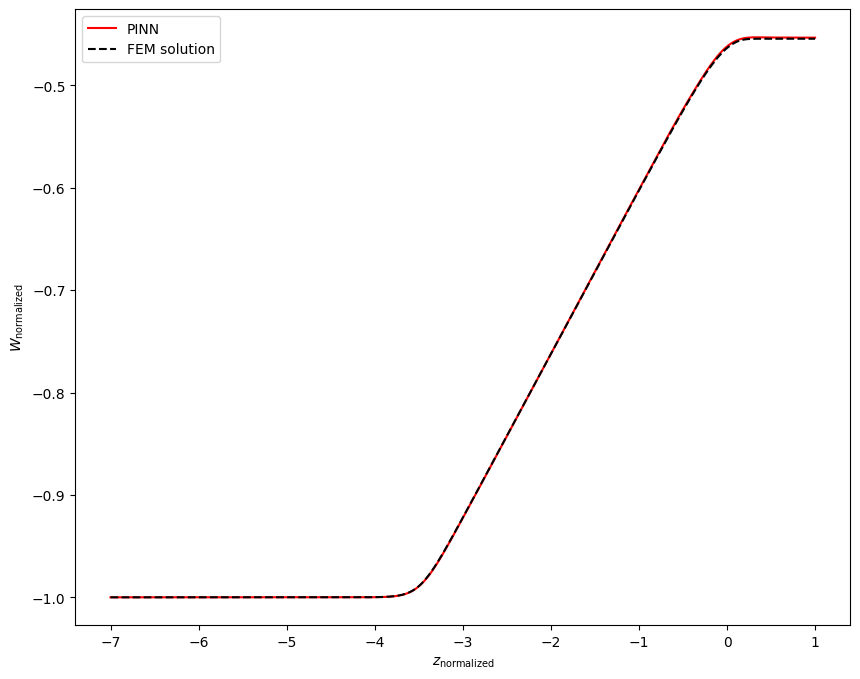


Epoch: 103000/400000
Loss: 0.08701379597187042
C_mean: -11.698379516601562
C_std: 0.026310419663786888
Loss ODE: 0.050006136298179626
Loss z0: 0.0
Loss zf: 0.00032705068588256836
KL divergence: 3.373715400695801


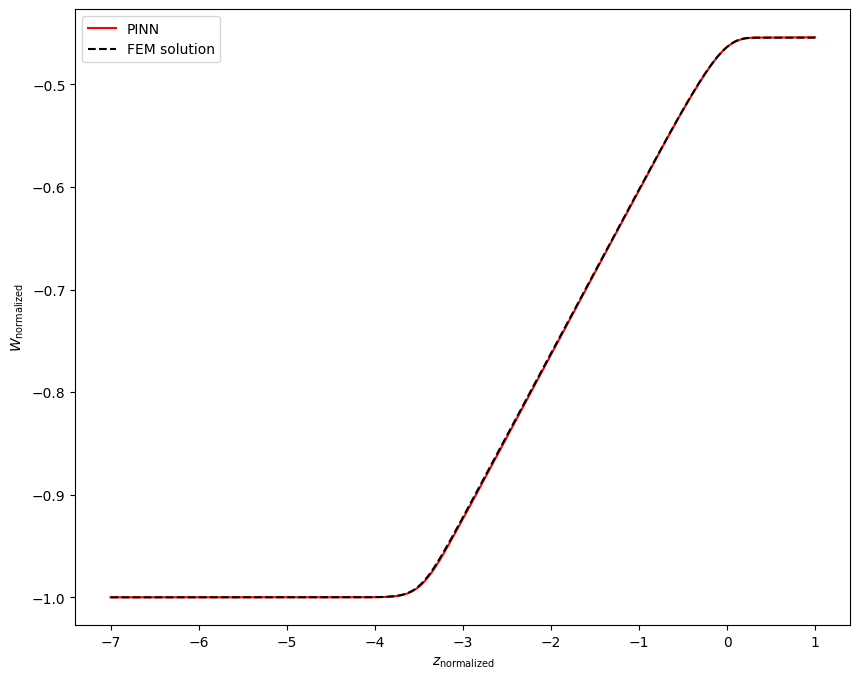


Epoch: 104000/400000
Loss: 0.11707127094268799
C_mean: -11.698882102966309
C_std: 0.026070445775985718
Loss ODE: 0.07955581694841385
Loss z0: 0.0
Loss zf: 0.00036853551864624023
KL divergence: 3.383009672164917


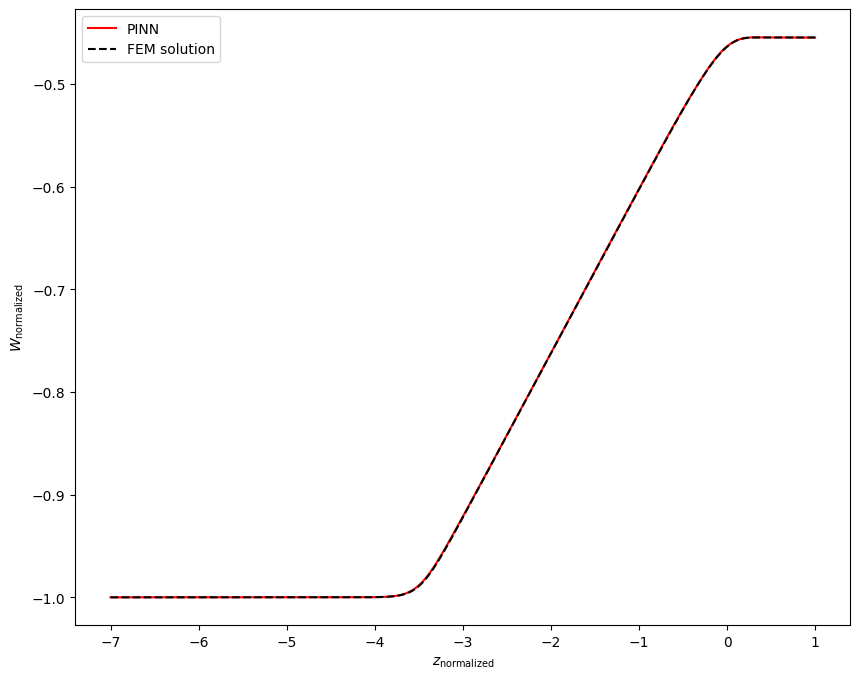


Epoch: 105000/400000
Loss: 0.0645163506269455
C_mean: -11.69831371307373
C_std: 0.02580079808831215
Loss ODE: 0.021149832755327225
Loss z0: 0.0
Loss zf: 0.0009433925151824951
KL divergence: 3.3932595252990723


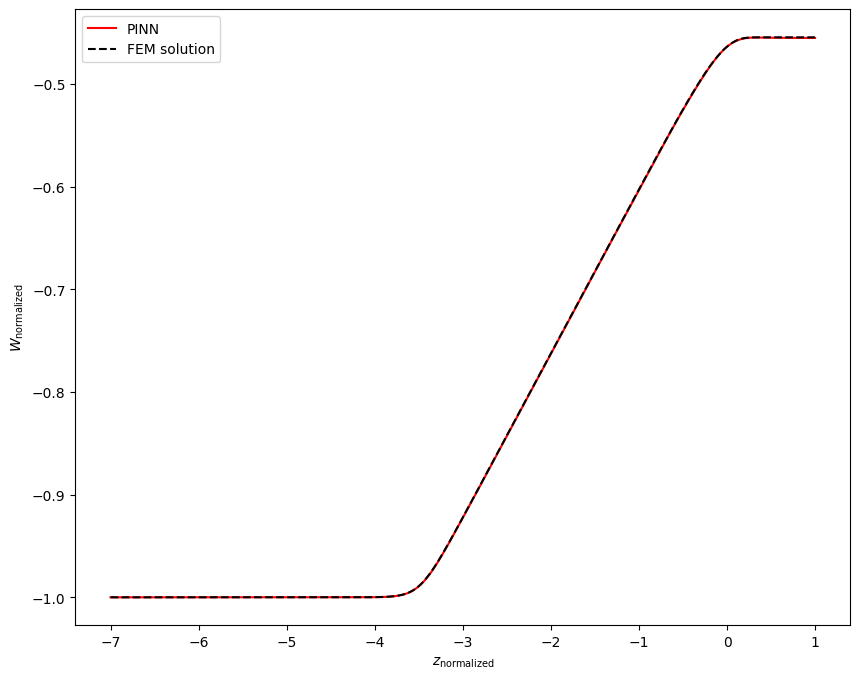


Epoch: 106000/400000
Loss: 0.05746328458189964
C_mean: -11.698487281799316
C_std: 0.02520879916846752
Loss ODE: 0.02084803208708763
Loss z0: 0.0
Loss zf: 0.00024497509002685547
KL divergence: 3.4165501594543457


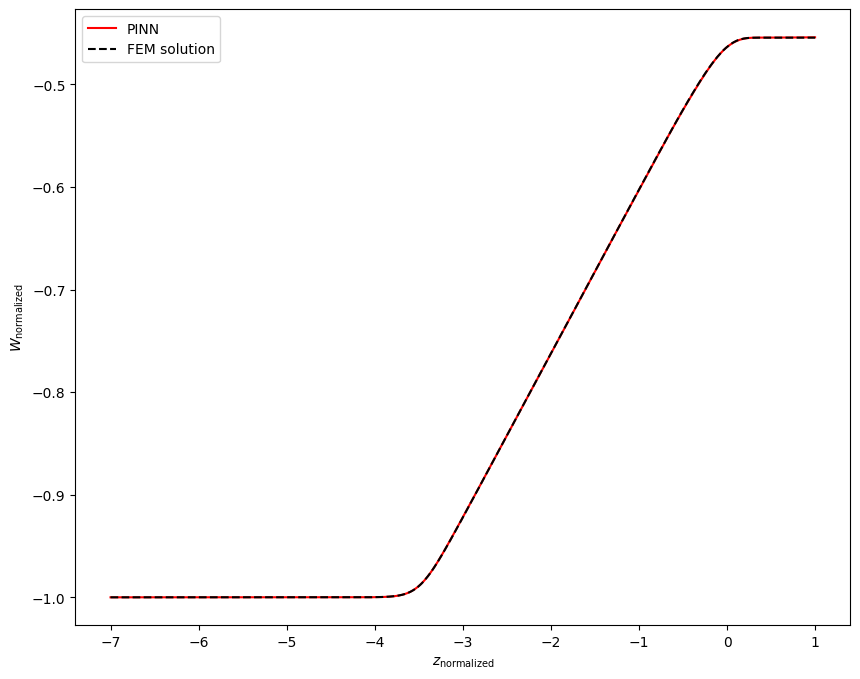


Epoch: 107000/400000
Loss: 0.06568728387355804
C_mean: -11.699329376220703
C_std: 0.025380073115229607
Loss ODE: 0.027223750948905945
Loss z0: 0.0
Loss zf: 0.00043654441833496094
KL divergence: 3.409808874130249


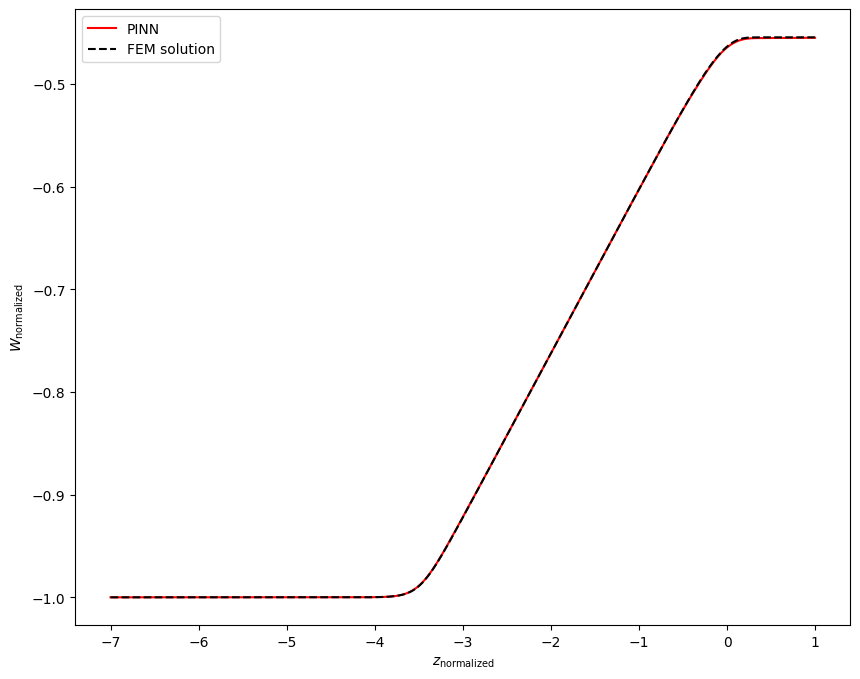


Epoch: 108000/400000
Loss: 0.09074810147285461
C_mean: -11.698968887329102
C_std: 0.02515752799808979
Loss ODE: 0.05144176259636879
Loss z0: 0.0
Loss zf: 0.0005120635032653809
KL divergence: 3.418570041656494


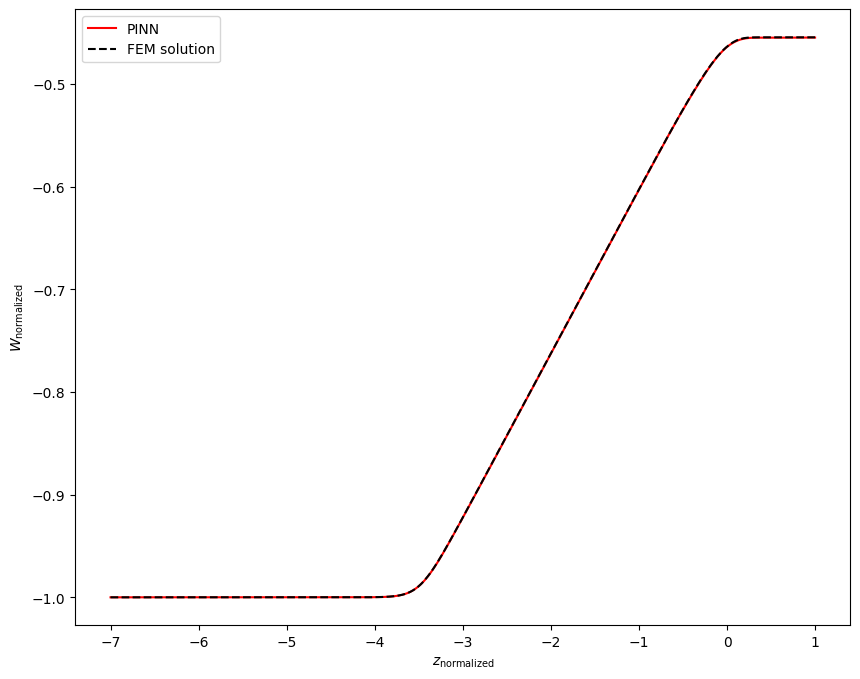


Epoch: 109000/400000
Loss: 0.06061394512653351
C_mean: -11.699691772460938
C_std: 0.024726752191781998
Loss ODE: 0.025782061740756035
Loss z0: 0.0
Loss zf: 4.7206878662109375e-05
KL divergence: 3.435981512069702


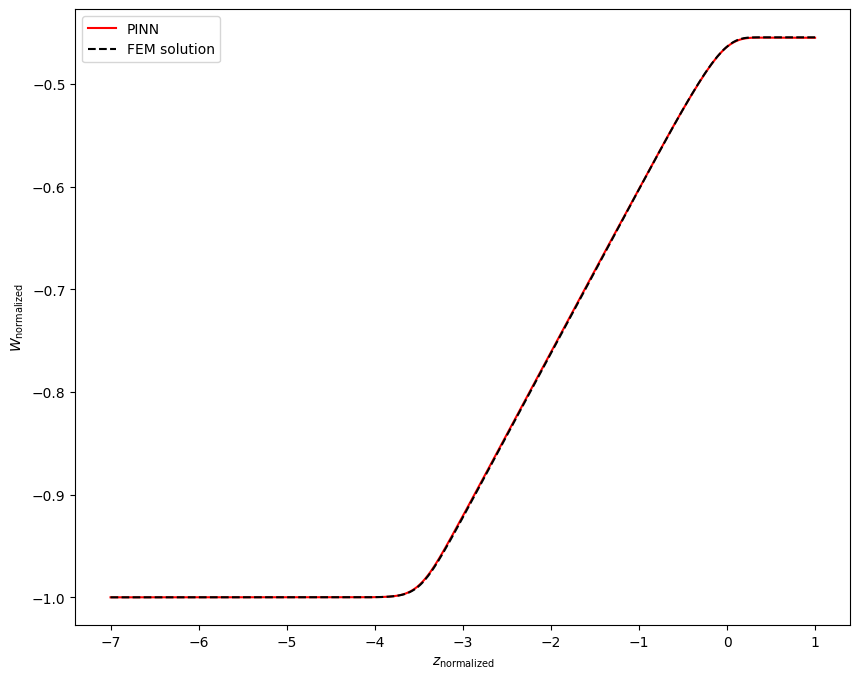


Epoch: 110000/400000
Loss: 0.09747101366519928
C_mean: -11.699209213256836
C_std: 0.02461169846355915
Loss ODE: 0.055068373680114746
Loss z0: 0.0
Loss zf: 0.0007996559143066406
KL divergence: 3.440608263015747


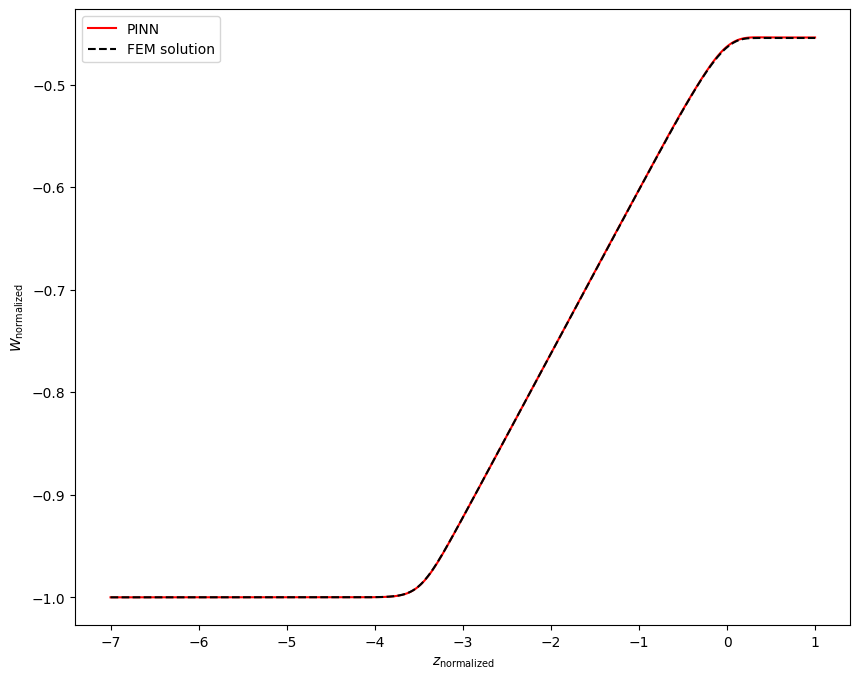


Epoch: 111000/400000
Loss: 0.06816336512565613
C_mean: -11.699750900268555
C_std: 0.024522462859749794
Loss ODE: 0.032329220324754715
Loss z0: 0.0
Loss zf: 0.00013911724090576172
KL divergence: 3.4442973136901855


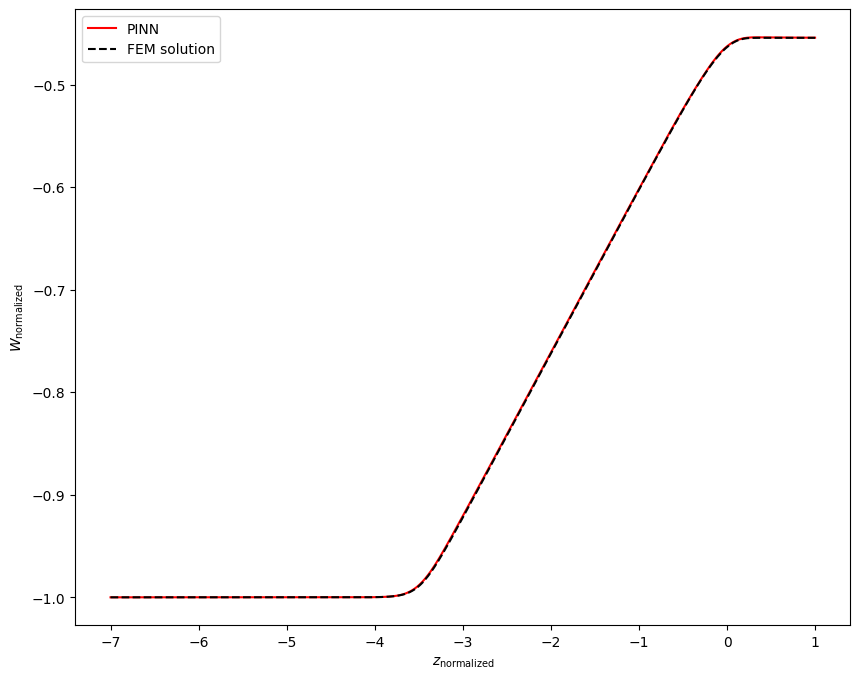


Epoch: 112000/400000
Loss: 0.04274817183613777
C_mean: -11.698710441589355
C_std: 0.024790596216917038
Loss ODE: 0.007008166052401066
Loss z0: 0.0
Loss zf: 0.00014072656631469727
KL divergence: 3.433274269104004


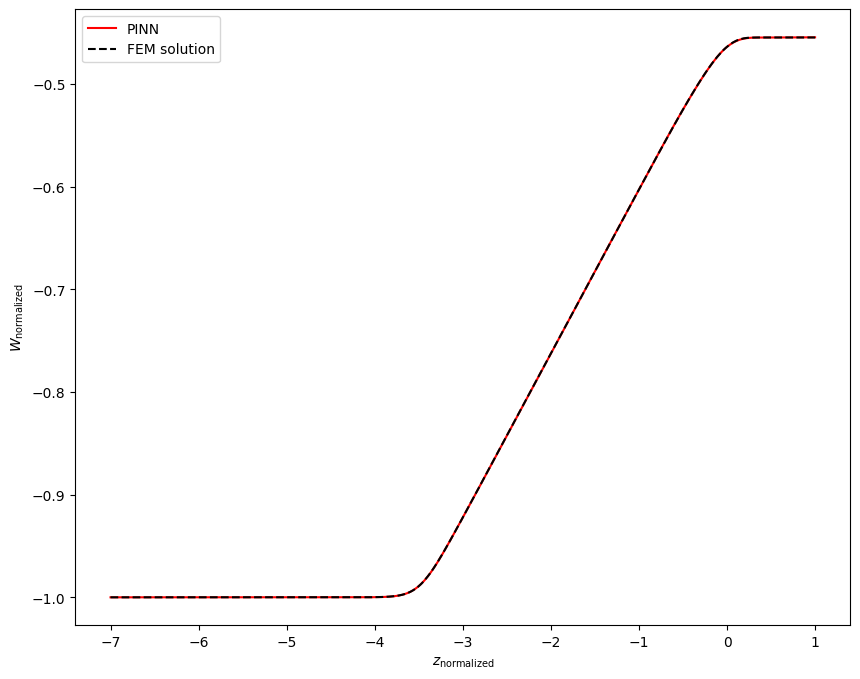


Epoch: 113000/400000
Loss: 0.05328299477696419
C_mean: -11.6987886428833
C_std: 0.02466566674411297
Loss ODE: 0.01776016503572464
Loss z0: 0.0
Loss zf: 0.00011393427848815918
KL divergence: 3.4383487701416016


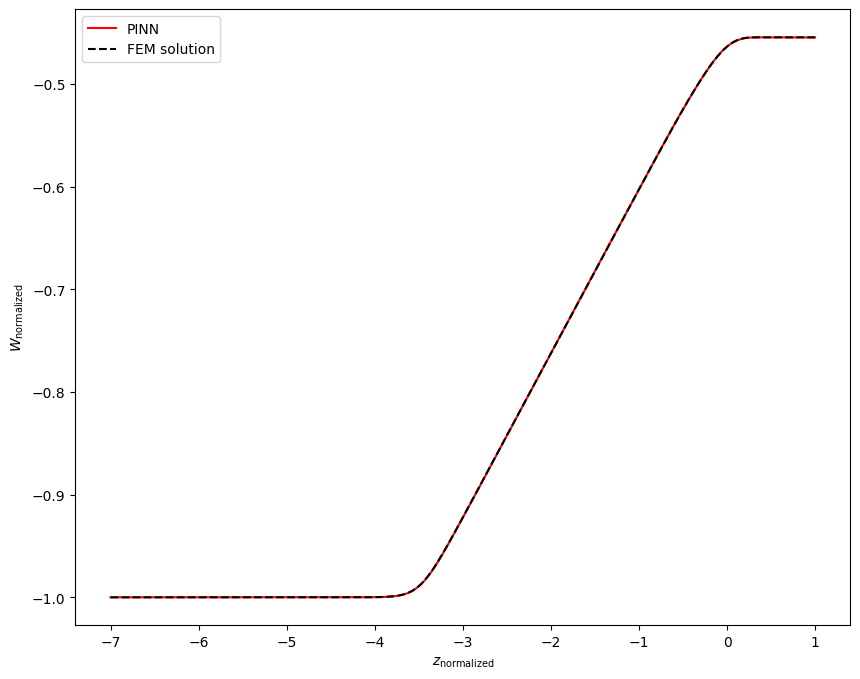


Epoch: 114000/400000
Loss: 0.1011069193482399
C_mean: -11.697833061218262
C_std: 0.02492820844054222
Loss ODE: 0.06001429632306099
Loss z0: 0.0
Loss zf: 0.0006816685199737549
KL divergence: 3.4275941848754883


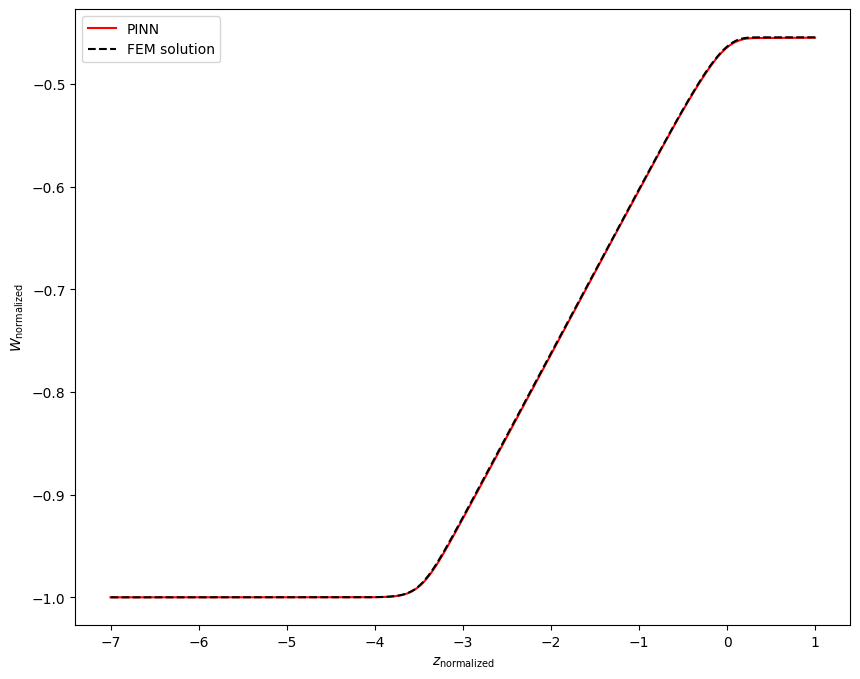


Epoch: 115000/400000
Loss: 0.07153099775314331
C_mean: -11.69841194152832
C_std: 0.024975793436169624
Loss ODE: 0.031100403517484665
Loss z0: 0.0
Loss zf: 0.0006172358989715576
KL divergence: 3.425823450088501


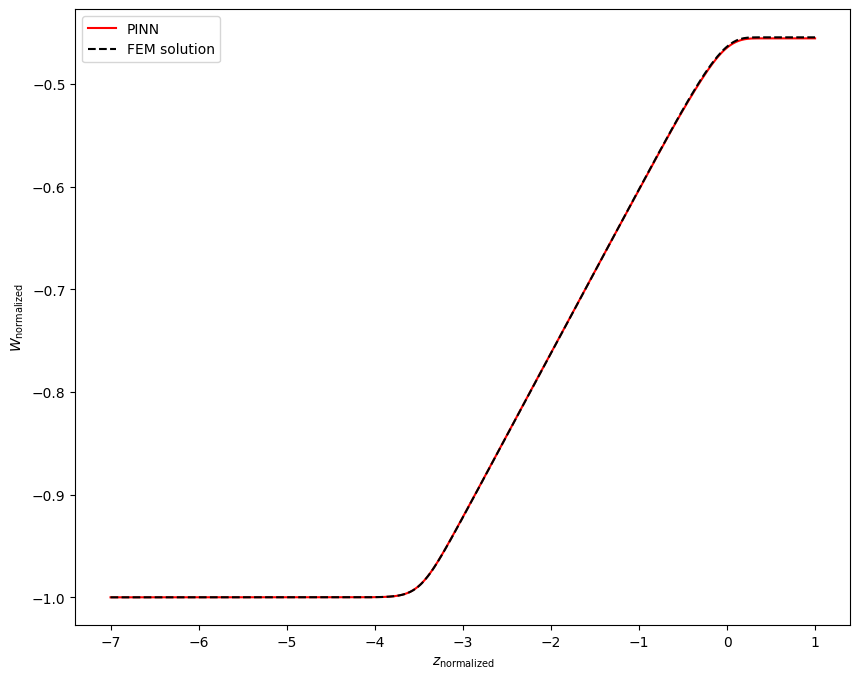


Epoch: 116000/400000
Loss: 0.07693043351173401
C_mean: -11.698994636535645
C_std: 0.02506624348461628
Loss ODE: 0.03693298622965813
Loss z0: 0.0
Loss zf: 0.0005775094032287598
KL divergence: 3.4222352504730225


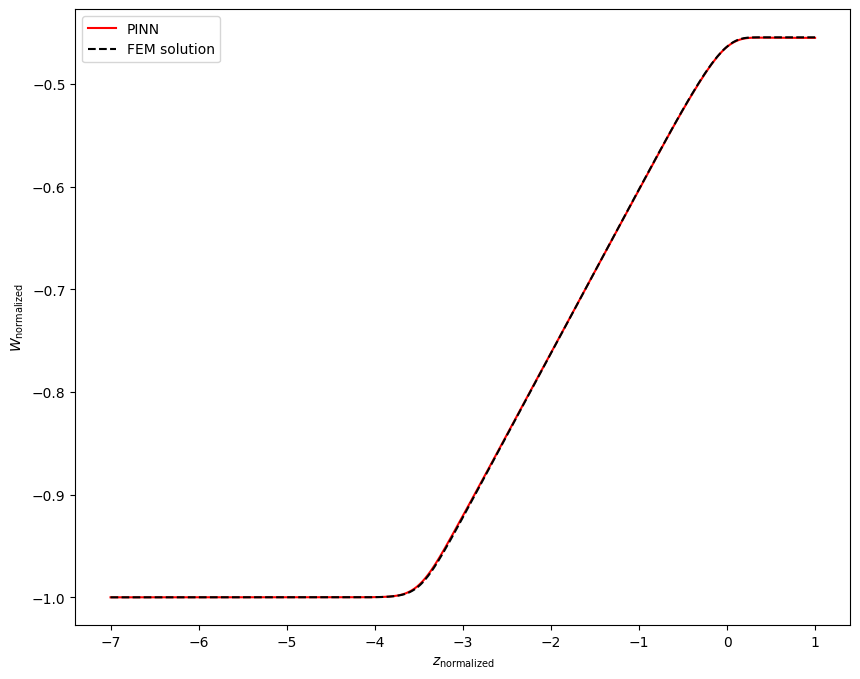


Epoch: 117000/400000
Loss: 0.058721594512462616
C_mean: -11.699132919311523
C_std: 0.02459353394806385
Loss ODE: 0.019372863695025444
Loss z0: 0.0
Loss zf: 0.0004936158657073975
KL divergence: 3.4412569999694824


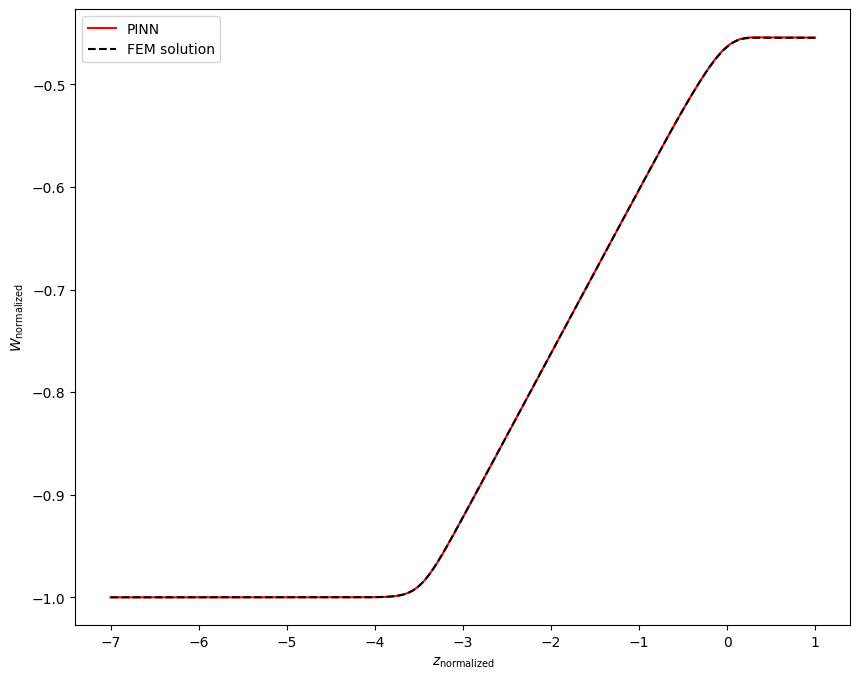


Epoch: 118000/400000
Loss: 0.0825124979019165
C_mean: -11.698587417602539
C_std: 0.025117307901382446
Loss ODE: 0.045137885957956314
Loss z0: 0.0
Loss zf: 0.0003173351287841797
KL divergence: 3.4201266765594482


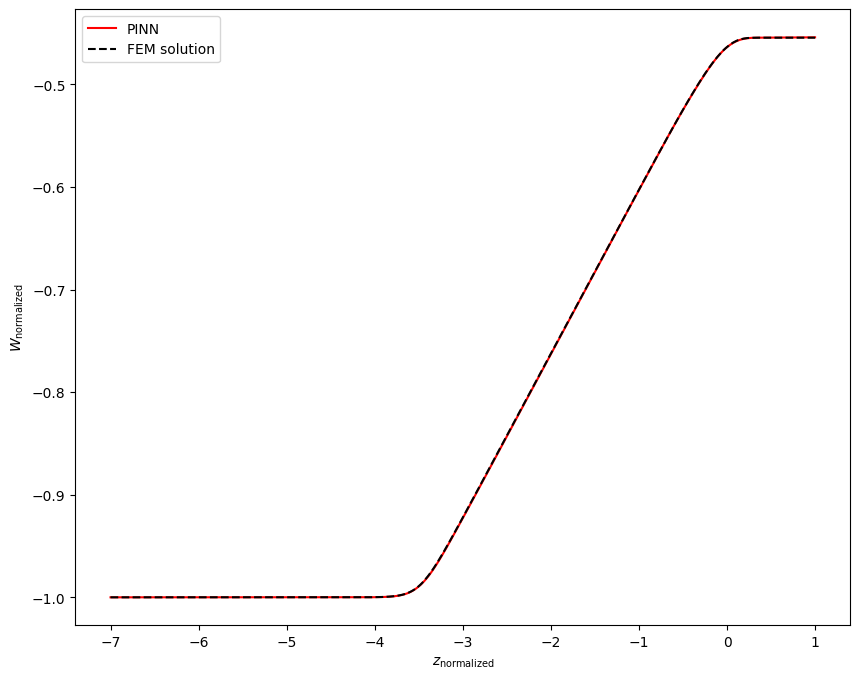


Epoch: 119000/400000
Loss: 0.04411160200834274
C_mean: -11.698275566101074
C_std: 0.02556571550667286
Loss ODE: 0.009309839457273483
Loss z0: 0.0
Loss zf: 7.775425910949707e-05
KL divergence: 3.4024221897125244


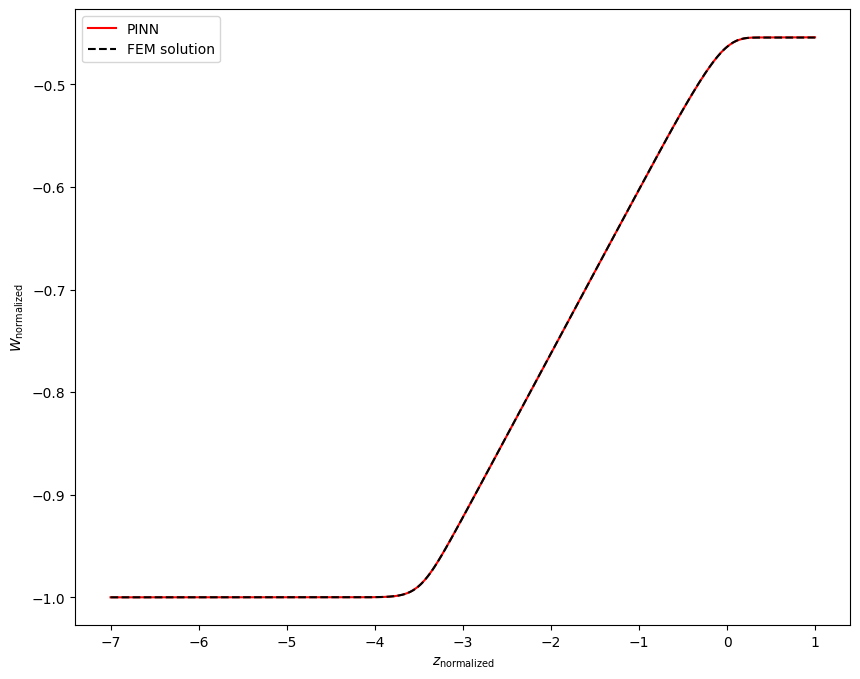


Epoch: 120000/400000
Loss: 0.057215429842472076
C_mean: -11.69845962524414
C_std: 0.025238236412405968
Loss ODE: 0.01992238126695156
Loss z0: 0.0
Loss zf: 0.0003139376640319824
KL divergence: 3.4153671264648438


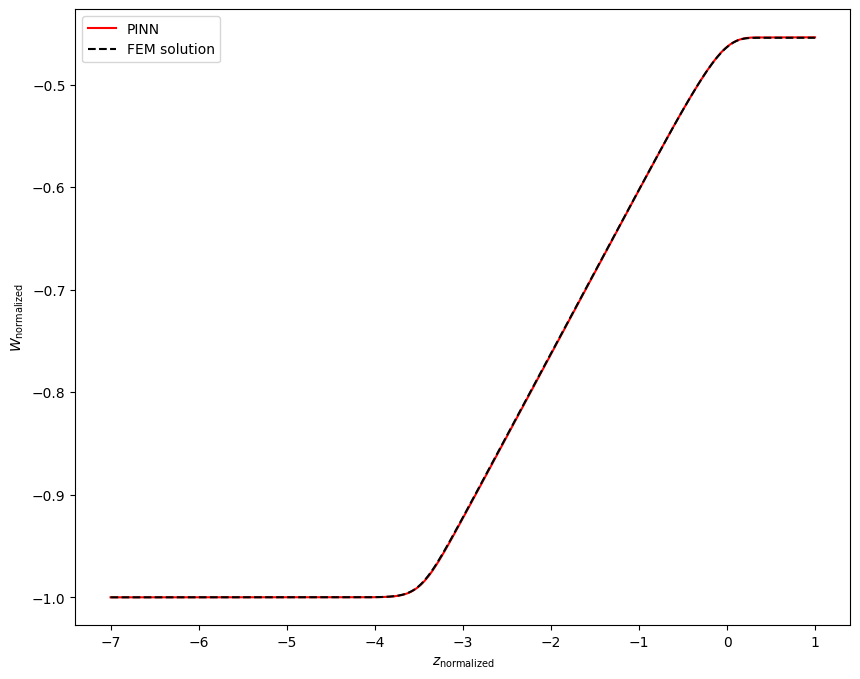


Epoch: 121000/400000
Loss: 0.04996019974350929
C_mean: -11.697683334350586
C_std: 0.02510998211801052
Loss ODE: 0.013605083338916302
Loss z0: 0.0
Loss zf: 0.00021517276763916016
KL divergence: 3.4203388690948486


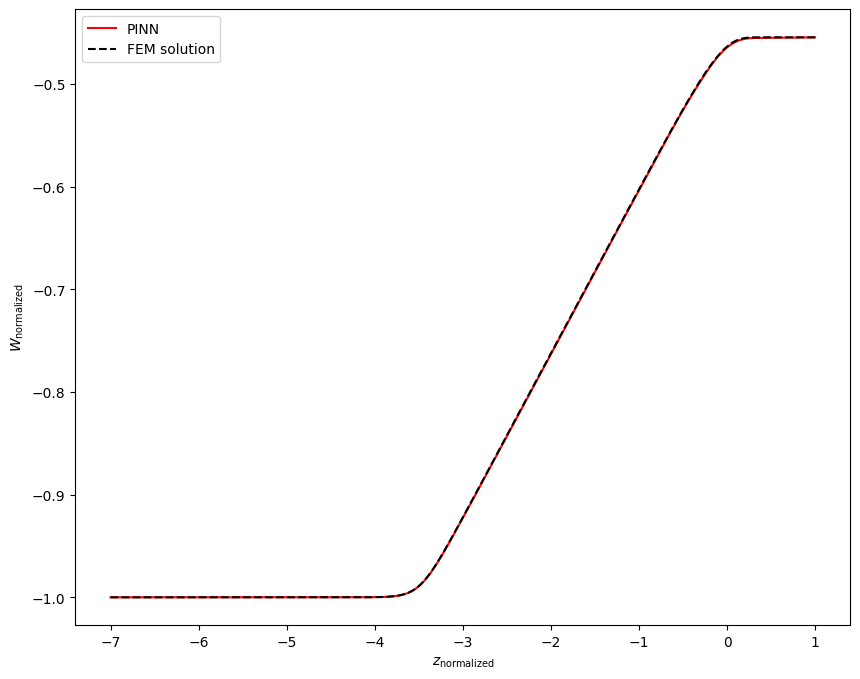


Epoch: 122000/400000
Loss: 0.05817914754152298
C_mean: -11.698426246643066
C_std: 0.02489241026341915
Loss ODE: 0.019753219559788704
Loss z0: 0.0
Loss zf: 0.00041347742080688477
KL divergence: 3.4291152954101562


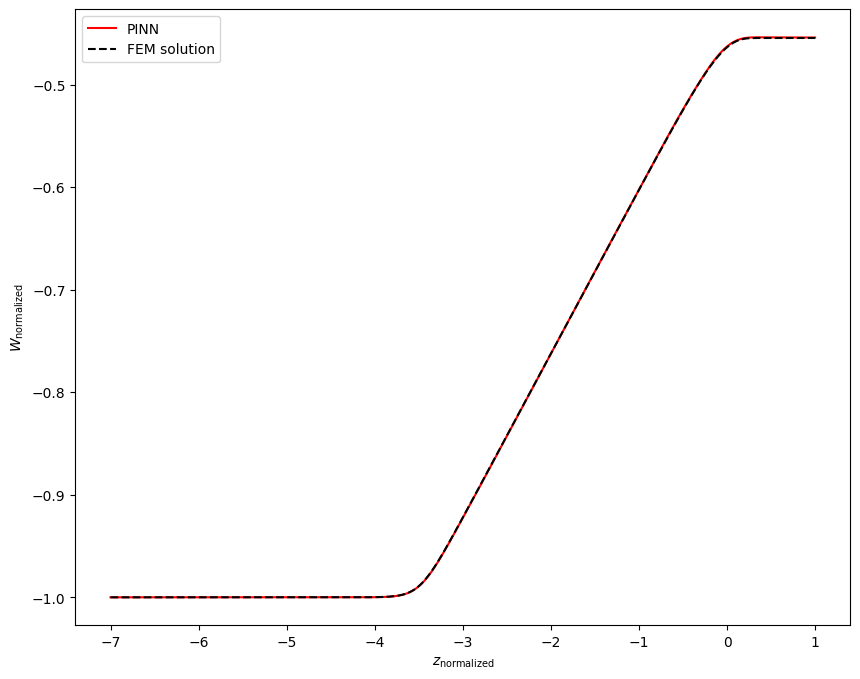


Epoch: 123000/400000
Loss: 0.04968106746673584
C_mean: -11.69834041595459
C_std: 0.02513662353157997
Loss ODE: 0.01417053397744894
Loss z0: 0.0
Loss zf: 0.00013169646263122559
KL divergence: 3.4193568229675293


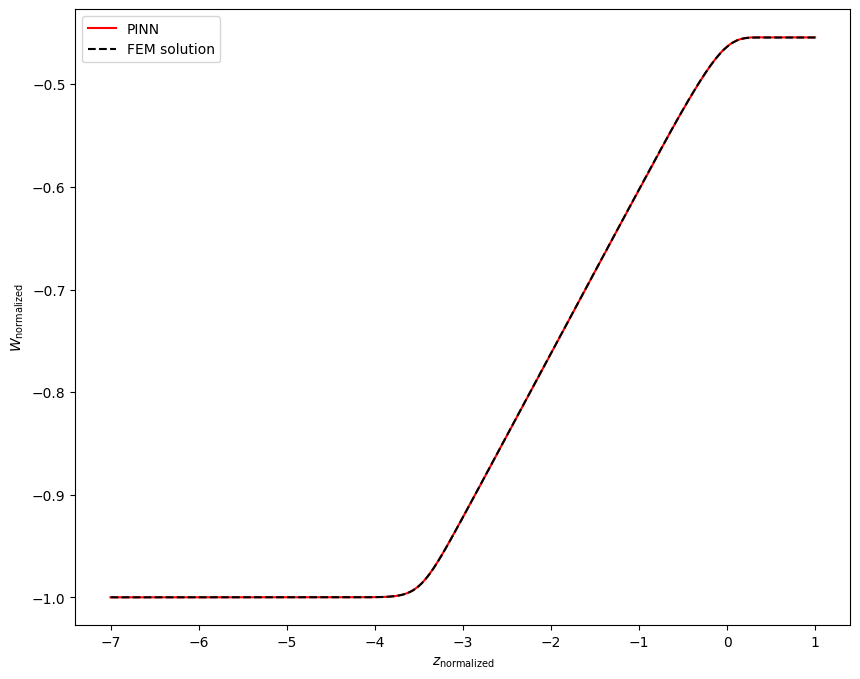


Epoch: 124000/400000
Loss: 0.05054836347699165
C_mean: -11.698720932006836
C_std: 0.0250295028090477
Loss ODE: 0.015496351756155491
Loss z0: 0.0
Loss zf: 8.153915405273438e-05
KL divergence: 3.4236621856689453


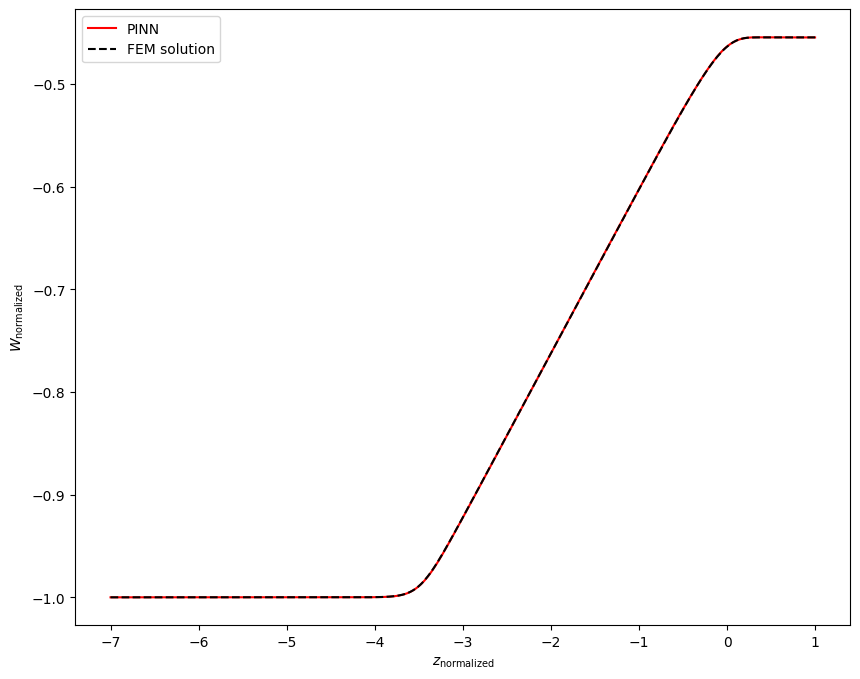


Epoch: 125000/400000
Loss: 0.05140584707260132
C_mean: -11.697918891906738
C_std: 0.024731609970331192
Loss ODE: 0.014544239267706871
Loss z0: 0.0
Loss zf: 0.0002506375312805176
KL divergence: 3.435523271560669


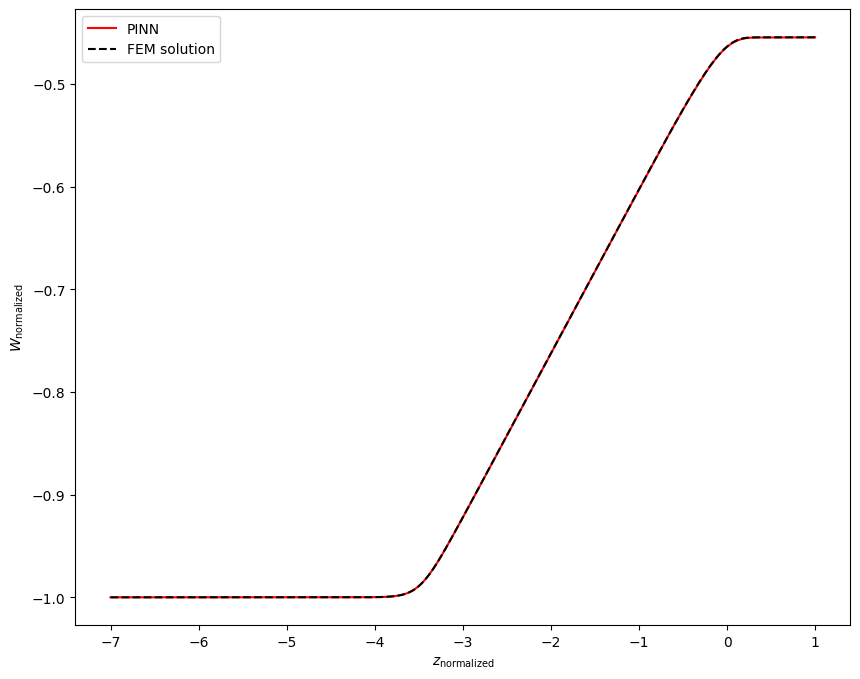


Epoch: 126000/400000
Loss: 0.06060972064733505
C_mean: -11.697956085205078
C_std: 0.02446010150015354
Loss ODE: 0.02449539490044117
Loss z0: 0.0
Loss zf: 0.00016486644744873047
KL divergence: 3.446566104888916


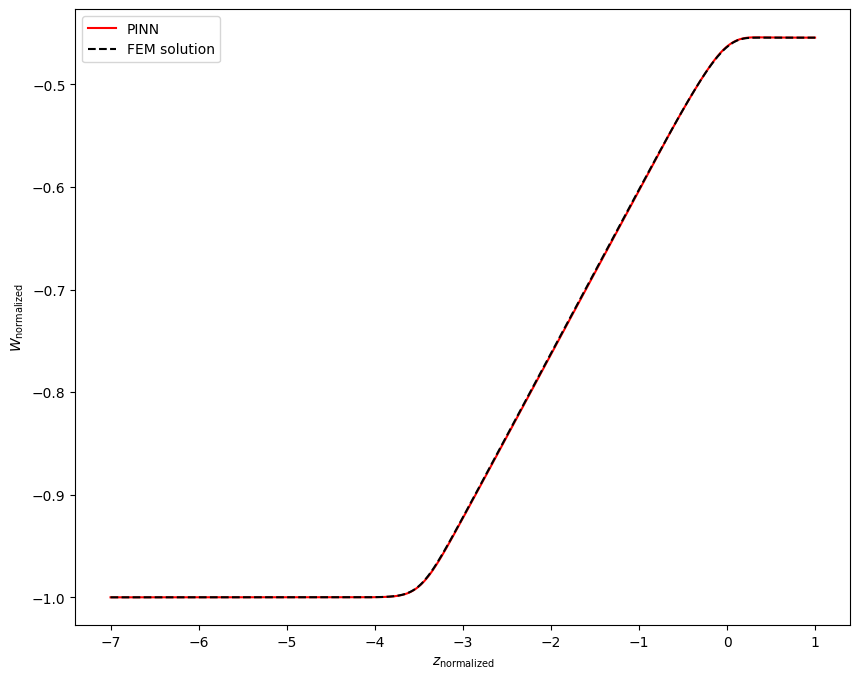


Epoch: 127000/400000
Loss: 0.061990924179553986
C_mean: -11.698122024536133
C_std: 0.024560216814279556
Loss ODE: 0.02465878240764141
Loss z0: 0.0
Loss zf: 0.0002907216548919678
KL divergence: 3.4424924850463867


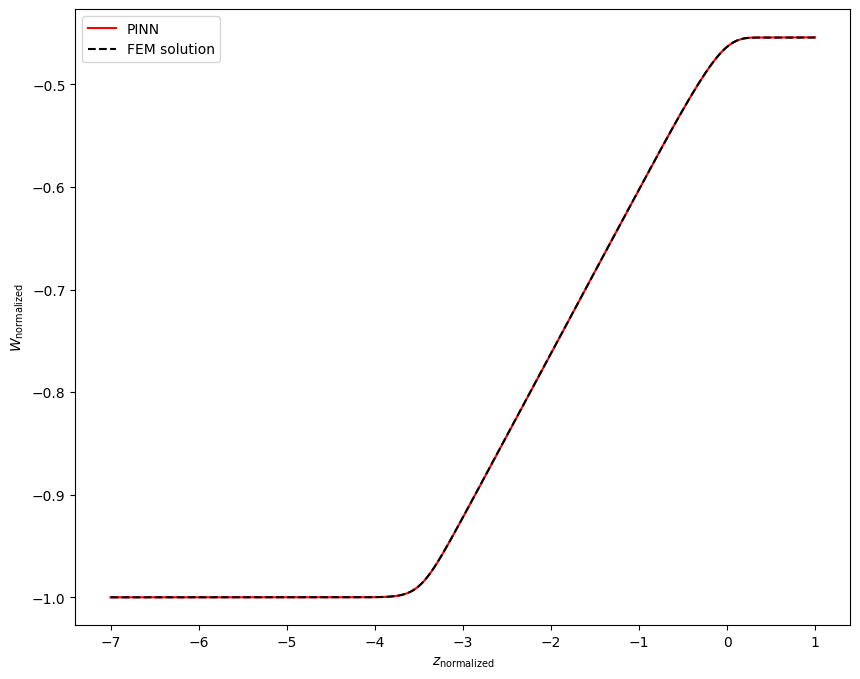


Epoch: 128000/400000
Loss: 0.044674813747406006
C_mean: -11.69873046875
C_std: 0.024570664390921593
Loss ODE: 0.008601097390055656
Loss z0: 0.0
Loss zf: 0.00016519427299499512
KL divergence: 3.4421772956848145


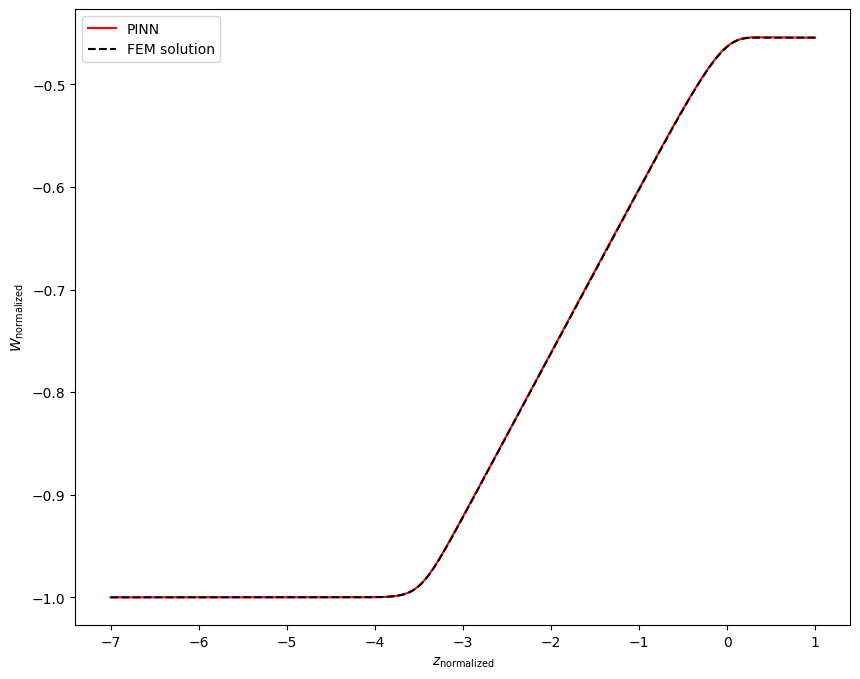


Epoch: 129000/400000
Loss: 0.058455854654312134
C_mean: -11.698026657104492
C_std: 0.024698618799448013
Loss ODE: 0.022911345586180687
Loss z0: 0.0
Loss zf: 0.00011757016181945801
KL divergence: 3.436880588531494


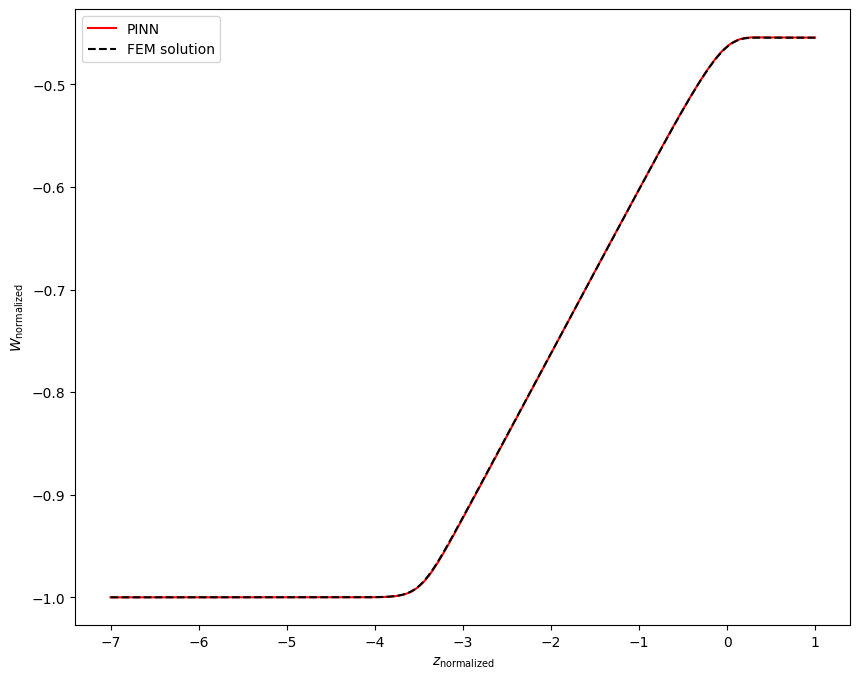


Epoch: 130000/400000
Loss: 0.049749553203582764
C_mean: -11.697819709777832
C_std: 0.024546558037400246
Loss ODE: 0.011044042184948921
Loss z0: 0.0
Loss zf: 0.00042748451232910156
KL divergence: 3.443066358566284


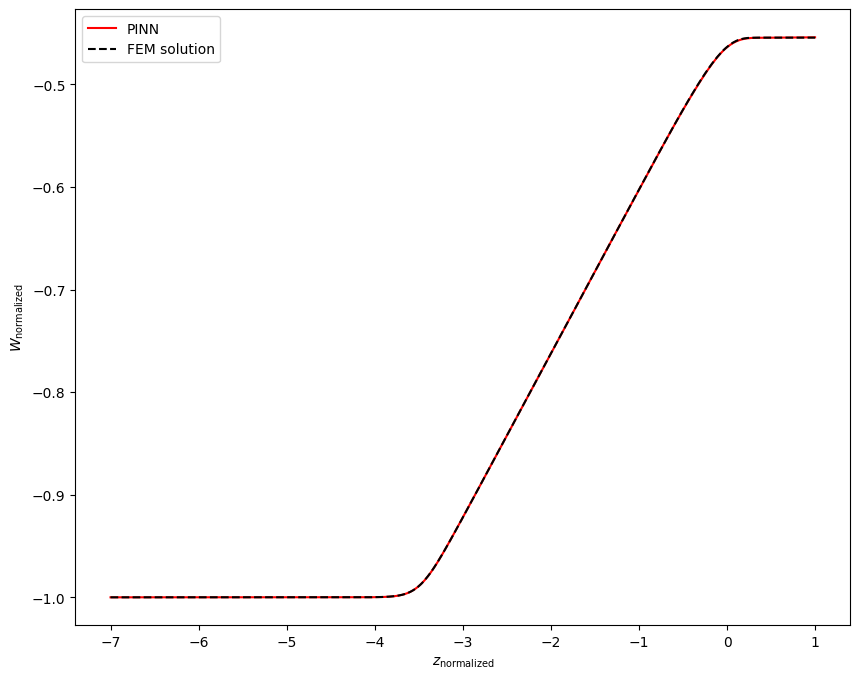


Epoch: 131000/400000
Loss: 0.08027423918247223
C_mean: -11.698158264160156
C_std: 0.024314582347869873
Loss ODE: 0.043340183794498444
Loss z0: 0.0
Loss zf: 0.00024080276489257812
KL divergence: 3.4526023864746094


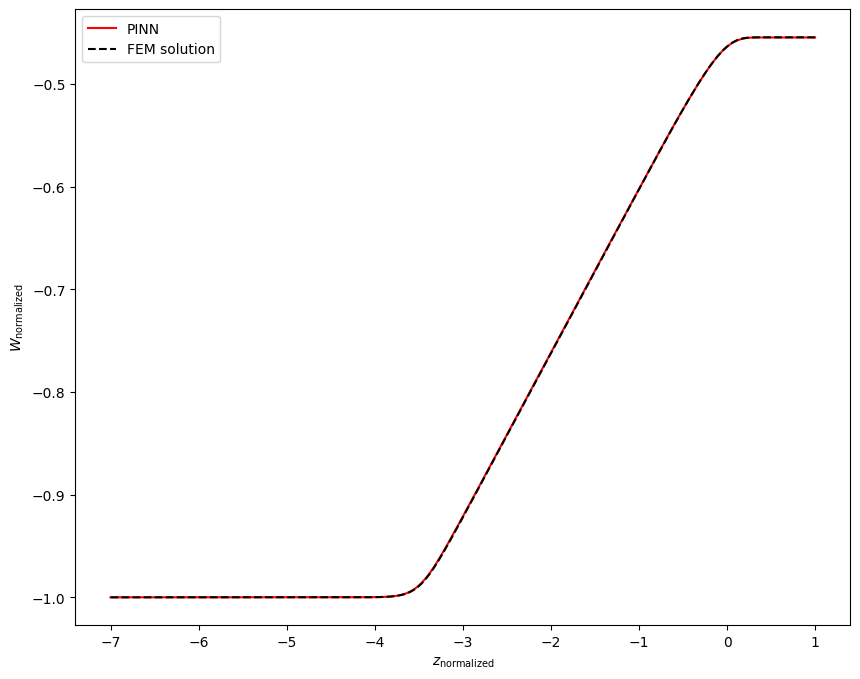


Epoch: 132000/400000
Loss: 0.07333829998970032
C_mean: -11.697473526000977
C_std: 0.02438652329146862
Loss ODE: 0.030695553869009018
Loss z0: 0.0
Loss zf: 0.0008147656917572021
KL divergence: 3.4495091438293457


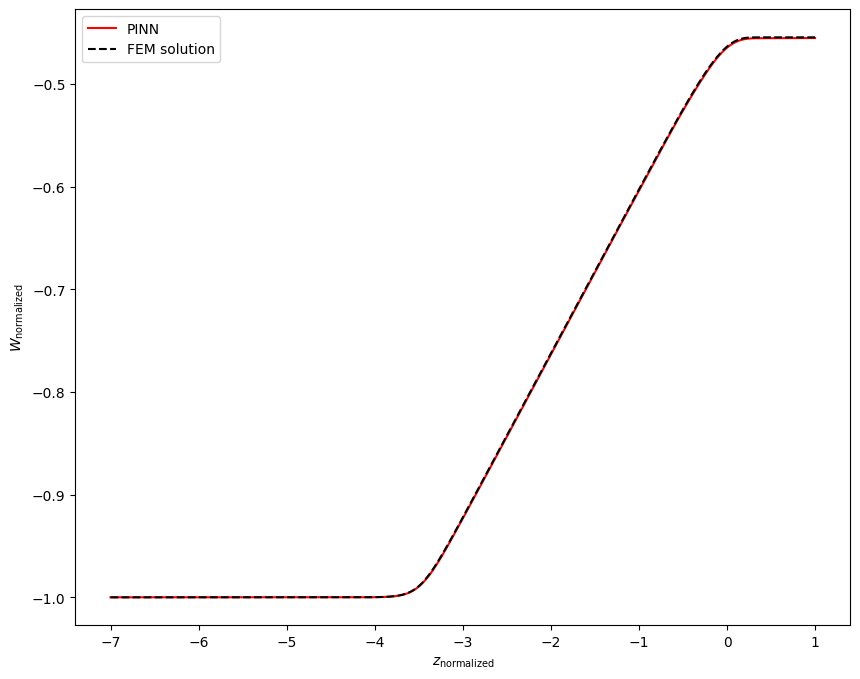


Epoch: 133000/400000
Loss: 0.07068923115730286
C_mean: -11.697880744934082
C_std: 0.0241318978369236
Loss ODE: 0.025359593331813812
Loss z0: 0.0
Loss zf: 0.0010728538036346436
KL divergence: 3.4601101875305176


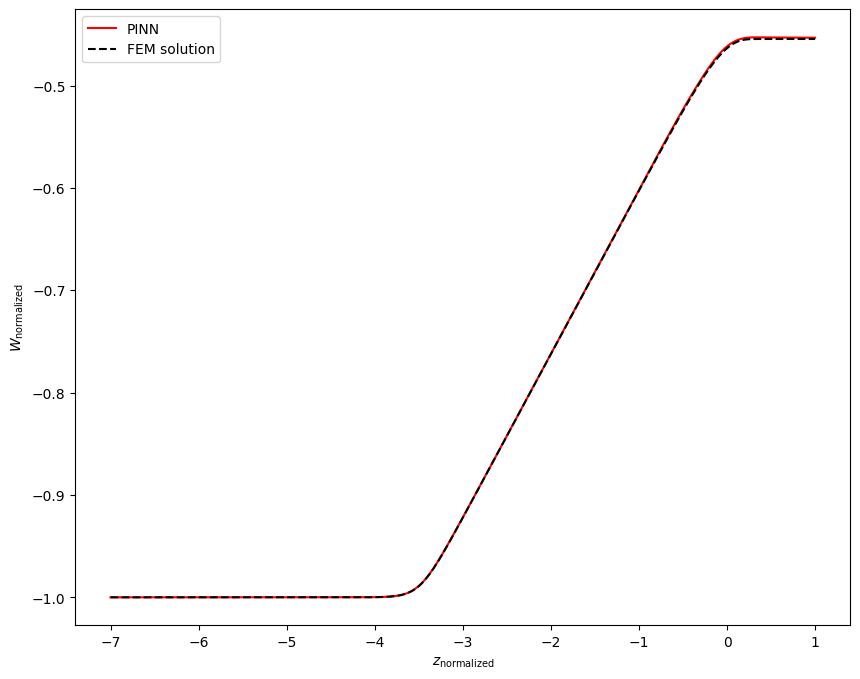


Epoch: 134000/400000
Loss: 0.053584691137075424
C_mean: -11.698017120361328
C_std: 0.02428821101784706
Loss ODE: 0.013846728019416332
Loss z0: 0.0
Loss zf: 0.0005201399326324463
KL divergence: 3.4536564350128174


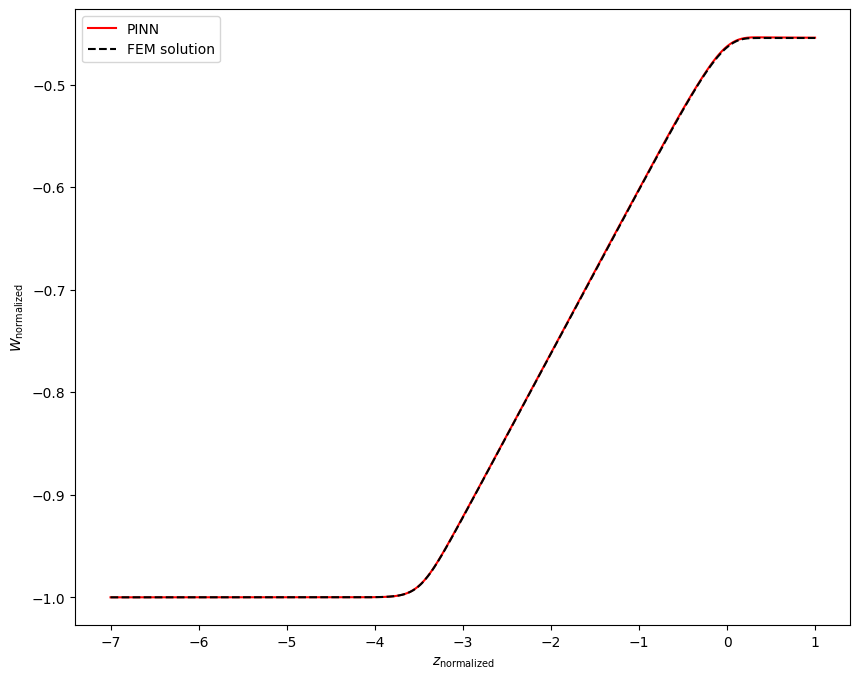


Epoch: 135000/400000
Loss: 0.053166713565588
C_mean: -11.69739818572998
C_std: 0.024033198133111
Loss ODE: 0.014241829514503479
Loss z0: 0.0
Loss zf: 0.0004283487796783447
KL divergence: 3.464139699935913


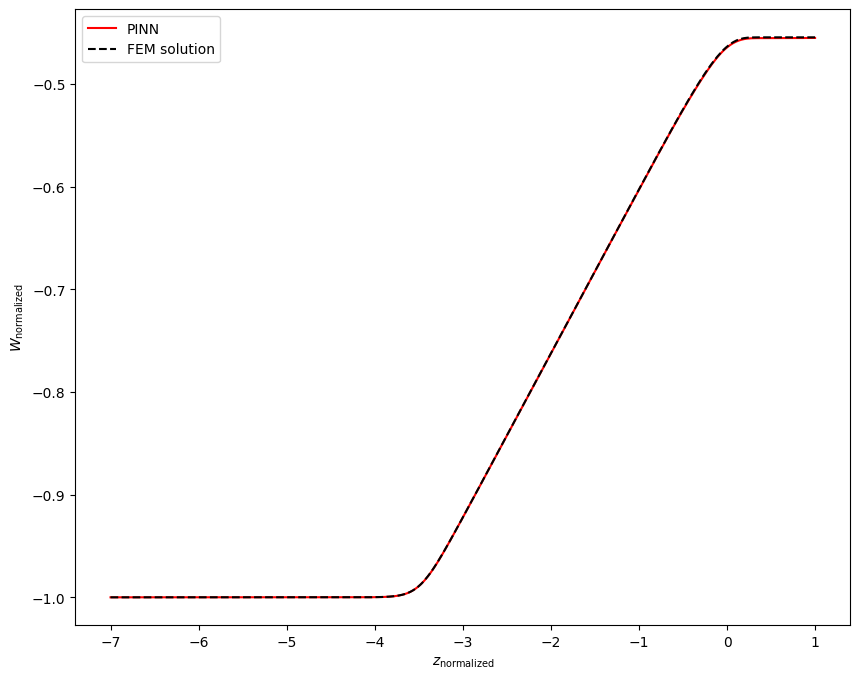


Epoch: 136000/400000
Loss: 0.0436670184135437
C_mean: -11.698330879211426
C_std: 0.024022936820983887
Loss ODE: 0.008369636721909046
Loss z0: 0.0
Loss zf: 6.505846977233887e-05
KL divergence: 3.464679718017578


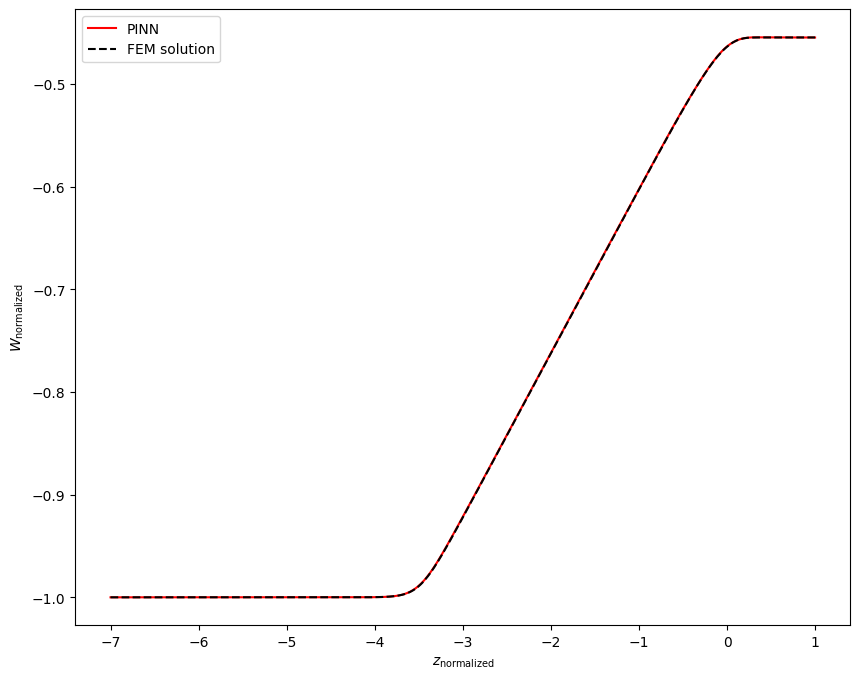


Epoch: 137000/400000
Loss: 0.055525872856378555
C_mean: -11.697856903076172
C_std: 0.02403411455452442
Loss ODE: 0.018145427107810974
Loss z0: 0.0
Loss zf: 0.0002739131450653076
KL divergence: 3.4641313552856445


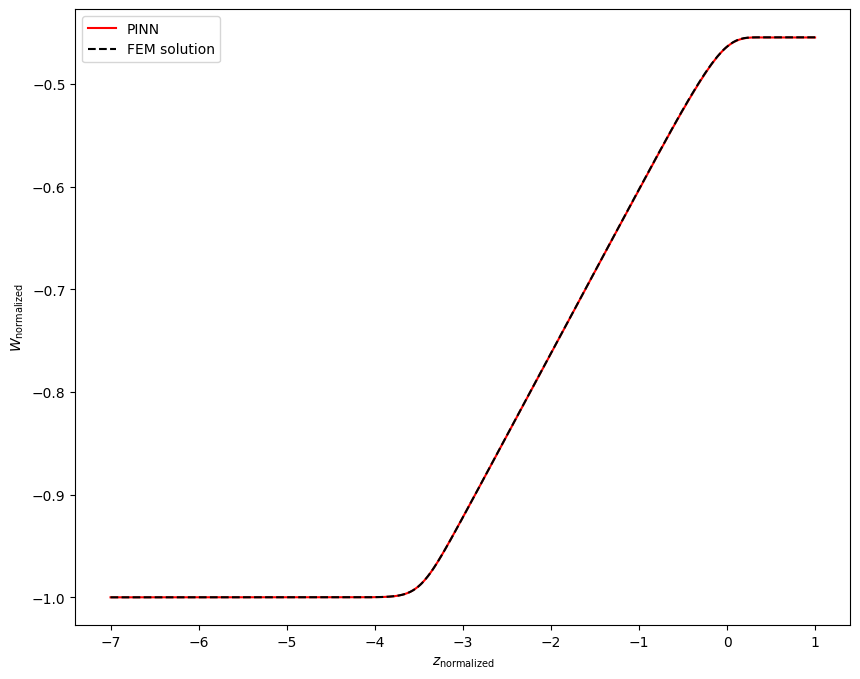


Epoch: 138000/400000
Loss: 0.055754341185092926
C_mean: -11.697652816772461
C_std: 0.024059653282165527
Loss ODE: 0.018551776185631752
Loss z0: 0.0
Loss zf: 0.00025719404220581055
KL divergence: 3.463062286376953


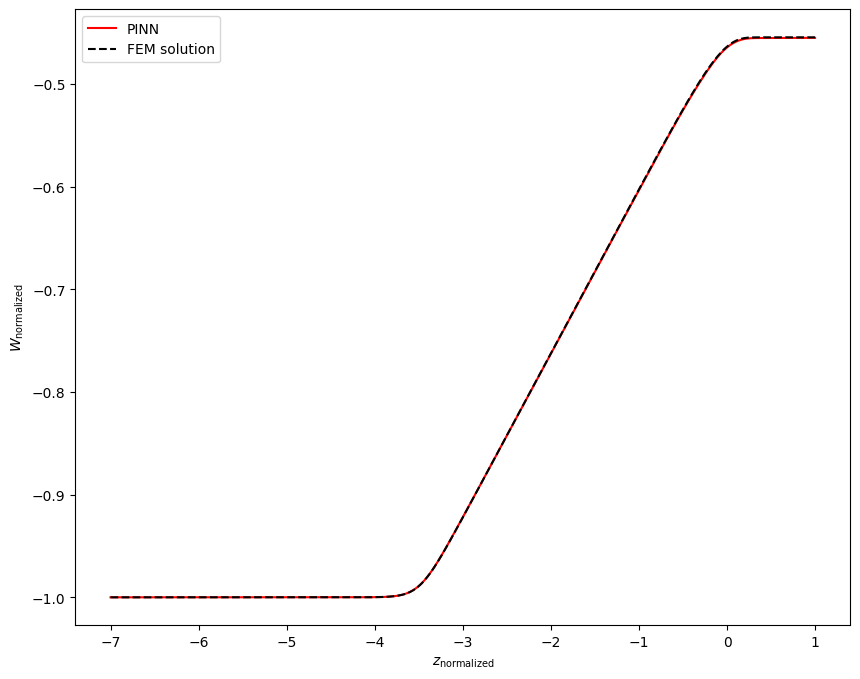


Epoch: 139000/400000
Loss: 0.07033385336399078
C_mean: -11.698099136352539
C_std: 0.02386004477739334
Loss ODE: 0.03360995650291443
Loss z0: 0.0
Loss zf: 0.0002009272575378418
KL divergence: 3.4714622497558594


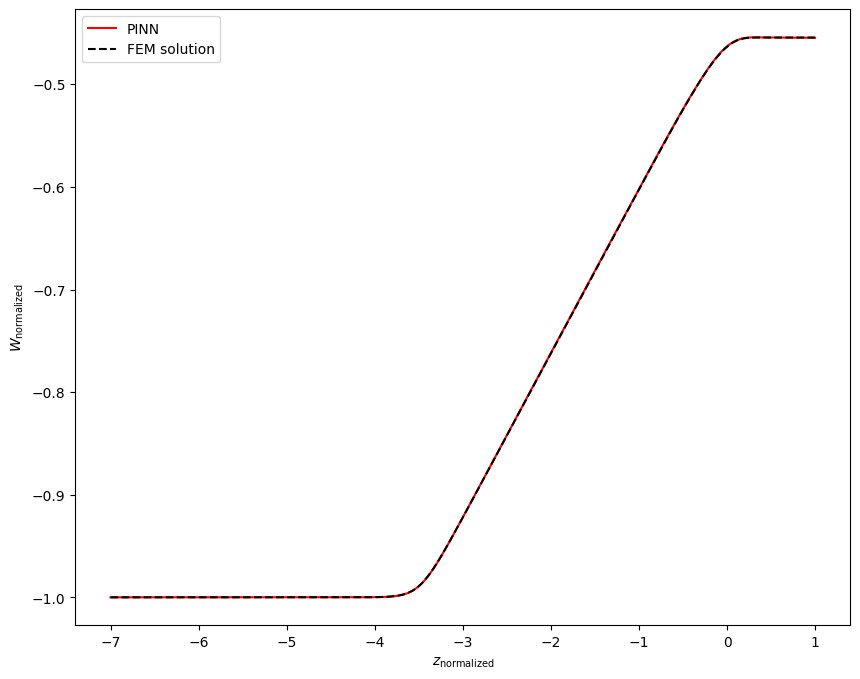


Epoch: 140000/400000
Loss: 0.0492592453956604
C_mean: -11.697798728942871
C_std: 0.023342866450548172
Loss ODE: 0.01220379862934351
Loss z0: 0.0
Loss zf: 0.00021222233772277832
KL divergence: 3.4933223724365234


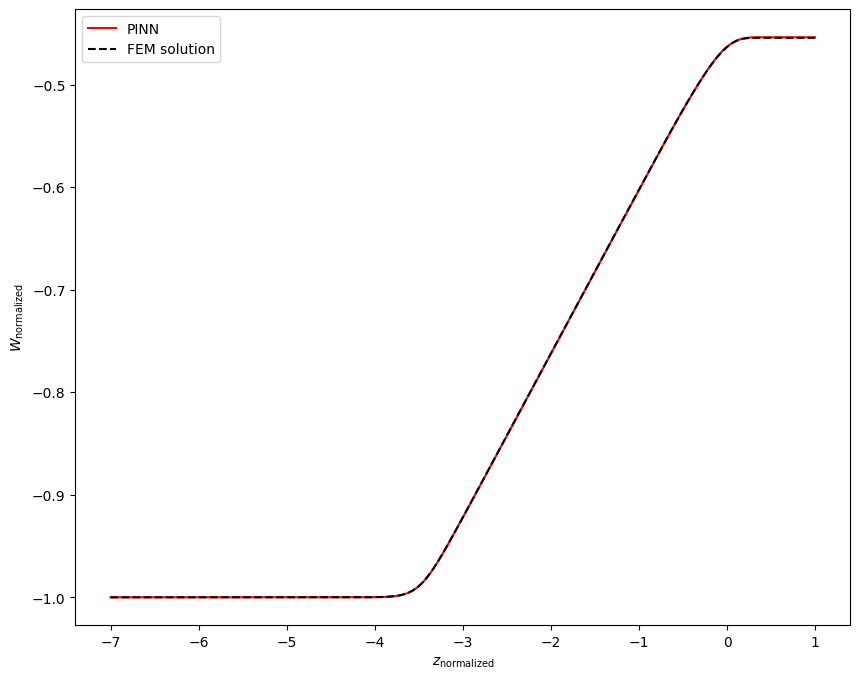


Epoch: 141000/400000
Loss: 0.05829932913184166
C_mean: -11.697484970092773
C_std: 0.023181499913334846
Loss ODE: 0.02325977385044098
Loss z0: 0.0
Loss zf: 3.7848949432373047e-06
KL divergence: 3.5001707077026367


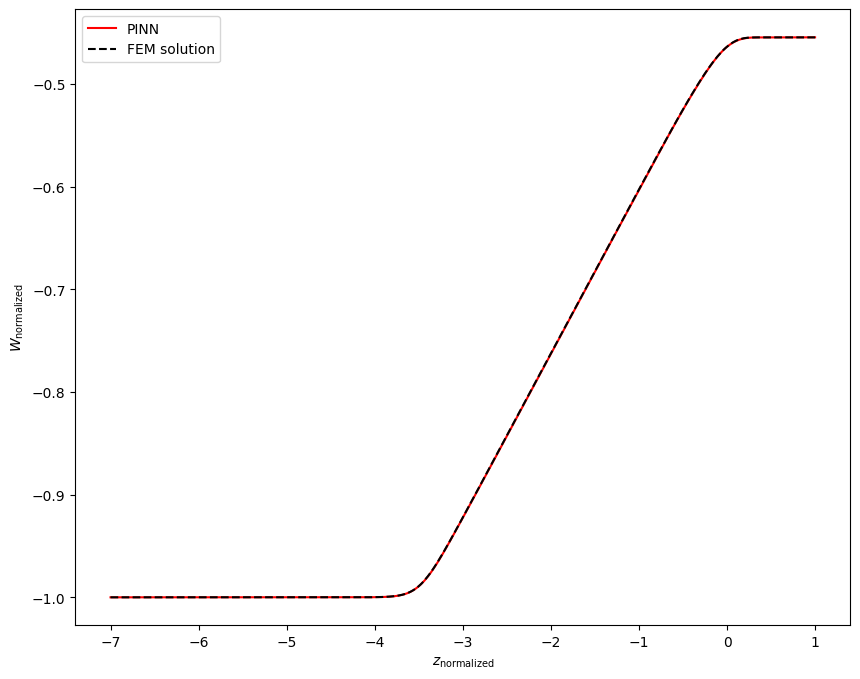


Epoch: 142000/400000
Loss: 0.07959487289190292
C_mean: -11.697709083557129
C_std: 0.023264411836862564
Loss ODE: 0.040700722485780716
Loss z0: 0.0
Loss zf: 0.00039273500442504883
KL divergence: 3.49668025970459


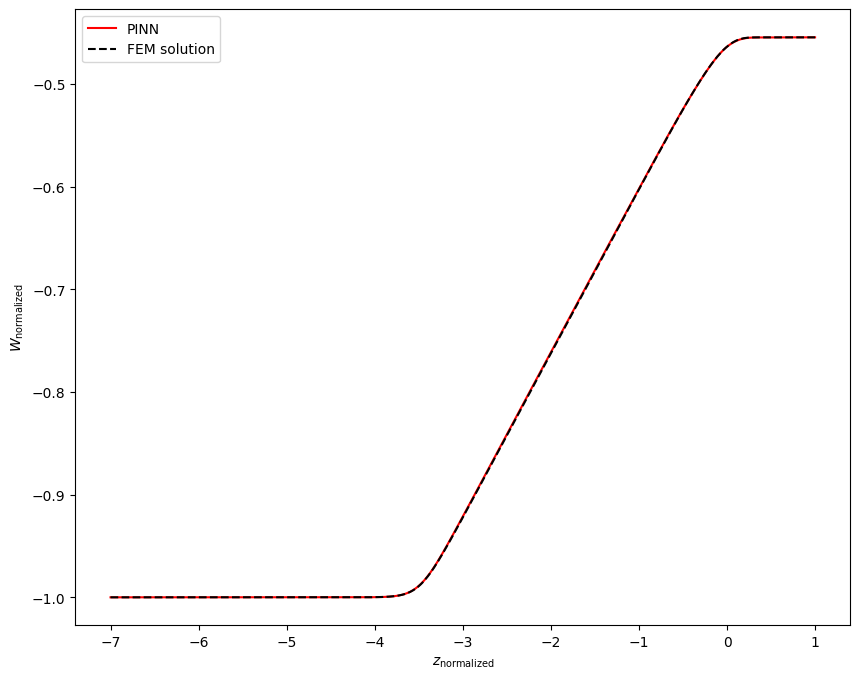


Epoch: 143000/400000
Loss: 0.05407893657684326
C_mean: -11.6979341506958
C_std: 0.02335718832910061
Loss ODE: 0.011445934884250164
Loss z0: 0.0
Loss zf: 0.0007705986499786377
KL divergence: 3.492701530456543


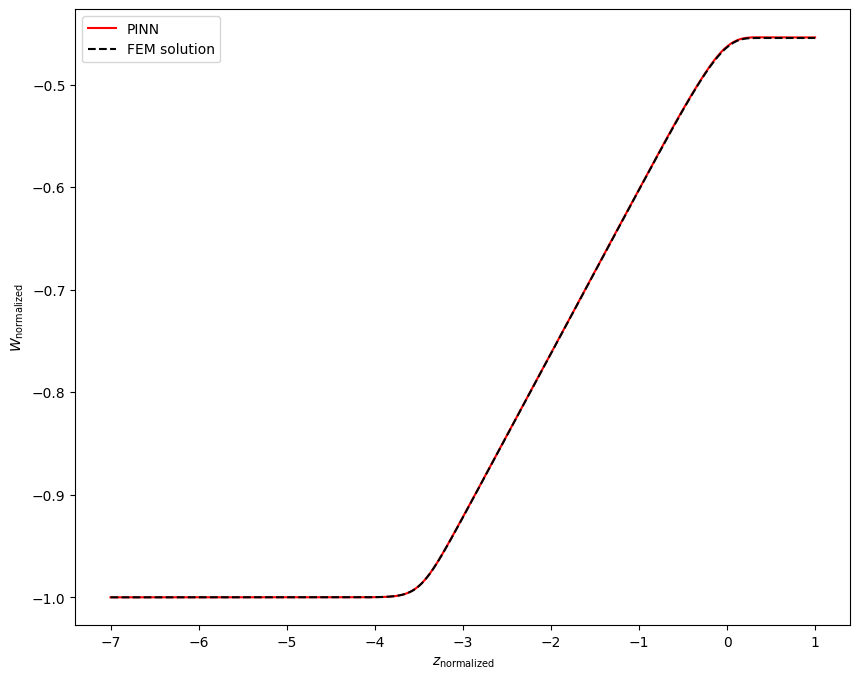


Epoch: 144000/400000
Loss: 0.04936647415161133
C_mean: -11.697684288024902
C_std: 0.023568173870444298
Loss ODE: 0.009782647714018822
Loss z0: 0.0
Loss zf: 0.00047469139099121094
KL divergence: 3.483691692352295


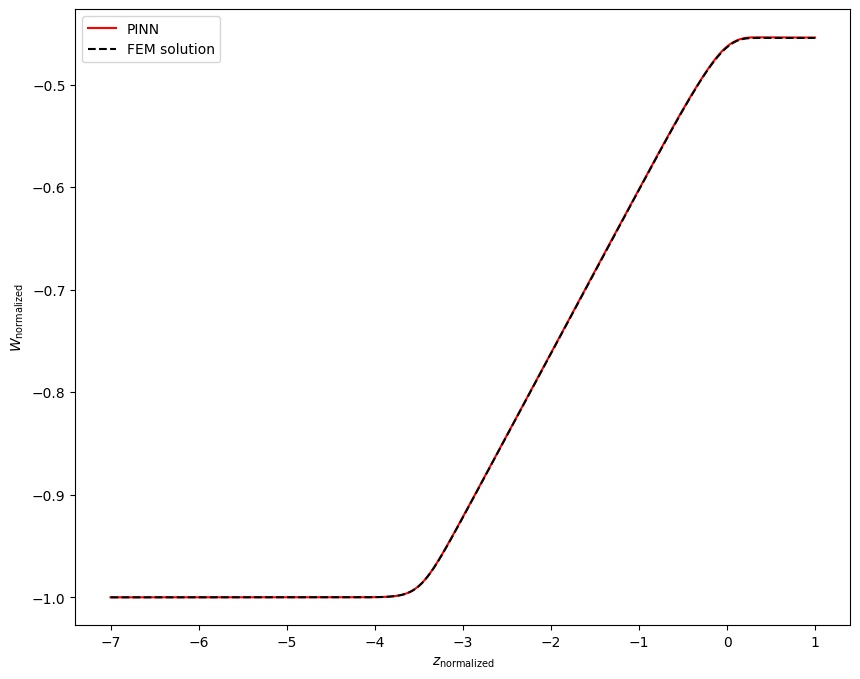


Epoch: 145000/400000
Loss: 0.05392751097679138
C_mean: -11.697545051574707
C_std: 0.02367161214351654
Loss ODE: 0.014152447693049908
Loss z0: 0.0
Loss zf: 0.0004982352256774902
KL divergence: 3.479271173477173


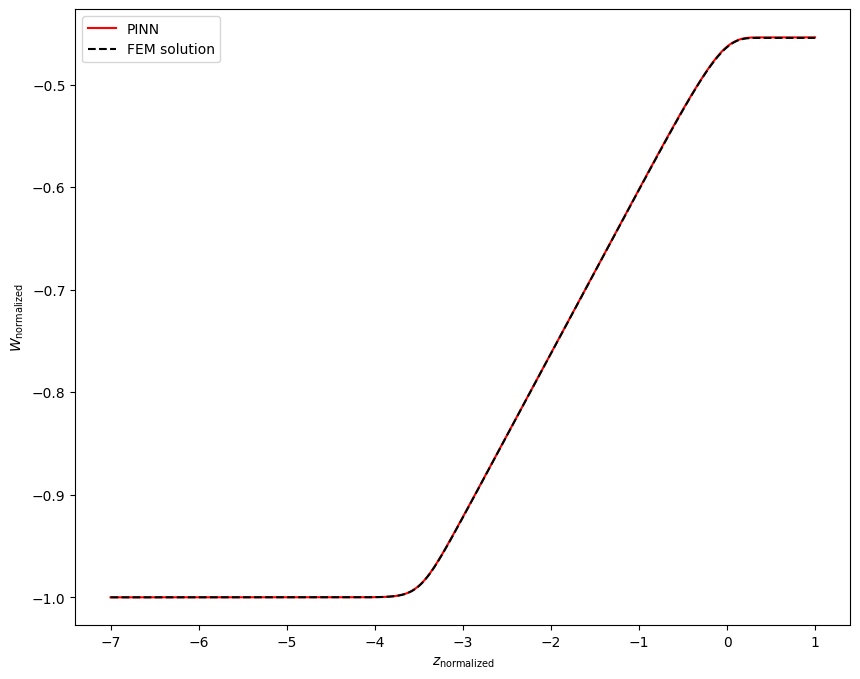


Epoch: 146000/400000
Loss: 0.06345531344413757
C_mean: -11.697416305541992
C_std: 0.02354573830962181
Loss ODE: 0.02299904264509678
Loss z0: 0.0
Loss zf: 0.0005610287189483643
KL divergence: 3.484598398208618


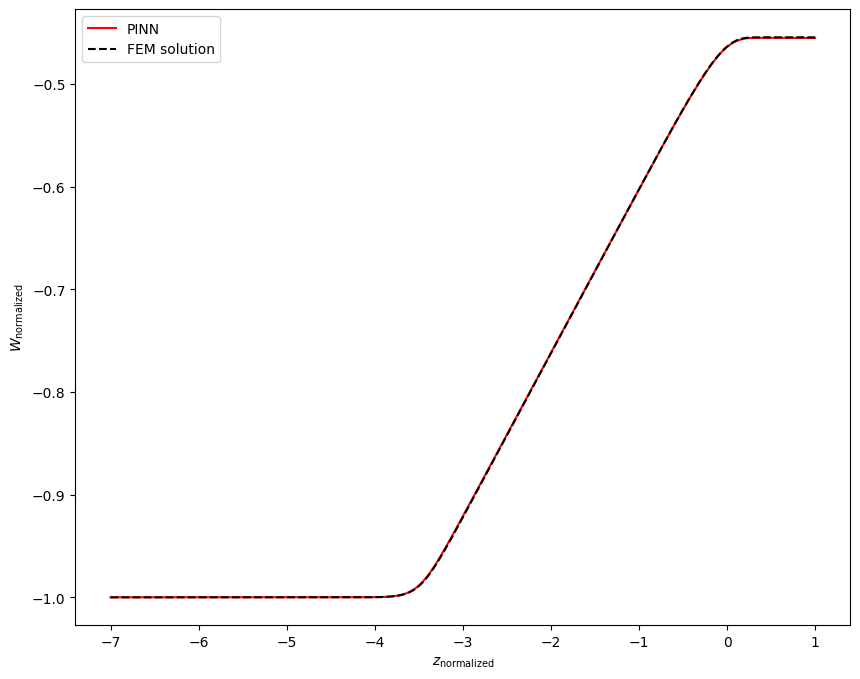


Epoch: 147000/400000
Loss: 0.057479314506053925
C_mean: -11.697392463684082
C_std: 0.023419156670570374
Loss ODE: 0.020341781899333
Loss z0: 0.0
Loss zf: 0.0002237856388092041
KL divergence: 3.4899673461914062


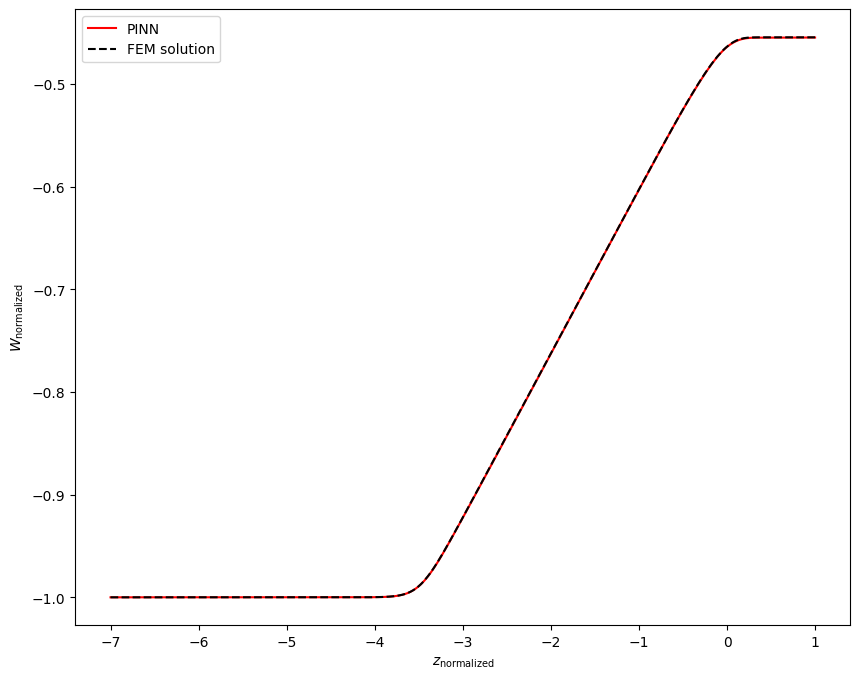


Epoch: 148000/400000
Loss: 0.057891540229320526
C_mean: -11.697822570800781
C_std: 0.023285072296857834
Loss ODE: 0.015712952241301537
Loss z0: 0.0
Loss zf: 0.0007220804691314697
KL divergence: 3.4957780838012695


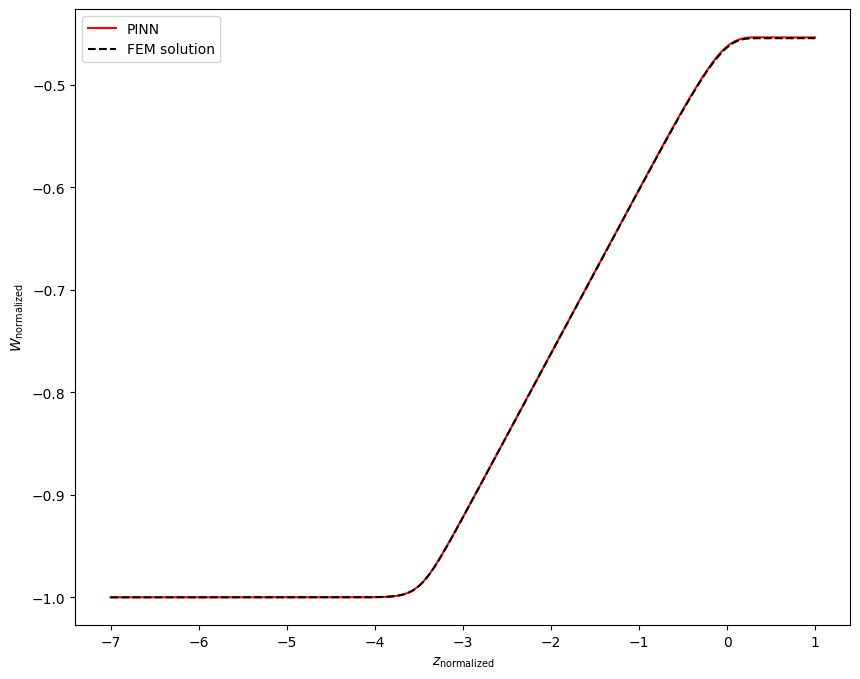


Epoch: 149000/400000
Loss: 0.09268389642238617
C_mean: -11.697537422180176
C_std: 0.023141568526625633
Loss ODE: 0.05307722091674805
Loss z0: 0.0
Loss zf: 0.00045871734619140625
KL divergence: 3.501950263977051


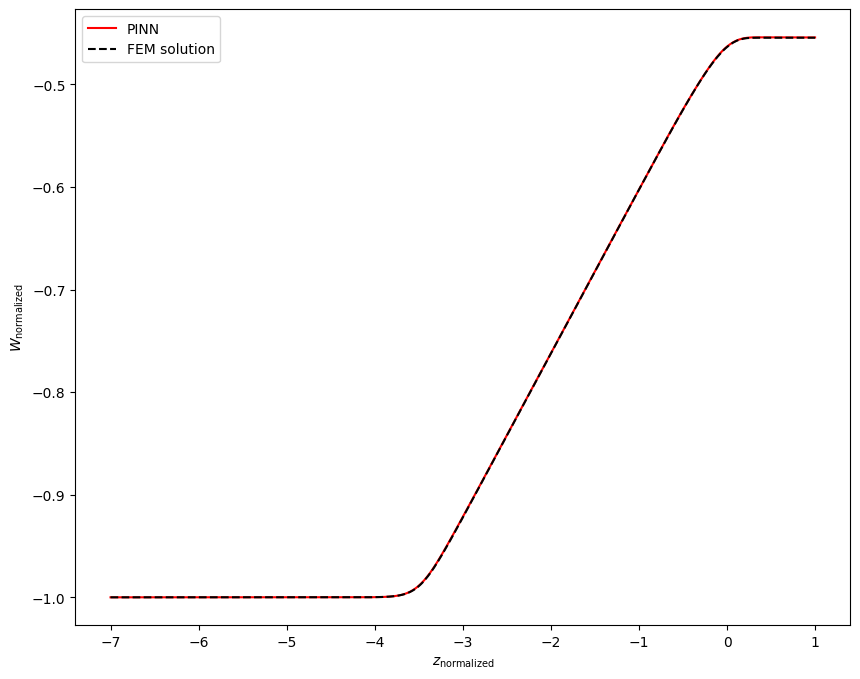


Epoch: 150000/400000
Loss: 0.06797805428504944
C_mean: -11.697437286376953
C_std: 0.022824108600616455
Loss ODE: 0.03261247277259827
Loss z0: 0.0
Loss zf: 2.086162567138672e-05
KL divergence: 3.5156970024108887


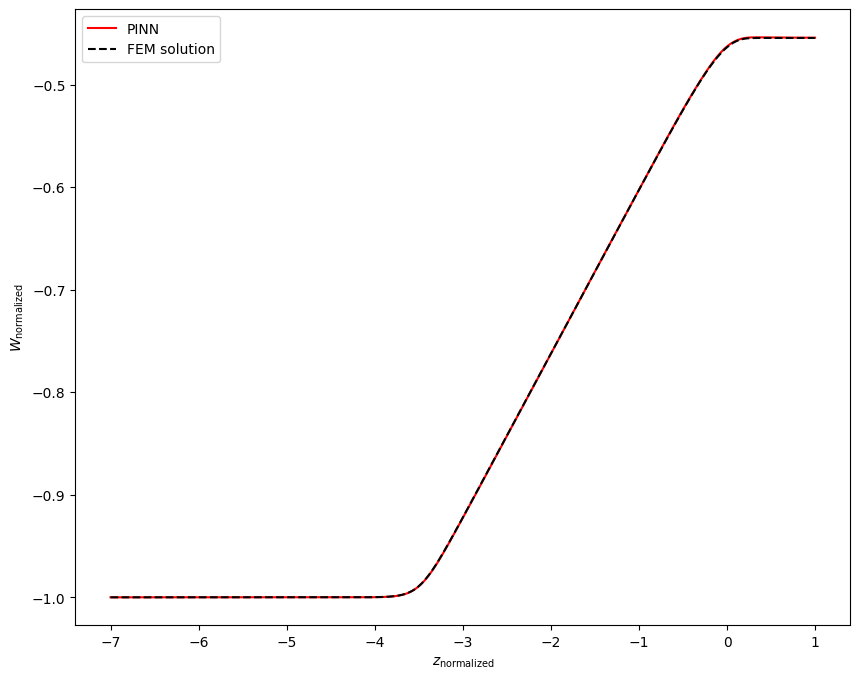


Epoch: 151000/400000
Loss: 0.050713084638118744
C_mean: -11.697179794311523
C_std: 0.023151300847530365
Loss ODE: 0.010873977094888687
Loss z0: 0.0
Loss zf: 0.0004824399948120117
KL divergence: 3.5014708042144775


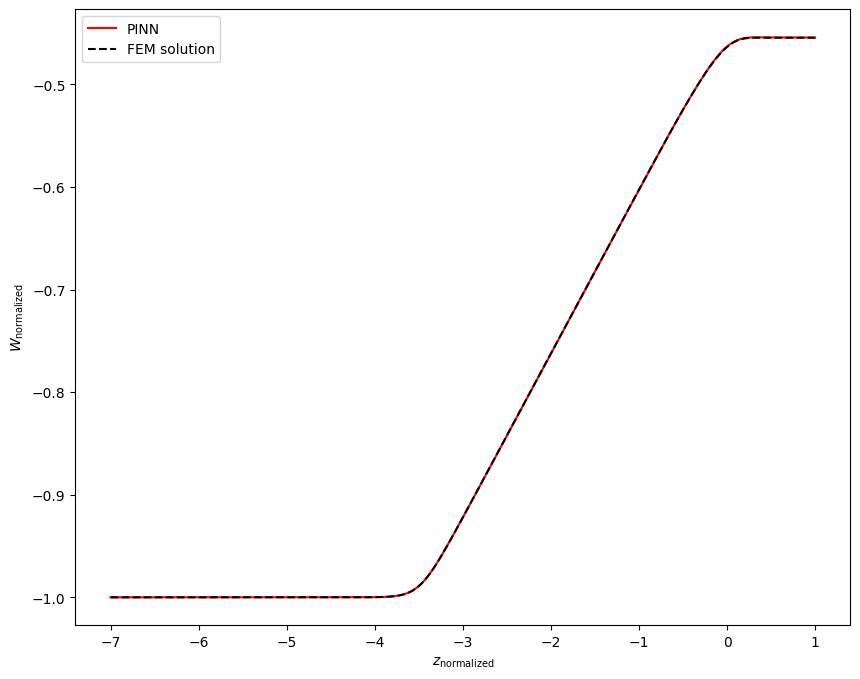


Epoch: 152000/400000
Loss: 0.04878959059715271
C_mean: -11.697713851928711
C_std: 0.02293277159333229
Loss ODE: 0.012982850894331932
Loss z0: 0.0
Loss zf: 6.964802742004395e-05
KL divergence: 3.511025905609131


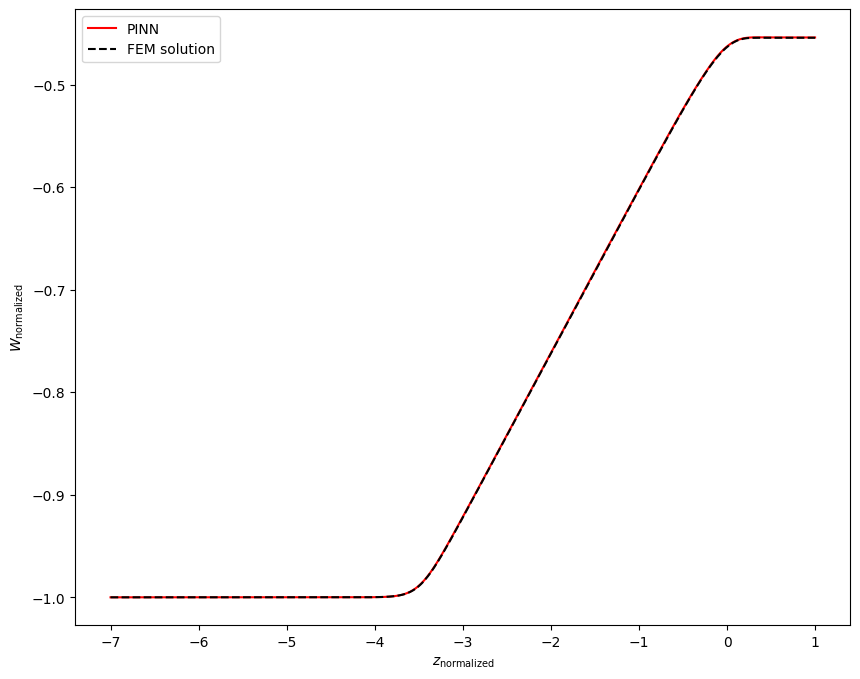


Epoch: 153000/400000
Loss: 0.08843384683132172
C_mean: -11.697863578796387
C_std: 0.02274683490395546
Loss ODE: 0.05004260689020157
Loss z0: 0.0
Loss zf: 0.00031998753547668457
KL divergence: 3.519136905670166


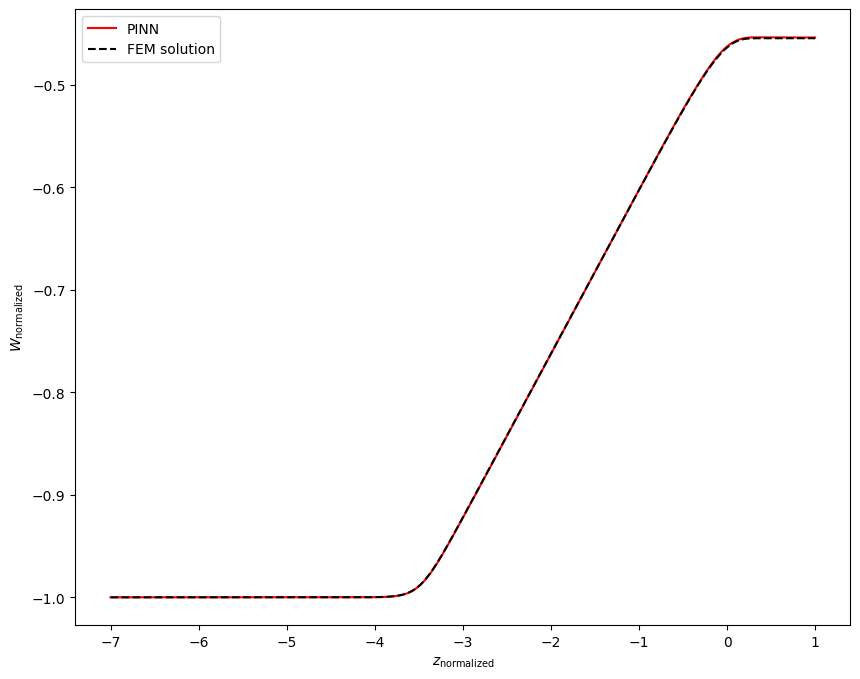


Epoch: 154000/400000
Loss: 0.06603902578353882
C_mean: -11.697283744812012
C_std: 0.022496098652482033
Loss ODE: 0.030284319072961807
Loss z0: 0.0
Loss zf: 4.526972770690918e-05
KL divergence: 3.5302014350891113


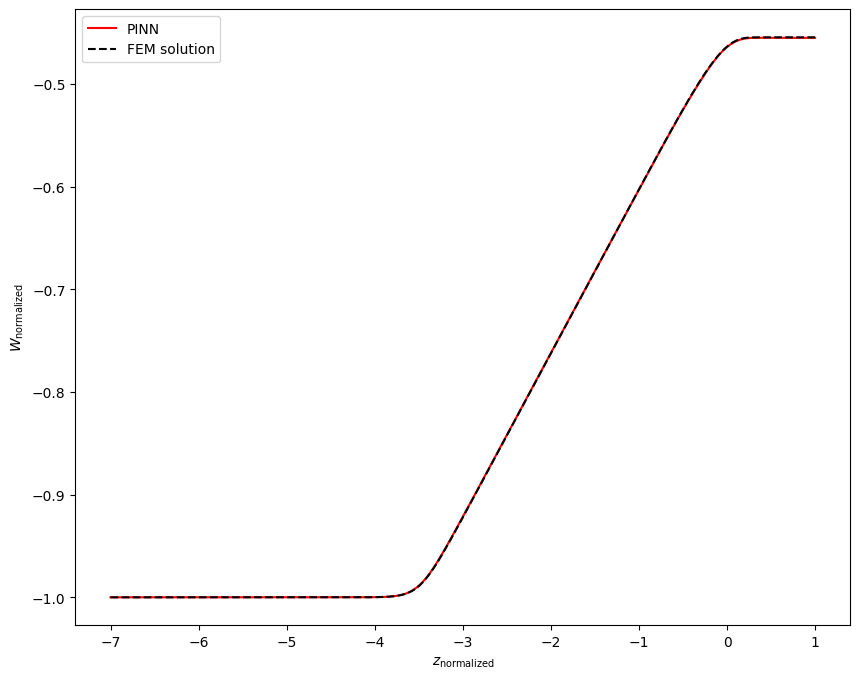


Epoch: 155000/400000
Loss: 0.049583014100790024
C_mean: -11.697440147399902
C_std: 0.022604405879974365
Loss ODE: 0.0114138787612319
Loss z0: 0.0
Loss zf: 0.00029149651527404785
KL divergence: 3.525416851043701


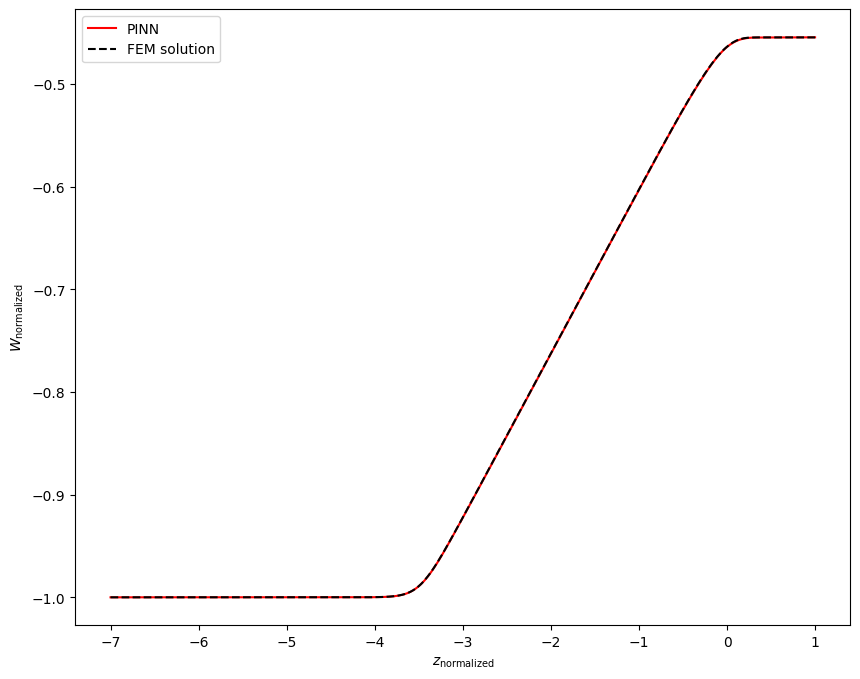


Epoch: 156000/400000
Loss: 0.054296404123306274
C_mean: -11.697997093200684
C_std: 0.022686442360281944
Loss ODE: 0.013826836831867695
Loss z0: 0.0
Loss zf: 0.0005251467227935791
KL divergence: 3.521810293197632


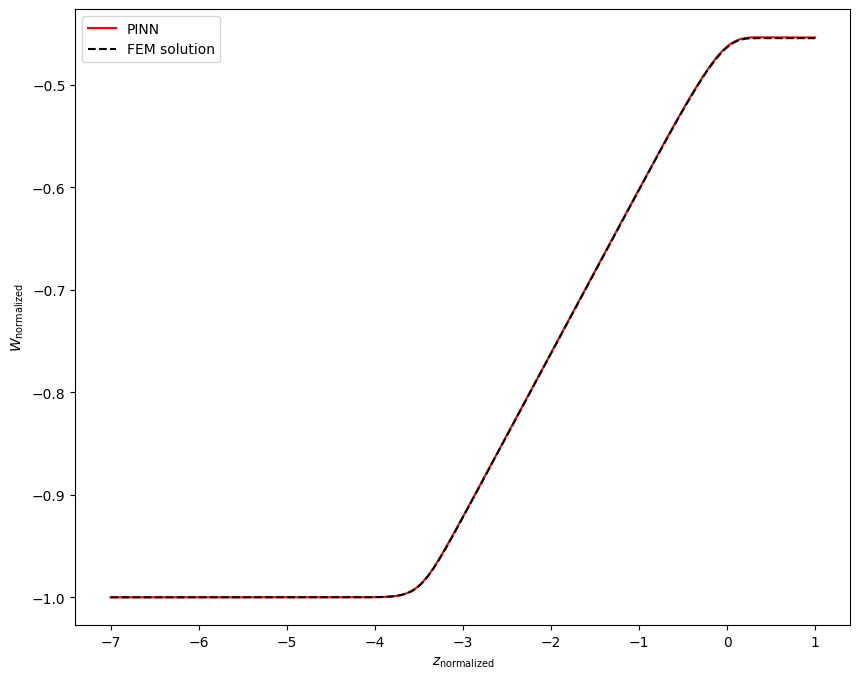


Epoch: 157000/400000
Loss: 0.06352651119232178
C_mean: -11.697582244873047
C_std: 0.022727133706212044
Loss ODE: 0.021060816943645477
Loss z0: 0.0
Loss zf: 0.0007265806198120117
KL divergence: 3.519988775253296


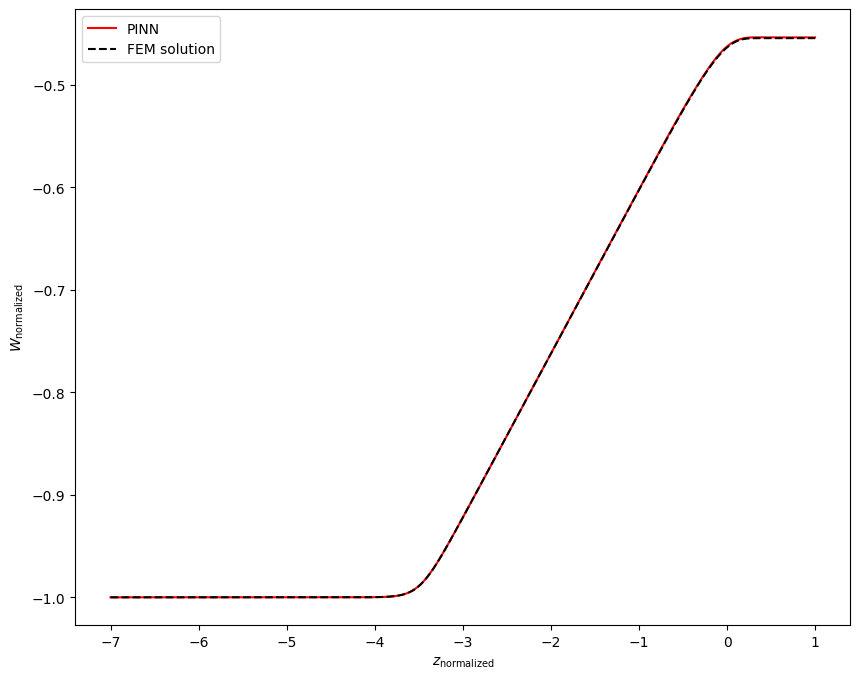


Epoch: 158000/400000
Loss: 0.058144956827163696
C_mean: -11.696876525878906
C_std: 0.02282409742474556
Loss ODE: 0.019881898537278175
Loss z0: 0.0
Loss zf: 0.00031062960624694824
KL divergence: 3.5156760215759277


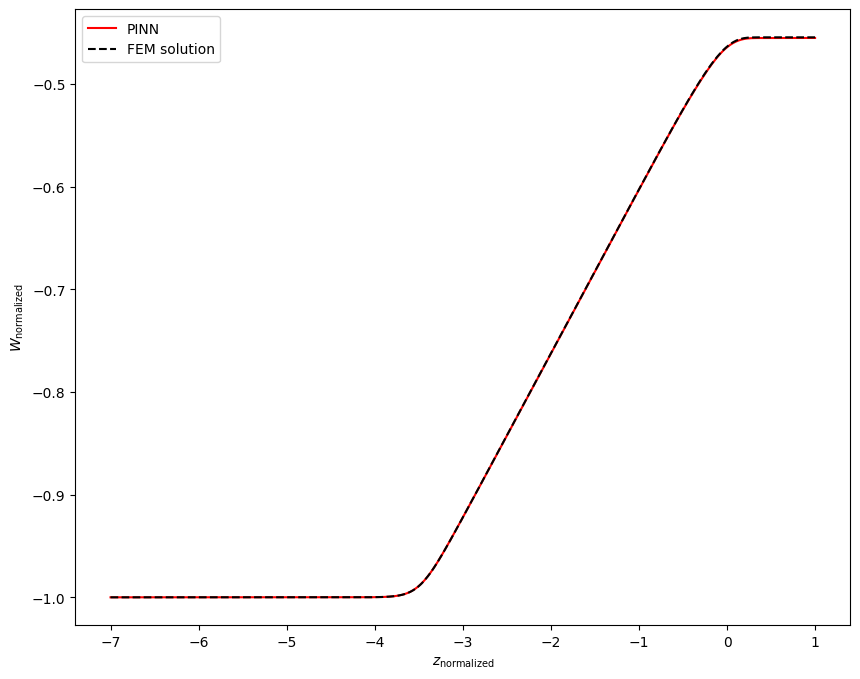


Epoch: 159000/400000
Loss: 0.04579392448067665
C_mean: -11.696455955505371
C_std: 0.022595928981900215
Loss ODE: 0.008079041726887226
Loss z0: 0.0
Loss zf: 0.00024583935737609863
KL divergence: 3.525649070739746


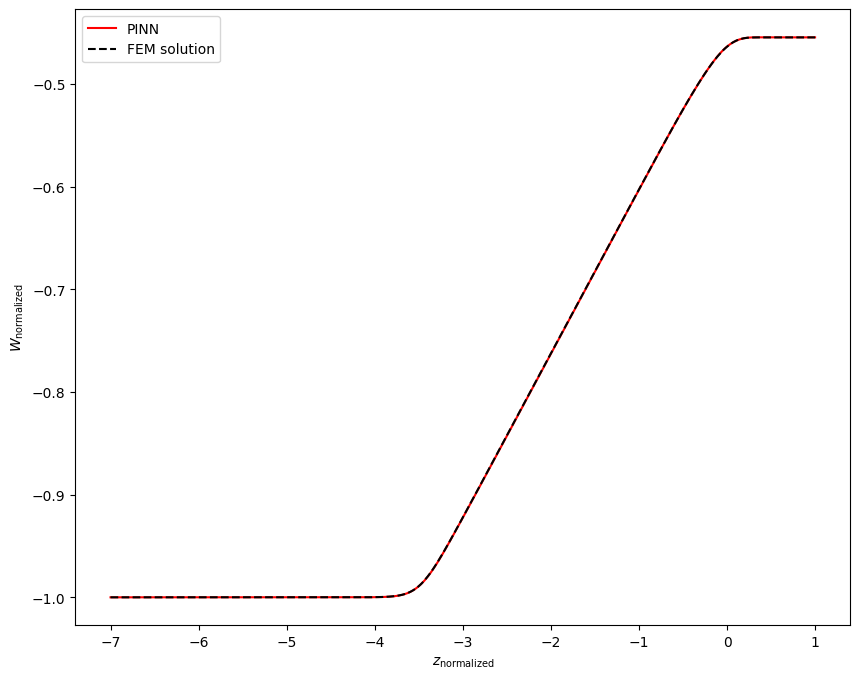


Epoch: 160000/400000
Loss: 0.08737845718860626
C_mean: -11.696930885314941
C_std: 0.022404493764042854
Loss ODE: 0.044928304851055145
Loss z0: 0.0
Loss zf: 0.0007107853889465332
KL divergence: 3.5342304706573486


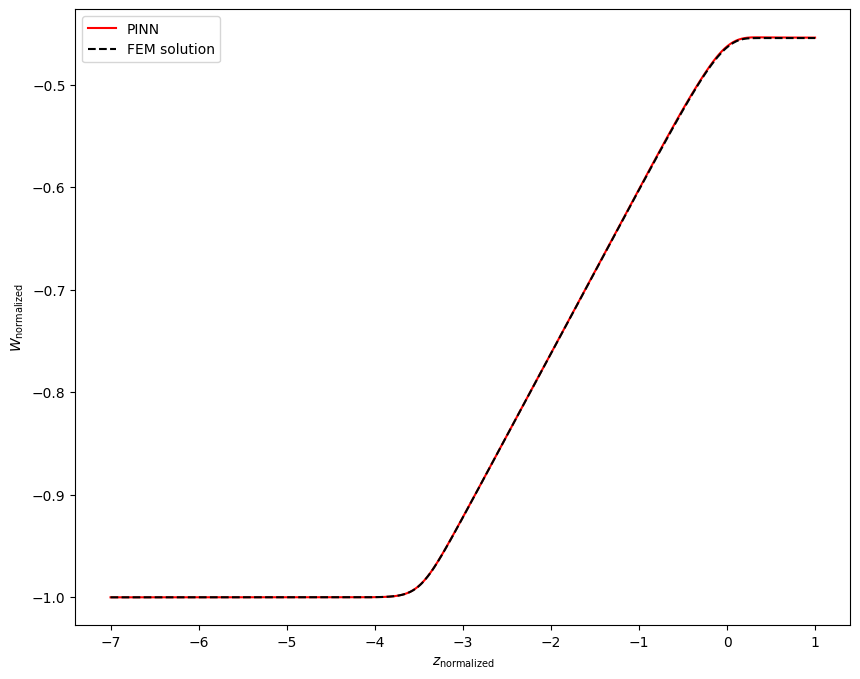


Epoch: 161000/400000
Loss: 0.06328850239515305
C_mean: -11.696885108947754
C_std: 0.02218538336455822
Loss ODE: 0.02076384238898754
Loss z0: 0.0
Loss zf: 0.000708460807800293
KL divergence: 3.5440049171447754


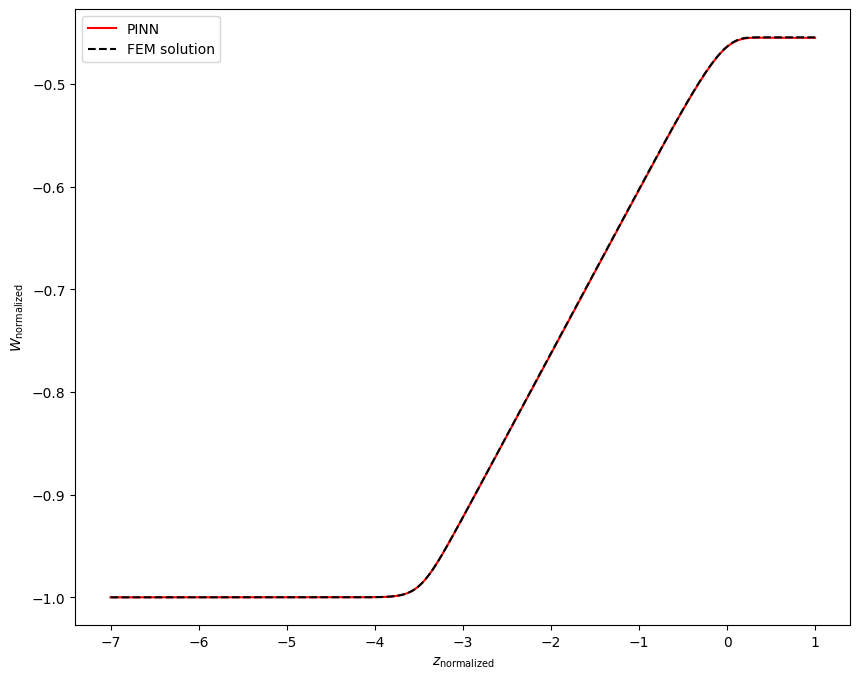


Epoch: 162000/400000
Loss: 0.07219249755144119
C_mean: -11.69677734375
C_std: 0.022148819640278816
Loss ODE: 0.02992805652320385
Loss z0: 0.0
Loss zf: 0.0006808042526245117
KL divergence: 3.545639753341675


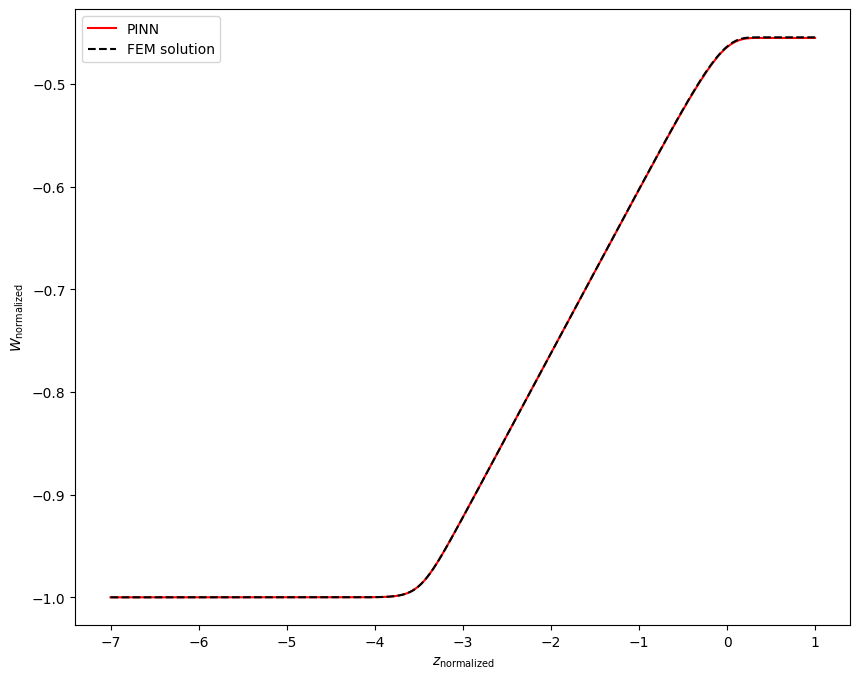


Epoch: 163000/400000
Loss: 0.06652426719665527
C_mean: -11.696964263916016
C_std: 0.022146616131067276
Loss ODE: 0.02745014801621437
Loss z0: 0.0
Loss zf: 0.0003616511821746826
KL divergence: 3.5457613468170166


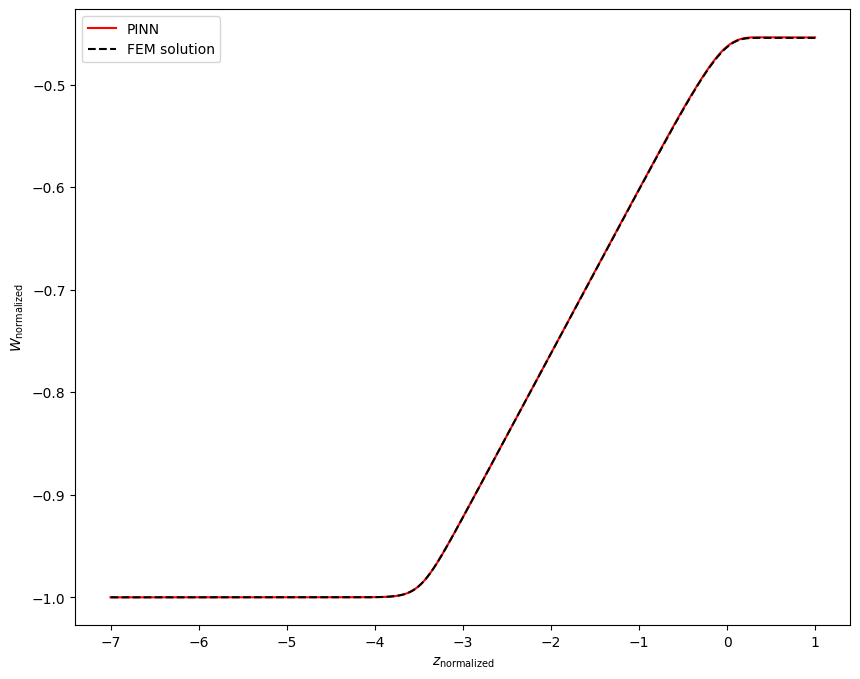


Epoch: 164000/400000
Loss: 0.07048757374286652
C_mean: -11.696845054626465
C_std: 0.022222453728318214
Loss ODE: 0.02900802344083786
Loss z0: 0.0
Loss zf: 0.0006055831909179688
KL divergence: 3.542372226715088


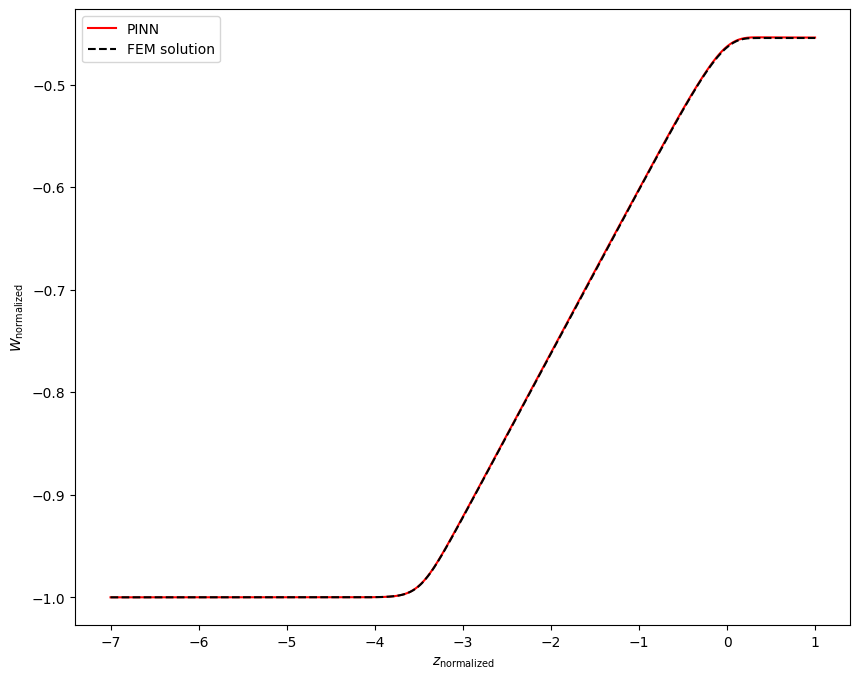


Epoch: 165000/400000
Loss: 0.08145804703235626
C_mean: -11.69644546508789
C_std: 0.022229859605431557
Loss ODE: 0.03766220062971115
Loss z0: 0.0
Loss zf: 0.0008375942707061768
KL divergence: 3.5419907569885254


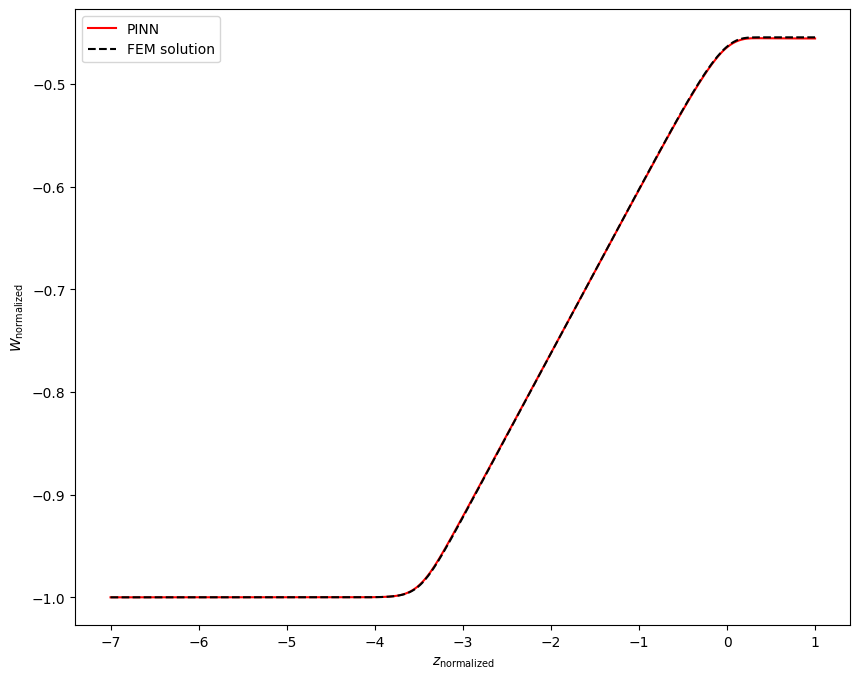


Epoch: 166000/400000
Loss: 0.07451601326465607
C_mean: -11.696481704711914
C_std: 0.022062525153160095
Loss ODE: 0.03709675744175911
Loss z0: 0.0
Loss zf: 0.00019237399101257324
KL divergence: 3.5495517253875732


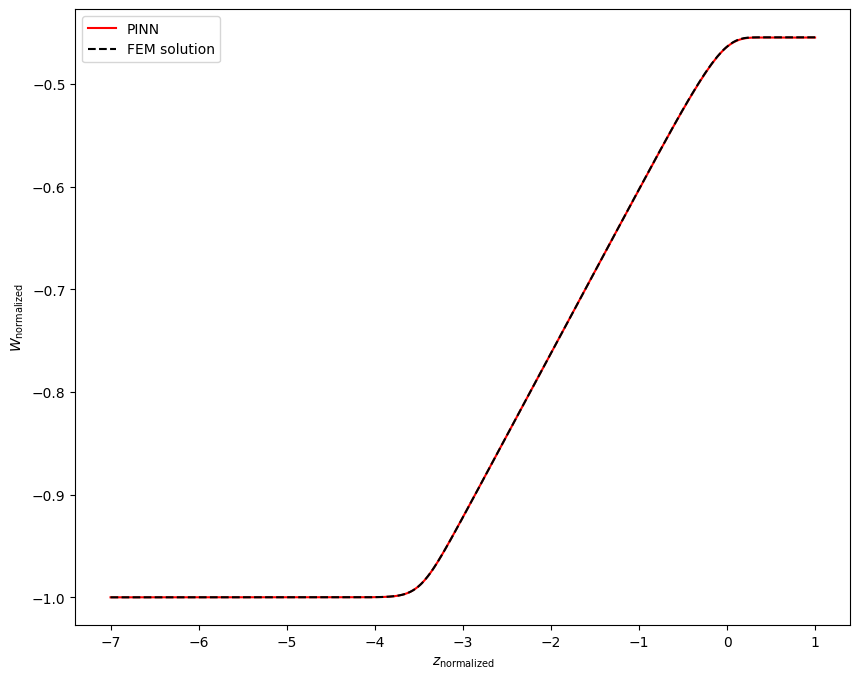


Epoch: 167000/400000
Loss: 0.11369816958904266
C_mean: -11.696791648864746
C_std: 0.021927759051322937
Loss ODE: 0.07739138603210449
Loss z0: 0.0
Loss zf: 7.50124454498291e-05
KL divergence: 3.555665969848633


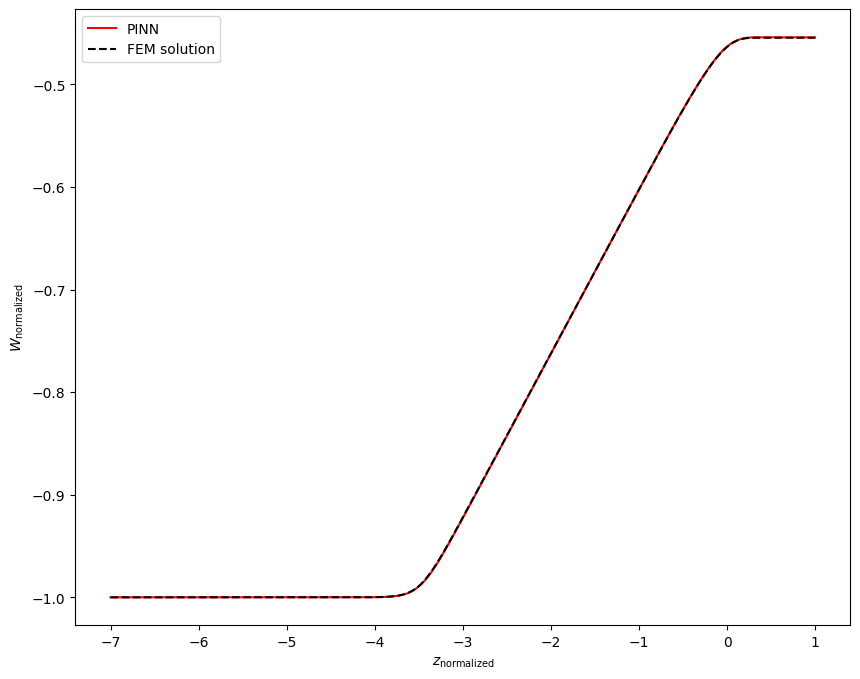


Epoch: 168000/400000
Loss: 0.09925508499145508
C_mean: -11.696609497070312
C_std: 0.022086484357714653
Loss ODE: 0.0582587830722332
Loss z0: 0.0
Loss zf: 0.0005511939525604248
KL divergence: 3.5484354496002197


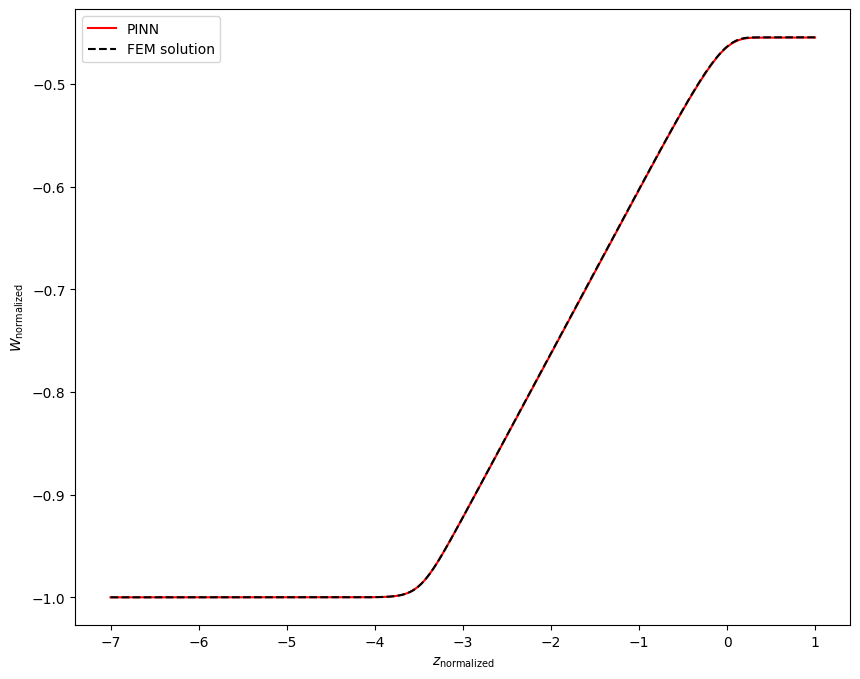


Epoch: 169000/400000
Loss: 0.0643414631485939
C_mean: -11.696611404418945
C_std: 0.021987874060869217
Loss ODE: 0.028663642704486847
Loss z0: 0.0
Loss zf: 1.4871358871459961e-05
KL divergence: 3.552910804748535


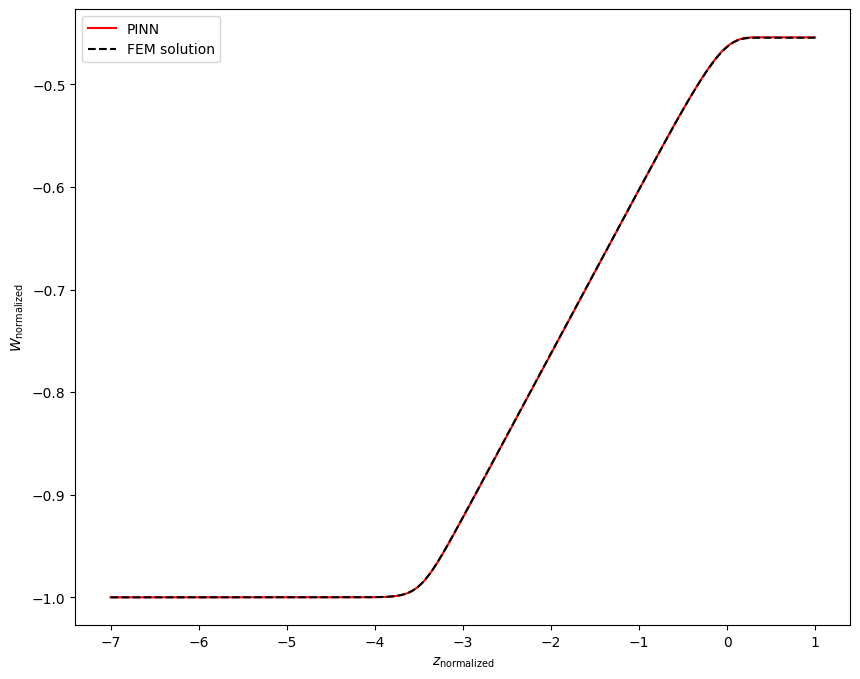


Epoch: 170000/400000
Loss: 0.047538433223962784
C_mean: -11.696746826171875
C_std: 0.02190352790057659
Loss ODE: 0.01005775760859251
Loss z0: 0.0
Loss zf: 0.00019127130508422852
KL divergence: 3.5567963123321533


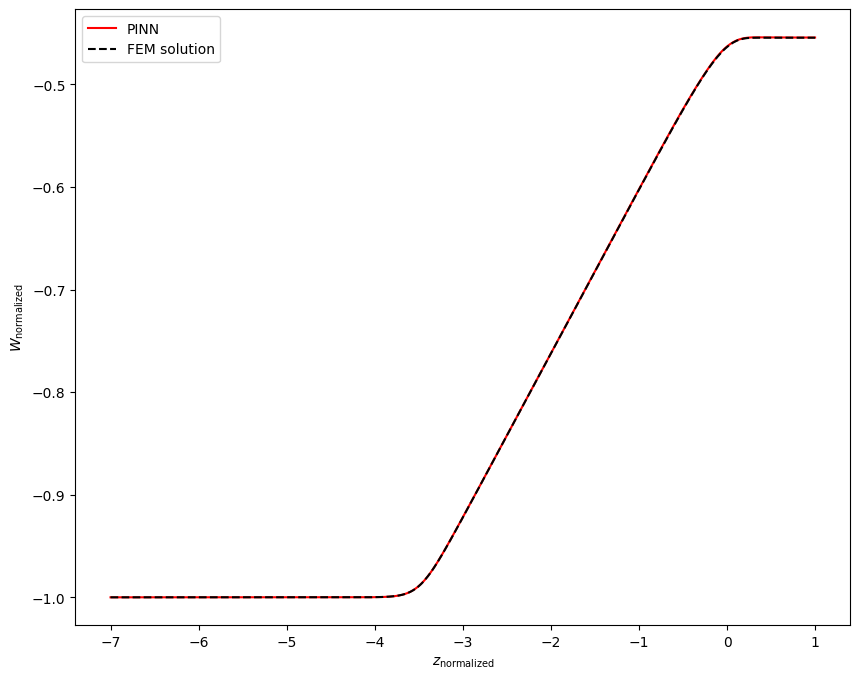


Epoch: 171000/400000
Loss: 0.05139344558119774
C_mean: -11.696734428405762
C_std: 0.021754702553153038
Loss ODE: 0.01567833498120308
Loss z0: 0.0
Loss zf: 7.927417755126953e-06
KL divergence: 3.5635836124420166


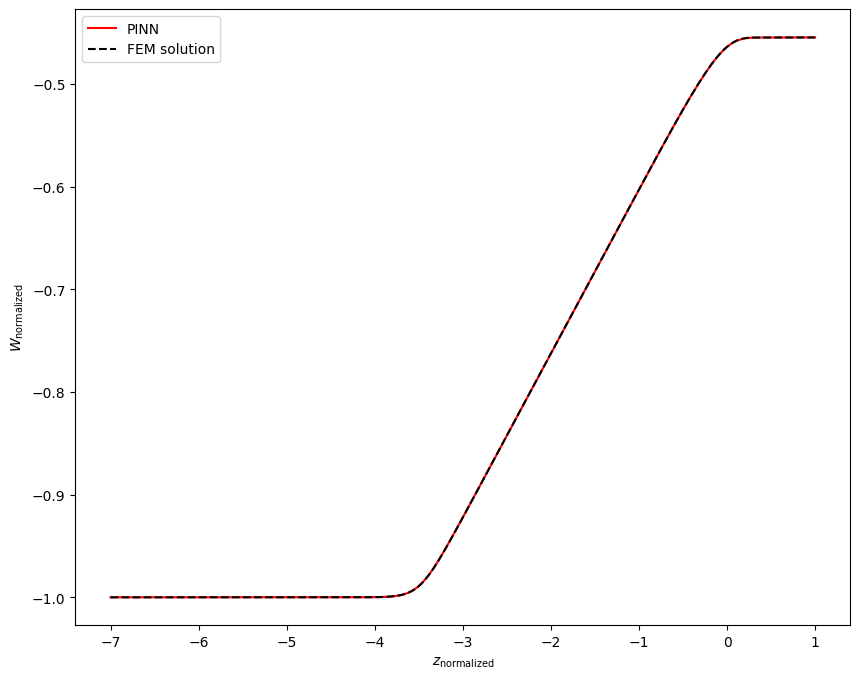


Epoch: 172000/400000
Loss: 0.08709599822759628
C_mean: -11.696484565734863
C_std: 0.021744830533862114
Loss ODE: 0.04923444613814354
Loss z0: 0.0
Loss zf: 0.00022214651107788086
KL divergence: 3.5640087127685547


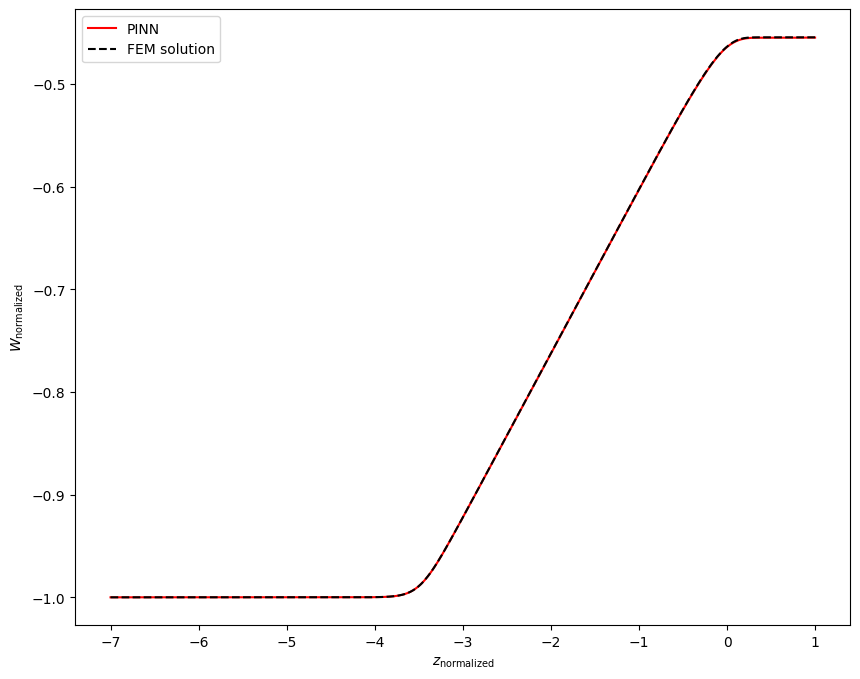


Epoch: 173000/400000
Loss: 0.07100461423397064
C_mean: -11.696921348571777
C_std: 0.02180909737944603
Loss ODE: 0.03516256809234619
Loss z0: 0.0
Loss zf: 2.3096799850463867e-05
KL divergence: 3.561107635498047


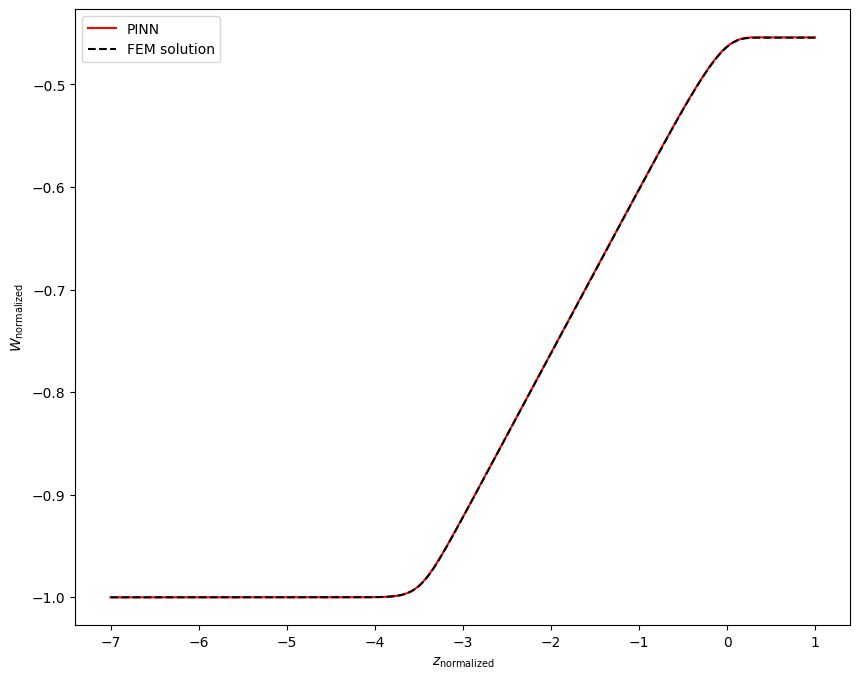


Epoch: 174000/400000
Loss: 0.046702053397893906
C_mean: -11.69619369506836
C_std: 0.02174002304673195
Loss ODE: 0.007988127879798412
Loss z0: 0.0
Loss zf: 0.0003071725368499756
KL divergence: 3.5642199516296387


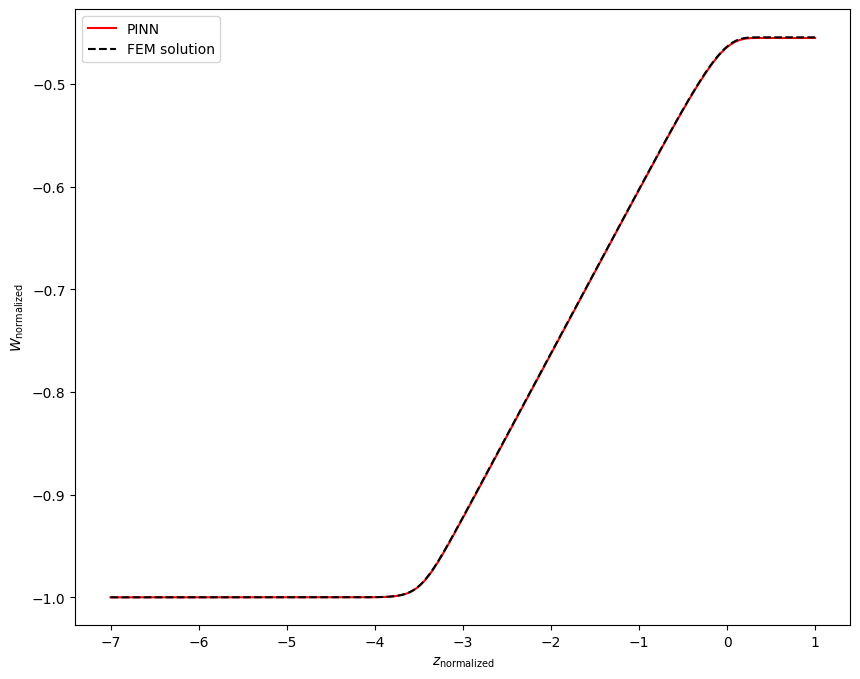


Epoch: 175000/400000
Loss: 0.06058470532298088
C_mean: -11.696483612060547
C_std: 0.021716704592108727
Loss ODE: 0.018569160252809525
Loss z0: 0.0
Loss zf: 0.0006362497806549072
KL divergence: 3.565304756164551


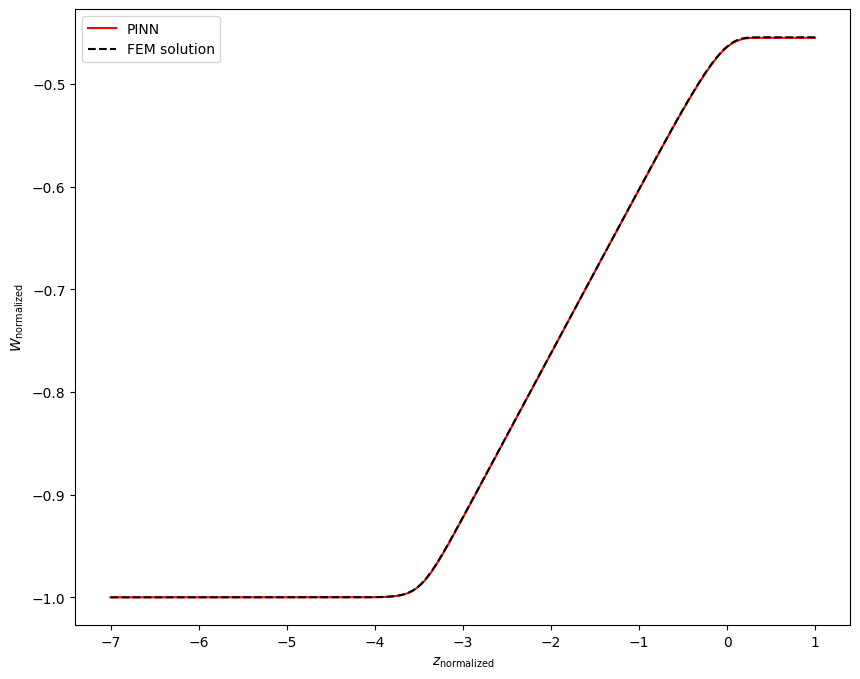


Epoch: 176000/400000
Loss: 0.06006544828414917
C_mean: -11.696284294128418
C_std: 0.021775543689727783
Loss ODE: 0.017745140939950943
Loss z0: 0.0
Loss zf: 0.0006694197654724121
KL divergence: 3.5626108646392822


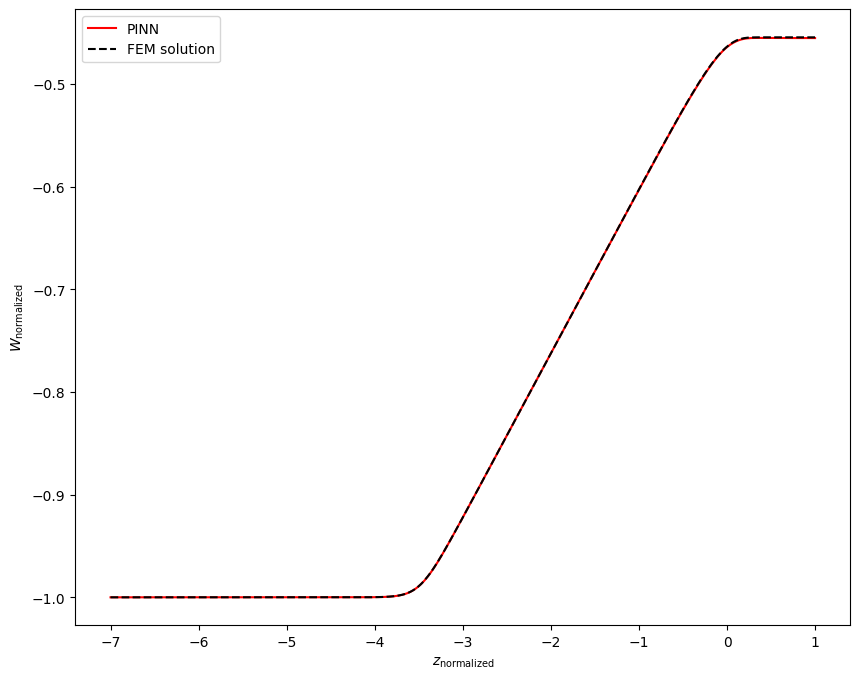


Epoch: 177000/400000
Loss: 0.05714274197816849
C_mean: -11.696806907653809
C_std: 0.021476544439792633
Loss ODE: 0.01795293018221855
Loss z0: 0.0
Loss zf: 0.00034248828887939453
KL divergence: 3.5764927864074707


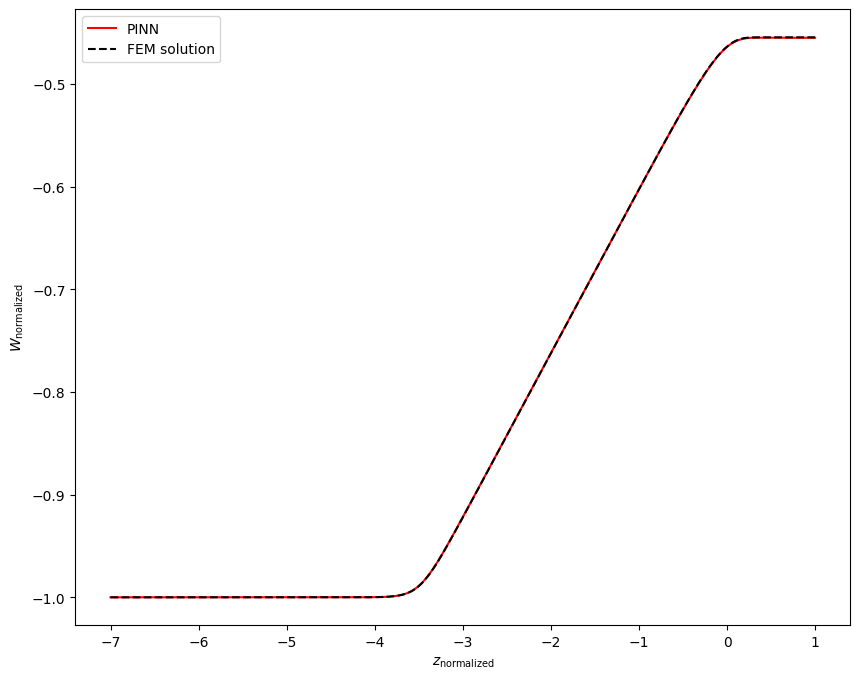


Epoch: 178000/400000
Loss: 0.05700207129120827
C_mean: -11.697016716003418
C_std: 0.021377598866820335
Loss ODE: 0.018143750727176666
Loss z0: 0.0
Loss zf: 0.00030472874641418457
KL divergence: 3.5811033248901367


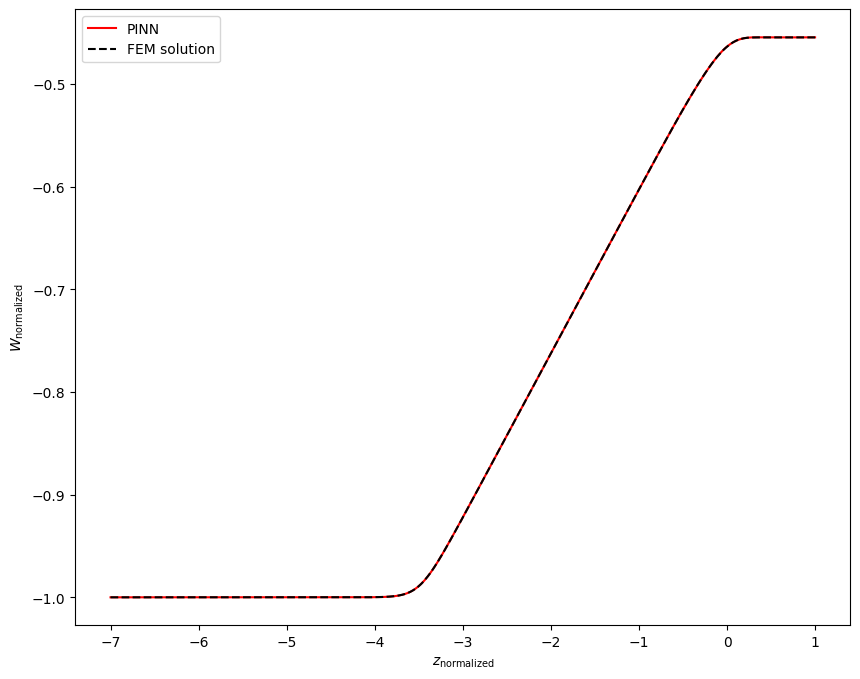


Epoch: 179000/400000
Loss: 0.04610837250947952
C_mean: -11.69655990600586
C_std: 0.021582012996077538
Loss ODE: 0.006017605308443308
Loss z0: 0.0
Loss zf: 0.0004375278949737549
KL divergence: 3.5715489387512207


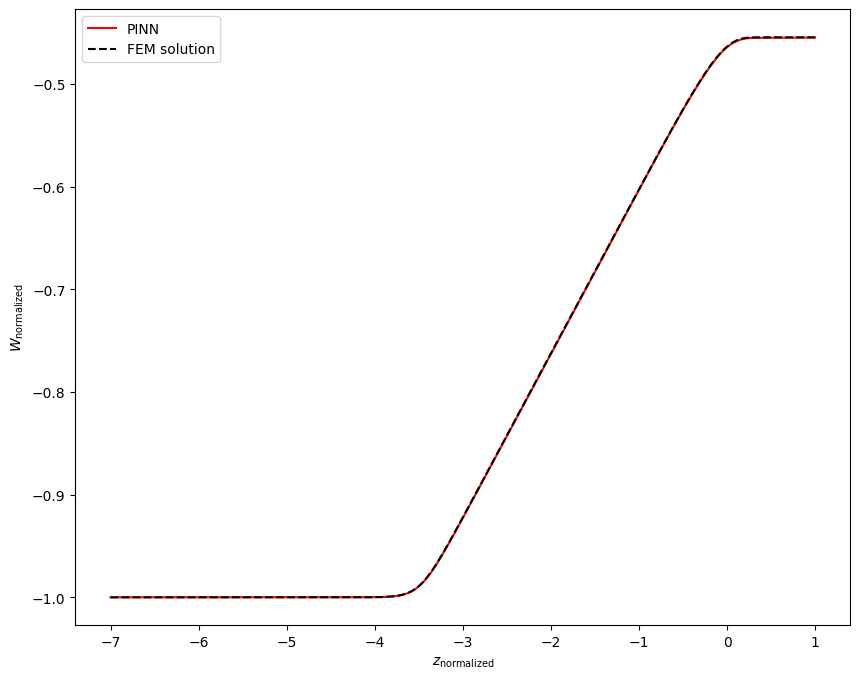


Epoch: 180000/400000
Loss: 0.08404922485351562
C_mean: -11.696870803833008
C_std: 0.02160142920911312
Loss ODE: 0.04485376924276352
Loss z0: 0.0
Loss zf: 0.00034883618354797363
KL divergence: 3.570709228515625


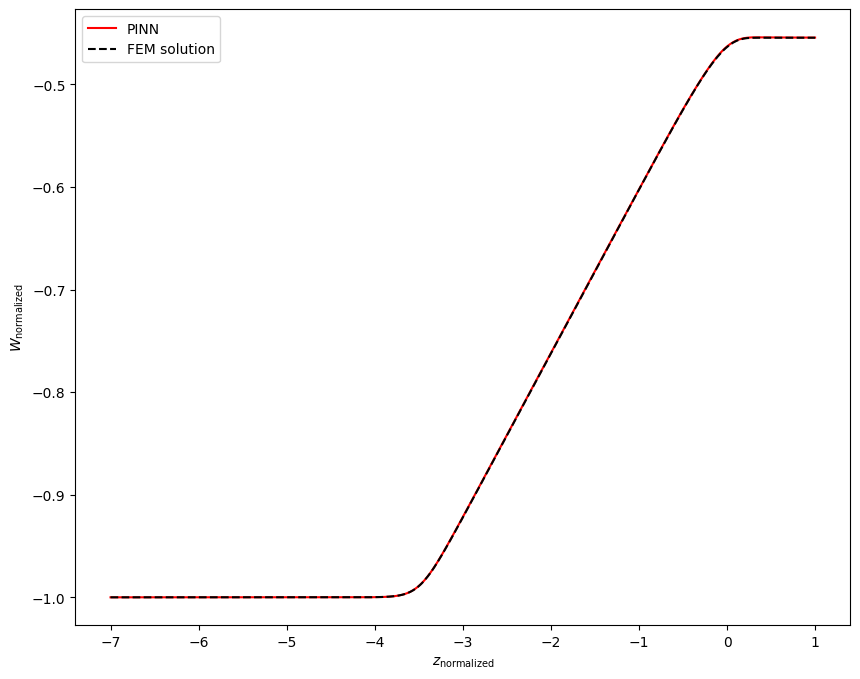


Epoch: 181000/400000
Loss: 0.05269085615873337
C_mean: -11.696751594543457
C_std: 0.021559447050094604
Loss ODE: 0.013290487229824066
Loss z0: 0.0
Loss zf: 0.0003674328327178955
KL divergence: 3.572604179382324


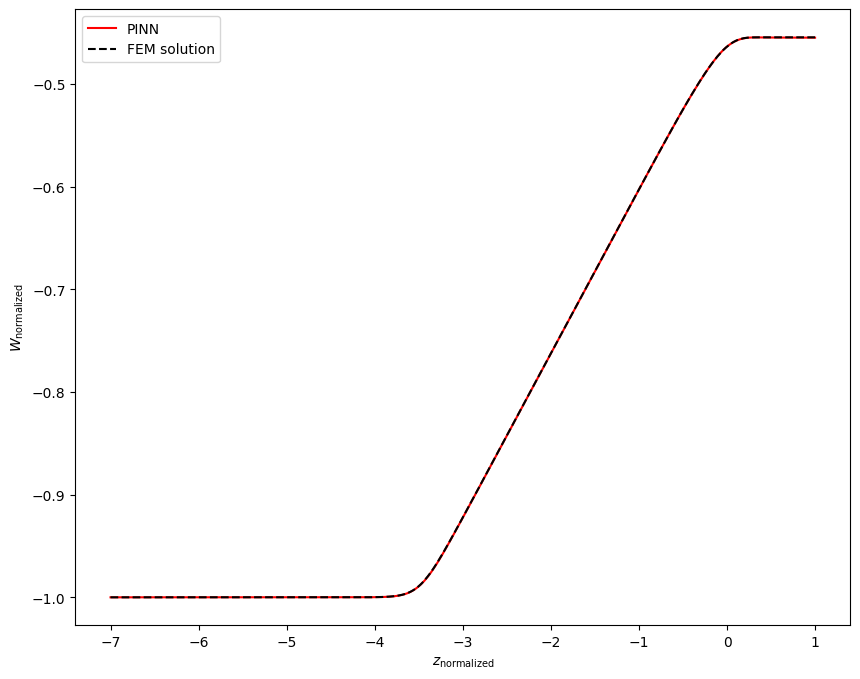


Epoch: 182000/400000
Loss: 0.06719056516885757
C_mean: -11.69665813446045
C_std: 0.021395422518253326
Loss ODE: 0.026259617879986763
Loss z0: 0.0
Loss zf: 0.0005128681659698486
KL divergence: 3.5802268981933594


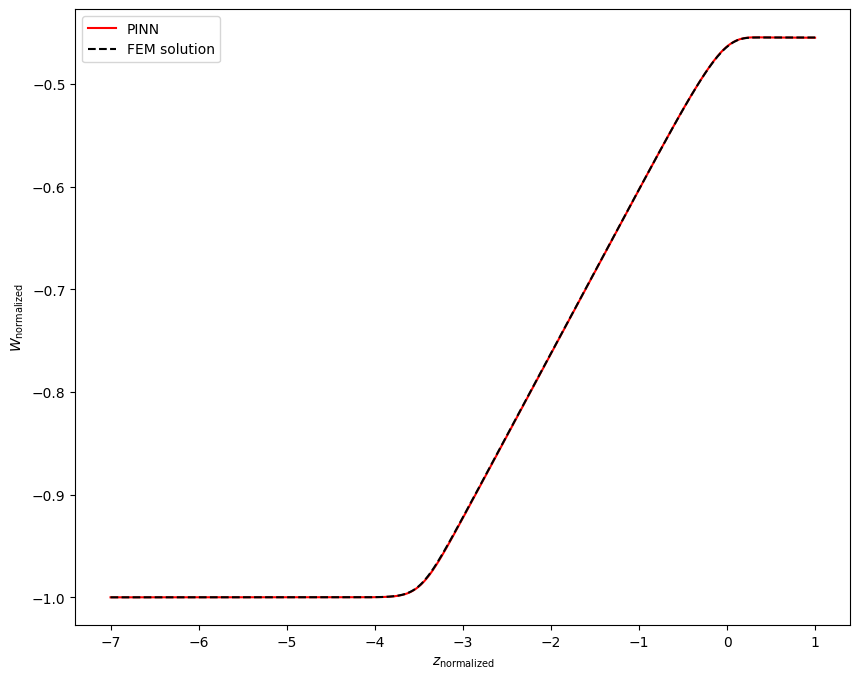


Epoch: 183000/400000
Loss: 0.05022691190242767
C_mean: -11.69675350189209
C_std: 0.02135518006980419
Loss ODE: 0.012686377391219139
Loss z0: 0.0
Loss zf: 0.00017189979553222656
KL divergence: 3.582153558731079


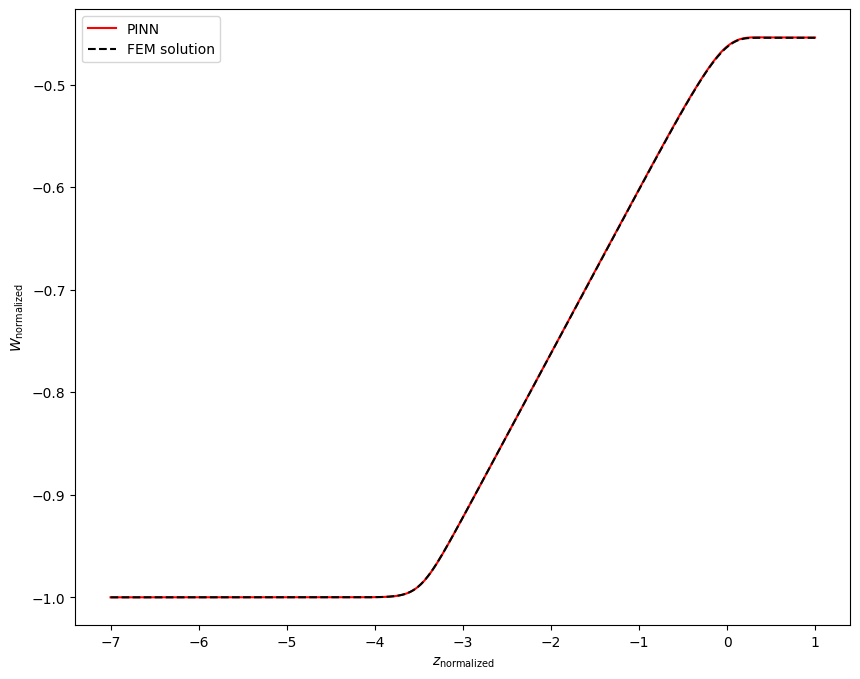


Epoch: 184000/400000
Loss: 0.07144381105899811
C_mean: -11.696529388427734
C_std: 0.0215099286288023
Loss ODE: 0.027344489470124245
Loss z0: 0.0
Loss zf: 0.0008350610733032227
KL divergence: 3.57487154006958


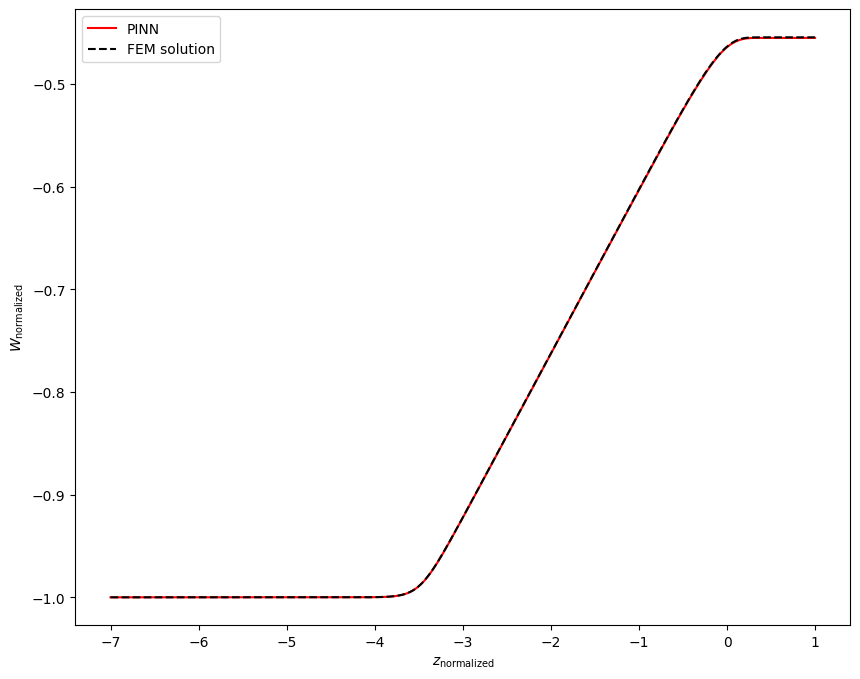


Epoch: 185000/400000
Loss: 0.061506882309913635
C_mean: -11.696391105651855
C_std: 0.021517997607588768
Loss ODE: 0.020292110741138458
Loss z0: 0.0
Loss zf: 0.0005469620227813721
KL divergence: 3.5745153427124023


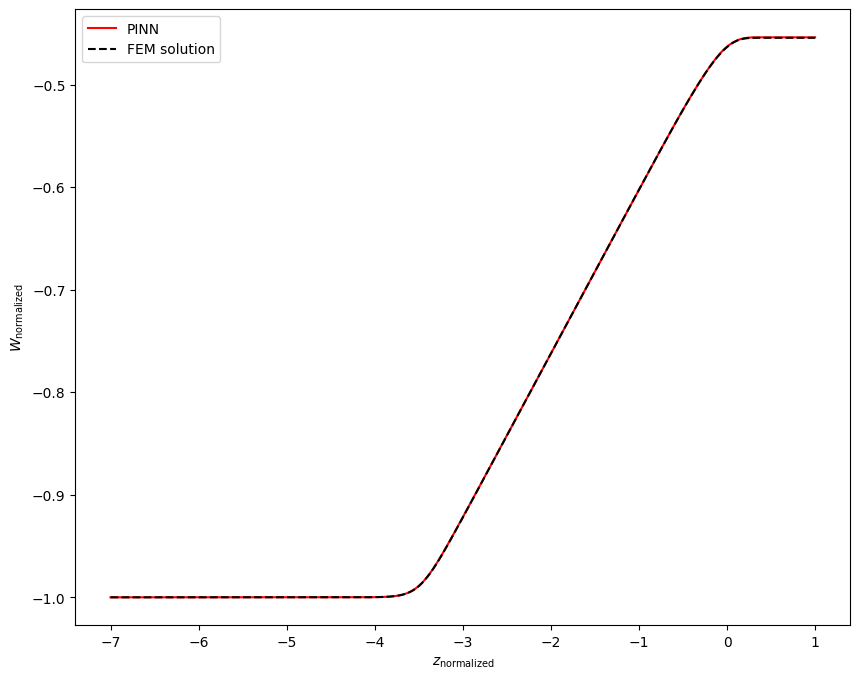


Epoch: 186000/400000
Loss: 0.08400195837020874
C_mean: -11.696128845214844
C_std: 0.021631017327308655
Loss ODE: 0.041577134281396866
Loss z0: 0.0
Loss zf: 0.0006732344627380371
KL divergence: 3.5692474842071533


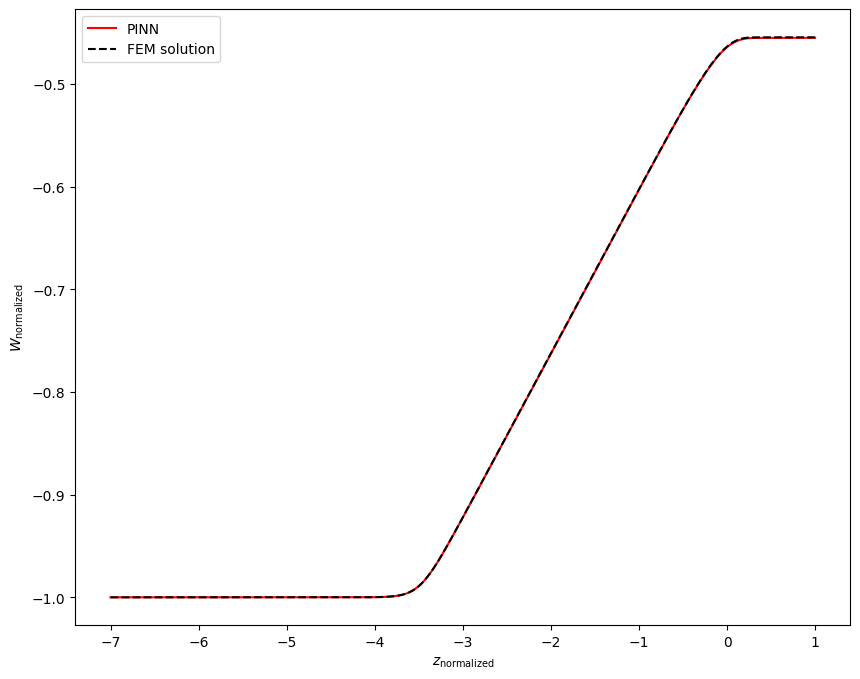


Epoch: 187000/400000
Loss: 0.0634770542383194
C_mean: -11.69628620147705
C_std: 0.02154676243662834
Loss ODE: 0.02375934086740017
Loss z0: 0.0
Loss zf: 0.0003986060619354248
KL divergence: 3.5731656551361084


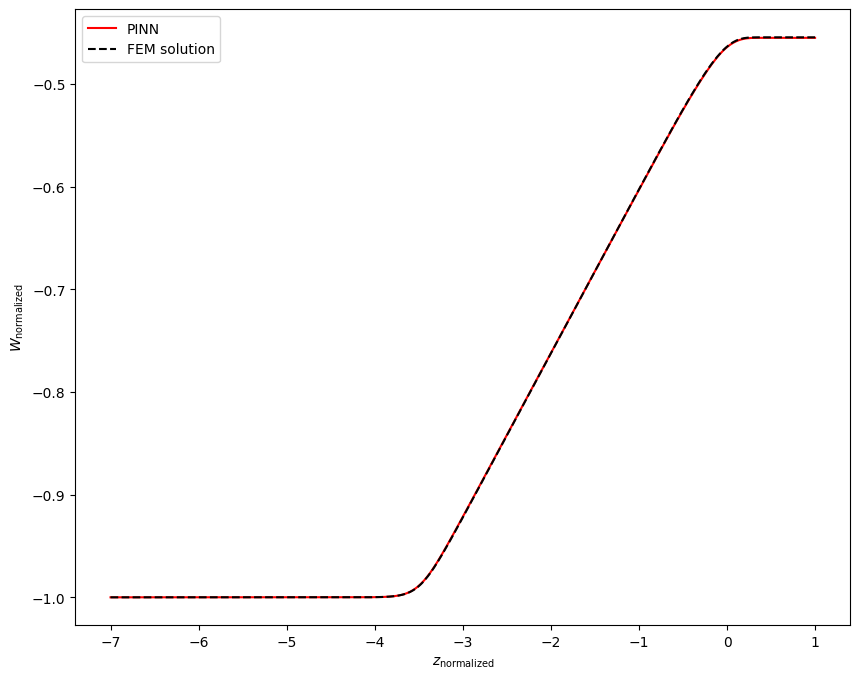


Epoch: 188000/400000
Loss: 0.04808703064918518
C_mean: -11.69675064086914
C_std: 0.021703531965613365
Loss ODE: 0.011362498626112938
Loss z0: 0.0
Loss zf: 0.00010651350021362305
KL divergence: 3.5659396648406982


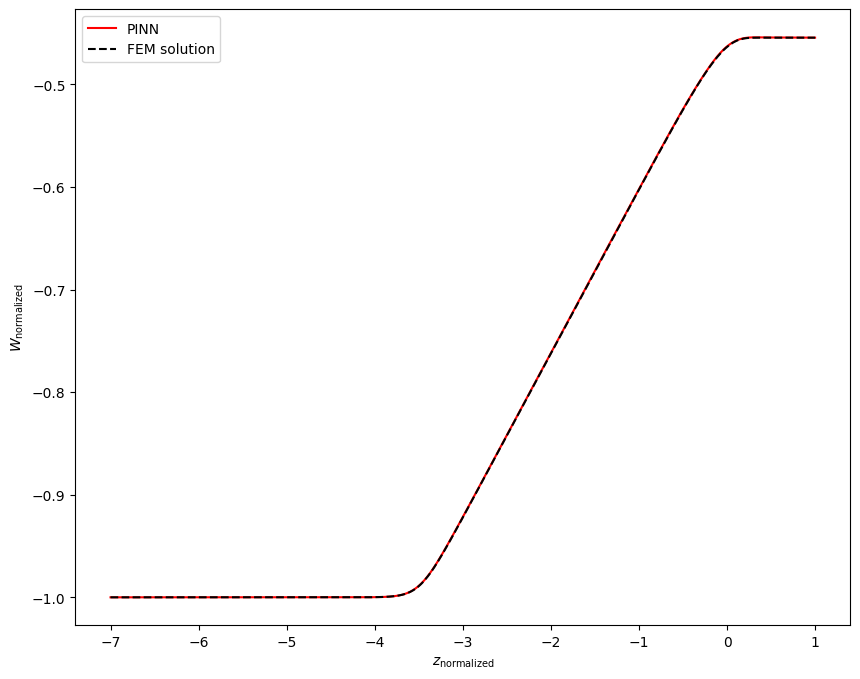


Epoch: 189000/400000
Loss: 0.054278407245874405
C_mean: -11.695823669433594
C_std: 0.021758001297712326
Loss ODE: 0.018556024879217148
Loss z0: 0.0
Loss zf: 8.910894393920898e-06
KL divergence: 3.5633275508880615


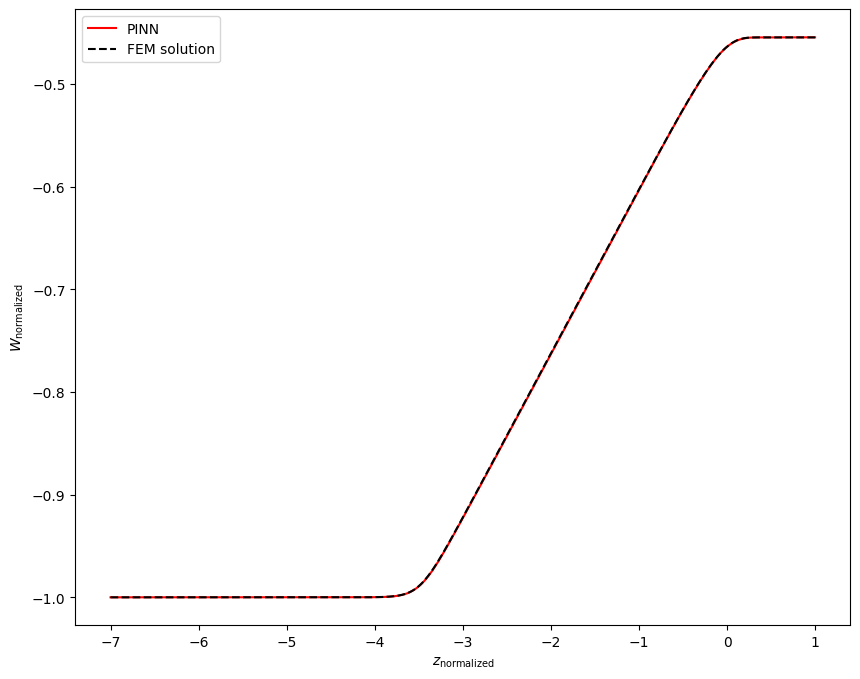


Epoch: 190000/400000
Loss: 0.059438034892082214
C_mean: -11.696174621582031
C_std: 0.021592285484075546
Loss ODE: 0.02178960107266903
Loss z0: 0.0
Loss zf: 0.0001938343048095703
KL divergence: 3.5710091590881348


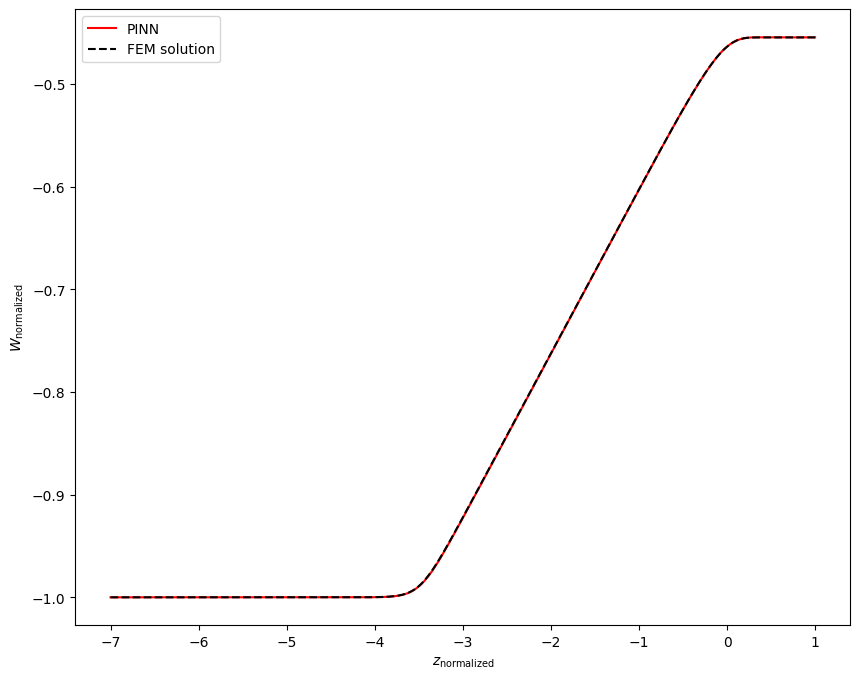


Epoch: 191000/400000
Loss: 0.07083316892385483
C_mean: -11.695988655090332
C_std: 0.021547118201851845
Loss ODE: 0.03486896678805351
Loss z0: 0.0
Loss zf: 2.3305416107177734e-05
KL divergence: 3.5731148719787598


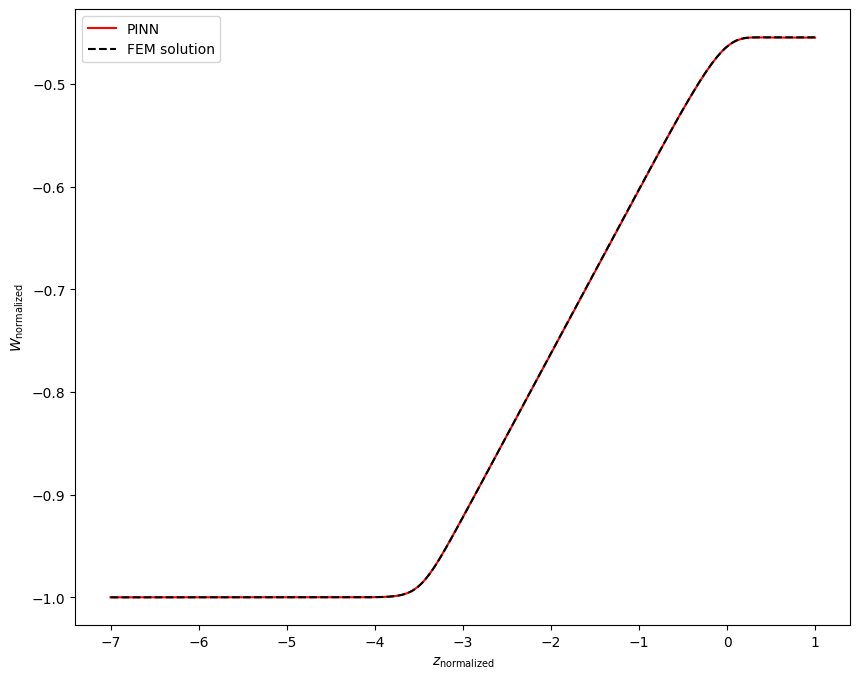


Epoch: 192000/400000
Loss: 0.05015336722135544
C_mean: -11.696176528930664
C_std: 0.0215048436075449
Loss ODE: 0.014161022379994392
Loss z0: 0.0
Loss zf: 2.41696834564209e-05
KL divergence: 3.5750646591186523


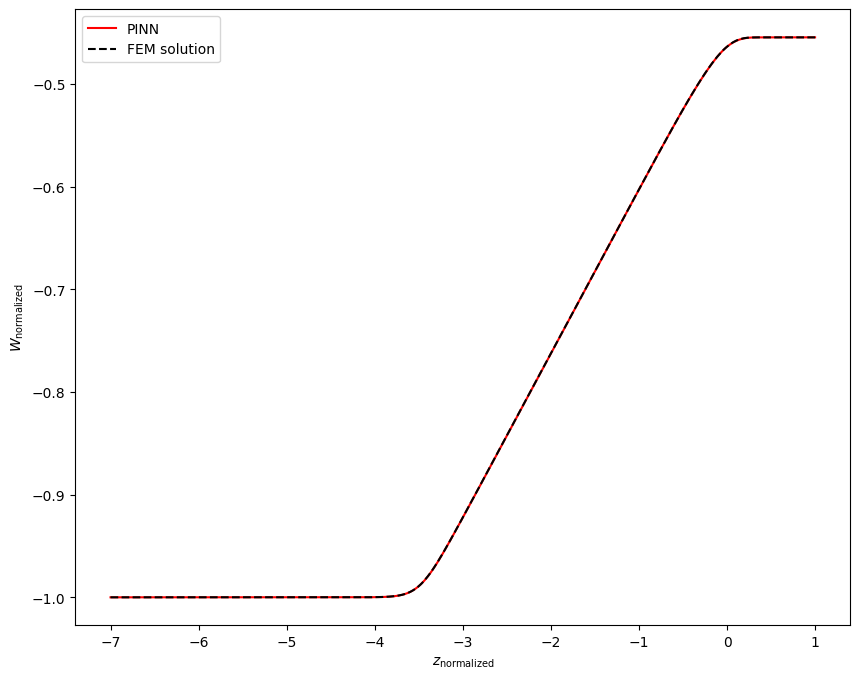


Epoch: 193000/400000
Loss: 0.053559042513370514
C_mean: -11.696112632751465
C_std: 0.021439651027321815
Loss ODE: 0.014384733512997627
Loss z0: 0.0
Loss zf: 0.00033932924270629883
KL divergence: 3.578101634979248


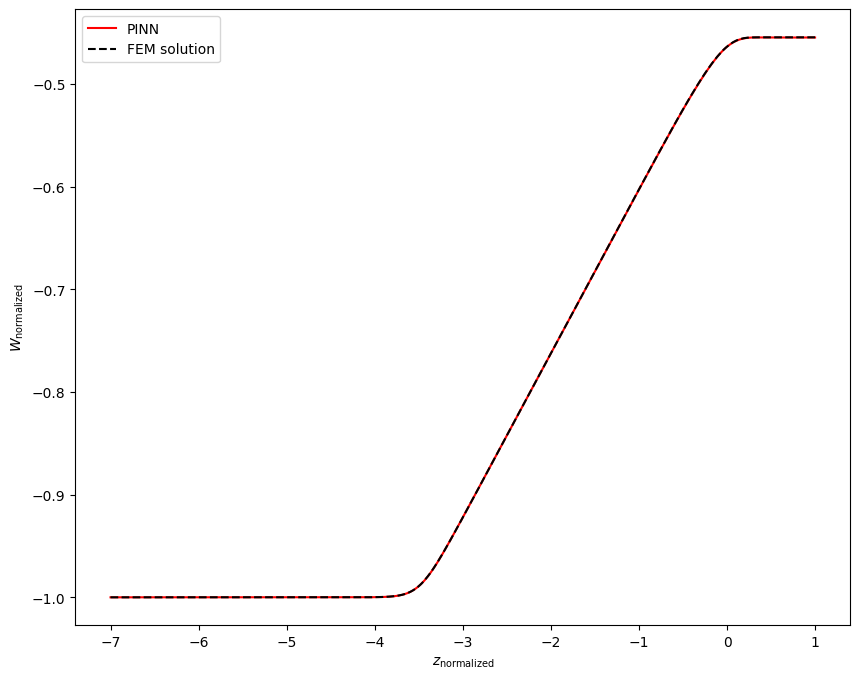


Epoch: 194000/400000
Loss: 0.05342435464262962
C_mean: -11.696102142333984
C_std: 0.02147689275443554
Loss ODE: 0.015340696088969707
Loss z0: 0.0
Loss zf: 0.0002319812774658203
KL divergence: 3.5763845443725586


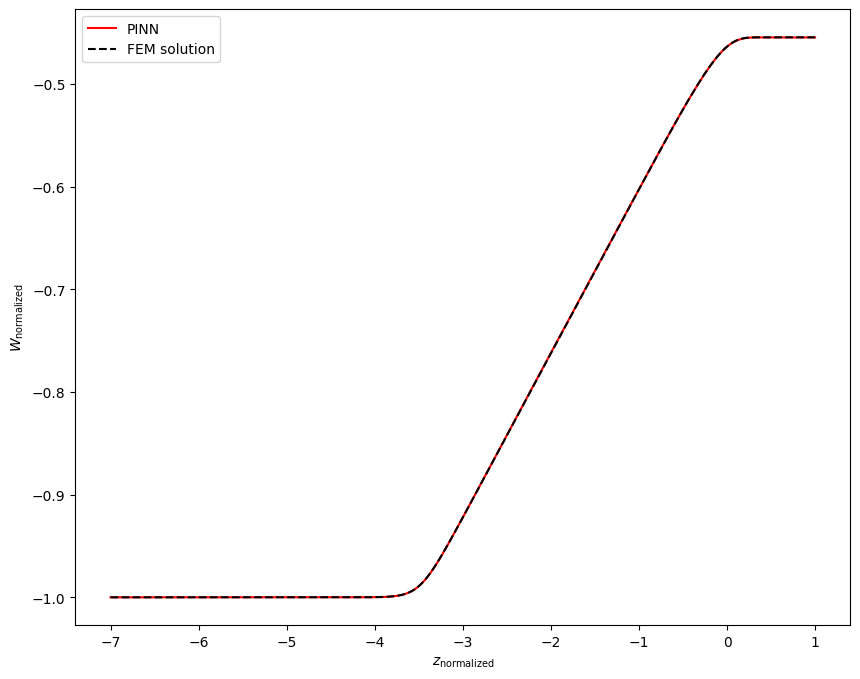


Epoch: 195000/400000
Loss: 0.04694131761789322
C_mean: -11.696183204650879
C_std: 0.021549446508288383
Loss ODE: 0.01068207435309887
Loss z0: 0.0
Loss zf: 5.289912223815918e-05
KL divergence: 3.5730252265930176


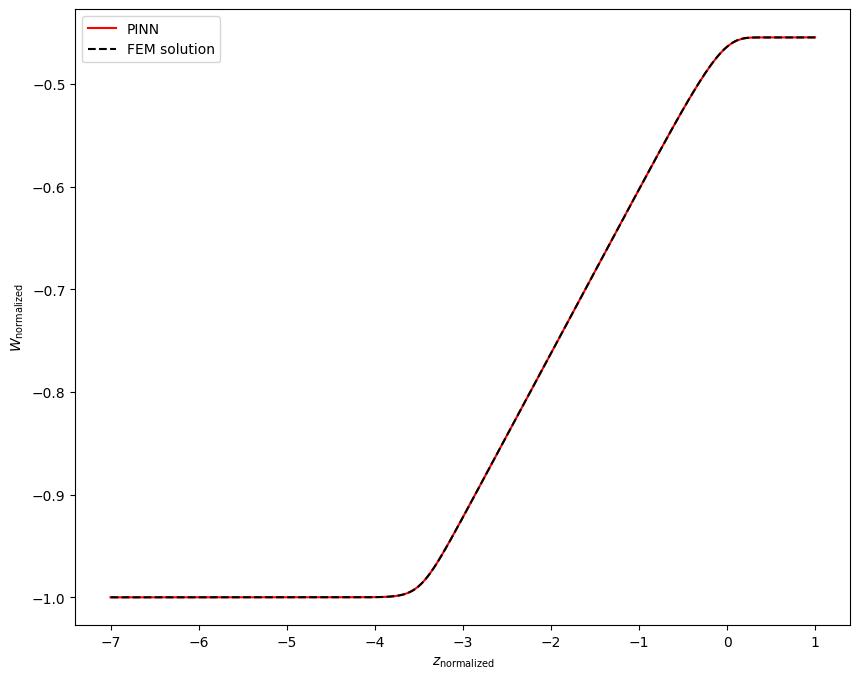


Epoch: 196000/400000
Loss: 0.10476818680763245
C_mean: -11.695768356323242
C_std: 0.02144806832075119
Loss ODE: 0.0601295568048954
Loss z0: 0.0
Loss zf: 0.0008862018585205078
KL divergence: 3.5776610374450684


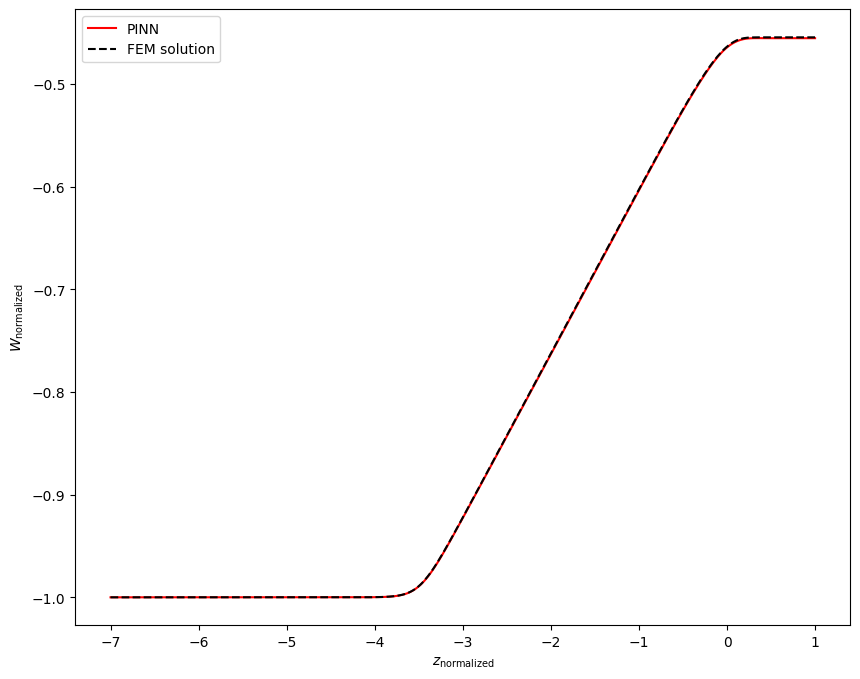


Epoch: 197000/400000
Loss: 0.05652642250061035
C_mean: -11.696062088012695
C_std: 0.021361909806728363
Loss ODE: 0.01896430179476738
Loss z0: 0.0
Loss zf: 0.00017446279525756836
KL divergence: 3.581749439239502


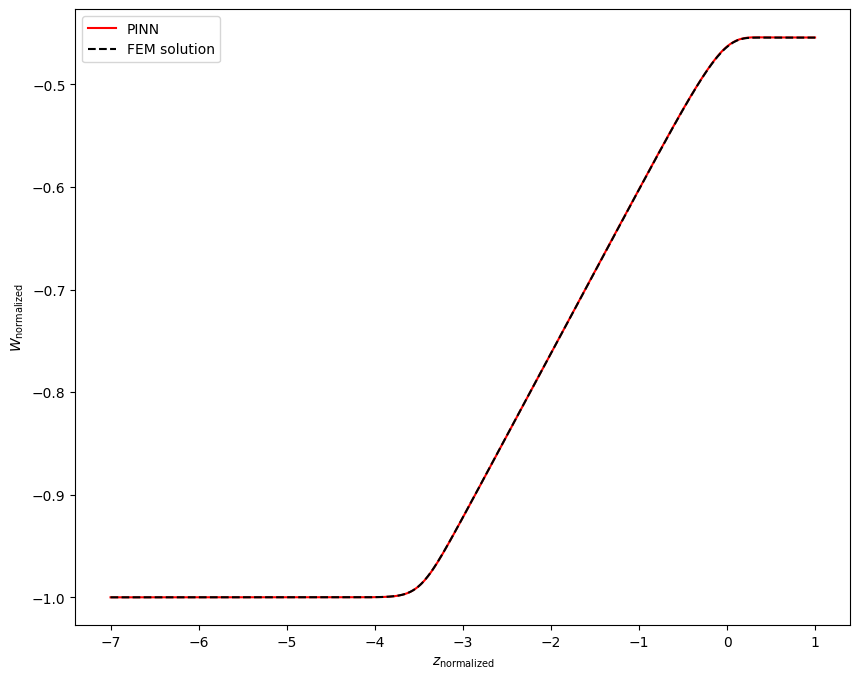


Epoch: 198000/400000
Loss: 0.04763336479663849
C_mean: -11.695655822753906
C_std: 0.021403351798653603
Loss ODE: 0.008022826164960861
Loss z0: 0.0
Loss zf: 0.00038129091262817383
KL divergence: 3.5797629356384277


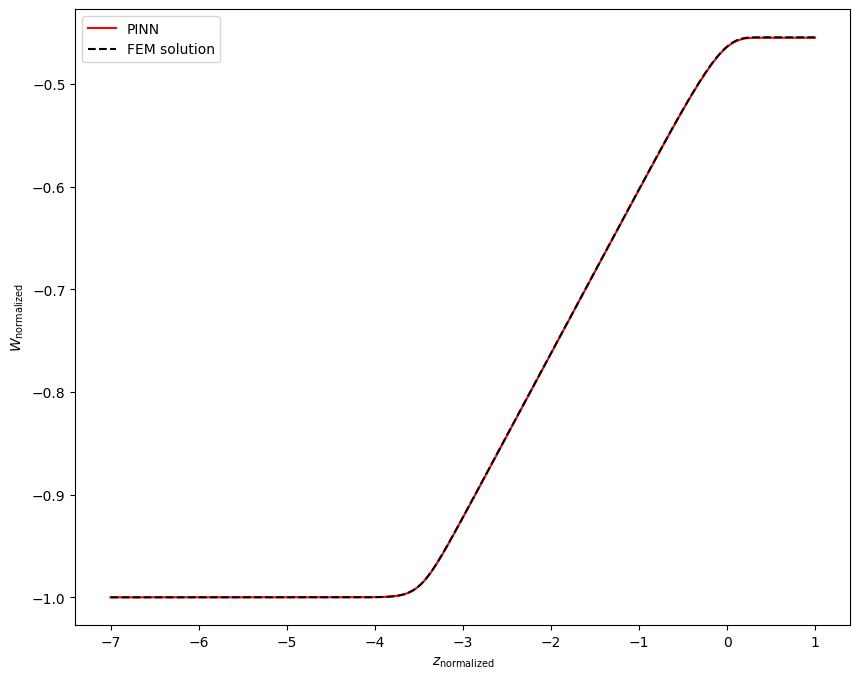


Epoch: 199000/400000
Loss: 0.05000806972384453
C_mean: -11.695998191833496
C_std: 0.021434256806969643
Loss ODE: 0.013585497625172138
Loss z0: 0.0
Loss zf: 6.392598152160645e-05
KL divergence: 3.578331470489502


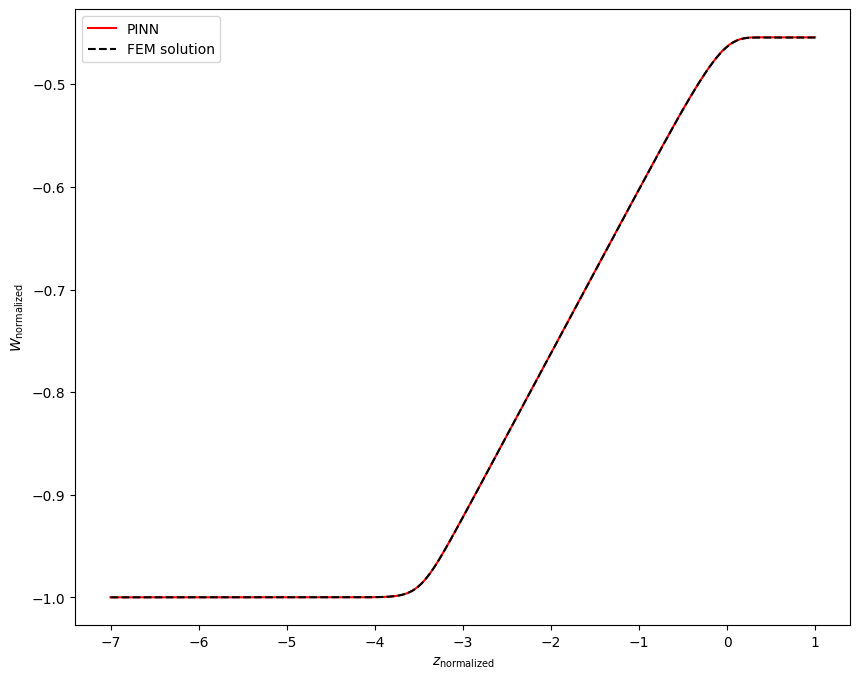


Epoch: 200000/400000
Loss: 0.051670897752046585
C_mean: -11.695549011230469
C_std: 0.021377969533205032
Loss ODE: 0.014754057861864567
Loss z0: 0.0
Loss zf: 0.00011077523231506348
KL divergence: 3.580909013748169


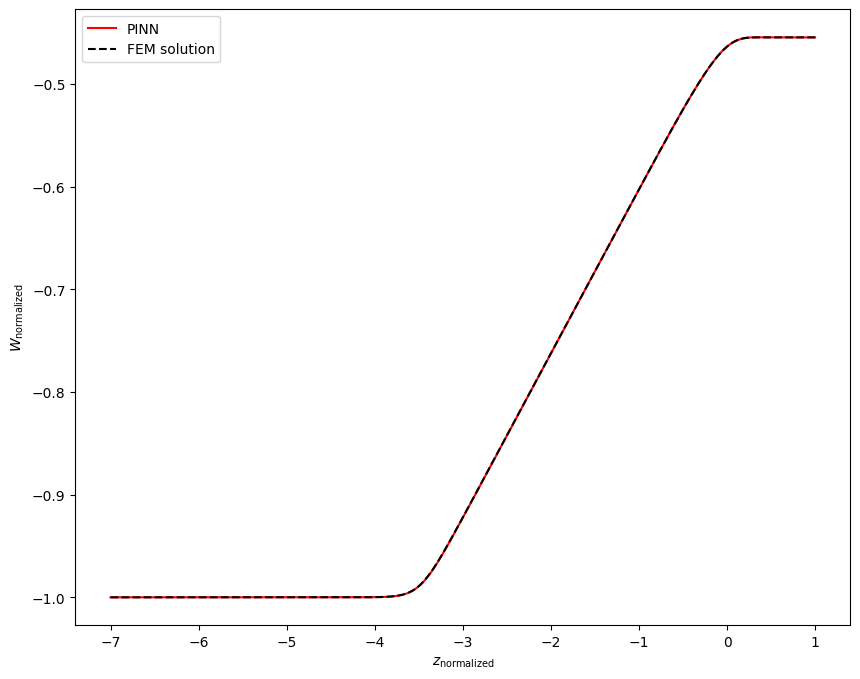


Epoch: 201000/400000
Loss: 0.09006020426750183
C_mean: -11.695534706115723
C_std: 0.021120119839906693
Loss ODE: 0.05187829211354256
Loss z0: 0.0
Loss zf: 0.00022515654563903809
KL divergence: 3.5930349826812744


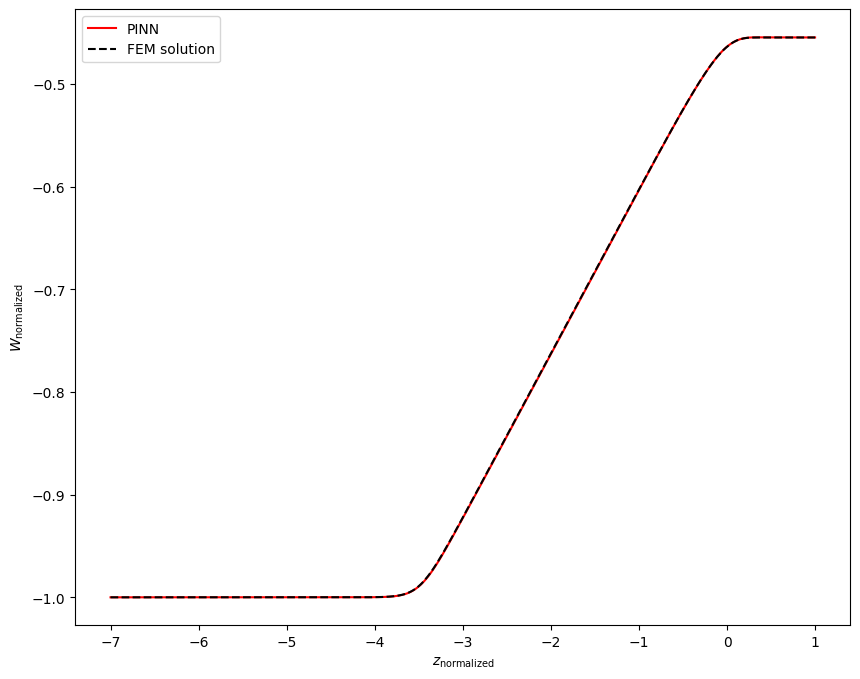


Epoch: 202000/400000
Loss: 0.04320525377988815
C_mean: -11.695554733276367
C_std: 0.021070266142487526
Loss ODE: 0.006320734042674303
Loss z0: 0.0
Loss zf: 9.304285049438477e-05
KL divergence: 3.595409393310547


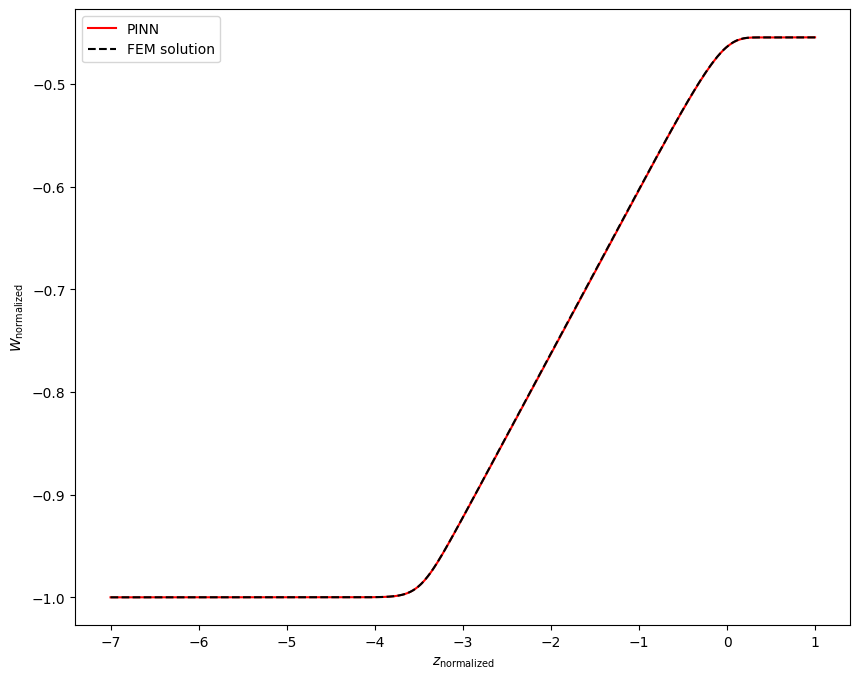


Epoch: 203000/400000
Loss: 0.04889645799994469
C_mean: -11.695853233337402
C_std: 0.021130122244358063
Loss ODE: 0.00869742687791586
Loss z0: 0.0
Loss zf: 0.0004272758960723877
KL divergence: 3.5926270484924316


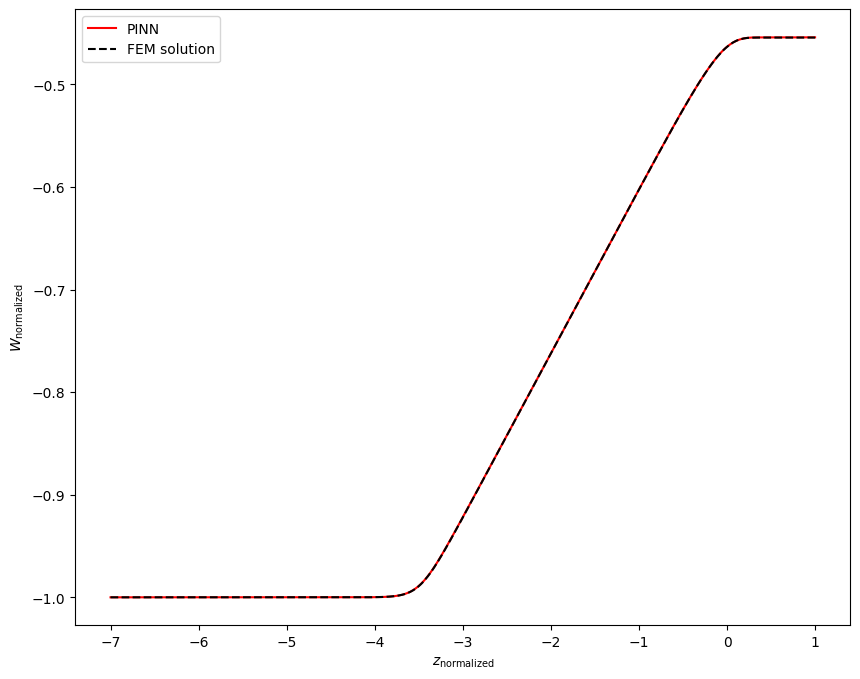


Epoch: 204000/400000
Loss: 0.05071935057640076
C_mean: -11.69603443145752
C_std: 0.021030986681580544
Loss ODE: 0.012140735983848572
Loss z0: 0.0
Loss zf: 0.0002605319023132324
KL divergence: 3.597329616546631


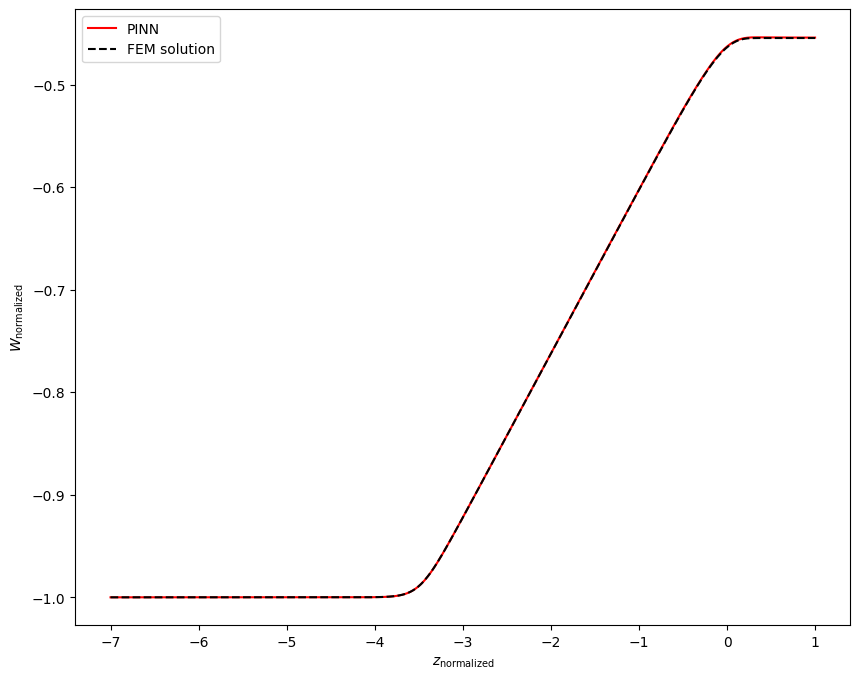


Epoch: 205000/400000
Loss: 0.07353650033473969
C_mean: -11.695867538452148
C_std: 0.020915932953357697
Loss ODE: 0.03647270053625107
Loss z0: 0.0
Loss zf: 0.00010356307029724121
KL divergence: 3.602816581726074


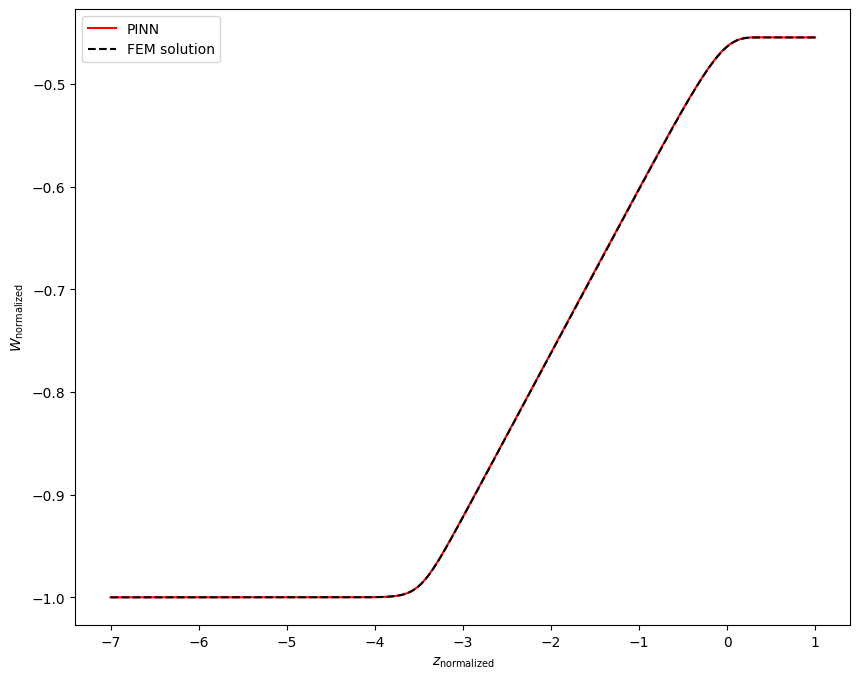


Epoch: 206000/400000
Loss: 0.0854816883802414
C_mean: -11.69579792022705
C_std: 0.020847007632255554
Loss ODE: 0.04821092635393143
Loss z0: 0.0
Loss zf: 0.00012096762657165527
KL divergence: 3.6061086654663086


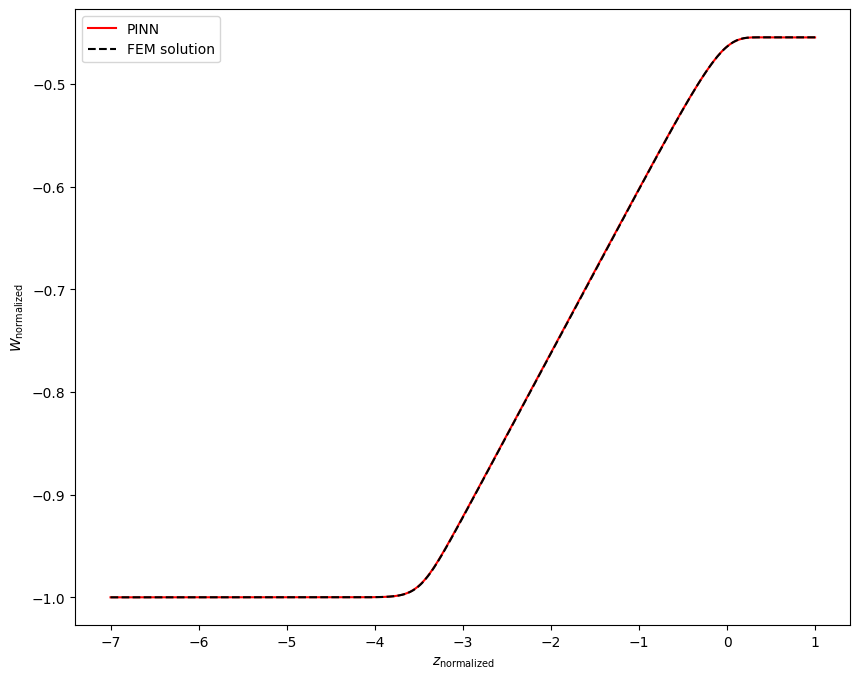


Epoch: 207000/400000
Loss: 0.05528871715068817
C_mean: -11.695642471313477
C_std: 0.020638007670640945
Loss ODE: 0.013781601563096046
Loss z0: 0.0
Loss zf: 0.0005345642566680908
KL divergence: 3.61614727973938


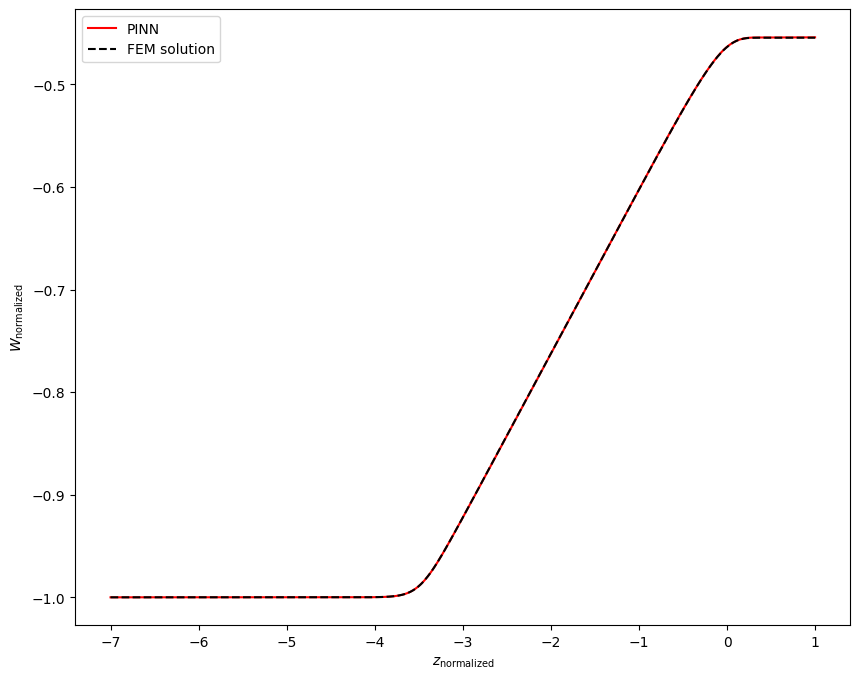


Epoch: 208000/400000
Loss: 0.058449290692806244
C_mean: -11.695335388183594
C_std: 0.02068985067307949
Loss ODE: 0.019851459190249443
Loss z0: 0.0
Loss zf: 0.0002461671829223633
KL divergence: 3.6136162281036377


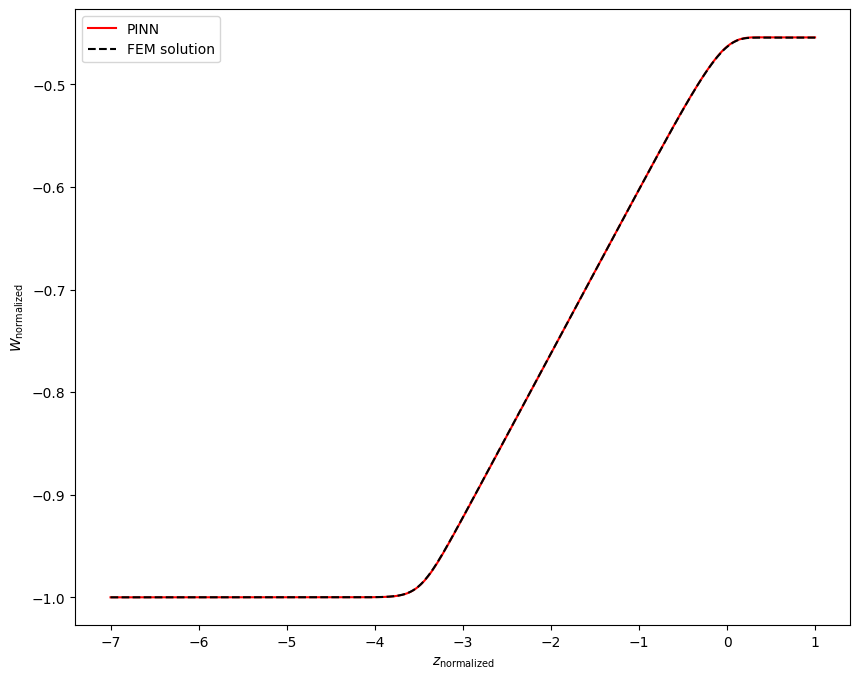


Epoch: 209000/400000
Loss: 0.041301414370536804
C_mean: -11.69550895690918
C_std: 0.02067936770617962
Loss ODE: 0.004598584491759539
Loss z0: 0.0
Loss zf: 5.614757537841797e-05
KL divergence: 3.614135503768921


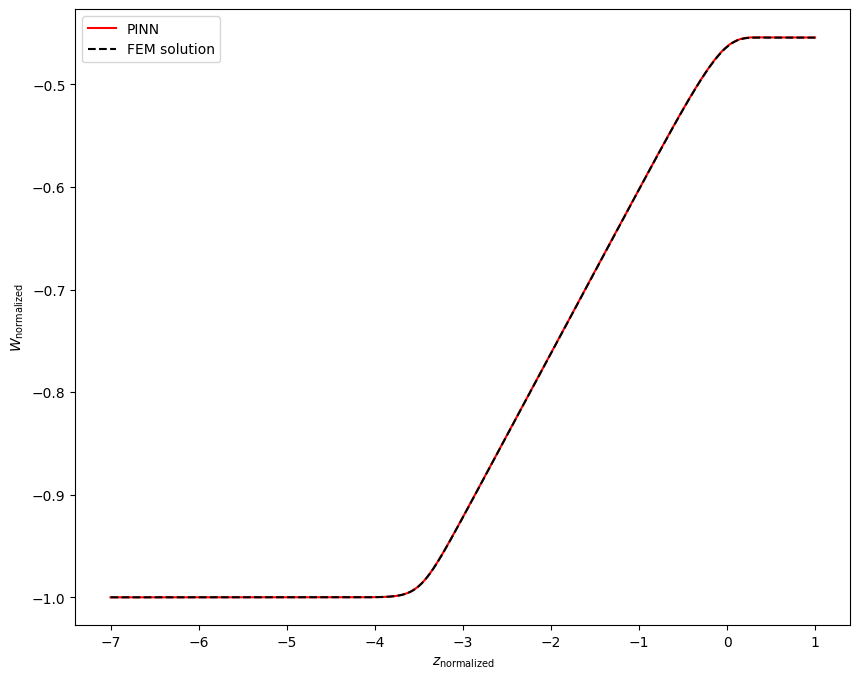


Epoch: 210000/400000
Loss: 0.05429908260703087
C_mean: -11.695409774780273
C_std: 0.02085549384355545
Loss ODE: 0.015470302663743496
Loss z0: 0.0
Loss zf: 0.0002772212028503418
KL divergence: 3.605656862258911


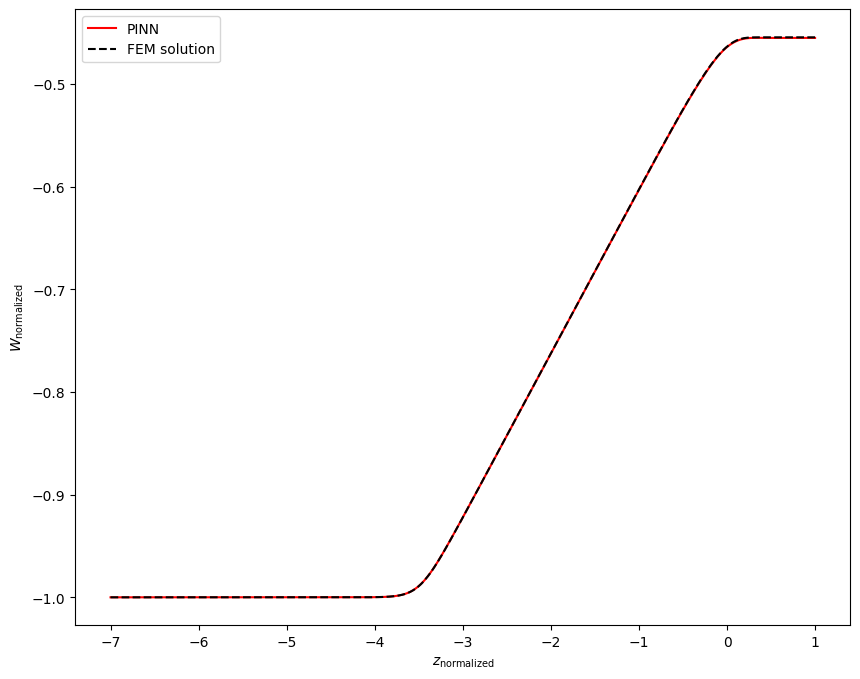


Epoch: 211000/400000
Loss: 0.059197716414928436
C_mean: -11.69547176361084
C_std: 0.020796122029423714
Loss ODE: 0.01772136241197586
Loss z0: 0.0
Loss zf: 0.0005391240119934082
KL divergence: 3.608511447906494


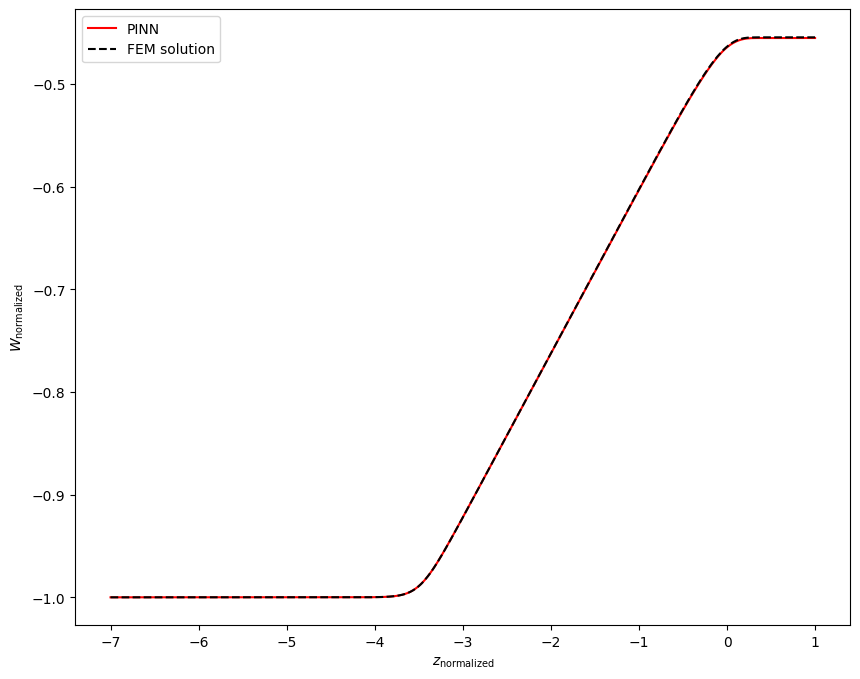


Epoch: 212000/400000
Loss: 0.07218879461288452
C_mean: -11.695845603942871
C_std: 0.020724039524793625
Loss ODE: 0.035439375787973404
Loss z0: 0.0
Loss zf: 6.29425048828125e-05
KL divergence: 3.611999750137329


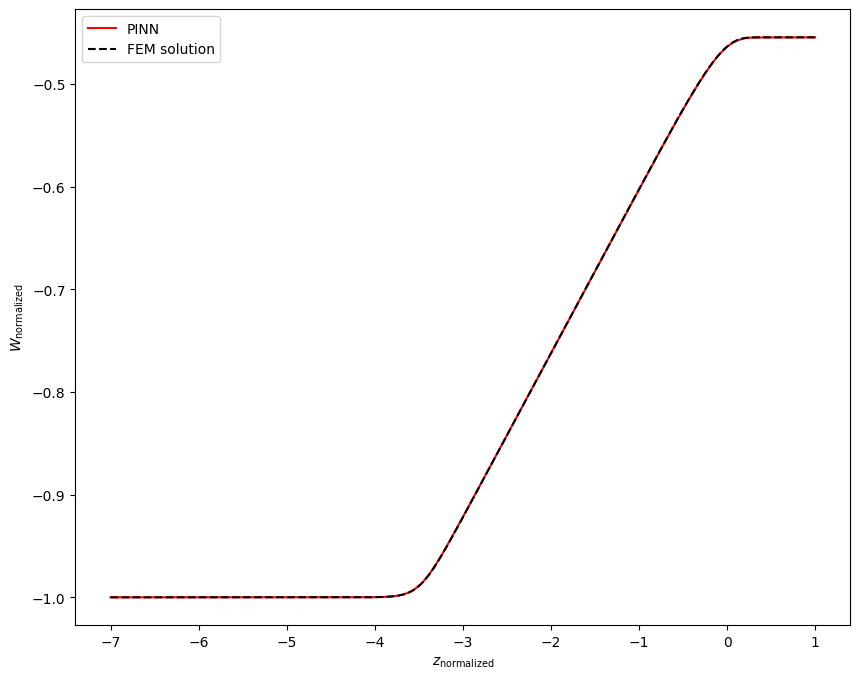


Epoch: 213000/400000
Loss: 0.04195112735033035
C_mean: -11.695908546447754
C_std: 0.02059868909418583
Loss ODE: 0.004948999732732773
Loss z0: 0.0
Loss zf: 8.213520050048828e-05
KL divergence: 3.618077516555786


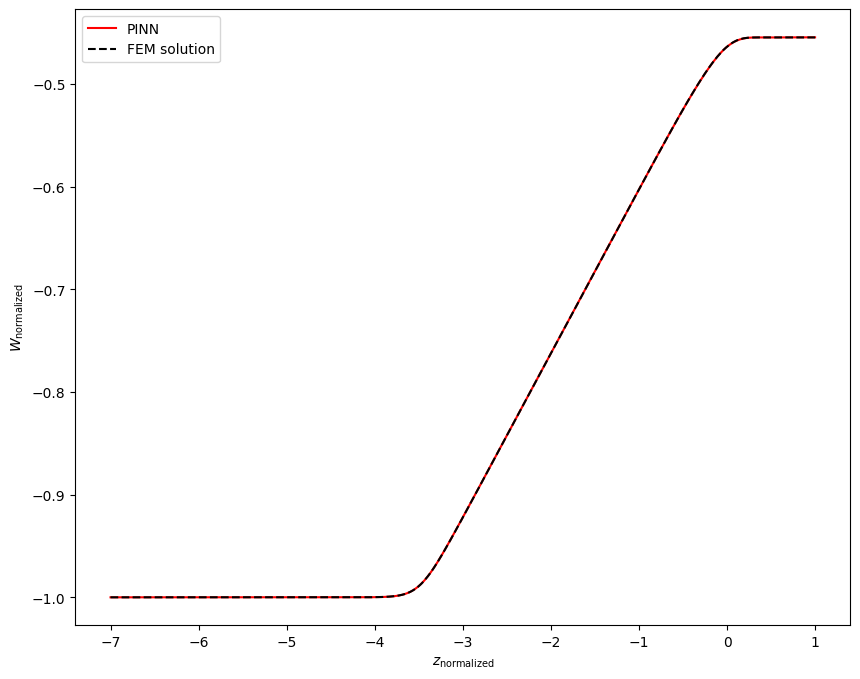


Epoch: 214000/400000
Loss: 0.05323255807161331
C_mean: -11.69593620300293
C_std: 0.020503563806414604
Loss ODE: 0.01485139038413763
Loss z0: 0.0
Loss zf: 0.00021541118621826172
KL divergence: 3.6227054595947266


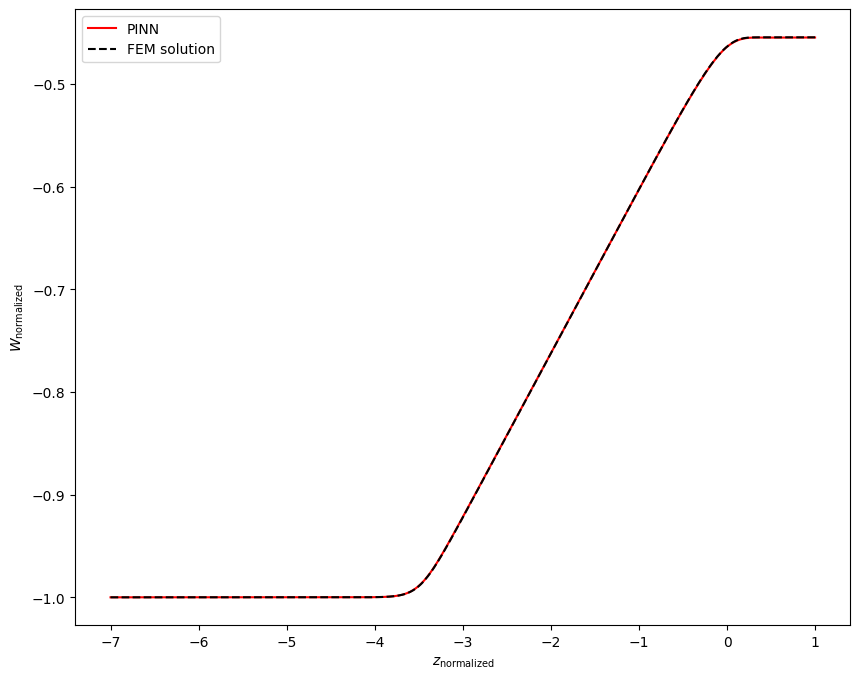


Epoch: 215000/400000
Loss: 0.06313455104827881
C_mean: -11.695539474487305
C_std: 0.020559214055538177
Loss ODE: 0.024846235290169716
Loss z0: 0.0
Loss zf: 0.00020888447761535645
KL divergence: 3.6199474334716797


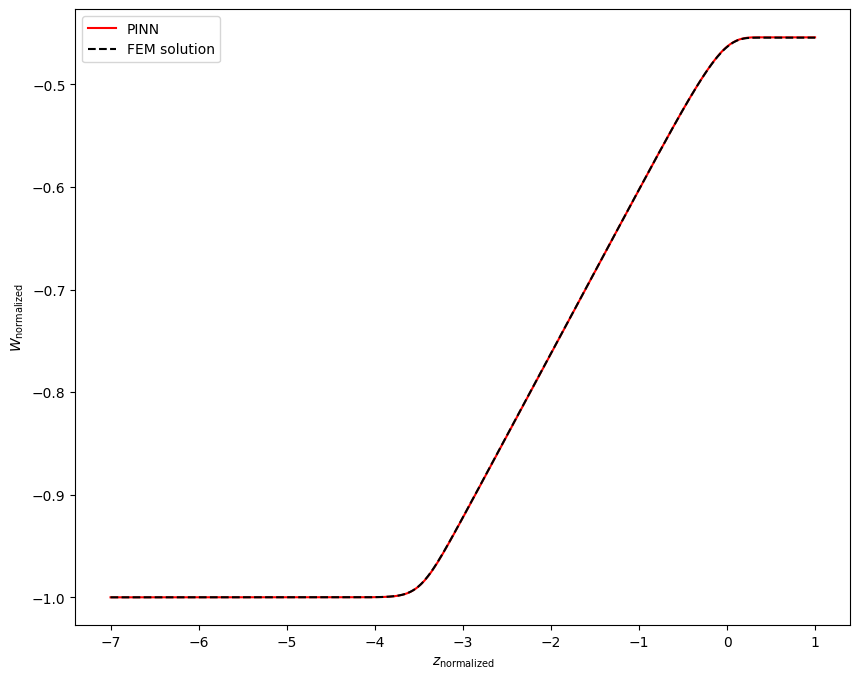


Epoch: 216000/400000
Loss: 0.07663571834564209
C_mean: -11.6953706741333
C_std: 0.020446917042136192
Loss ODE: 0.03456936404109001
Loss z0: 0.0
Loss zf: 0.000581204891204834
KL divergence: 3.6254308223724365


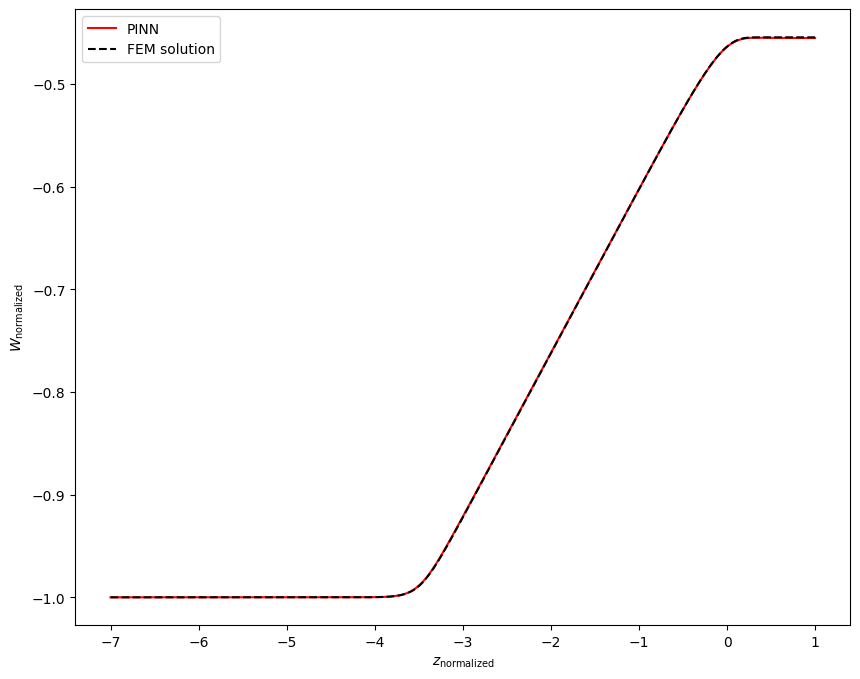


Epoch: 217000/400000
Loss: 0.06650785356760025
C_mean: -11.695241928100586
C_std: 0.020341096445918083
Loss ODE: 0.026624077931046486
Loss z0: 0.0
Loss zf: 0.0003577768802642822
KL divergence: 3.630600929260254


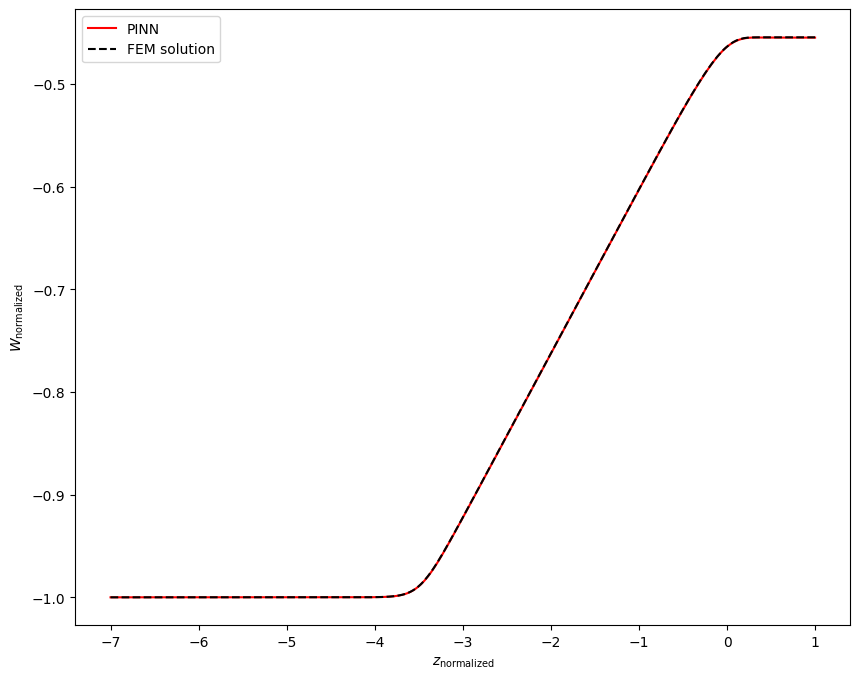


Epoch: 218000/400000
Loss: 0.0428788848221302
C_mean: -11.695523262023926
C_std: 0.020327789708971977
Loss ODE: 0.006260000169277191
Loss z0: 0.0
Loss zf: 3.0606985092163086e-05
KL divergence: 3.631281614303589


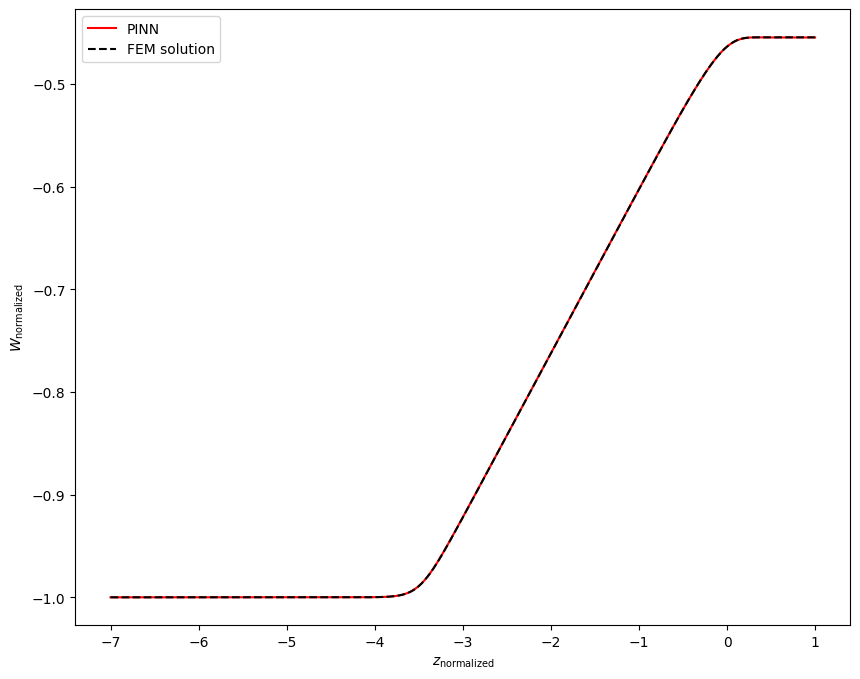


Epoch: 219000/400000
Loss: 0.06391015648841858
C_mean: -11.695586204528809
C_std: 0.020347967743873596
Loss ODE: 0.02702329307794571
Loss z0: 0.0
Loss zf: 5.838274955749512e-05
KL divergence: 3.630303382873535


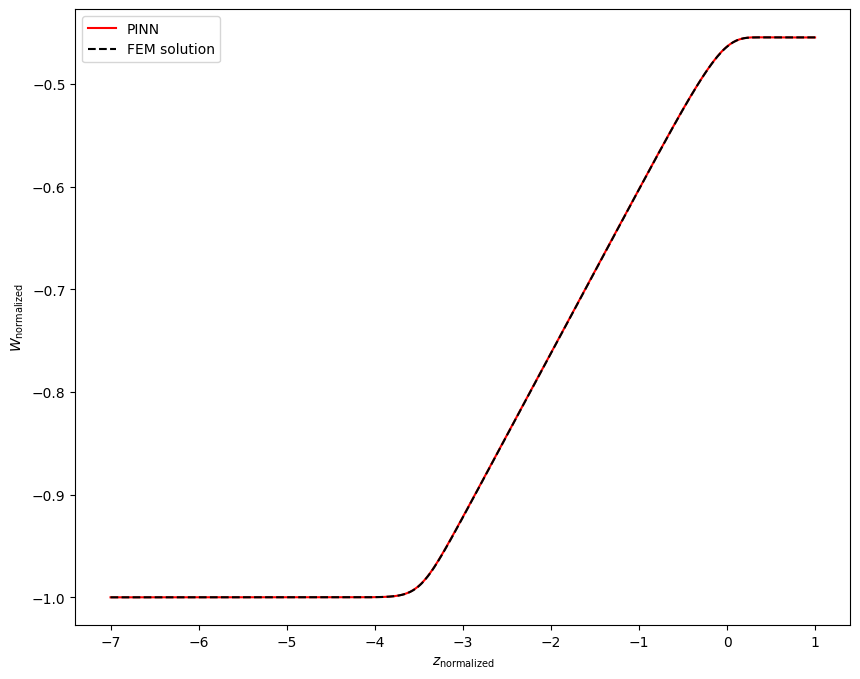


Epoch: 220000/400000
Loss: 0.06045583635568619
C_mean: -11.695188522338867
C_std: 0.020381217822432518
Loss ODE: 0.022960180416703224
Loss z0: 0.0
Loss zf: 0.00012096762657165527
KL divergence: 3.6285979747772217


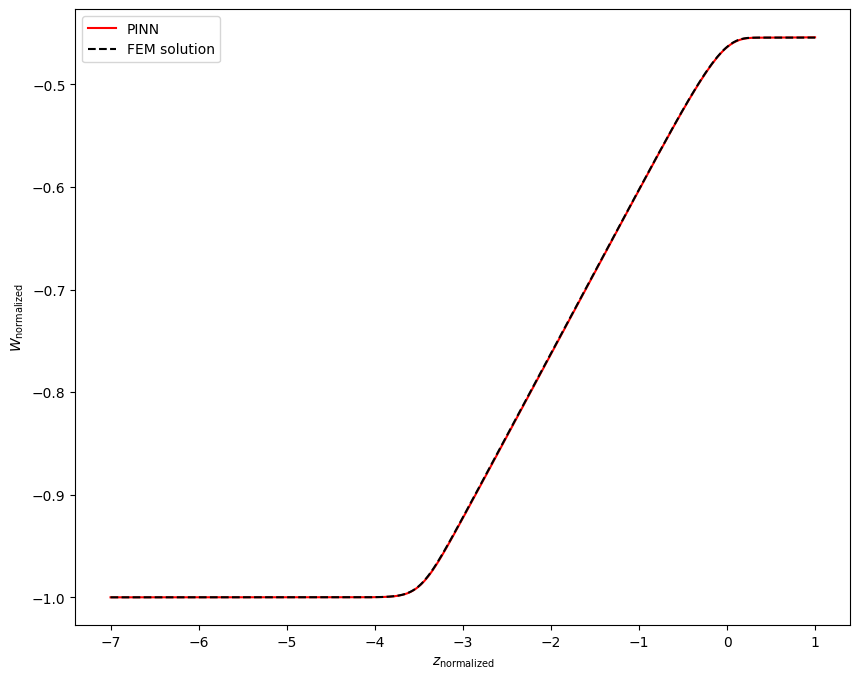


Epoch: 221000/400000
Loss: 0.06485843658447266
C_mean: -11.695408821105957
C_std: 0.020229661837220192
Loss ODE: 0.024982381612062454
Loss z0: 0.0
Loss zf: 0.0003515183925628662
KL divergence: 3.6360867023468018


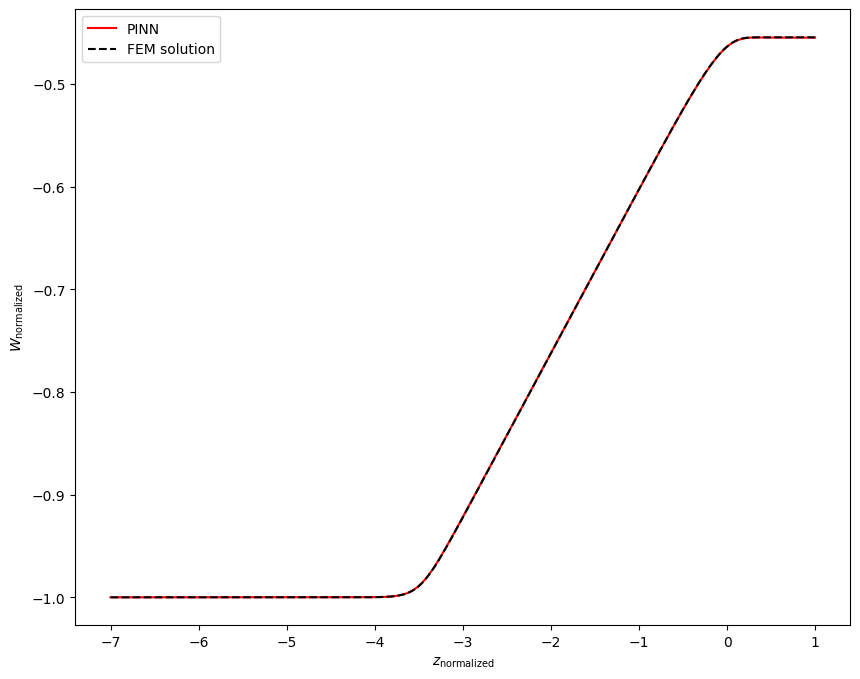


Epoch: 222000/400000
Loss: 0.05532762408256531
C_mean: -11.695296287536621
C_std: 0.02022613026201725
Loss ODE: 0.016145553439855576
Loss z0: 0.0
Loss zf: 0.00028195977210998535
KL divergence: 3.636247396469116


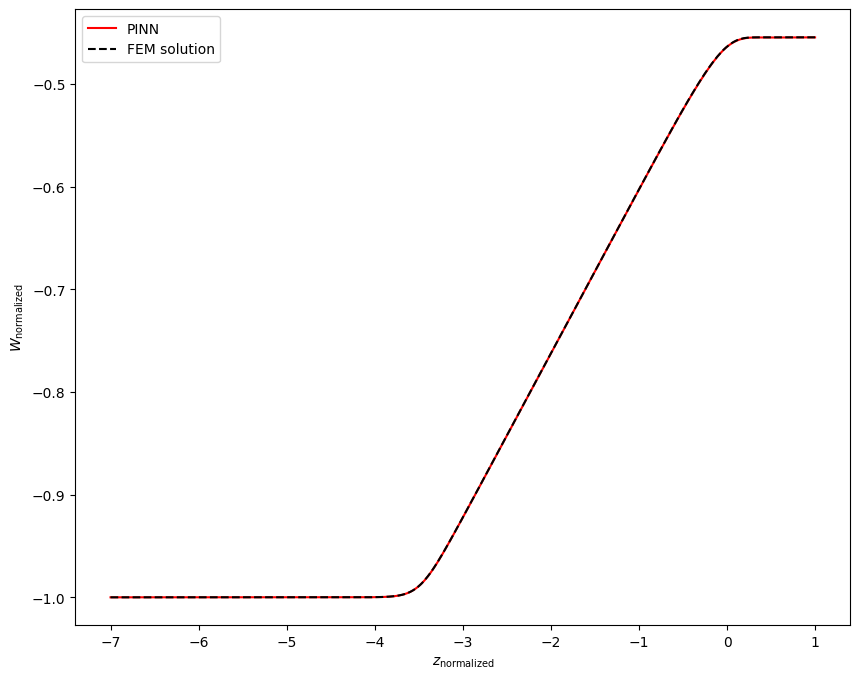


Epoch: 223000/400000
Loss: 0.07134480774402618
C_mean: -11.695319175720215
C_std: 0.020171400159597397
Loss ODE: 0.033409394323825836
Loss z0: 0.0
Loss zf: 0.00015458464622497559
KL divergence: 3.6389567852020264


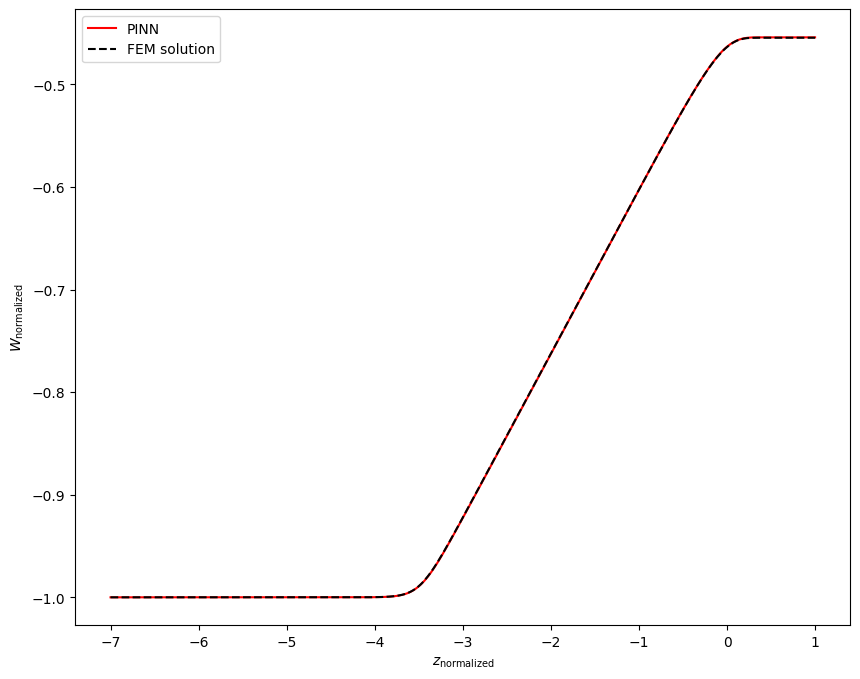


Epoch: 224000/400000
Loss: 0.0444549098610878
C_mean: -11.695472717285156
C_std: 0.020143188536167145
Loss ODE: 0.005126453470438719
Loss z0: 0.0
Loss zf: 0.0002924501895904541
KL divergence: 3.6403956413269043


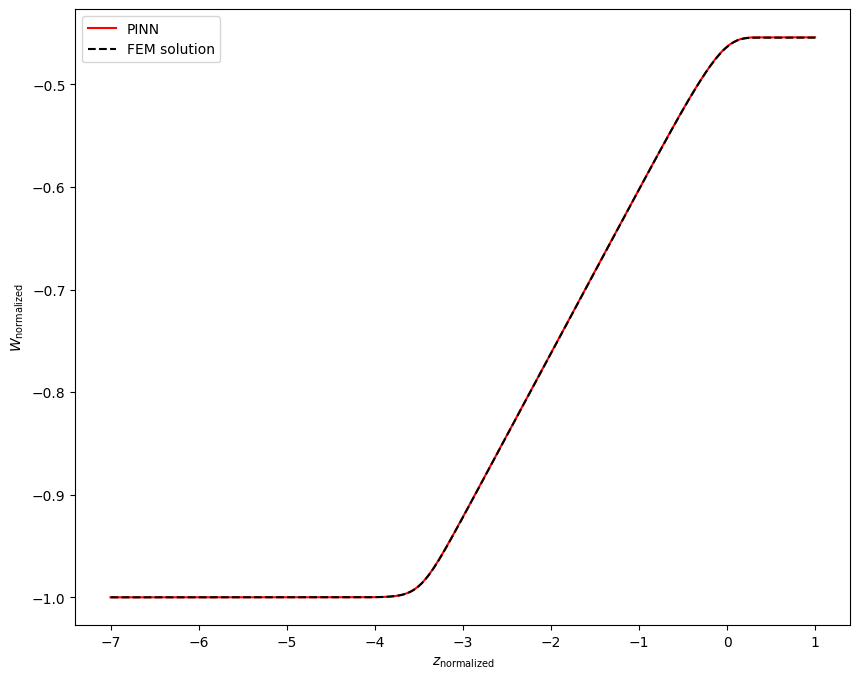


Epoch: 225000/400000
Loss: 0.05271634832024574
C_mean: -11.695186614990234
C_std: 0.02022732049226761
Loss ODE: 0.01567038893699646
Loss z0: 0.0
Loss zf: 6.839632987976074e-05
KL divergence: 3.636199712753296


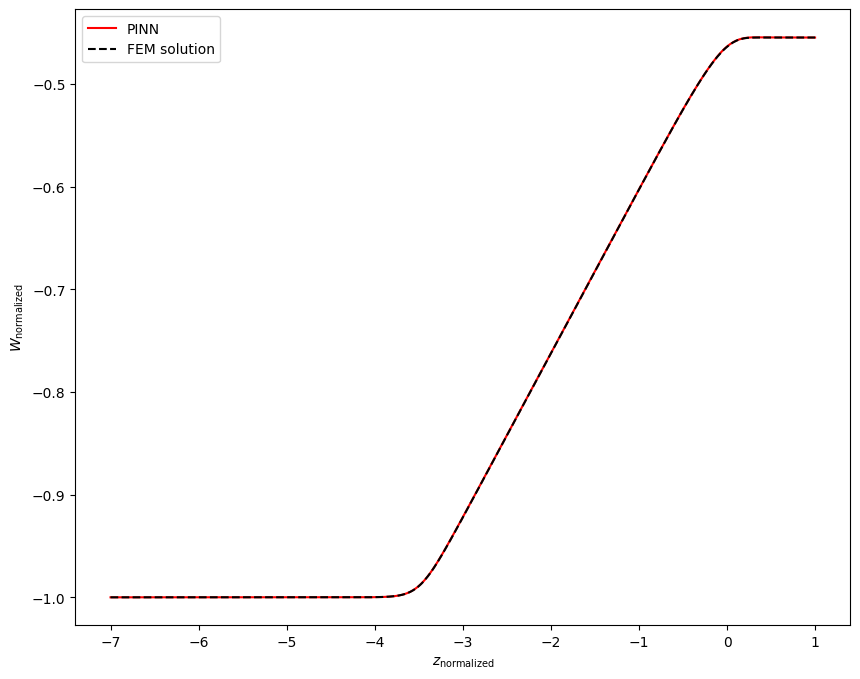


Epoch: 226000/400000
Loss: 0.0530814602971077
C_mean: -11.695515632629395
C_std: 0.020231574773788452
Loss ODE: 0.01545494981110096
Loss z0: 0.0
Loss zf: 0.00012663006782531738
KL divergence: 3.636021375656128


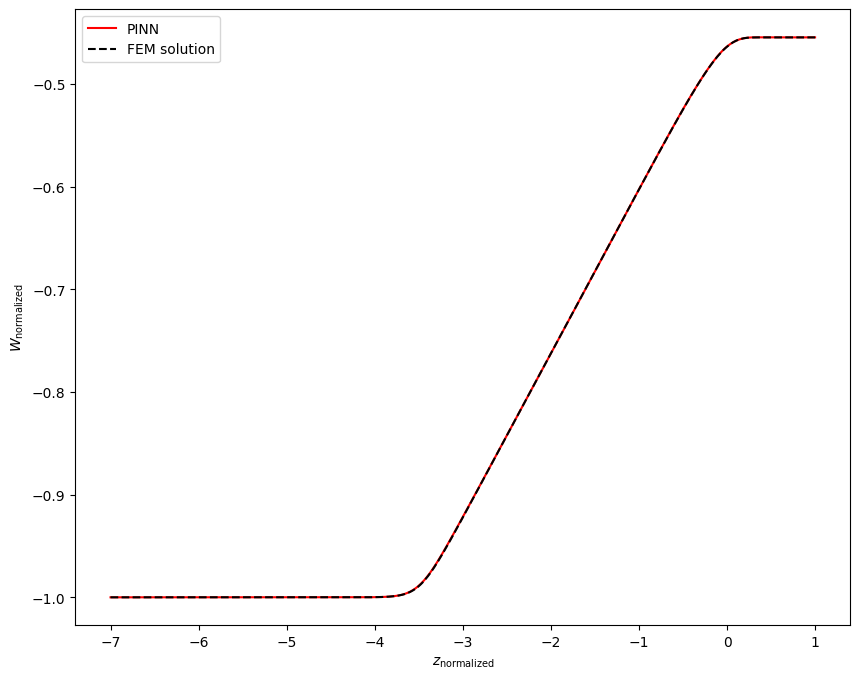


Epoch: 227000/400000
Loss: 0.045065149664878845
C_mean: -11.695253372192383
C_std: 0.020197756588459015
Loss ODE: 0.008026186376810074
Loss z0: 0.0
Loss zf: 6.625056266784668e-05
KL divergence: 3.637645721435547


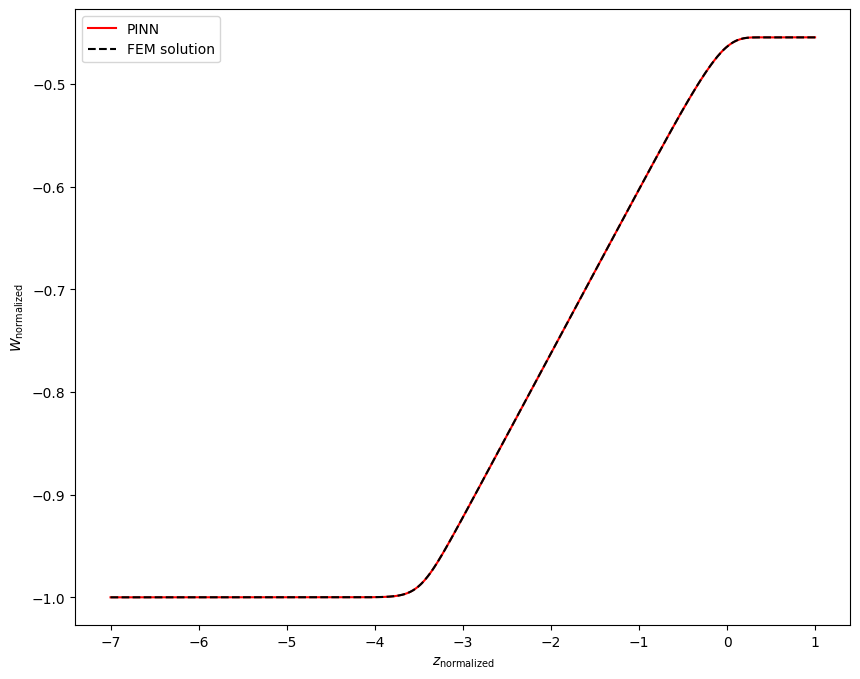


Epoch: 228000/400000
Loss: 0.048772986978292465
C_mean: -11.69522762298584
C_std: 0.02025163359940052
Loss ODE: 0.008750512264668941
Loss z0: 0.0
Loss zf: 0.00036725401878356934
KL divergence: 3.634993553161621


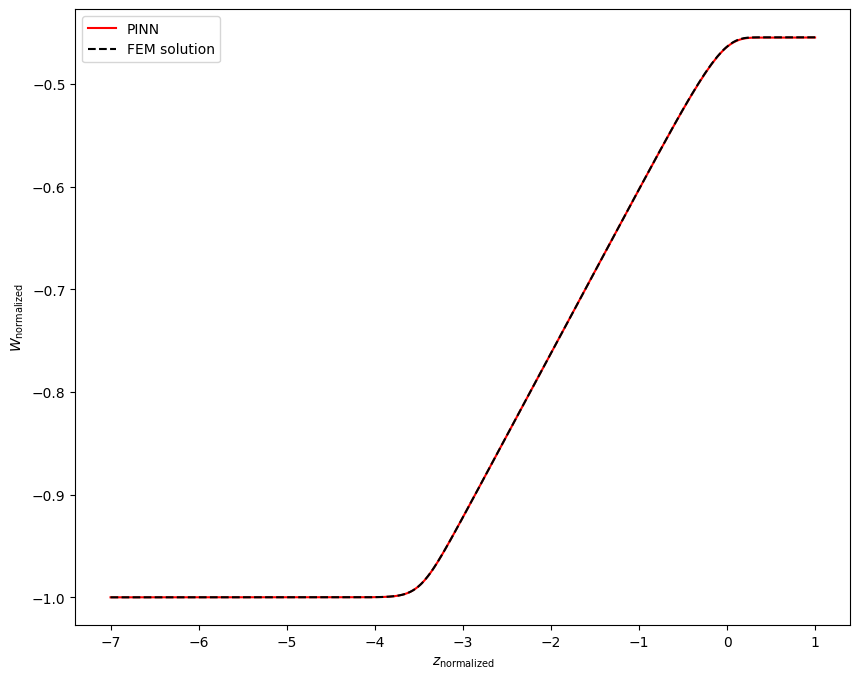


Epoch: 229000/400000
Loss: 0.054973162710666656
C_mean: -11.695287704467773
C_std: 0.020233184099197388
Loss ODE: 0.01776745915412903
Loss z0: 0.0
Loss zf: 8.466839790344238e-05
KL divergence: 3.635901927947998


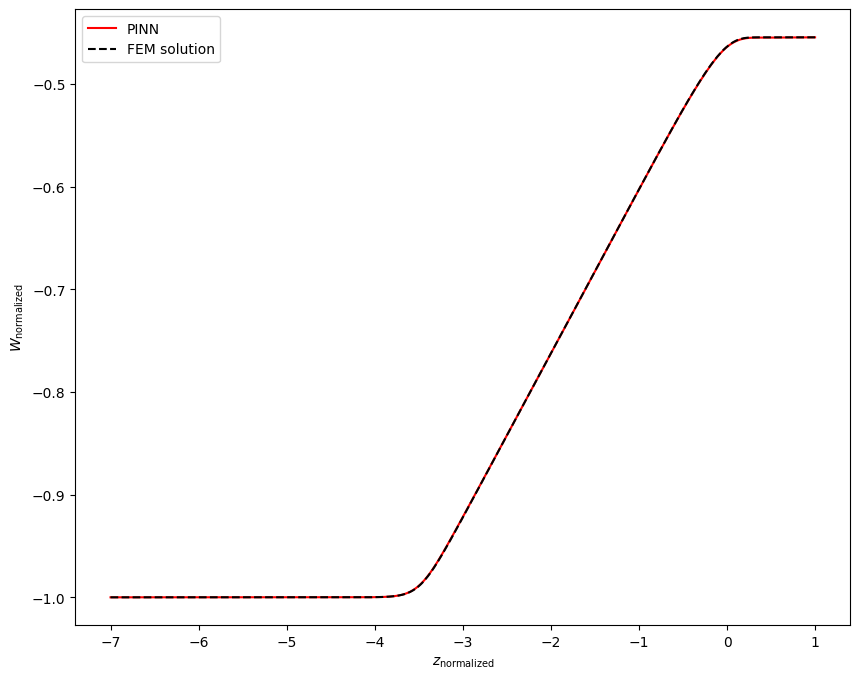


Epoch: 230000/400000
Loss: 0.06681610643863678
C_mean: -11.695054054260254
C_std: 0.02023618295788765
Loss ODE: 0.027510011568665504
Loss z0: 0.0
Loss zf: 0.0002948641777038574
KL divergence: 3.635745048522949


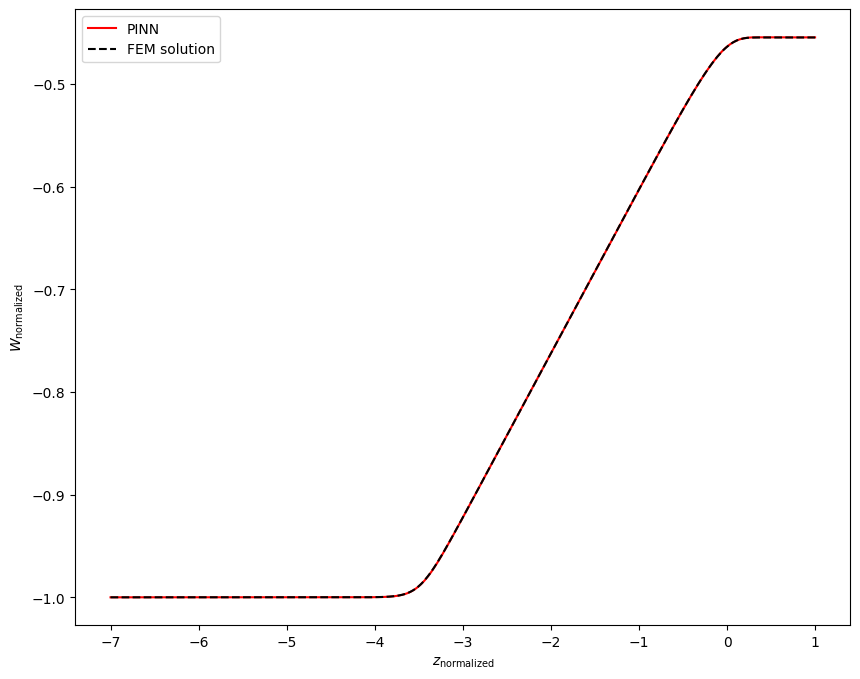


Epoch: 231000/400000
Loss: 0.051414184272289276
C_mean: -11.695103645324707
C_std: 0.020163845270872116
Loss ODE: 0.014440535567700863
Loss z0: 0.0
Loss zf: 5.805492401123047e-05
KL divergence: 3.639309883117676


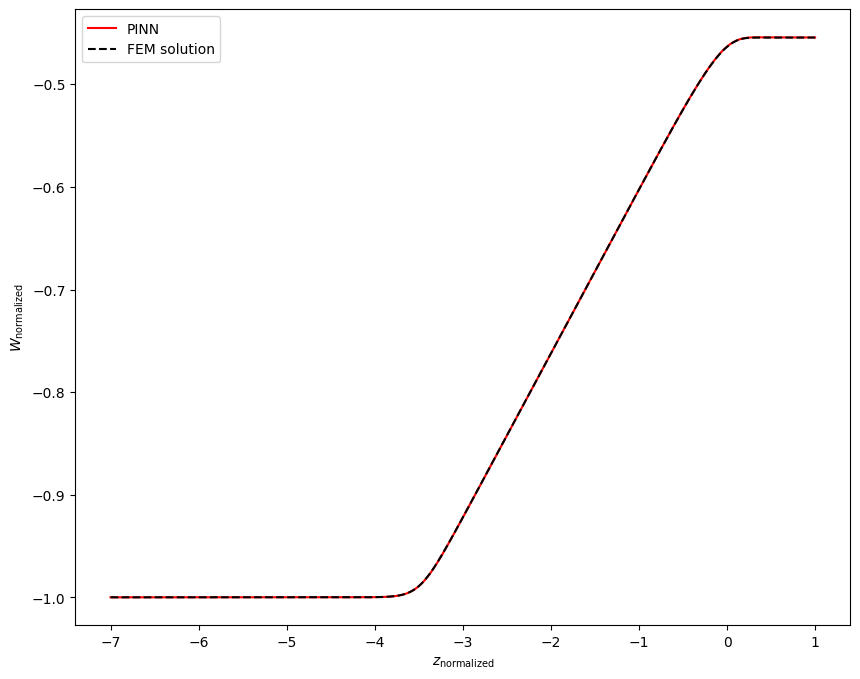


Epoch: 232000/400000
Loss: 0.05073198676109314
C_mean: -11.69506549835205
C_std: 0.020076358690857887
Loss ODE: 0.009507352486252785
Loss z0: 0.0
Loss zf: 0.0004788041114807129
KL divergence: 3.6436595916748047


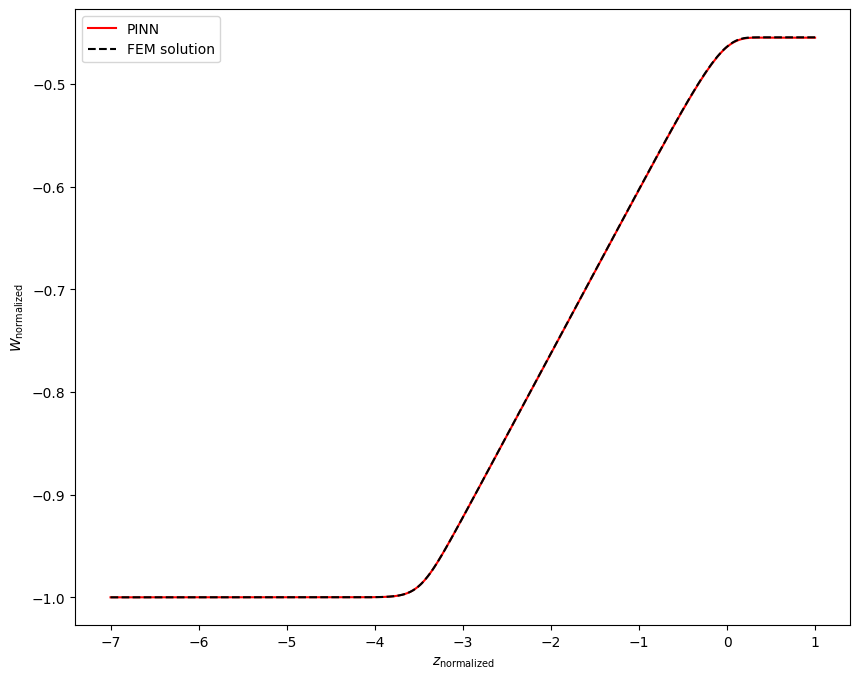


Epoch: 233000/400000
Loss: 0.0582570806145668
C_mean: -11.695219039916992
C_std: 0.020077666267752647
Loss ODE: 0.017409494146704674
Loss z0: 0.0
Loss zf: 0.000441133975982666
KL divergence: 3.643624782562256


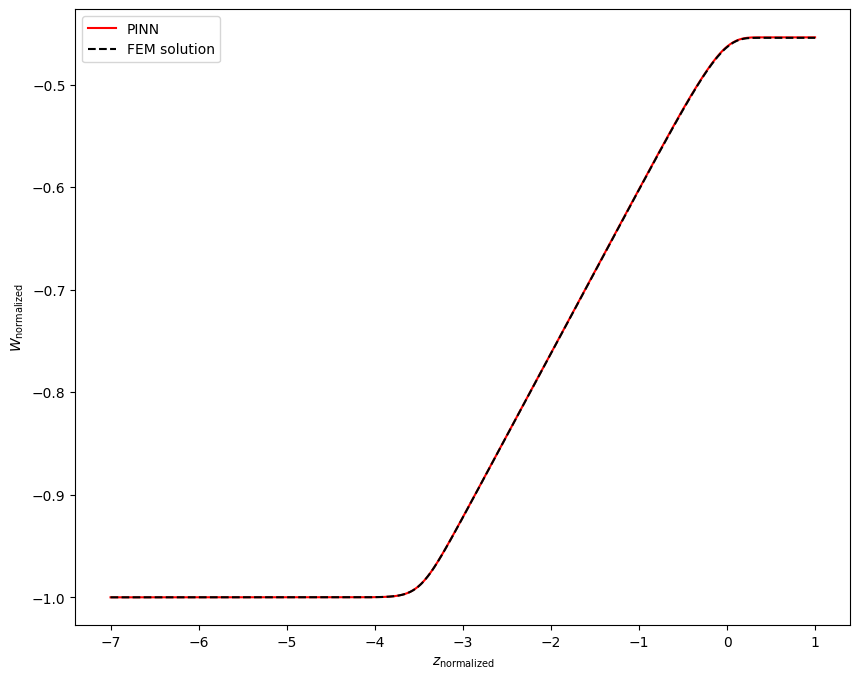


Epoch: 234000/400000
Loss: 0.05107390135526657
C_mean: -11.69500732421875
C_std: 0.020024025812745094
Loss ODE: 0.012294990941882133
Loss z0: 0.0
Loss zf: 0.00023162364959716797
KL divergence: 3.6462676525115967


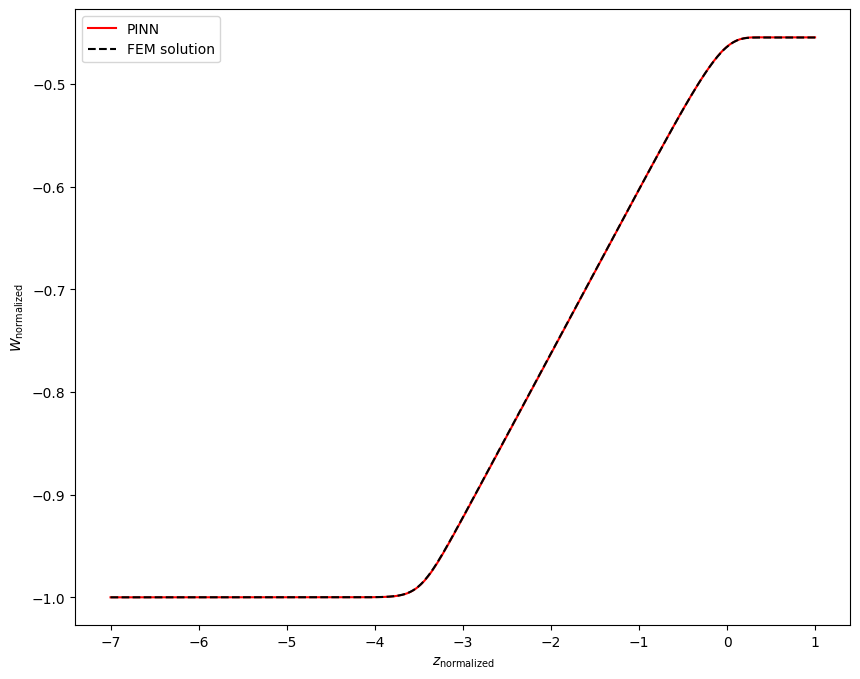


Epoch: 235000/400000
Loss: 0.06612743437290192
C_mean: -11.695269584655762
C_std: 0.02004467509686947
Loss ODE: 0.02913309447467327
Loss z0: 0.0
Loss zf: 5.418062210083008e-05
KL divergence: 3.6452534198760986


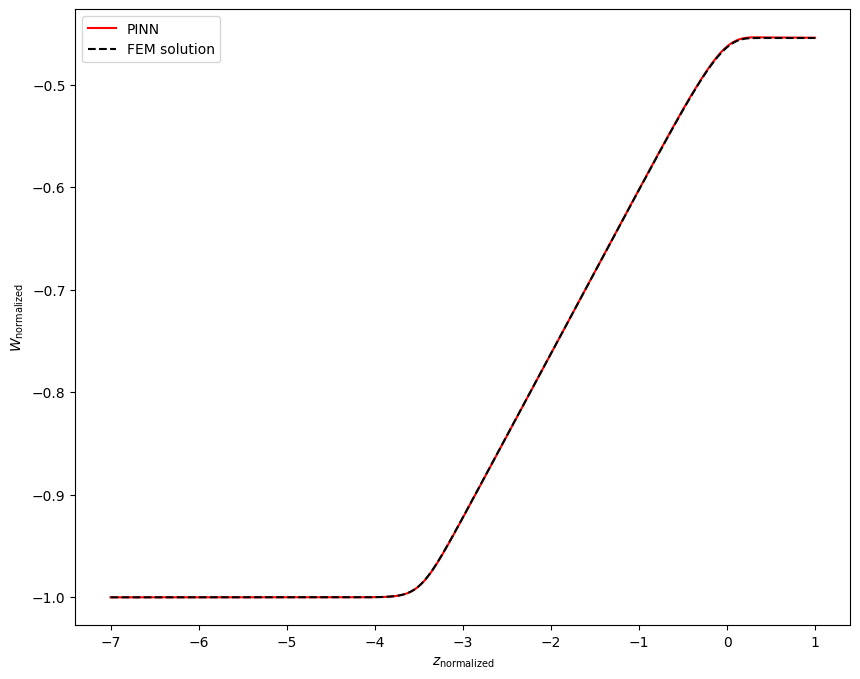


Epoch: 236000/400000
Loss: 0.04700380563735962
C_mean: -11.695072174072266
C_std: 0.020091181620955467
Loss ODE: 0.009609832428395748
Loss z0: 0.0
Loss zf: 9.647011756896973e-05
KL divergence: 3.6429271697998047


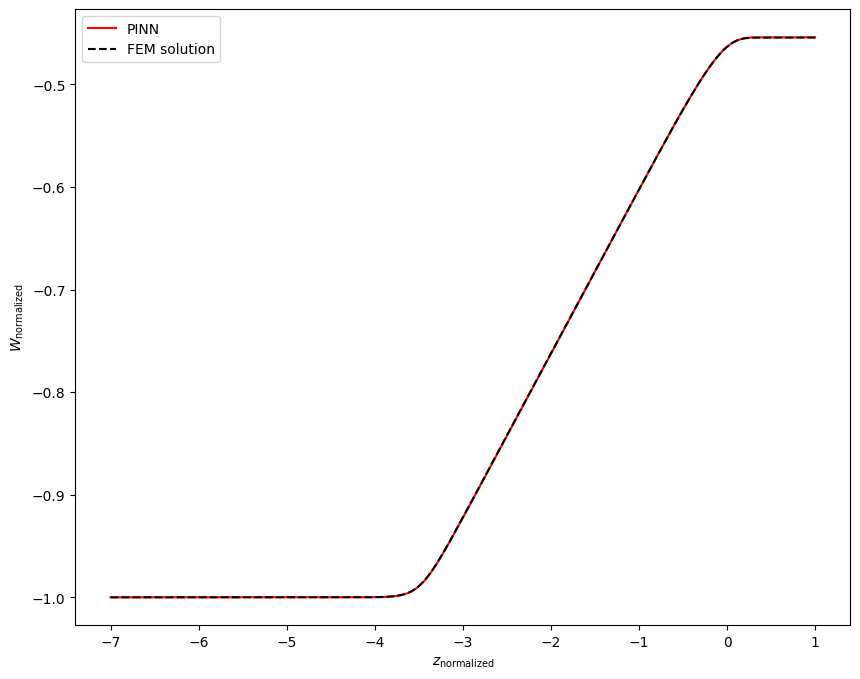


Epoch: 237000/400000
Loss: 0.054975271224975586
C_mean: -11.695221900939941
C_std: 0.01999983750283718
Loss ODE: 0.01572084054350853
Loss z0: 0.0
Loss zf: 0.0002779364585876465
KL divergence: 3.6475067138671875


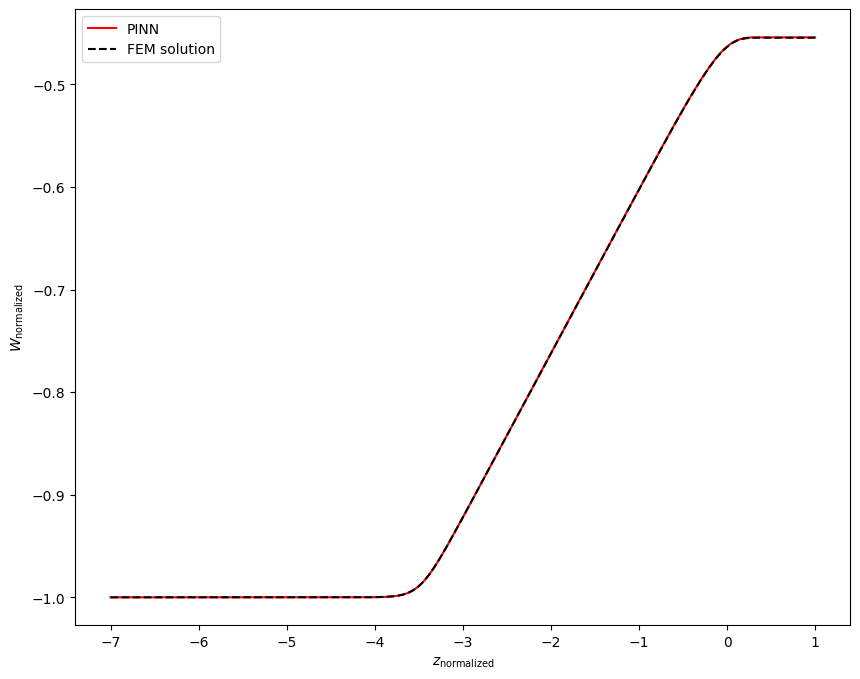


Epoch: 238000/400000
Loss: 0.047980472445487976
C_mean: -11.695244789123535
C_std: 0.019878413528203964
Loss ODE: 0.008542357012629509
Loss z0: 0.0
Loss zf: 0.00029021501541137695
KL divergence: 3.653596878051758


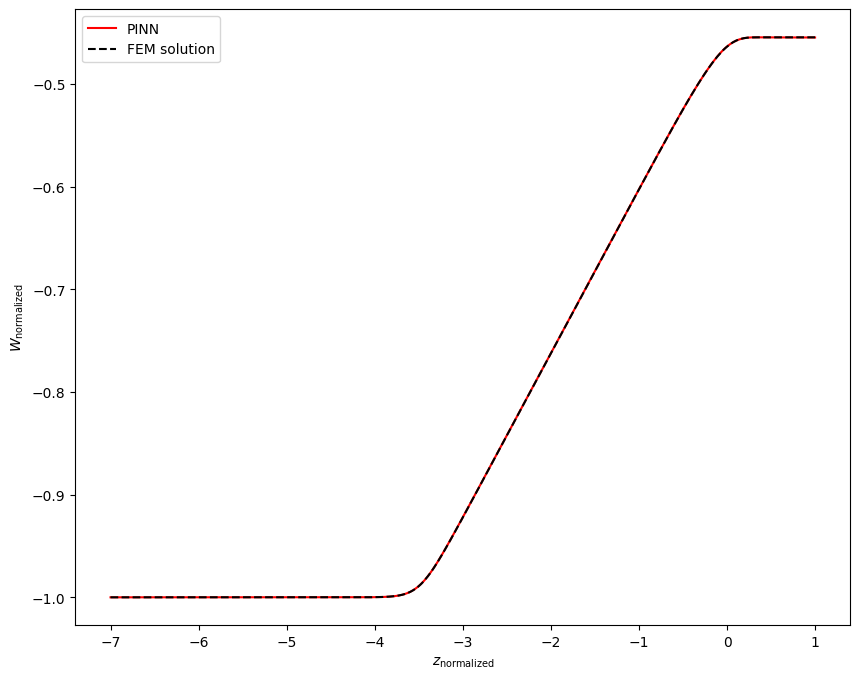


Epoch: 239000/400000
Loss: 0.04546242952346802
C_mean: -11.695212364196777
C_std: 0.019690267741680145
Loss ODE: 0.0051902648992836475
Loss z0: 0.0
Loss zf: 0.00036412477493286133
KL divergence: 3.6630918979644775


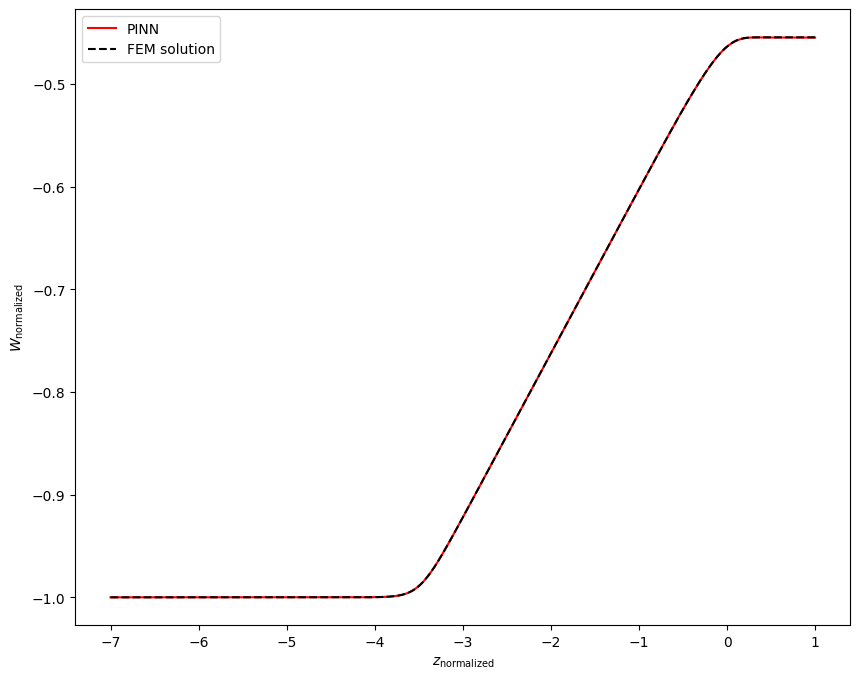


Epoch: 240000/400000
Loss: 0.06348781287670135
C_mean: -11.695242881774902
C_std: 0.019676566123962402
Loss ODE: 0.0264578890055418
Loss z0: 0.0
Loss zf: 3.9190053939819336e-05
KL divergence: 3.6638026237487793


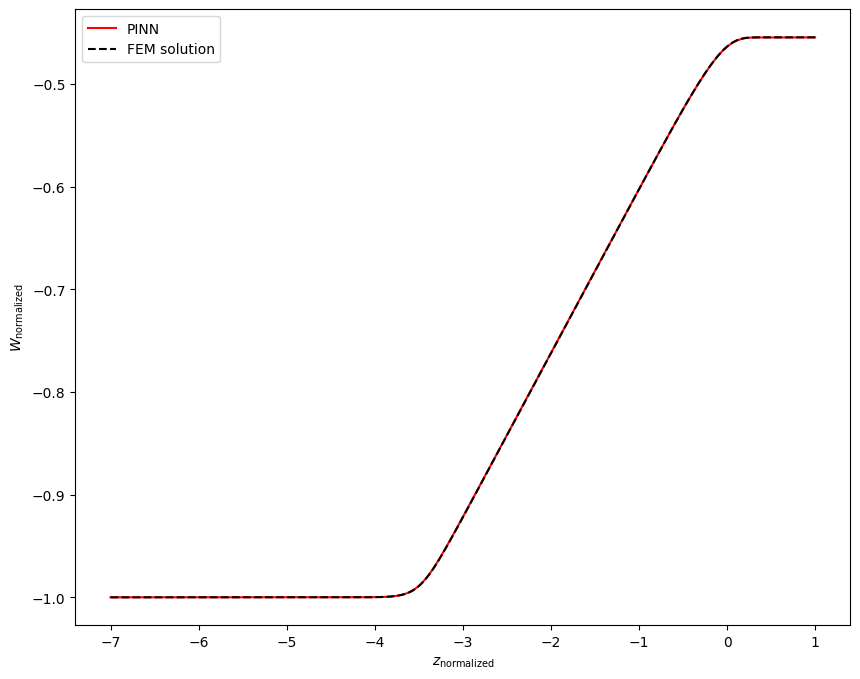


Epoch: 241000/400000
Loss: 0.06463216990232468
C_mean: -11.695321083068848
C_std: 0.019666755571961403
Loss ODE: 0.027960073202848434
Loss z0: 0.0
Loss zf: 2.9206275939941406e-06
KL divergence: 3.6642892360687256


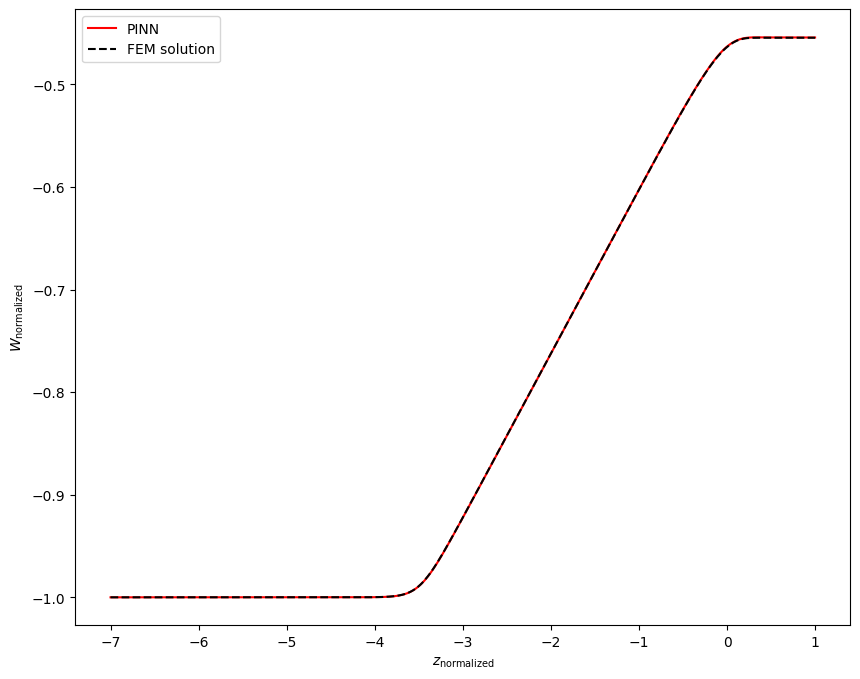


Epoch: 242000/400000
Loss: 0.04080246761441231
C_mean: -11.695367813110352
C_std: 0.019628386944532394
Loss ODE: 0.0039008324965834618
Loss z0: 0.0
Loss zf: 2.390146255493164e-05
KL divergence: 3.666261911392212


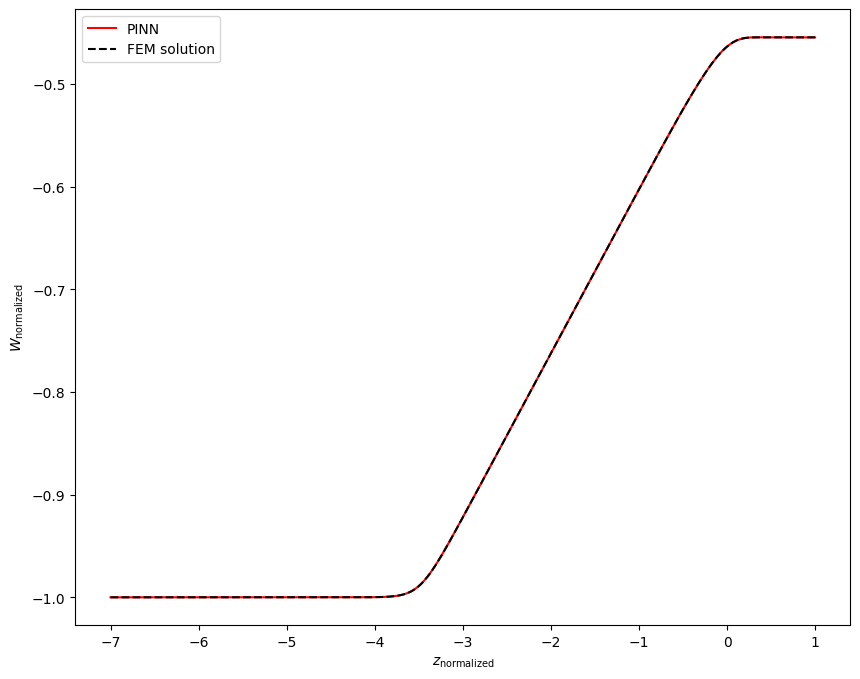


Epoch: 243000/400000
Loss: 0.07360626012086868
C_mean: -11.695103645324707
C_std: 0.01954798959195614
Loss ODE: 0.032759033143520355
Loss z0: 0.0
Loss zf: 0.0004144012928009033
KL divergence: 3.670321464538574


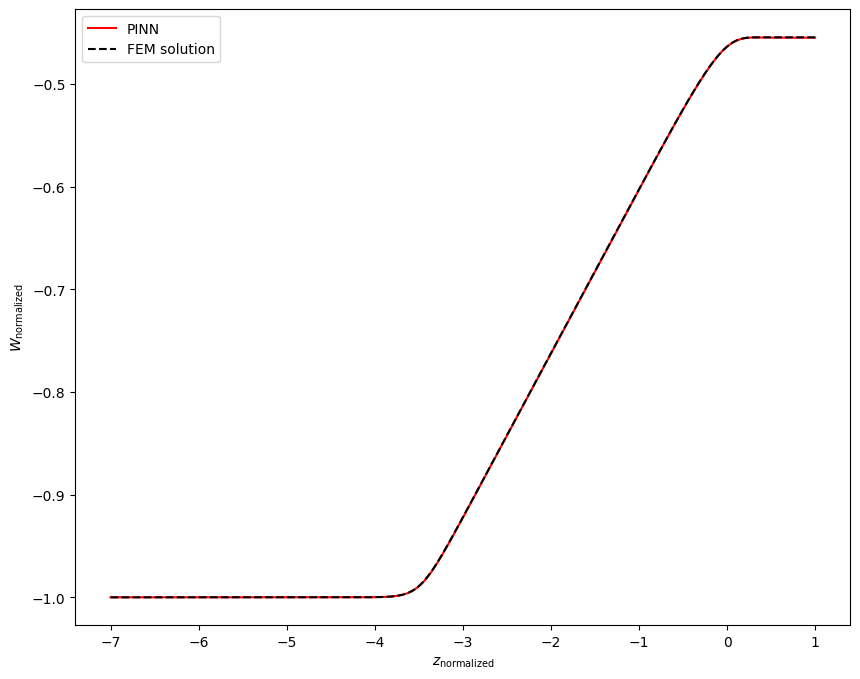


Epoch: 244000/400000
Loss: 0.0528767928481102
C_mean: -11.695134162902832
C_std: 0.01943611167371273
Loss ODE: 0.015142044052481651
Loss z0: 0.0
Loss zf: 9.739398956298828e-05
KL divergence: 3.6760807037353516


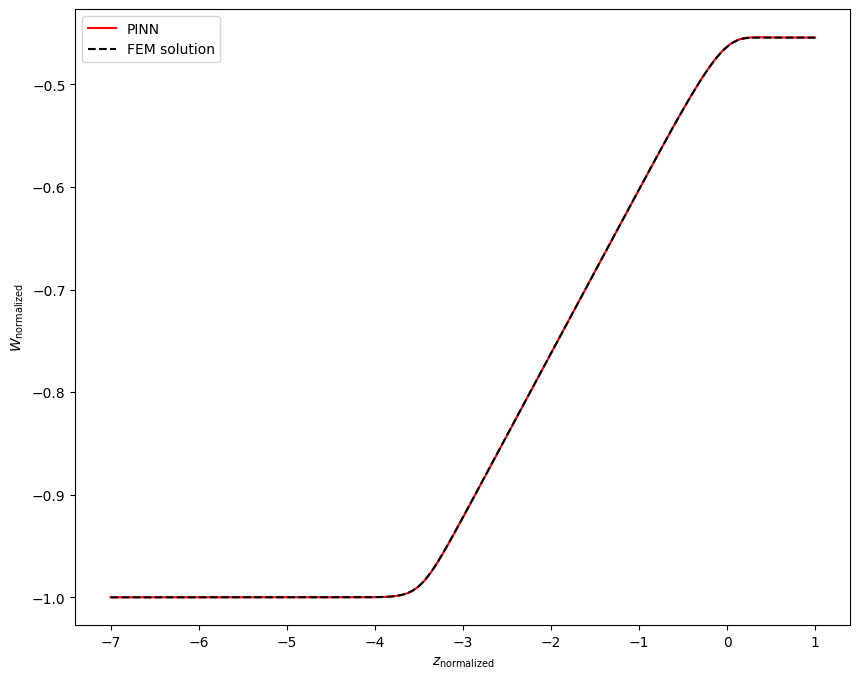


Epoch: 245000/400000
Loss: 0.05011298507452011
C_mean: -11.695122718811035
C_std: 0.019439473748207092
Loss ODE: 0.011585257016122341
Loss z0: 0.0
Loss zf: 0.00017687678337097168
KL divergence: 3.675896167755127


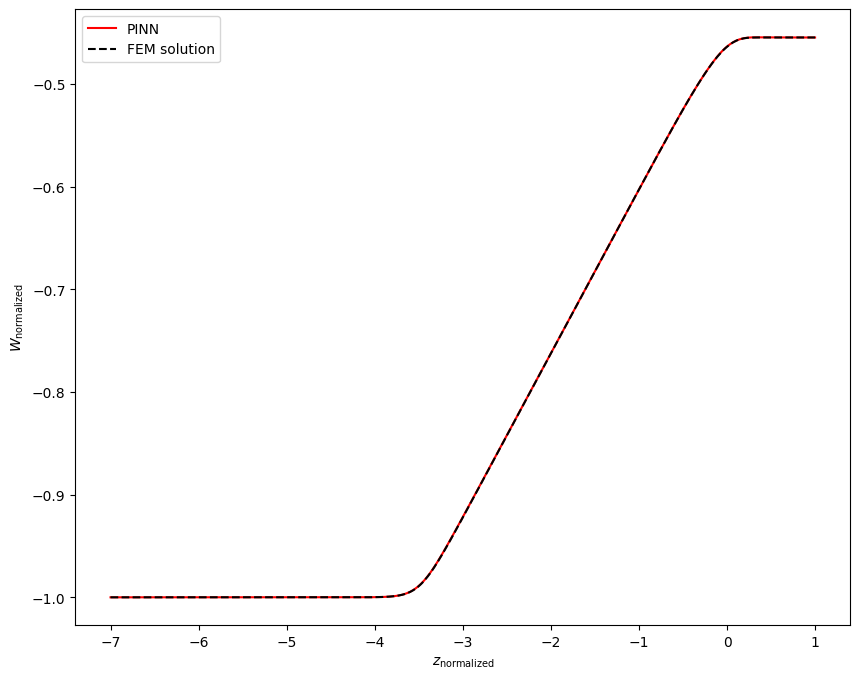


Epoch: 246000/400000
Loss: 0.05718564987182617
C_mean: -11.695024490356445
C_std: 0.01943073235452175
Loss ODE: 0.019610291346907616
Loss z0: 0.0
Loss zf: 8.121132850646973e-05
KL divergence: 3.6763248443603516


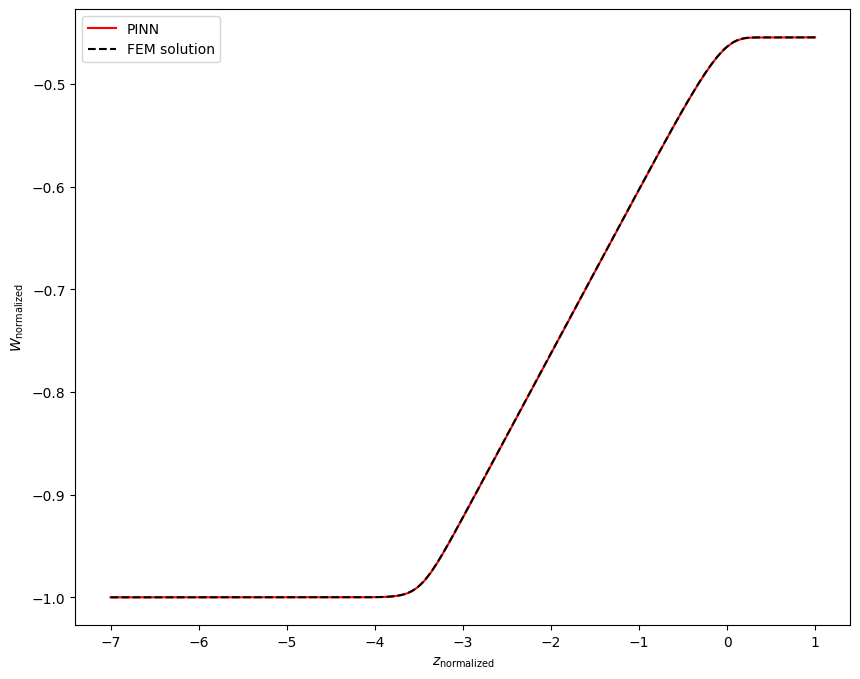


Epoch: 247000/400000
Loss: 0.060015760362148285
C_mean: -11.695283889770508
C_std: 0.019474931061267853
Loss ODE: 0.02323659136891365
Loss z0: 0.0
Loss zf: 3.814697265625e-06
KL divergence: 3.674102306365967


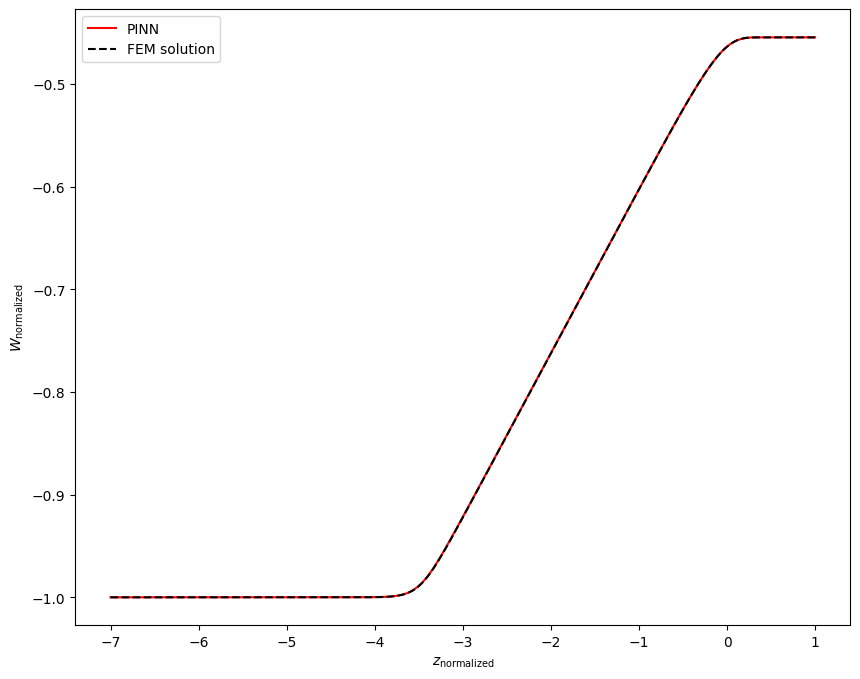


Epoch: 248000/400000
Loss: 0.04563054069876671
C_mean: -11.694878578186035
C_std: 0.01948392204940319
Loss ODE: 0.008375504054129124
Loss z0: 0.0
Loss zf: 5.1915645599365234e-05
KL divergence: 3.6735880374908447


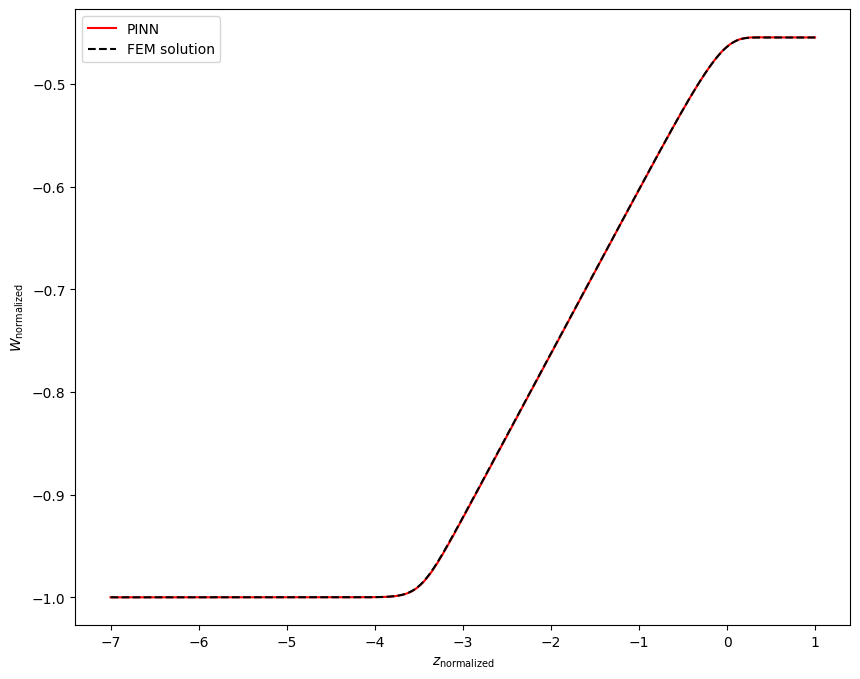


Epoch: 249000/400000
Loss: 0.05142655223608017
C_mean: -11.695079803466797
C_std: 0.019432498142123222
Loss ODE: 0.011825750581920147
Loss z0: 0.0
Loss zf: 0.00028383731842041016
KL divergence: 3.6762428283691406


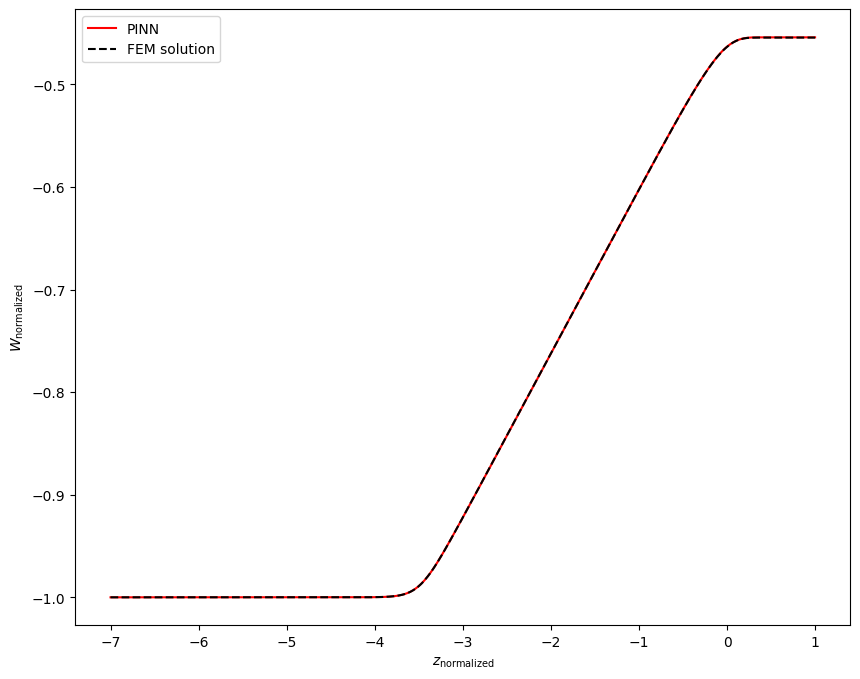


Epoch: 250000/400000
Loss: 0.0572412833571434
C_mean: -11.695019721984863
C_std: 0.01947832852602005
Loss ODE: 0.01952885091304779
Loss z0: 0.0
Loss zf: 9.736418724060059e-05
KL divergence: 3.6738791465759277


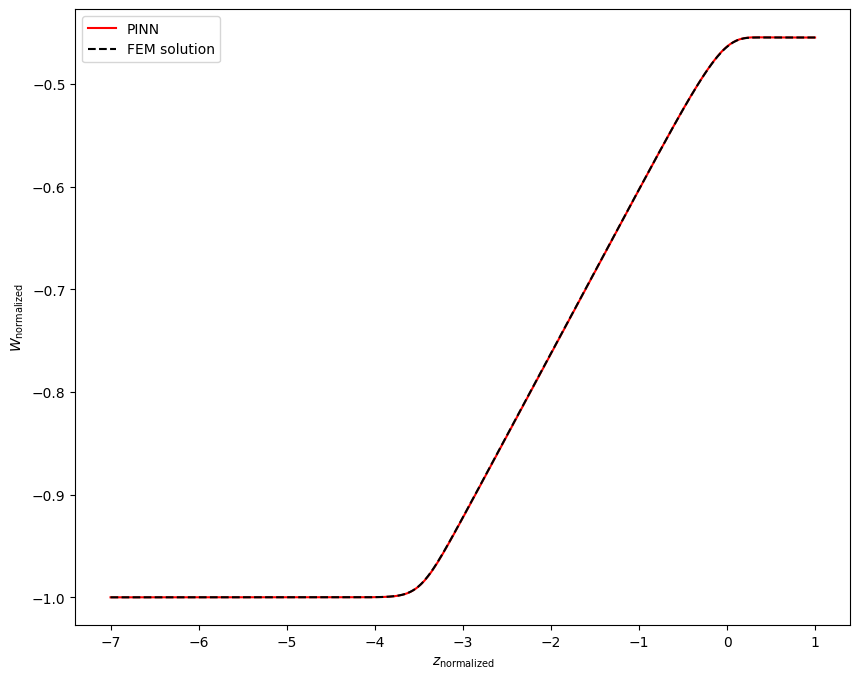


Epoch: 251000/400000
Loss: 0.05526110902428627
C_mean: -11.69499397277832
C_std: 0.0194700937718153
Loss ODE: 0.015462469309568405
Loss z0: 0.0
Loss zf: 0.00030556321144104004
KL divergence: 3.6743009090423584


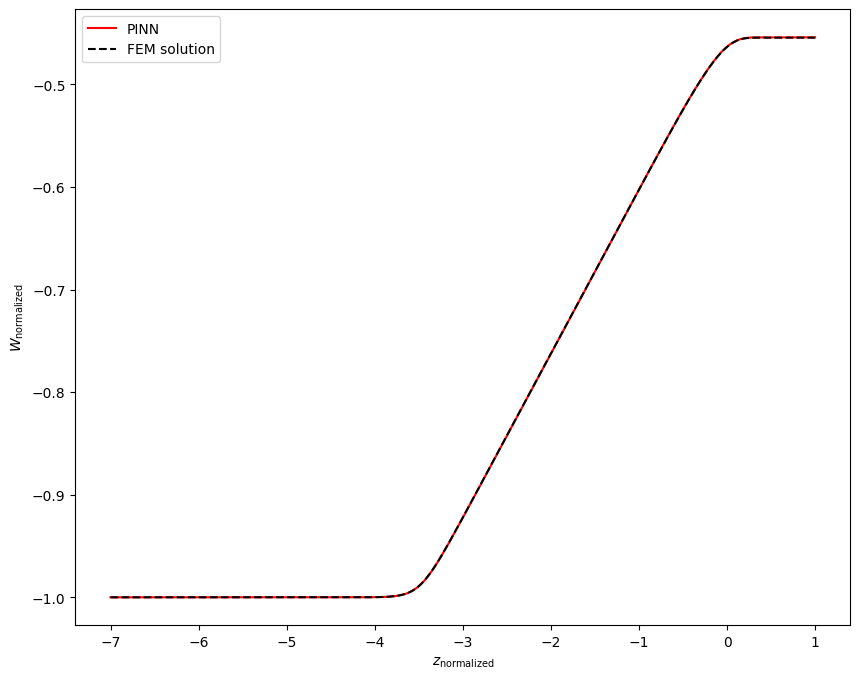


Epoch: 252000/400000
Loss: 0.0486905612051487
C_mean: -11.695059776306152
C_std: 0.0194246843457222
Loss ODE: 0.010329133830964565
Loss z0: 0.0
Loss zf: 0.0001595020294189453
KL divergence: 3.676640748977661


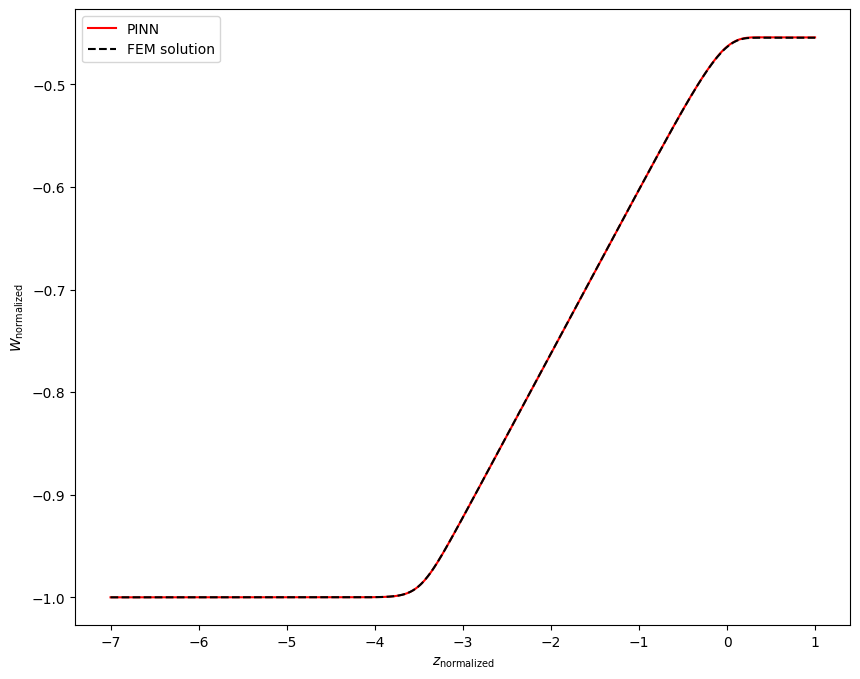


Epoch: 253000/400000
Loss: 0.060247235000133514
C_mean: -11.694890975952148
C_std: 0.019406374543905258
Loss ODE: 0.023113669827580452
Loss z0: 0.0
Loss zf: 3.579258918762207e-05
KL divergence: 3.6775639057159424


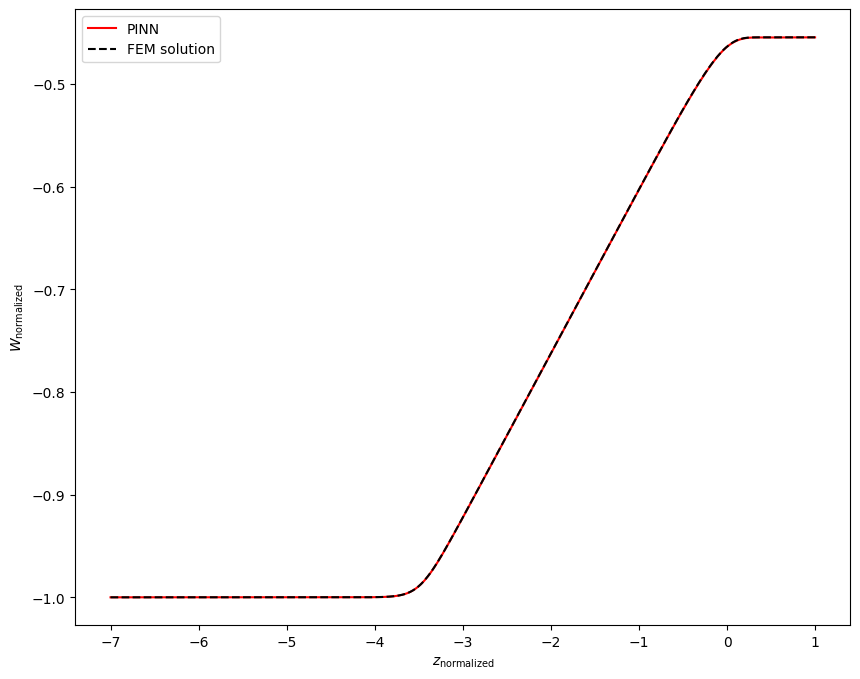


Epoch: 254000/400000
Loss: 0.05411910638213158
C_mean: -11.695133209228516
C_std: 0.01938006281852722
Loss ODE: 0.017059728503227234
Loss z0: 0.0
Loss zf: 2.6971101760864258e-05
KL divergence: 3.678966760635376


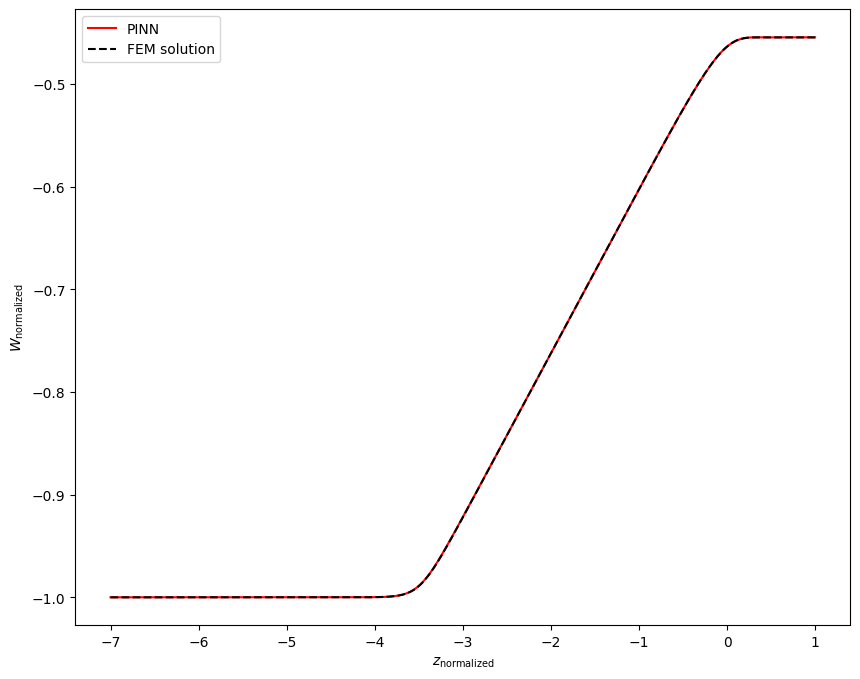


Epoch: 255000/400000
Loss: 0.04412664473056793
C_mean: -11.694828033447266
C_std: 0.019328156486153603
Loss ODE: 0.006667496170848608
Loss z0: 0.0
Loss zf: 6.431341171264648e-05
KL divergence: 3.6816015243530273


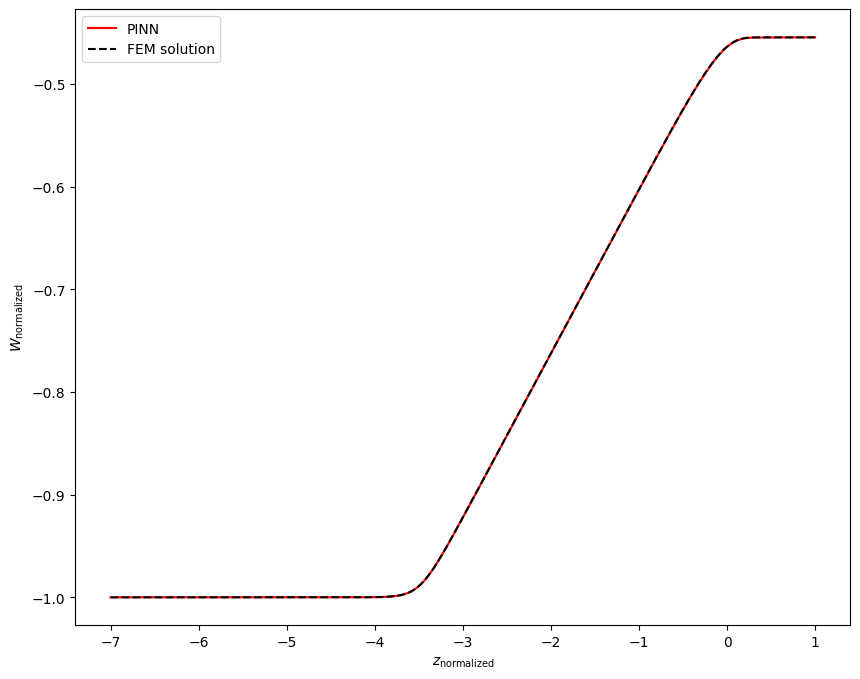


Epoch: 256000/400000
Loss: 0.05740957707166672
C_mean: -11.695151329040527
C_std: 0.019398702308535576
Loss ODE: 0.018173957243561745
Loss z0: 0.0
Loss zf: 0.0002455711364746094
KL divergence: 3.6779909133911133


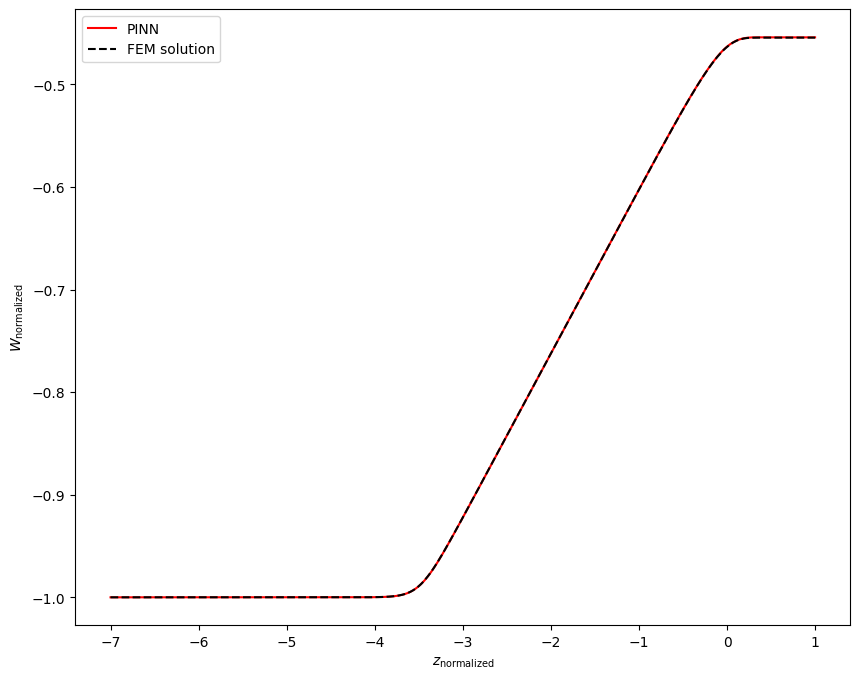


Epoch: 257000/400000
Loss: 0.06098135933279991
C_mean: -11.695096969604492
C_std: 0.019353168085217476
Loss ODE: 0.021838530898094177
Loss z0: 0.0
Loss zf: 0.0002339482307434082
KL divergence: 3.6803348064422607


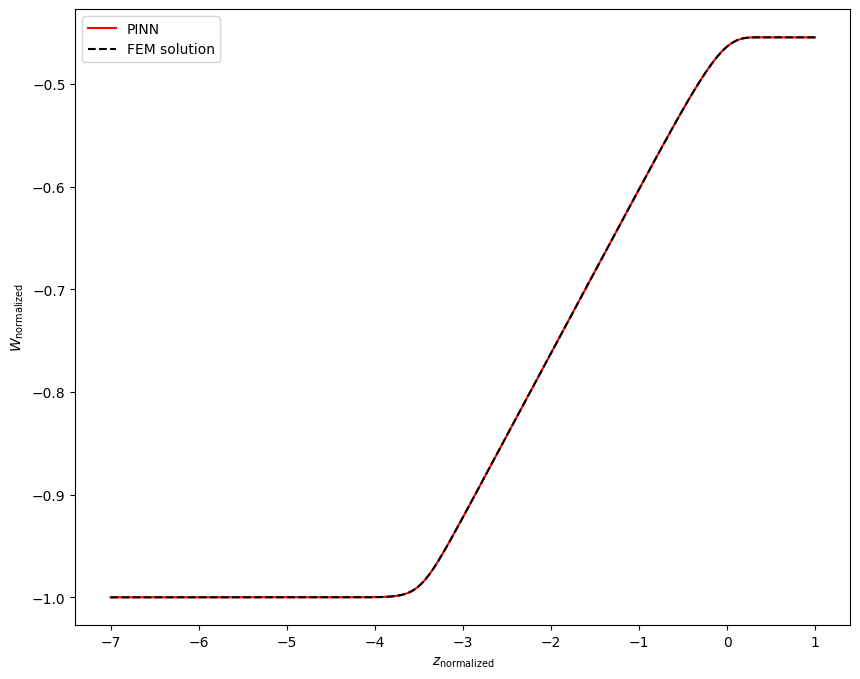


Epoch: 258000/400000
Loss: 0.07499009370803833
C_mean: -11.695343971252441
C_std: 0.01939636841416359
Loss ODE: 0.037442661821842194
Loss z0: 0.0
Loss zf: 7.659196853637695e-05
KL divergence: 3.6781516075134277


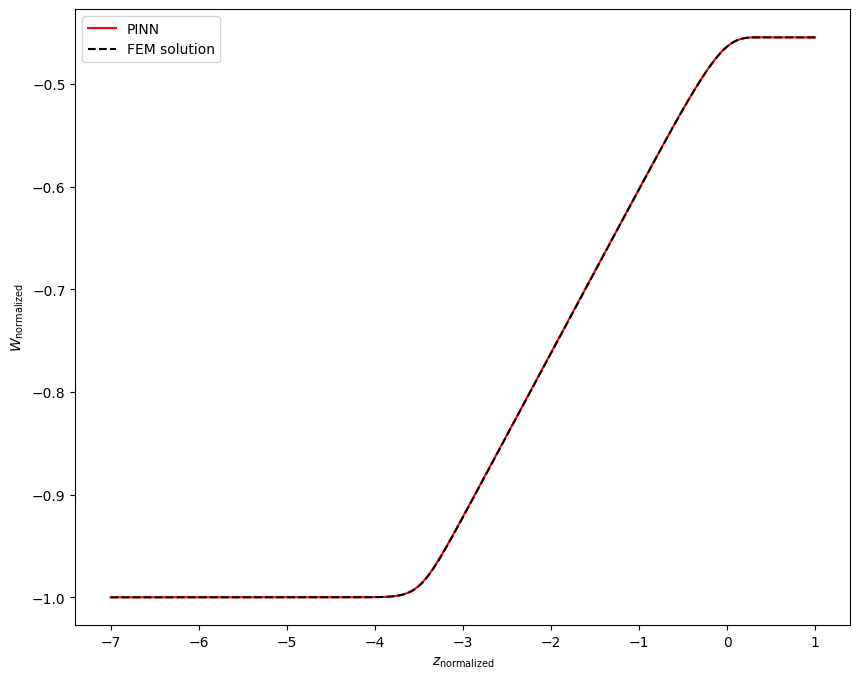


Epoch: 259000/400000
Loss: 0.050086915493011475
C_mean: -11.695173263549805
C_std: 0.01937205158174038
Loss ODE: 0.011237042024731636
Loss z0: 0.0
Loss zf: 0.00020560622215270996
KL divergence: 3.6793808937072754


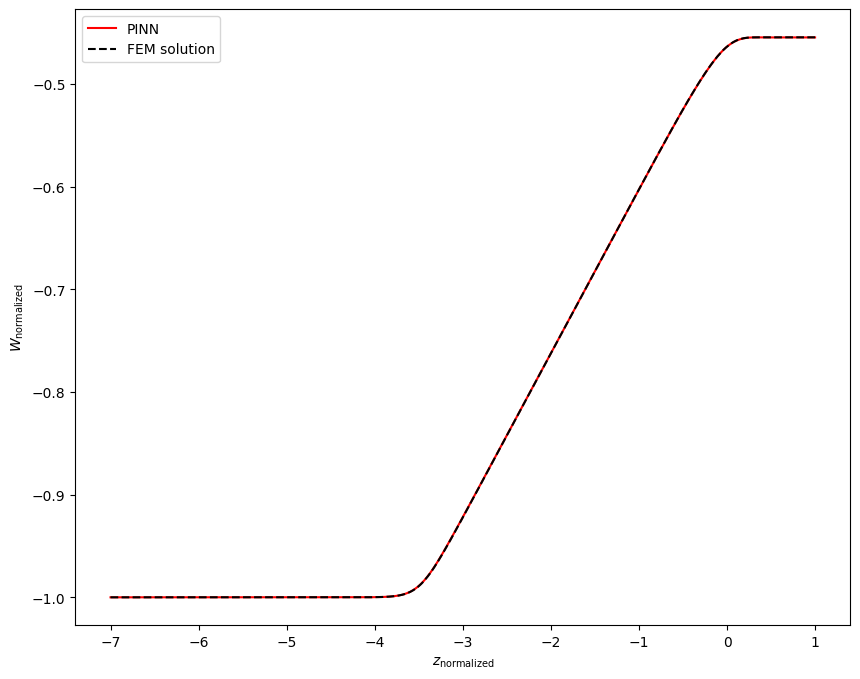


Epoch: 260000/400000
Loss: 0.047104090452194214
C_mean: -11.69526481628418
C_std: 0.019405269995331764
Loss ODE: 0.008605427108705044
Loss z0: 0.0
Loss zf: 0.00017219781875610352
KL divergence: 3.677668333053589


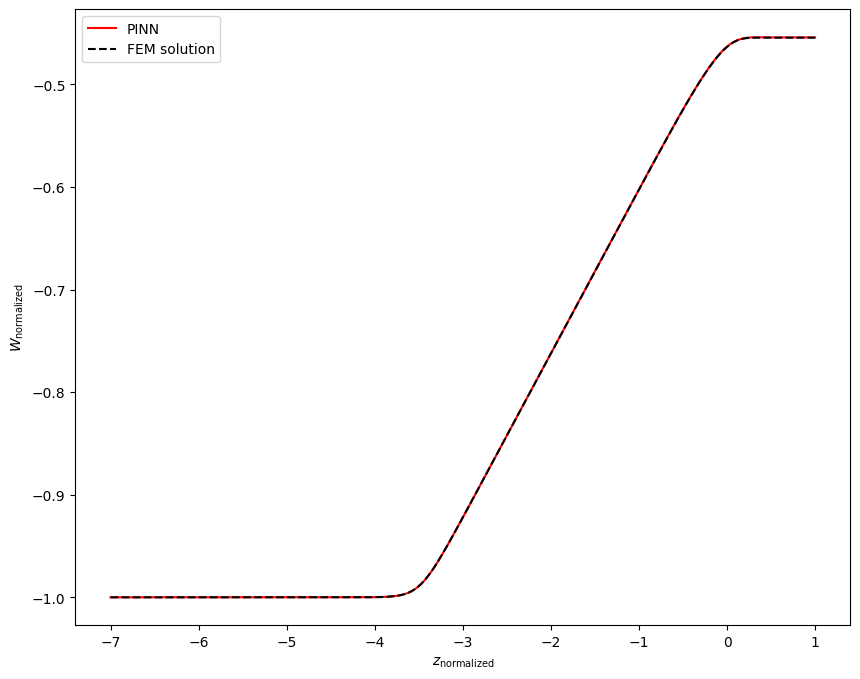


Epoch: 261000/400000
Loss: 0.0668153390288353
C_mean: -11.695201873779297
C_std: 0.01944279670715332
Loss ODE: 0.02772960439324379
Loss z0: 0.0
Loss zf: 0.00023284554481506348
KL divergence: 3.6757280826568604


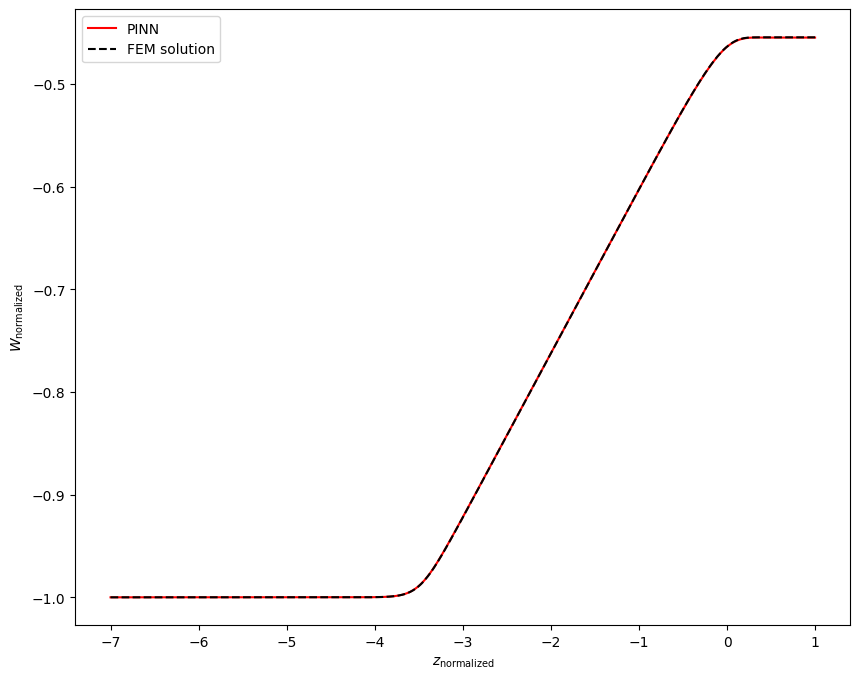


Epoch: 262000/400000
Loss: 0.056219808757305145
C_mean: -11.695265769958496
C_std: 0.0193832665681839
Loss ODE: 0.017677342519164085
Loss z0: 0.0
Loss zf: 0.0001754462718963623
KL divergence: 3.678800106048584


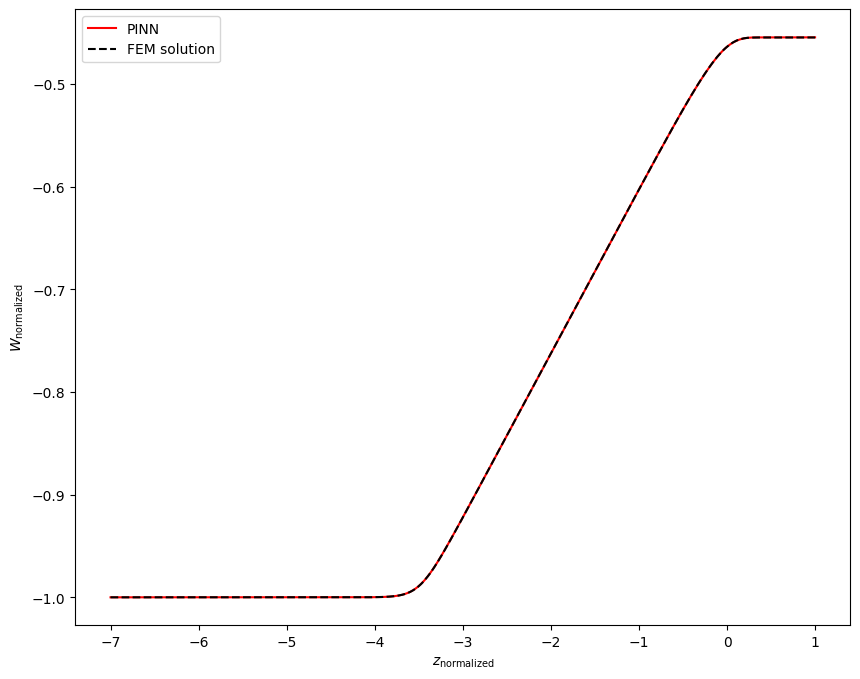


Epoch: 263000/400000
Loss: 0.06916147470474243
C_mean: -11.69534969329834
C_std: 0.01927906833589077
Loss ODE: 0.032215774059295654
Loss z0: 0.0
Loss zf: 1.0371208190917969e-05
KL divergence: 3.684199094772339


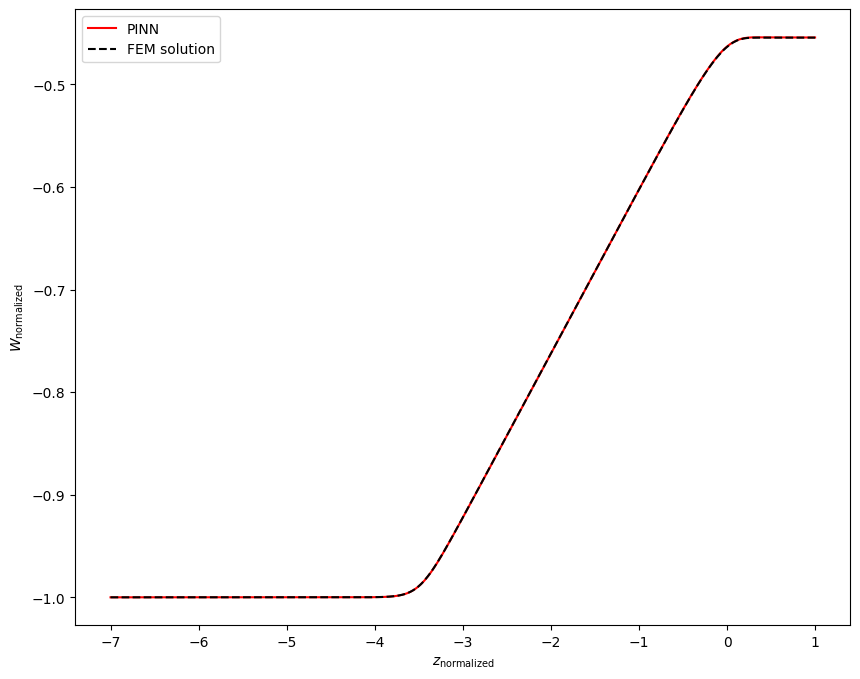


Epoch: 264000/400000
Loss: 0.0627075582742691
C_mean: -11.695256233215332
C_std: 0.019345764070749283
Loss ODE: 0.02544882893562317
Loss z0: 0.0
Loss zf: 4.51207160949707e-05
KL divergence: 3.6807525157928467


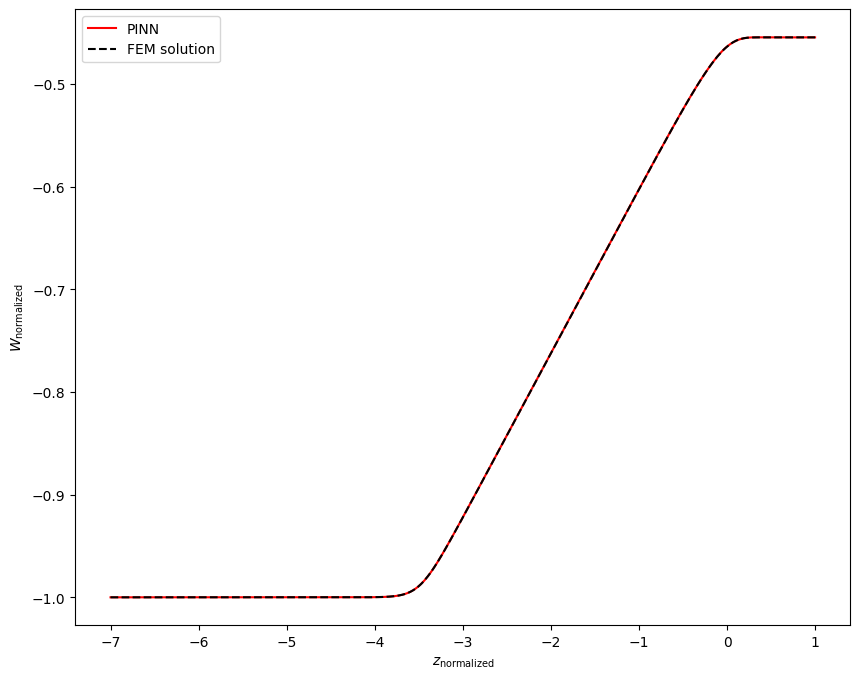


Epoch: 265000/400000
Loss: 0.042802177369594574
C_mean: -11.695157051086426
C_std: 0.01934993825852871
Loss ODE: 0.0036503674928098917
Loss z0: 0.0
Loss zf: 0.0002346634864807129
KL divergence: 3.6805174350738525


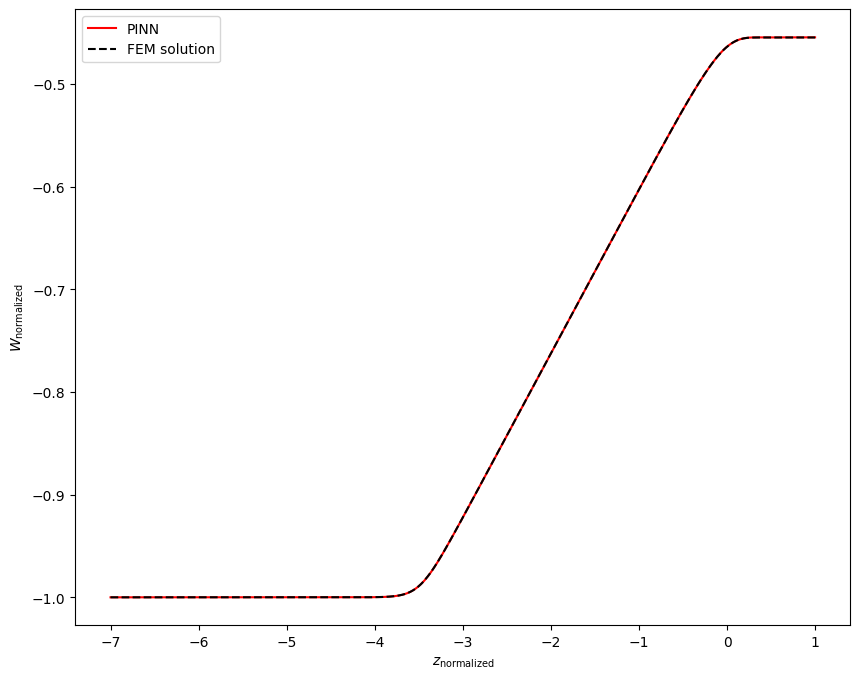


Epoch: 266000/400000
Loss: 0.057115279138088226
C_mean: -11.695160865783691
C_std: 0.019305961206555367
Loss ODE: 0.015134003944694996
Loss z0: 0.0
Loss zf: 0.0005153417587280273
KL divergence: 3.682785987854004


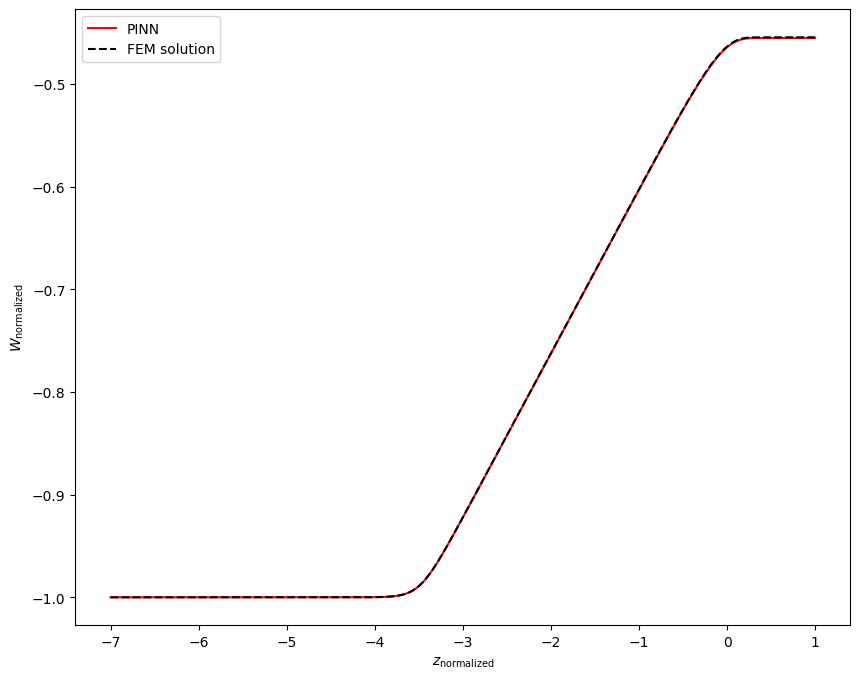


Epoch: 267000/400000
Loss: 0.07717381417751312
C_mean: -11.695429801940918
C_std: 0.019193993881344795
Loss ODE: 0.037547457963228226
Loss z0: 0.0
Loss zf: 0.0002740025520324707
KL divergence: 3.6886329650878906


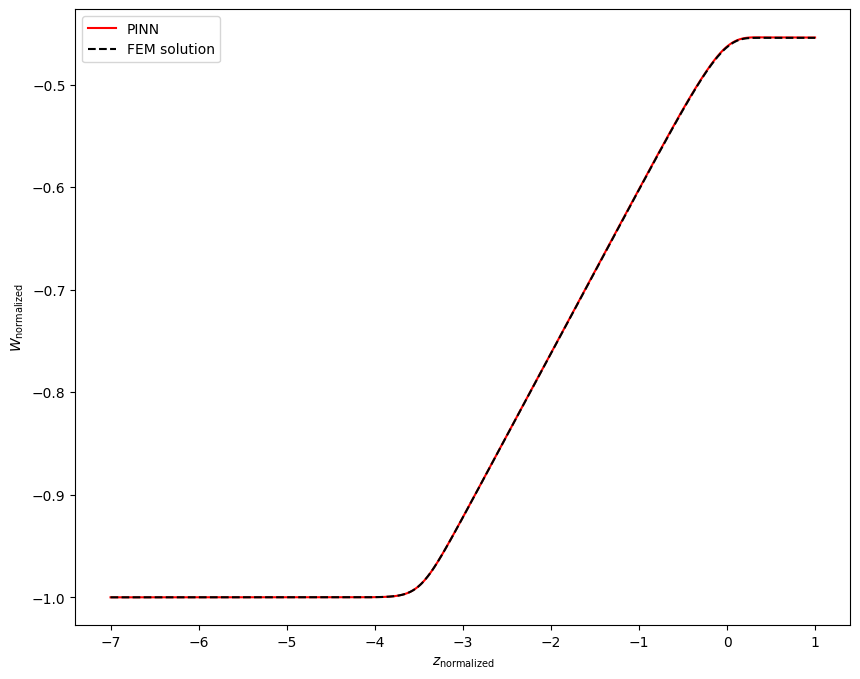


Epoch: 268000/400000
Loss: 0.05454343184828758
C_mean: -11.695196151733398
C_std: 0.019183553755283356
Loss ODE: 0.01730220392346382
Loss z0: 0.0
Loss zf: 3.49581241607666e-05
KL divergence: 3.689164638519287


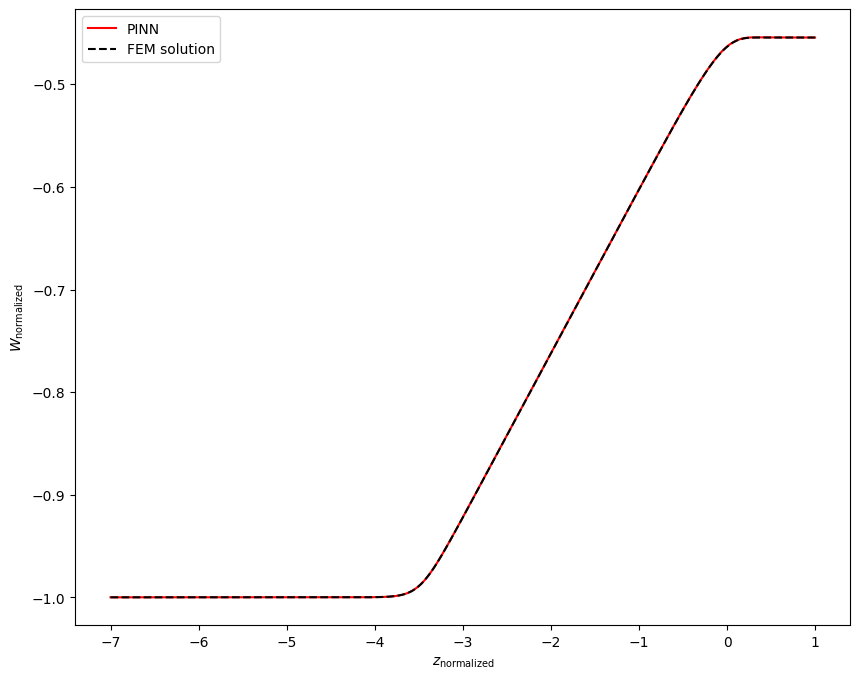


Epoch: 269000/400000
Loss: 0.06140752136707306
C_mean: -11.695052146911621
C_std: 0.019133903086185455
Loss ODE: 0.023491760715842247
Loss z0: 0.0
Loss zf: 9.98377799987793e-05
KL divergence: 3.6917383670806885


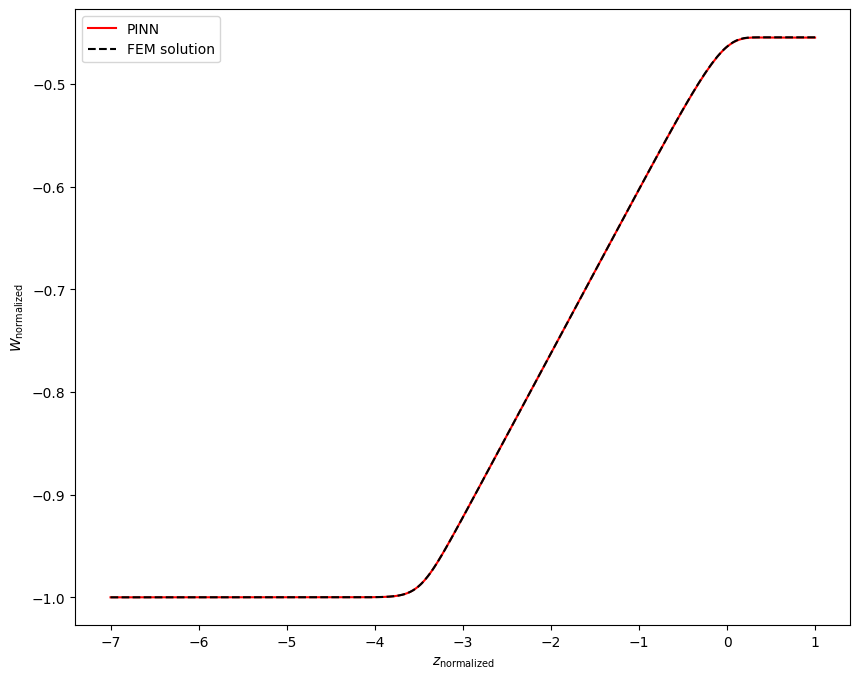


Epoch: 270000/400000
Loss: 0.05042334645986557
C_mean: -11.695016860961914
C_std: 0.019035981968045235
Loss ODE: 0.011411013081669807
Loss z0: 0.0
Loss zf: 0.00020438432693481445
KL divergence: 3.6968488693237305


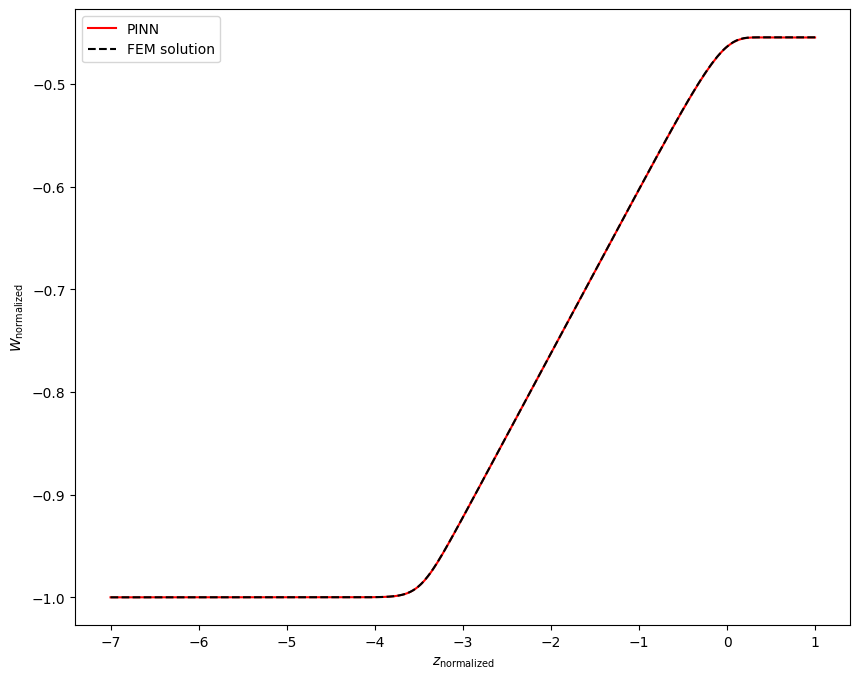


Epoch: 271000/400000
Loss: 0.04328291863203049
C_mean: -11.69548511505127
C_std: 0.019053973257541656
Loss ODE: 0.005637582391500473
Loss z0: 0.0
Loss zf: 6.857514381408691e-05
KL divergence: 3.6959586143493652


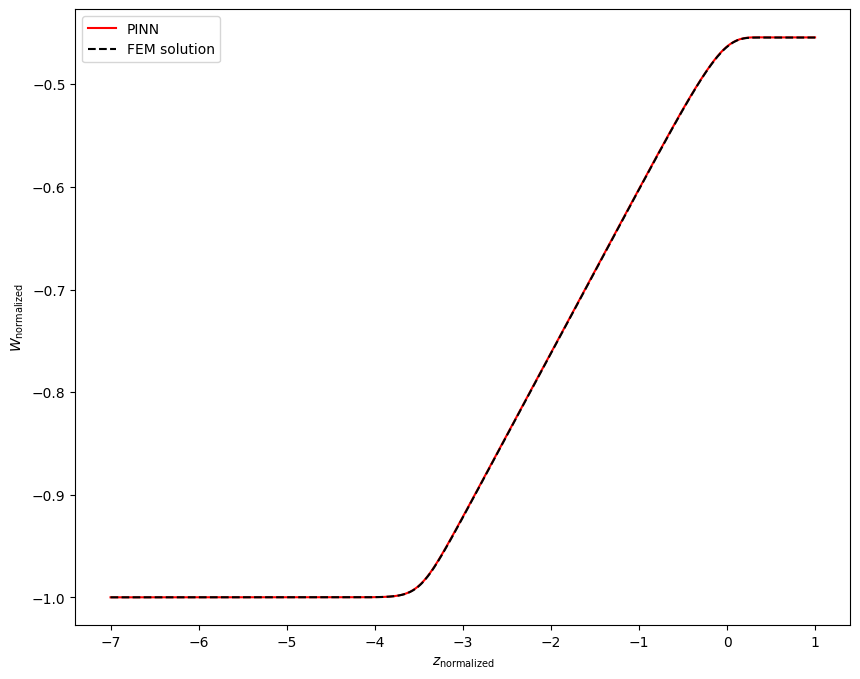


Epoch: 272000/400000
Loss: 0.04878176376223564
C_mean: -11.695112228393555
C_std: 0.01908516325056553
Loss ODE: 0.0114833302795887
Loss z0: 0.0
Loss zf: 3.555417060852051e-05
KL divergence: 3.694289207458496


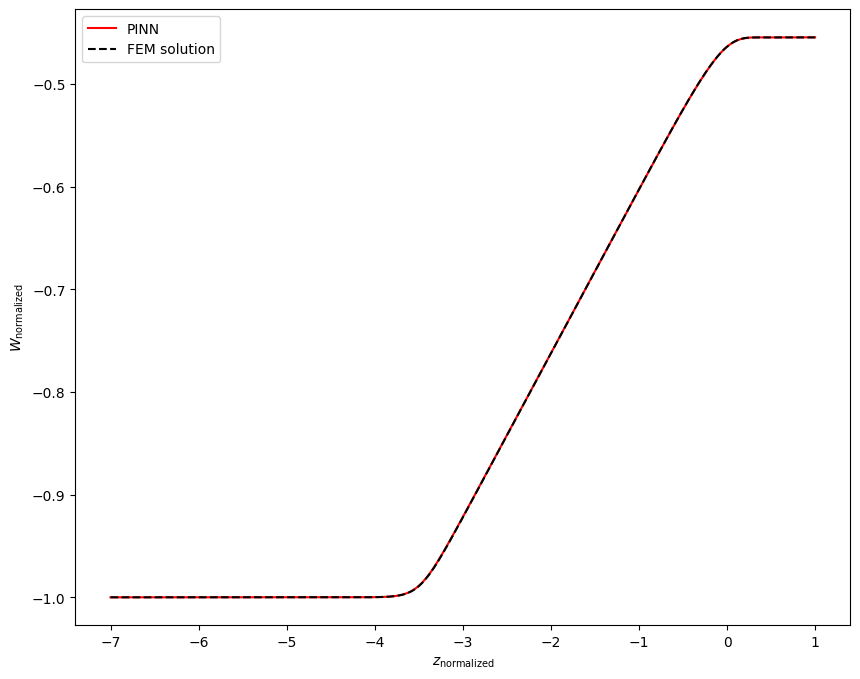


Epoch: 273000/400000
Loss: 0.051789481192827225
C_mean: -11.695160865783691
C_std: 0.019068408757448196
Loss ODE: 0.014763346873223782
Loss z0: 0.0
Loss zf: 7.450580596923828e-06
KL divergence: 3.695162773132324


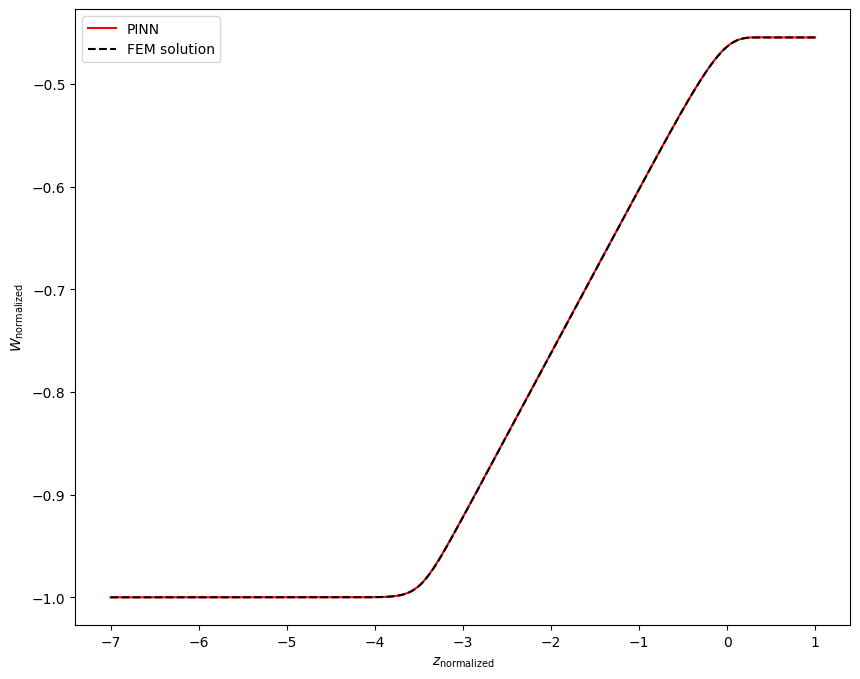


Epoch: 274000/400000
Loss: 0.0761372298002243
C_mean: -11.695279121398926
C_std: 0.0190645270049572
Loss ODE: 0.03685856983065605
Loss z0: 0.0
Loss zf: 0.00023248791694641113
KL divergence: 3.695378065109253


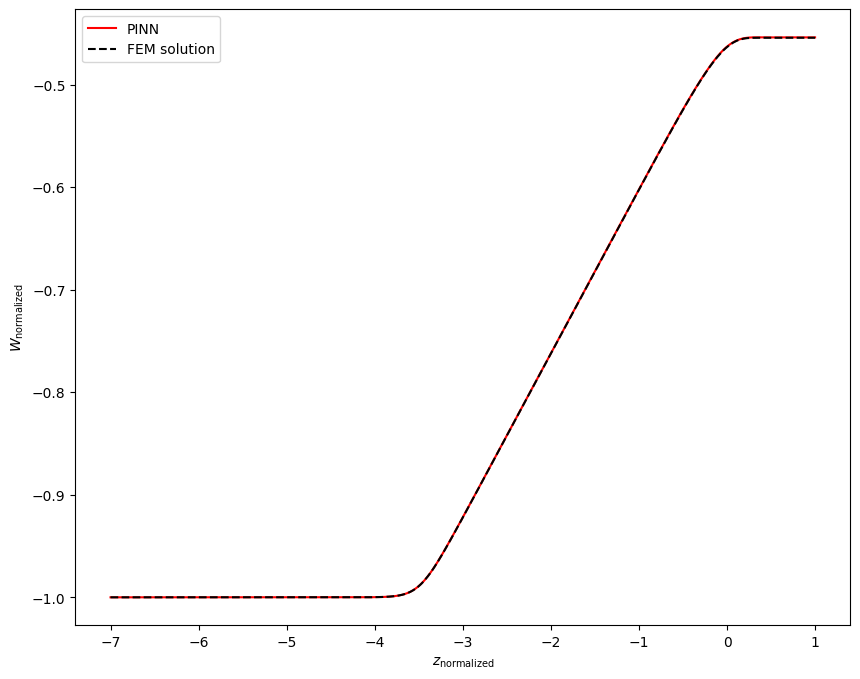


Epoch: 275000/400000
Loss: 0.04387293756008148
C_mean: -11.695085525512695
C_std: 0.01906009204685688
Loss ODE: 0.005136533640325069
Loss z0: 0.0
Loss zf: 0.0001780390739440918
KL divergence: 3.695601224899292


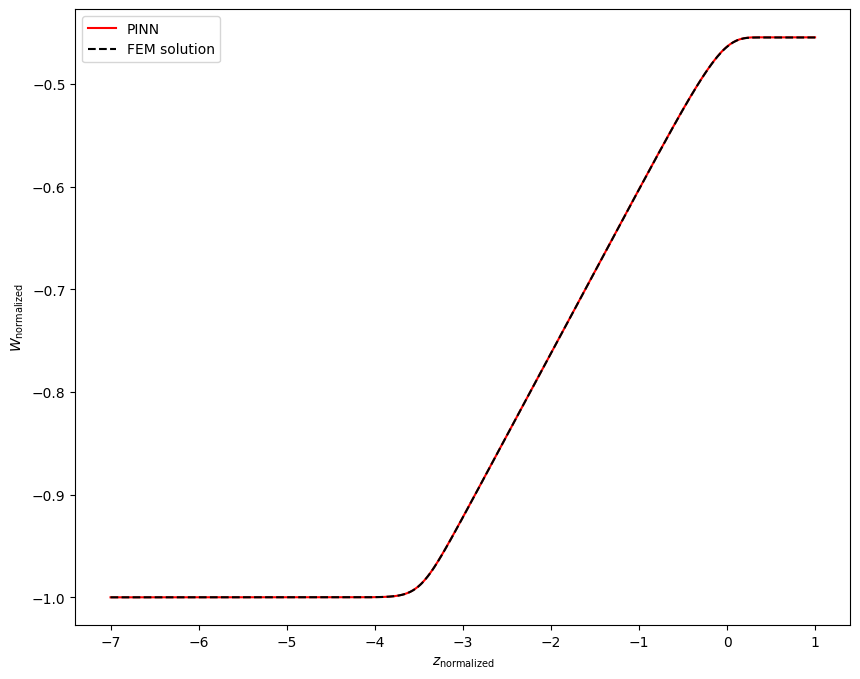


Epoch: 276000/400000
Loss: 0.04881105571985245
C_mean: -11.695042610168457
C_std: 0.018984338268637657
Loss ODE: 0.010507664643228054
Loss z0: 0.0
Loss zf: 0.00013077259063720703
KL divergence: 3.699566602706909


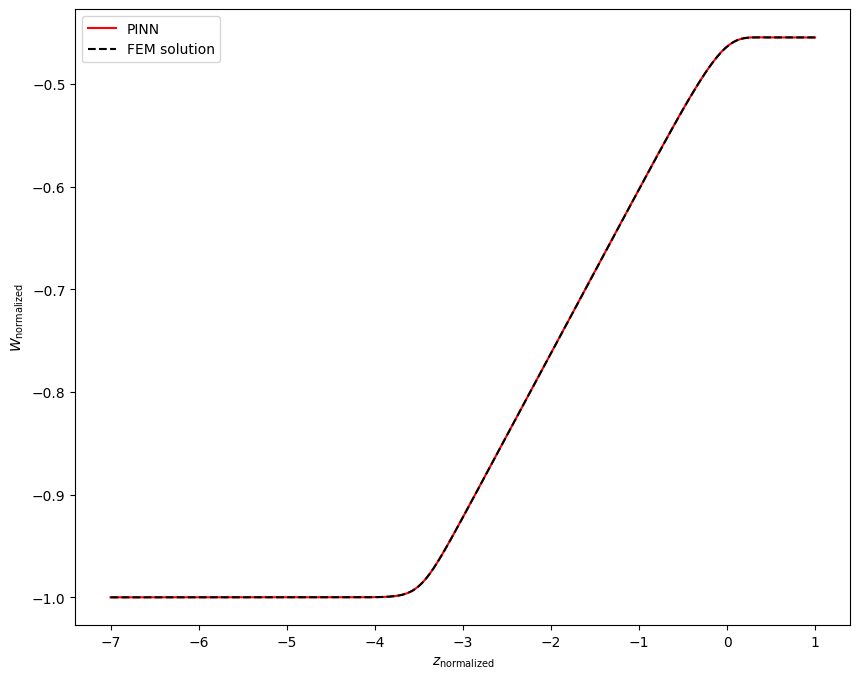


Epoch: 277000/400000
Loss: 0.05221134424209595
C_mean: -11.69491195678711
C_std: 0.018942147493362427
Loss ODE: 0.014121013693511486
Loss z0: 0.0
Loss zf: 0.00010725855827331543
KL divergence: 3.7017745971679688


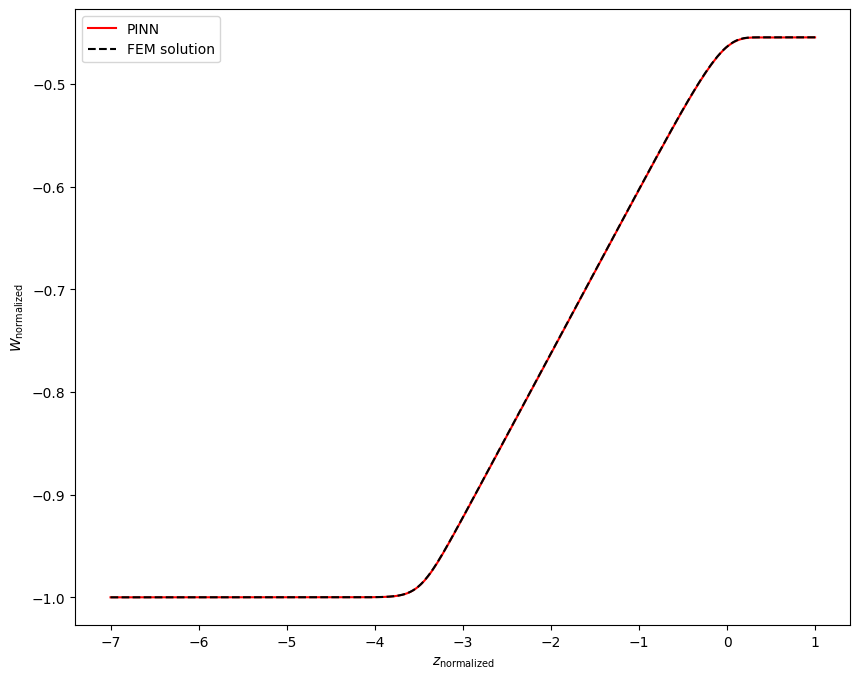


Epoch: 278000/400000
Loss: 0.05725773423910141
C_mean: -11.695014953613281
C_std: 0.01891653798520565
Loss ODE: 0.018408121541142464
Loss z0: 0.0
Loss zf: 0.0001818239688873291
KL divergence: 3.7031376361846924


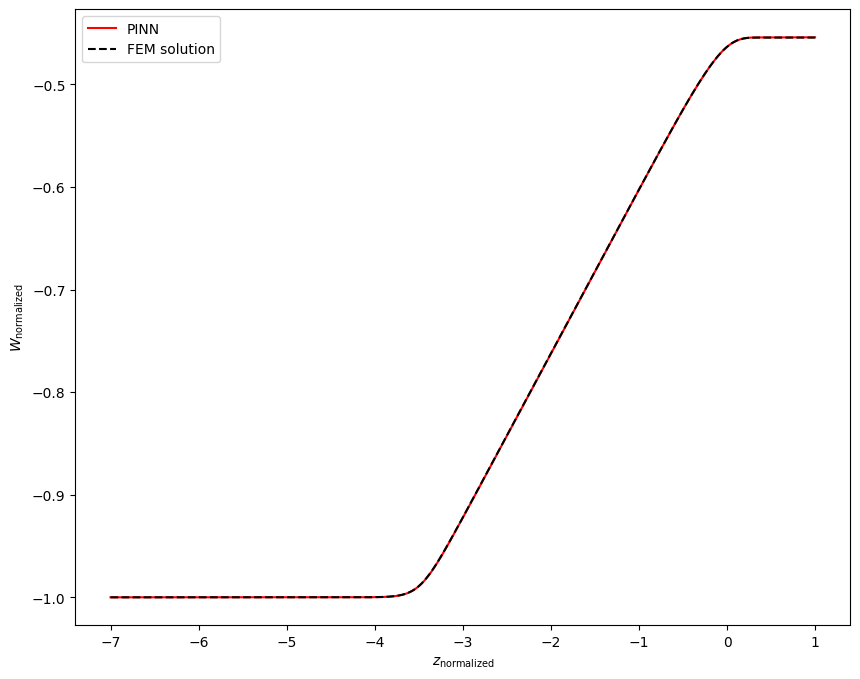


Epoch: 279000/400000
Loss: 0.06378377228975296
C_mean: -11.695094108581543
C_std: 0.018894856795668602
Loss ODE: 0.024816490709781647
Loss z0: 0.0
Loss zf: 0.00019243359565734863
KL divergence: 3.7042946815490723


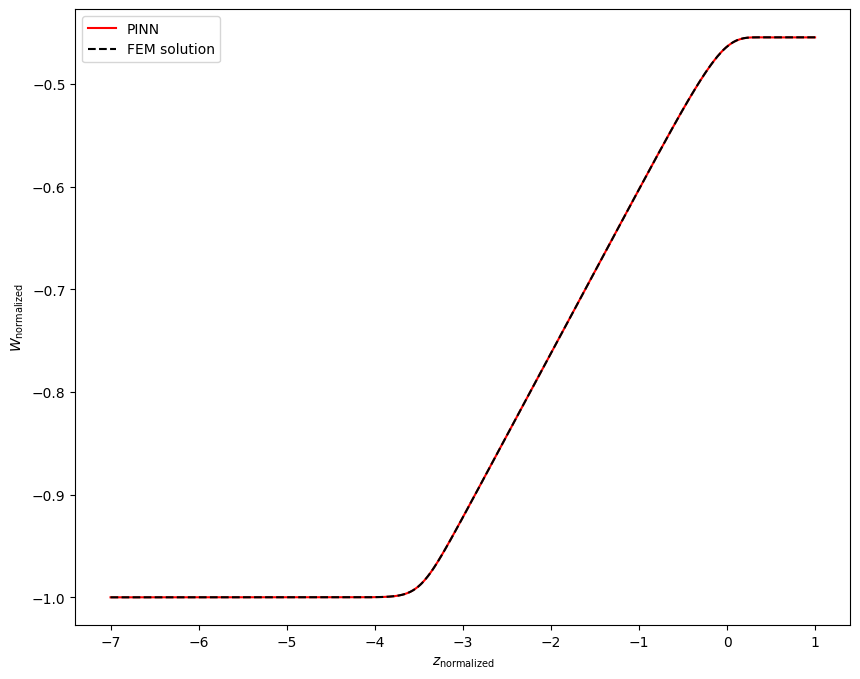


Epoch: 280000/400000
Loss: 0.06708458065986633
C_mean: -11.694963455200195
C_std: 0.018838392570614815
Loss ODE: 0.028178881853818893
Loss z0: 0.0
Loss zf: 0.00018328428268432617
KL divergence: 3.7072854042053223


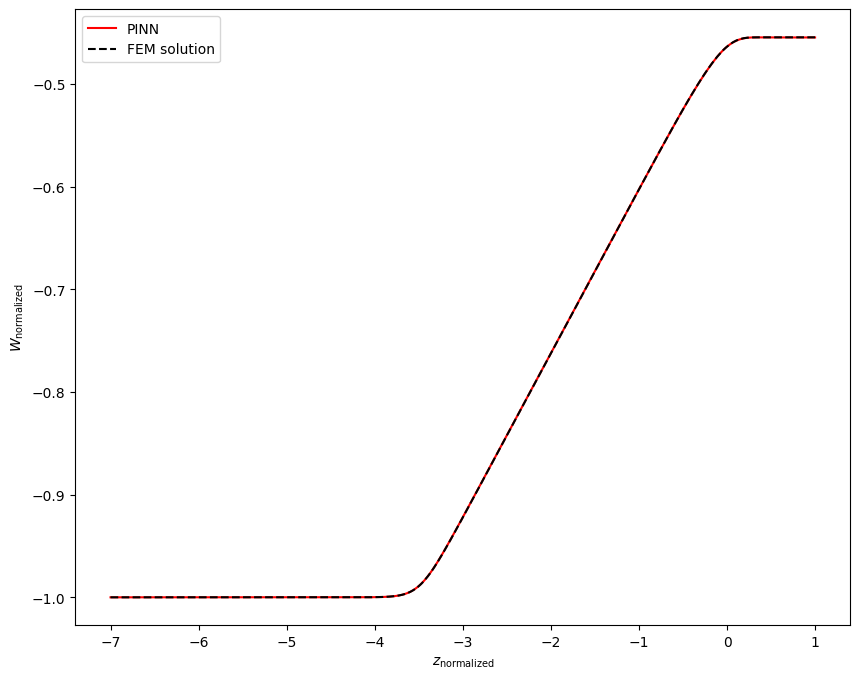


Epoch: 281000/400000
Loss: 0.0570136159658432
C_mean: -11.695073127746582
C_std: 0.018747854977846146
Loss ODE: 0.01844348944723606
Loss z0: 0.0
Loss zf: 0.0001448988914489746
KL divergence: 3.712113618850708


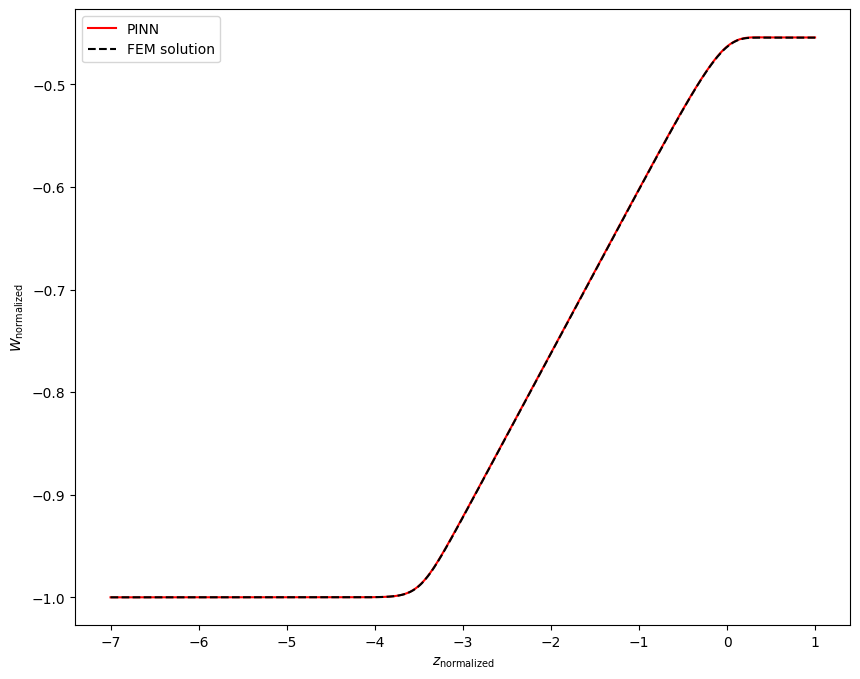


Epoch: 282000/400000
Loss: 0.043930791318416595
C_mean: -11.694981575012207
C_std: 0.018709082156419754
Loss ODE: 0.006119171157479286
Loss z0: 0.0
Loss zf: 6.699562072753906e-05
KL divergence: 3.7141664028167725


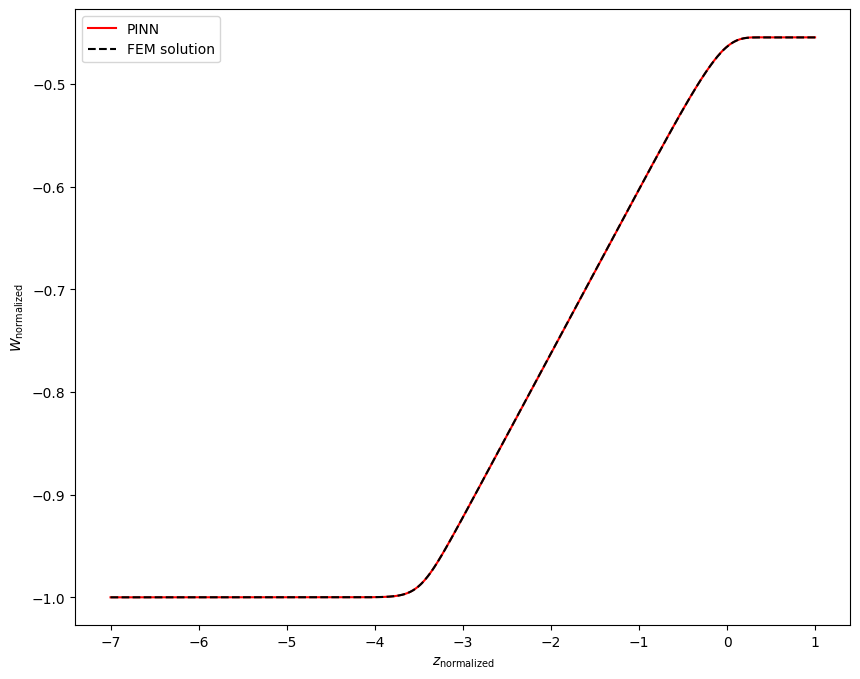


Epoch: 283000/400000
Loss: 0.05403842404484749
C_mean: -11.694697380065918
C_std: 0.018694190308451653
Loss ODE: 0.016755256801843643
Loss z0: 0.0
Loss zf: 1.3381242752075195e-05
KL divergence: 3.714935541152954


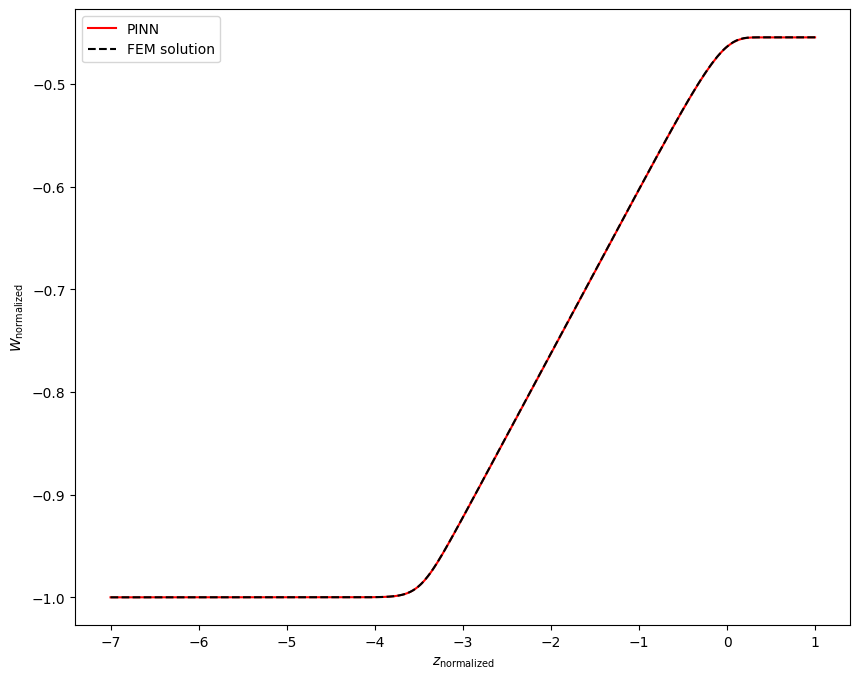


Epoch: 284000/400000
Loss: 0.07739812135696411
C_mean: -11.694944381713867
C_std: 0.018633300438523293
Loss ODE: 0.03383488953113556
Loss z0: 0.0
Loss zf: 0.0006380975246429443
KL divergence: 3.718226194381714


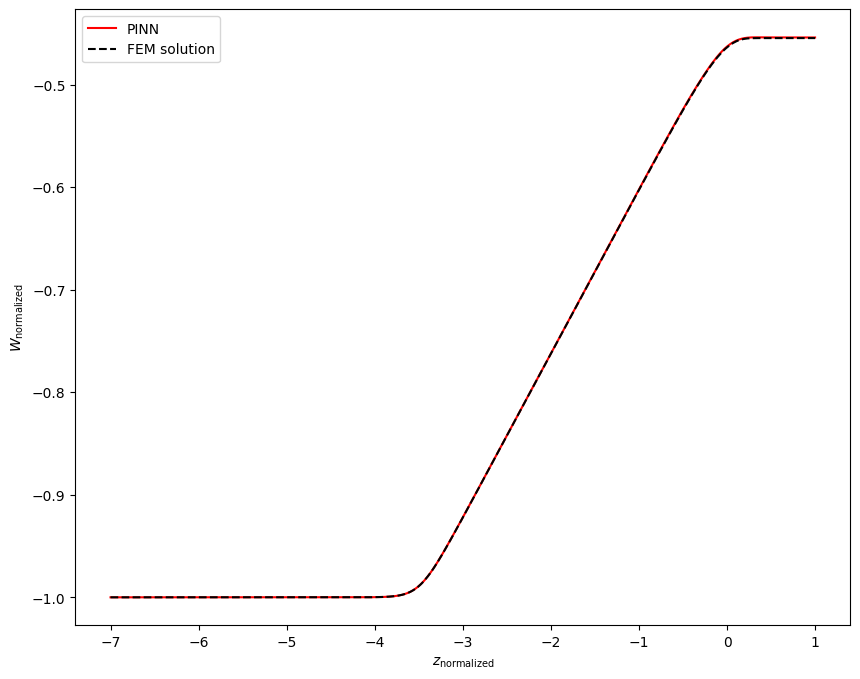


Epoch: 285000/400000
Loss: 0.04683529958128929
C_mean: -11.694765090942383
C_std: 0.01861402951180935
Loss ODE: 0.007545534987002611
Loss z0: 0.0
Loss zf: 0.0002097487449645996
KL divergence: 3.7192277908325195


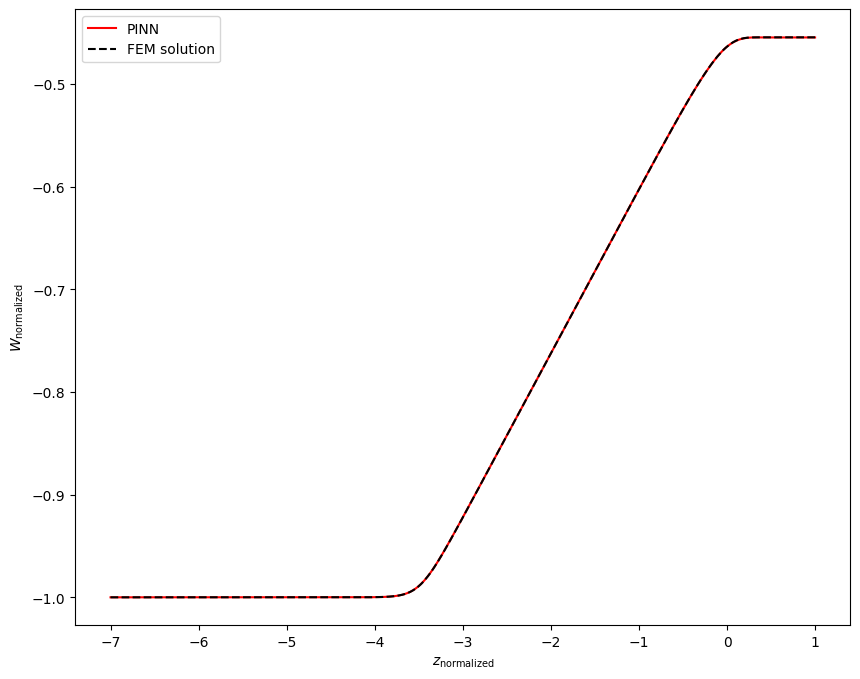


Epoch: 286000/400000
Loss: 0.07805423438549042
C_mean: -11.694788932800293
C_std: 0.018632059916853905
Loss ODE: 0.038301046937704086
Loss z0: 0.0
Loss zf: 0.00025704503059387207
KL divergence: 3.718273401260376


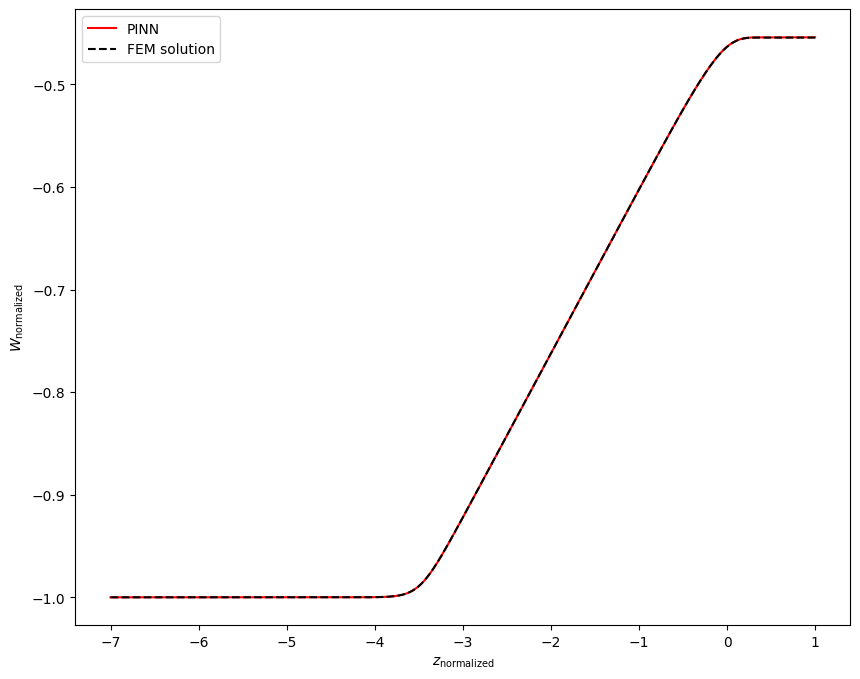


Epoch: 287000/400000
Loss: 0.04483649507164955
C_mean: -11.694656372070312
C_std: 0.018560871481895447
Loss ODE: 0.00612075999379158
Loss z0: 0.0
Loss zf: 0.0001494884490966797
KL divergence: 3.7220849990844727


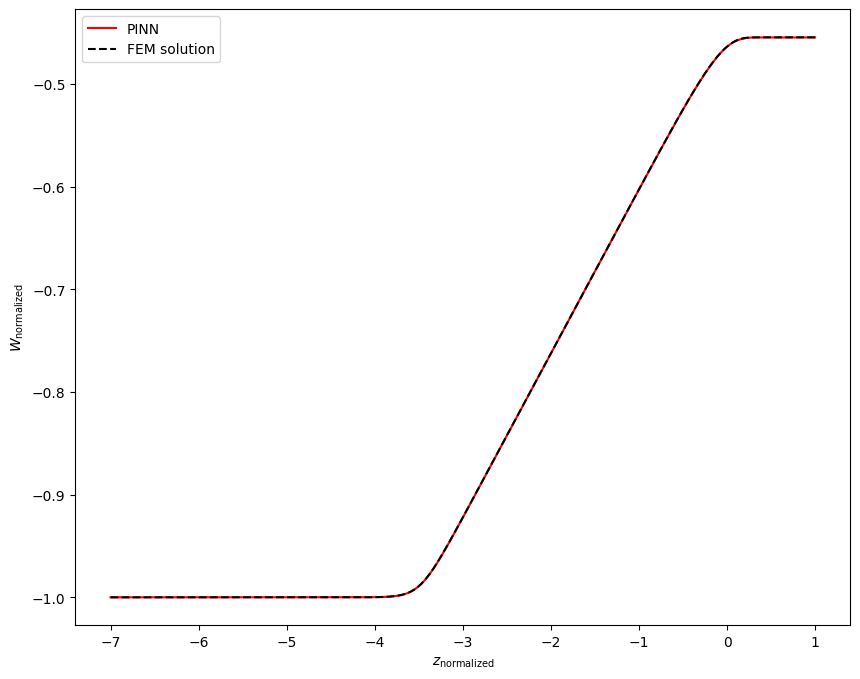


Epoch: 288000/400000
Loss: 0.05552537739276886
C_mean: -11.694725036621094
C_std: 0.01853490248322487
Loss ODE: 0.016190560534596443
Loss z0: 0.0
Loss zf: 0.00020998716354370117
KL divergence: 3.723494529724121


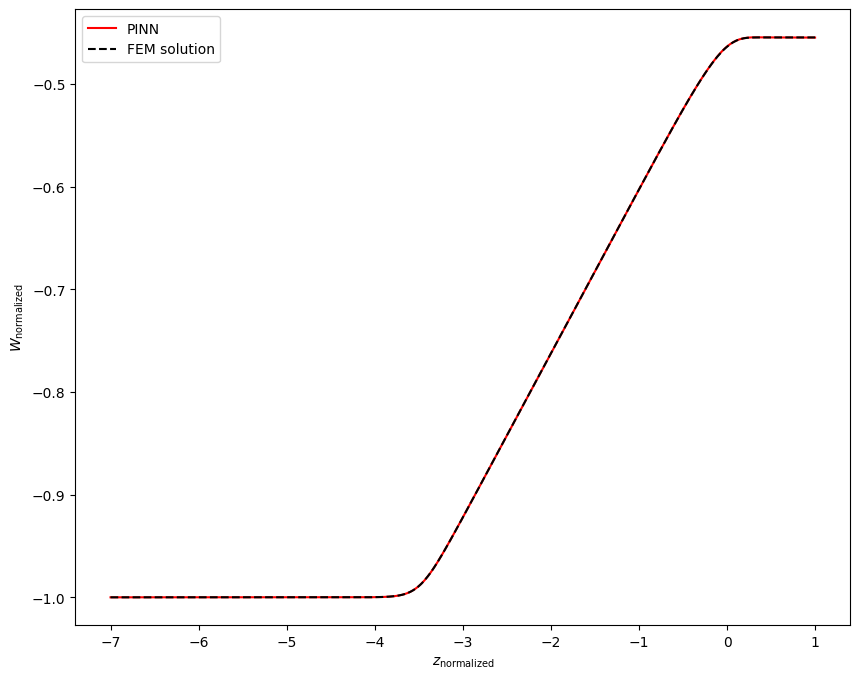


Epoch: 289000/400000
Loss: 0.046667229384183884
C_mean: -11.694951057434082
C_std: 0.018554892390966415
Loss ODE: 0.00902765616774559
Loss z0: 0.0
Loss zf: 4.151463508605957e-05
KL divergence: 3.722442626953125


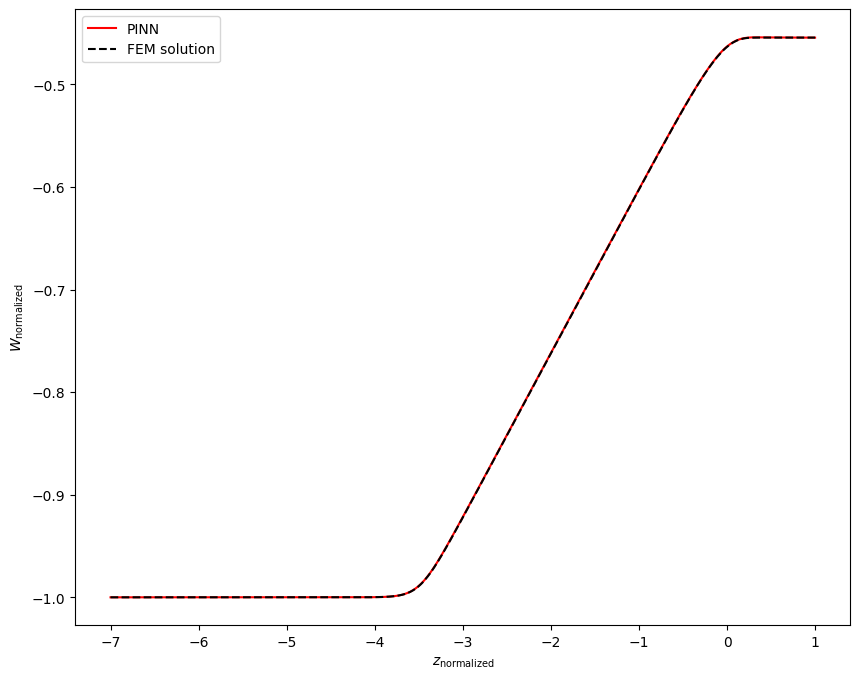


Epoch: 290000/400000
Loss: 0.053804125636816025
C_mean: -11.69476318359375
C_std: 0.018562059849500656
Loss ODE: 0.015401228331029415
Loss z0: 0.0
Loss zf: 0.000118255615234375
KL divergence: 3.722033977508545


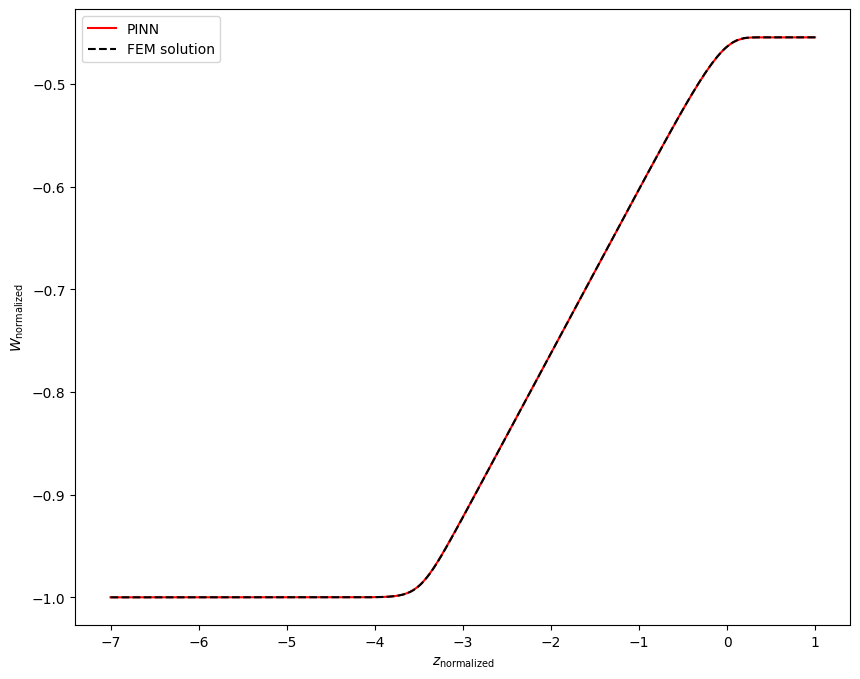


Epoch: 291000/400000
Loss: 0.05734056234359741
C_mean: -11.694900512695312
C_std: 0.01853334717452526
Loss ODE: 0.019530119374394417
Loss z0: 0.0
Loss zf: 5.745887756347656e-05
KL divergence: 3.723585367202759


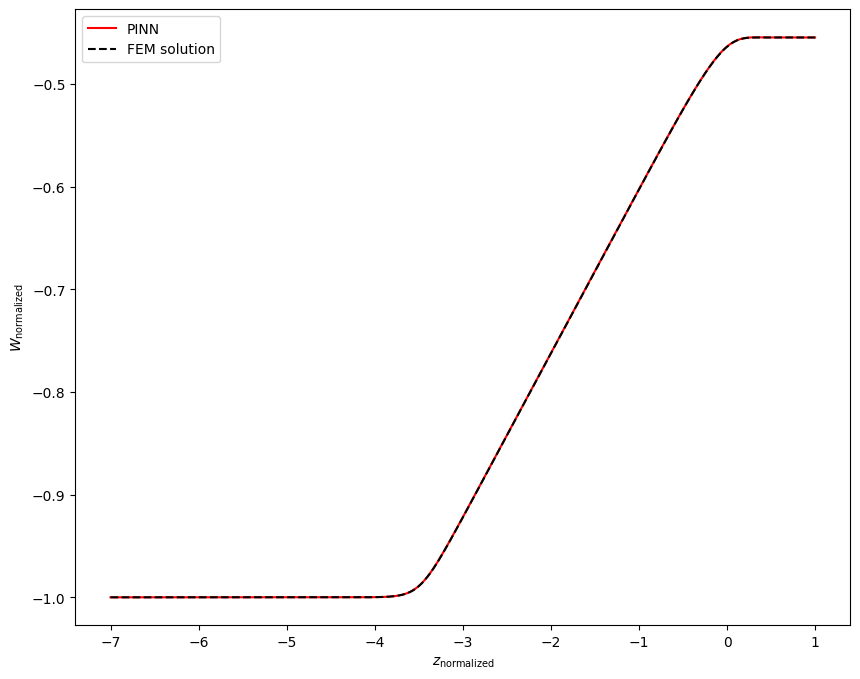


Epoch: 292000/400000
Loss: 0.055551379919052124
C_mean: -11.694586753845215
C_std: 0.018498698249459267
Loss ODE: 0.018106454983353615
Loss z0: 0.0
Loss zf: 1.9073486328125e-05
KL divergence: 3.725419044494629


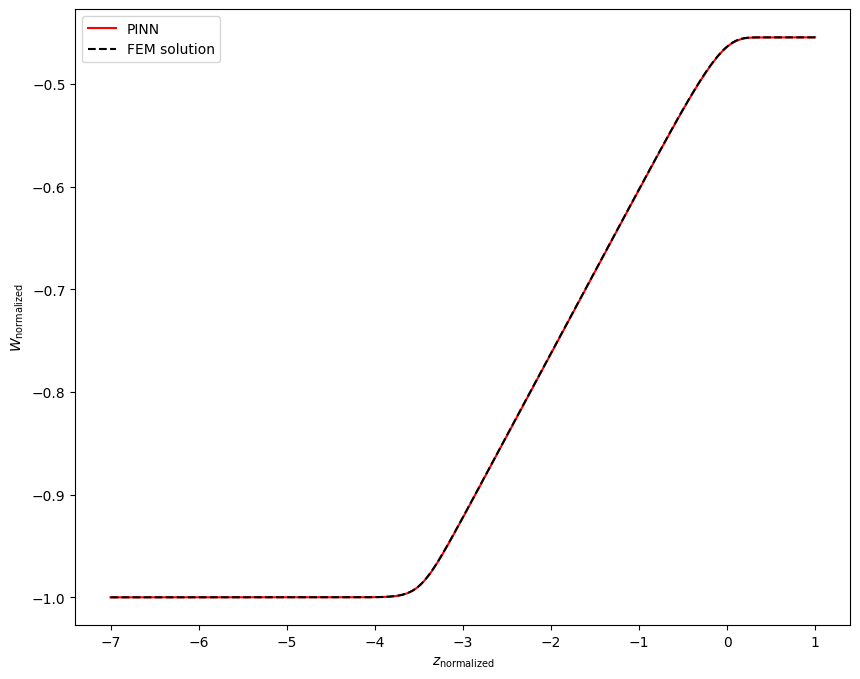


Epoch: 293000/400000
Loss: 0.06389639526605606
C_mean: -11.69494342803955
C_std: 0.018454547971487045
Loss ODE: 0.02518768608570099
Loss z0: 0.0
Loss zf: 0.0001430213451385498
KL divergence: 3.7278494834899902


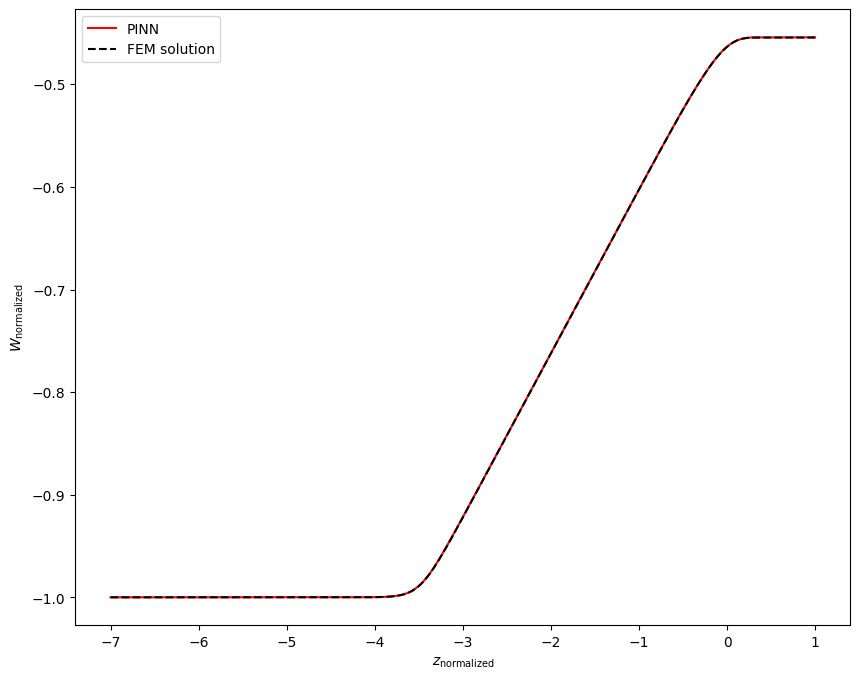


Epoch: 294000/400000
Loss: 0.056663334369659424
C_mean: -11.694622993469238
C_std: 0.01842932030558586
Loss ODE: 0.01911957561969757
Loss z0: 0.0
Loss zf: 2.518296241760254e-05
KL divergence: 3.7291929721832275


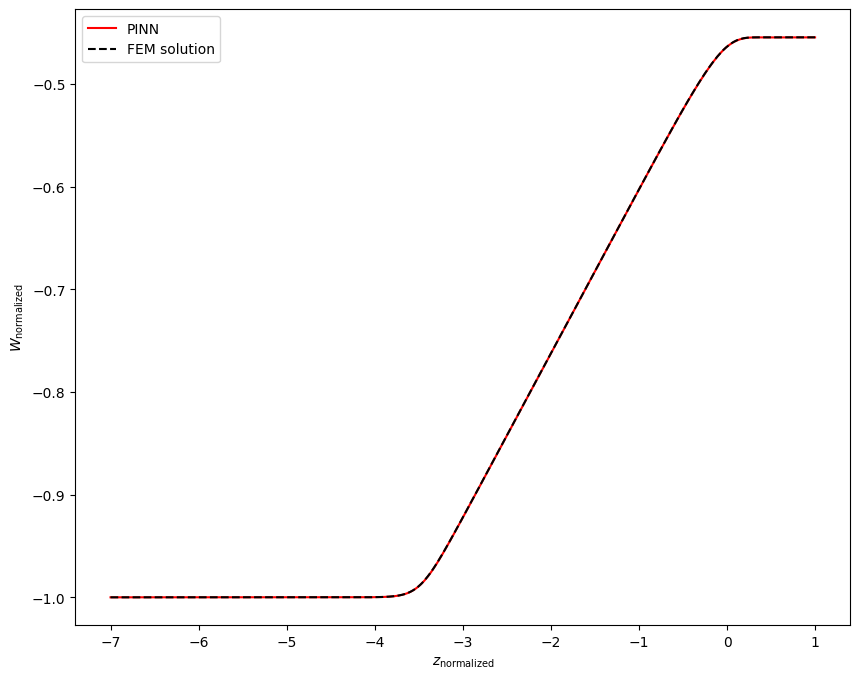


Epoch: 295000/400000
Loss: 0.04609246551990509
C_mean: -11.694778442382812
C_std: 0.018441366031765938
Loss ODE: 0.006486540660262108
Loss z0: 0.0
Loss zf: 0.0002320408821105957
KL divergence: 3.7285513877868652


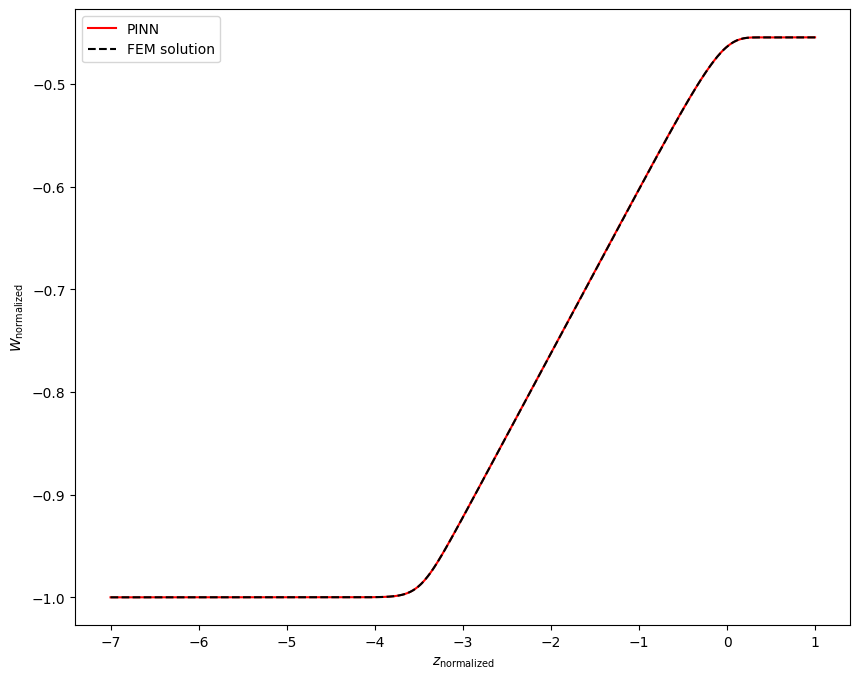


Epoch: 296000/400000
Loss: 0.05538766831159592
C_mean: -11.69479751586914
C_std: 0.018373889848589897
Loss ODE: 0.01673874817788601
Loss z0: 0.0
Loss zf: 0.00013267993927001953
KL divergence: 3.7322120666503906


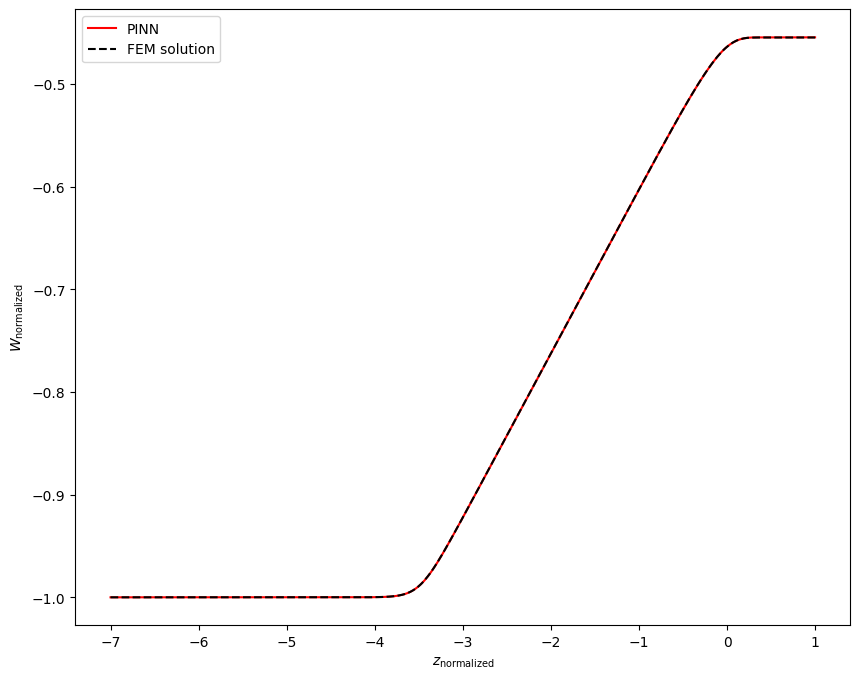


Epoch: 297000/400000
Loss: 0.06557796895503998
C_mean: -11.694693565368652
C_std: 0.01830616034567356
Loss ODE: 0.026597488671541214
Loss z0: 0.0
Loss zf: 0.0001621544361114502
KL divergence: 3.7358932495117188


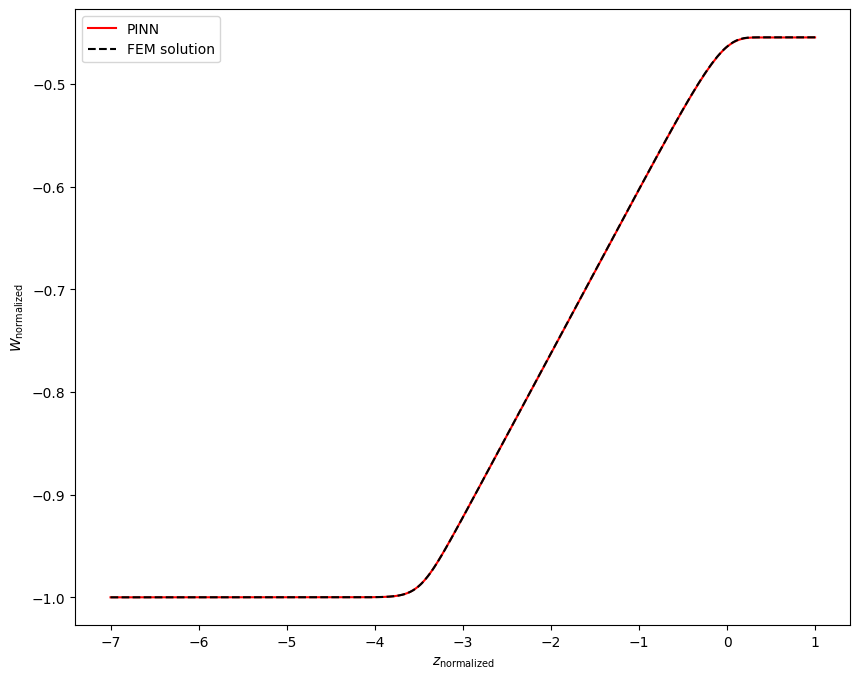


Epoch: 298000/400000
Loss: 0.06491263210773468
C_mean: -11.694610595703125
C_std: 0.01828754134476185
Loss ODE: 0.02695026434957981
Loss z0: 0.0
Loss zf: 5.933642387390137e-05
KL divergence: 3.736900806427002


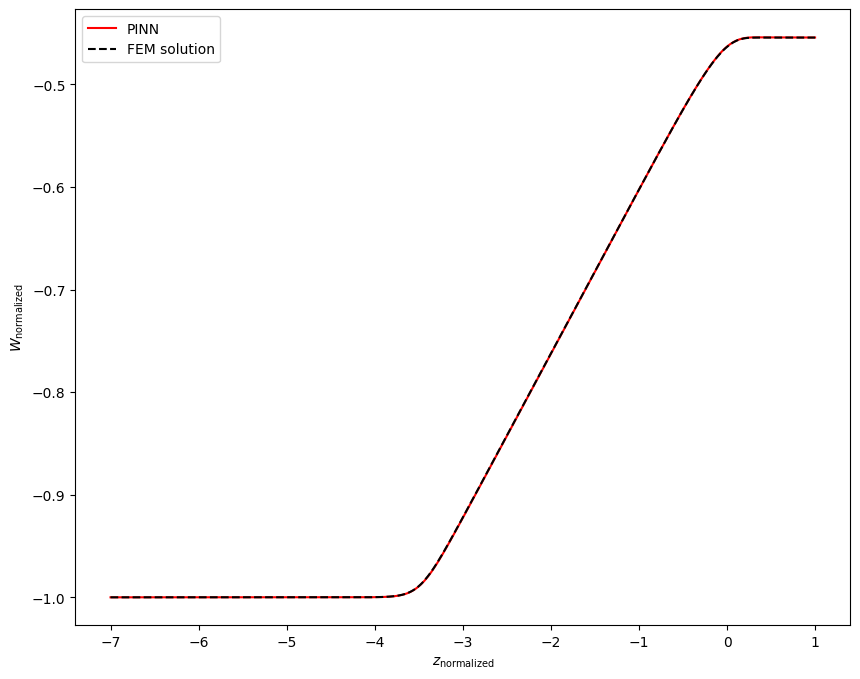


Epoch: 299000/400000
Loss: 0.04240485280752182
C_mean: -11.694732666015625
C_std: 0.01823616959154606
Loss ODE: 0.004002546891570091
Loss z0: 0.0
Loss zf: 0.0001004934310913086
KL divergence: 3.7397375106811523


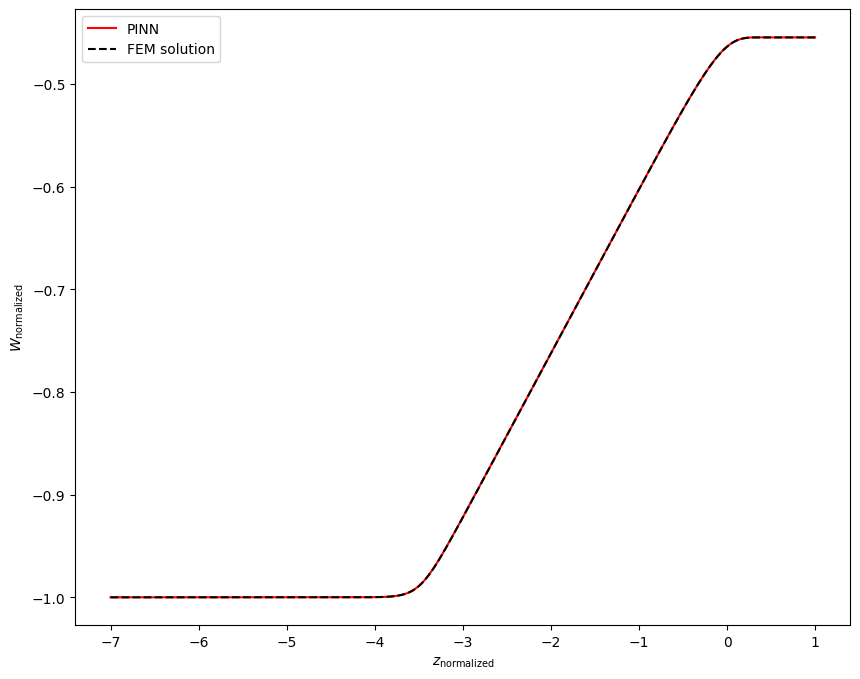


Epoch: 300000/400000
Loss: 0.06432272493839264
C_mean: -11.694631576538086
C_std: 0.018252253532409668
Loss ODE: 0.025158468633890152
Loss z0: 0.0
Loss zf: 0.00017759203910827637
KL divergence: 3.7388339042663574


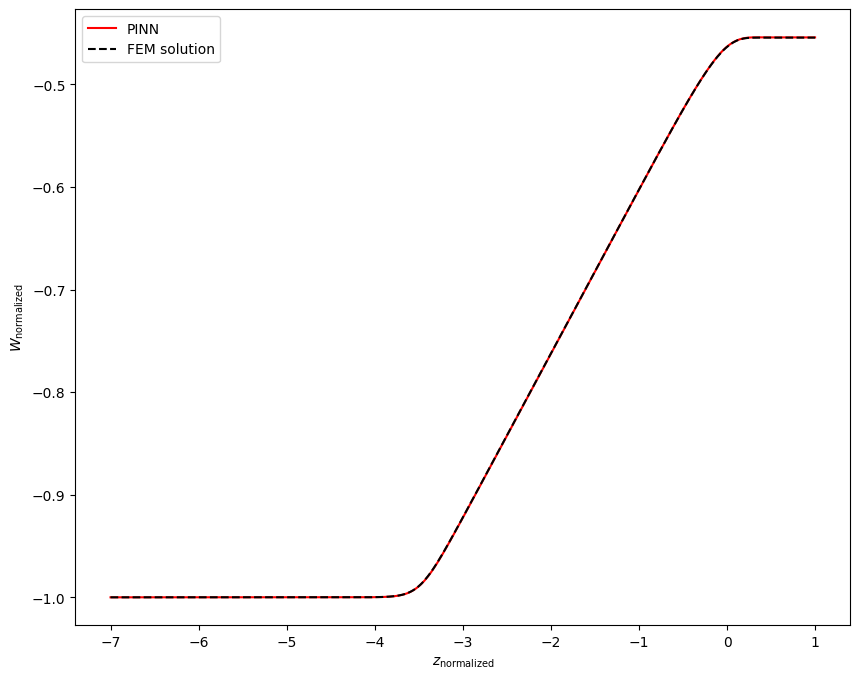


Epoch: 301000/400000
Loss: 0.045508287847042084
C_mean: -11.694721221923828
C_std: 0.018233925104141235
Loss ODE: 0.0066145951859653
Loss z0: 0.0
Loss zf: 0.00014951825141906738
KL divergence: 3.739851236343384


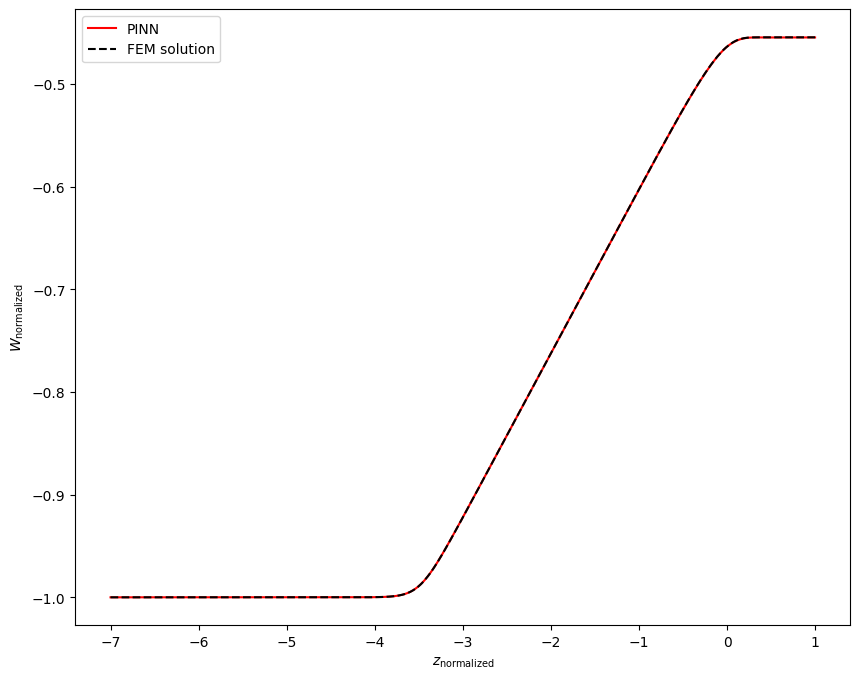


Epoch: 302000/400000
Loss: 0.06584513187408447
C_mean: -11.694522857666016
C_std: 0.018192671239376068
Loss ODE: 0.027645202353596687
Loss z0: 0.0
Loss zf: 7.790327072143555e-05
KL divergence: 3.7420895099639893


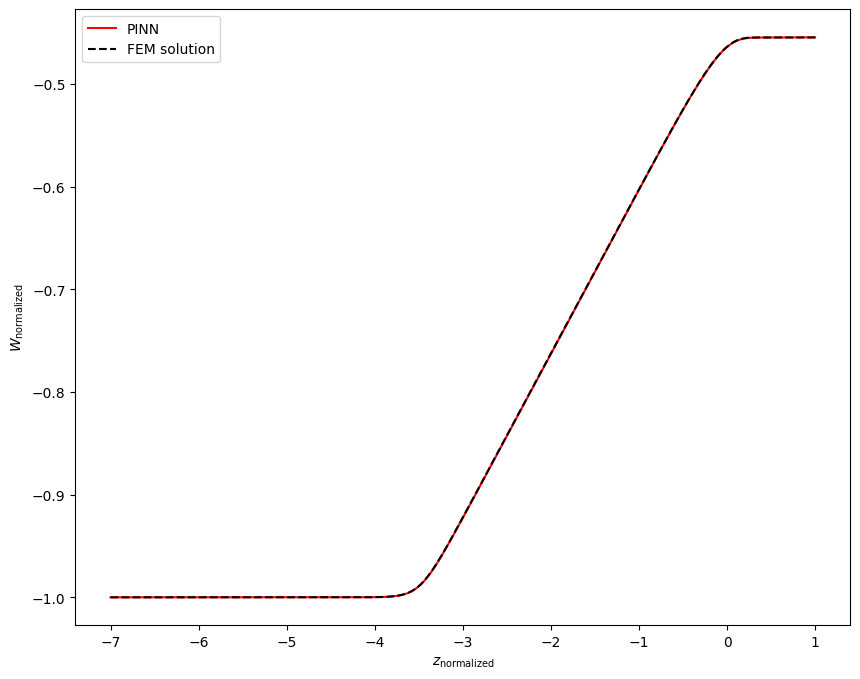


Epoch: 303000/400000
Loss: 0.06537285447120667
C_mean: -11.694682121276855
C_std: 0.018172025680541992
Loss ODE: 0.02669755555689335
Loss z0: 0.0
Loss zf: 0.00012427568435668945
KL divergence: 3.7432546615600586


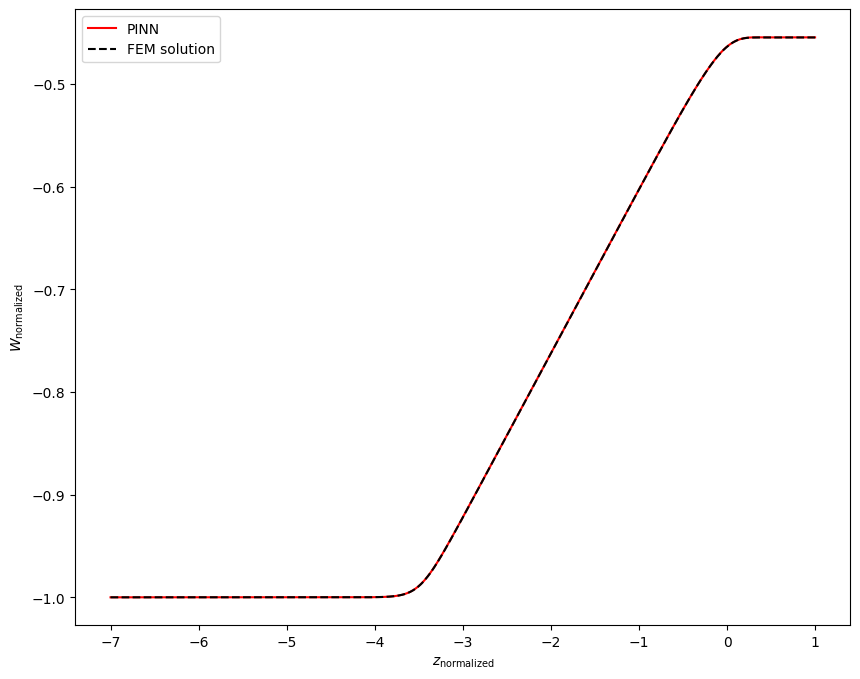


Epoch: 304000/400000
Loss: 0.0634630024433136
C_mean: -11.694624900817871
C_std: 0.018159085884690285
Loss ODE: 0.025202356278896332
Loss z0: 0.0
Loss zf: 8.210539817810059e-05
KL divergence: 3.743959665298462


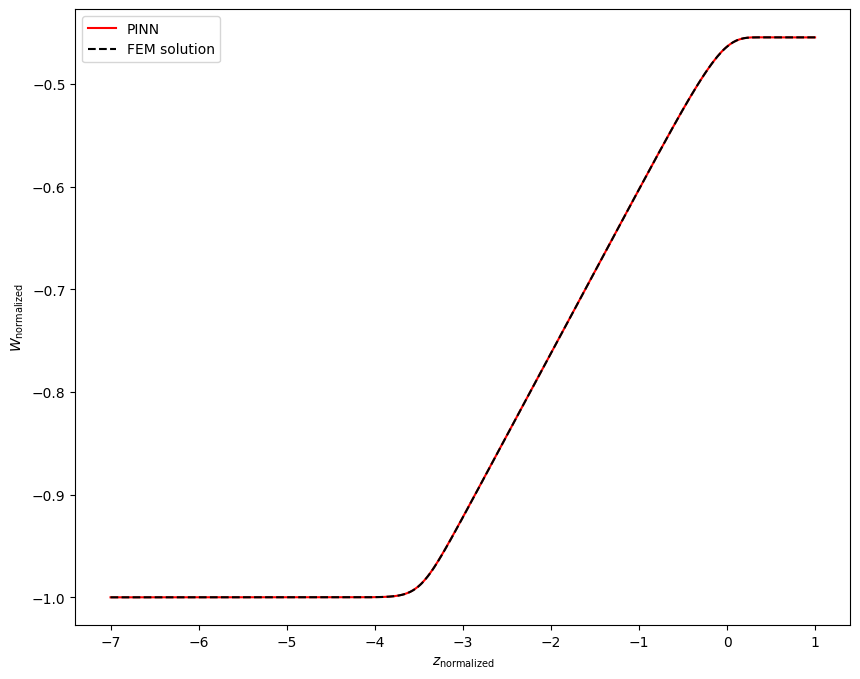


Epoch: 305000/400000
Loss: 0.05172879248857498
C_mean: -11.694731712341309
C_std: 0.018159208819270134
Loss ODE: 0.011163558810949326
Loss z0: 0.0
Loss zf: 0.00031256675720214844
KL divergence: 3.7439568042755127


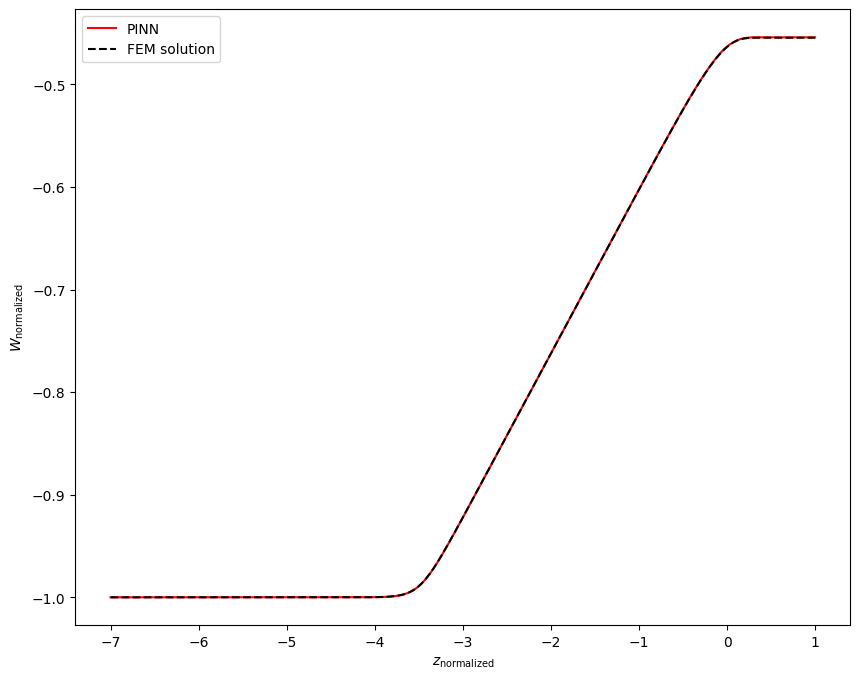


Epoch: 306000/400000
Loss: 0.0623960942029953
C_mean: -11.694642066955566
C_std: 0.01811099797487259
Loss ODE: 0.02478701062500477
Loss z0: 0.0
Loss zf: 1.430511474609375e-05
KL divergence: 3.746603012084961


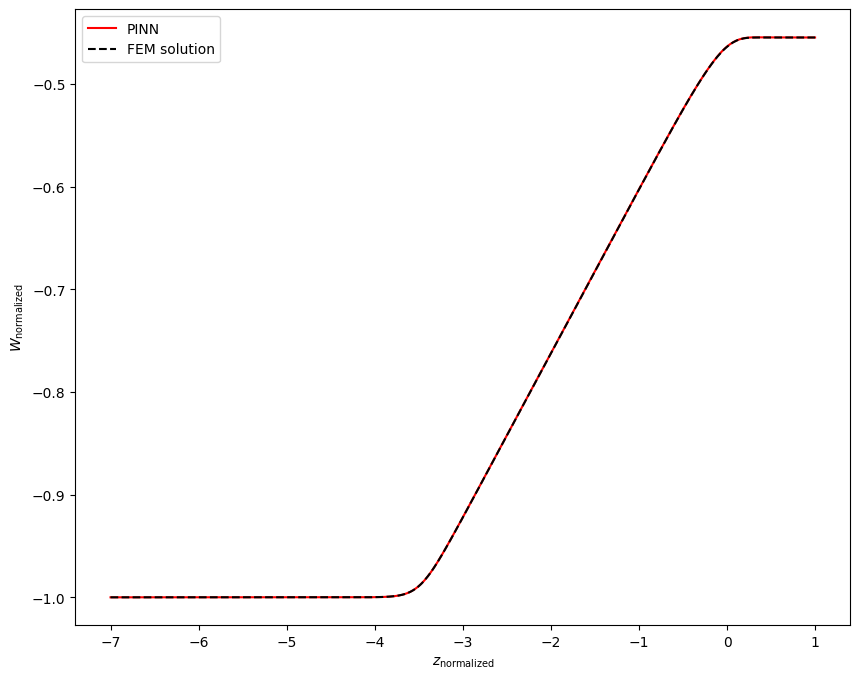


Epoch: 307000/400000
Loss: 0.043828487396240234
C_mean: -11.694743156433105
C_std: 0.018131403252482414
Loss ODE: 0.006333975121378899
Loss z0: 0.0
Loss zf: 3.9637088775634766e-06
KL divergence: 3.745487689971924


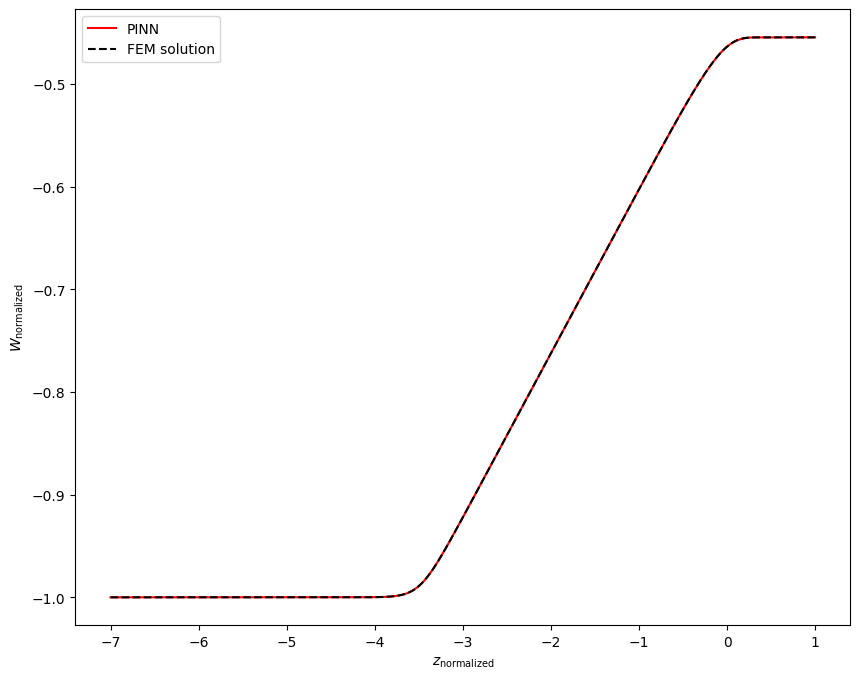


Epoch: 308000/400000
Loss: 0.06432881951332092
C_mean: -11.6947021484375
C_std: 0.018109705299139023
Loss ODE: 0.025899294763803482
Loss z0: 0.0
Loss zf: 9.626150131225586e-05
KL divergence: 3.7466912269592285


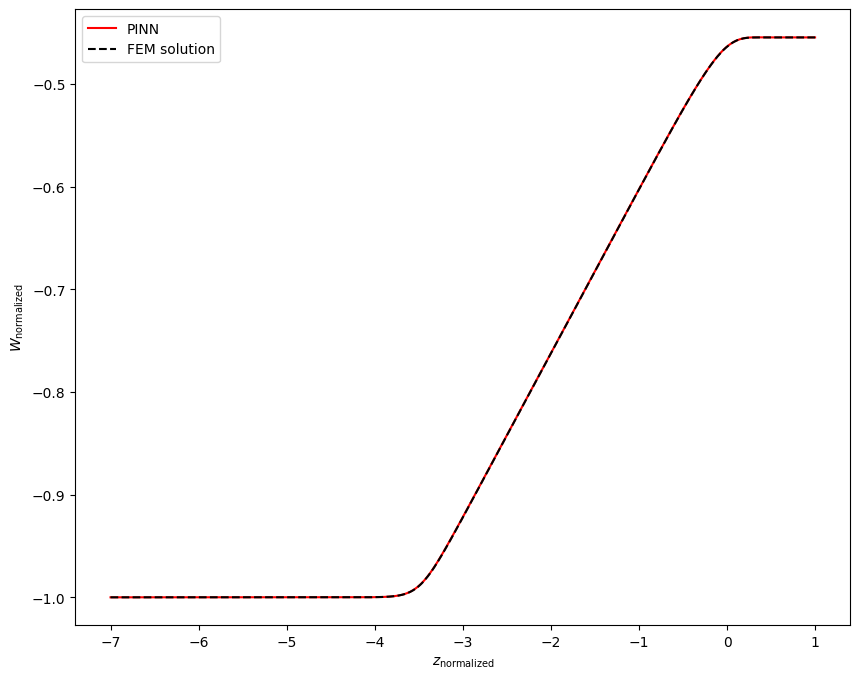


Epoch: 309000/400000
Loss: 0.07077812403440475
C_mean: -11.69457721710205
C_std: 0.018093649297952652
Loss ODE: 0.031745120882987976
Loss z0: 0.0
Loss zf: 0.0001557469367980957
KL divergence: 3.7475533485412598


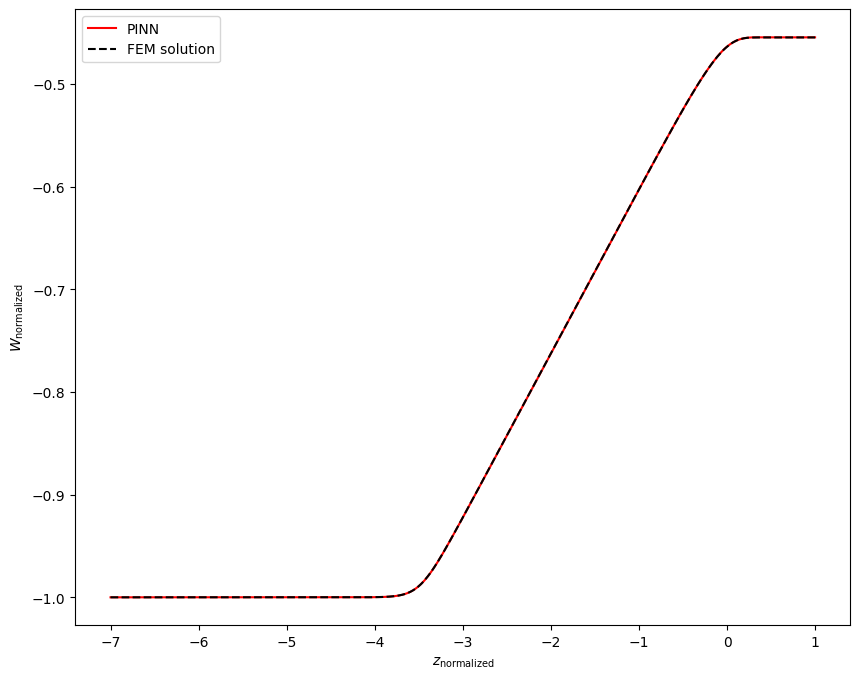


Epoch: 310000/400000
Loss: 0.0827796459197998
C_mean: -11.694511413574219
C_std: 0.01809663325548172
Loss ODE: 0.04386192932724953
Loss z0: 0.0
Loss zf: 0.0001443922519683838
KL divergence: 3.7473790645599365


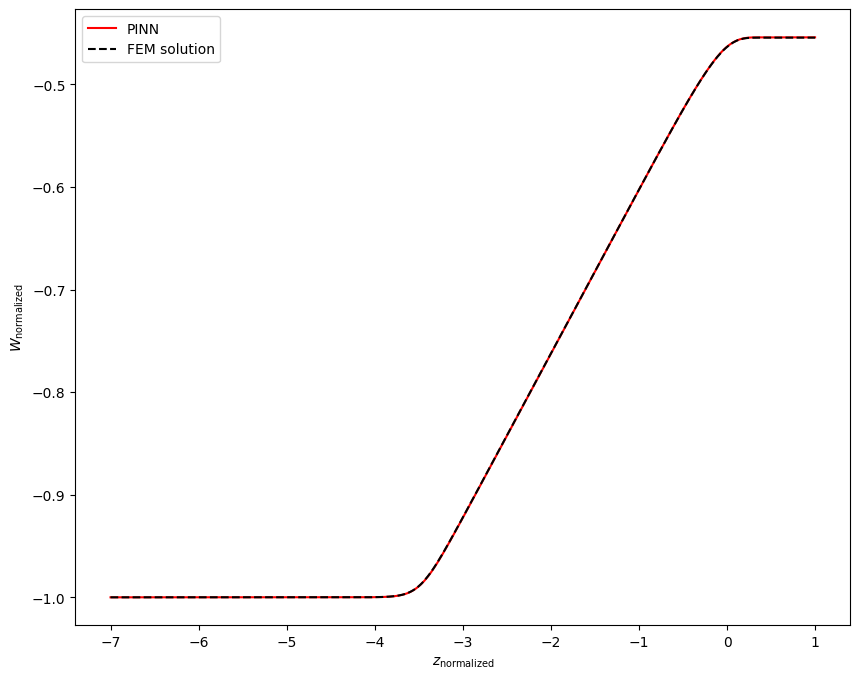


Epoch: 311000/400000
Loss: 0.04940657690167427
C_mean: -11.694631576538086
C_std: 0.01807004027068615
Loss ODE: 0.009800434112548828
Loss z0: 0.0
Loss zf: 0.0002117455005645752
KL divergence: 3.748868942260742


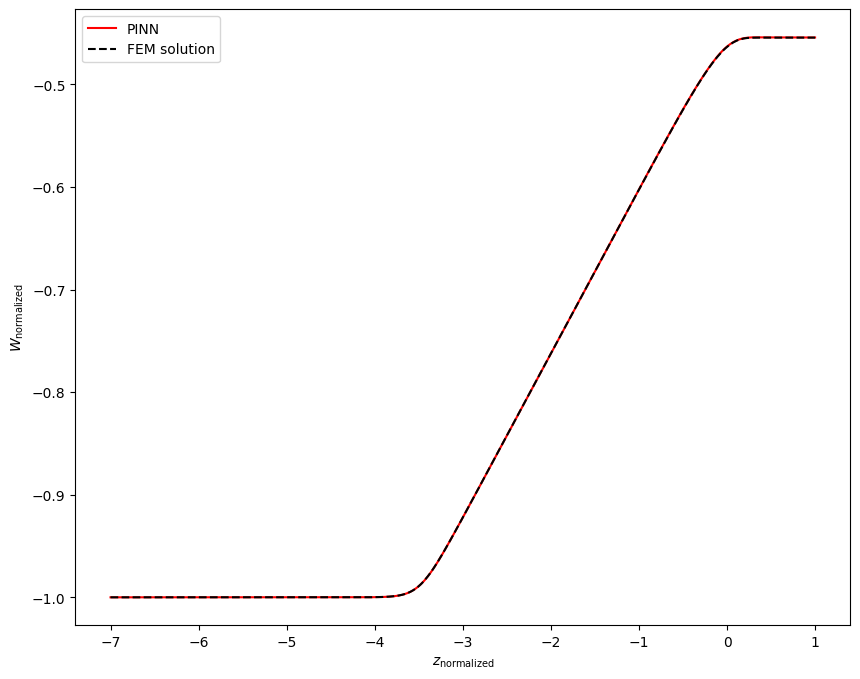


Epoch: 312000/400000
Loss: 0.04121914878487587
C_mean: -11.694612503051758
C_std: 0.018075240775942802
Loss ODE: 0.00324634974822402
Loss z0: 0.0
Loss zf: 4.869699478149414e-05
KL divergence: 3.7485830783843994


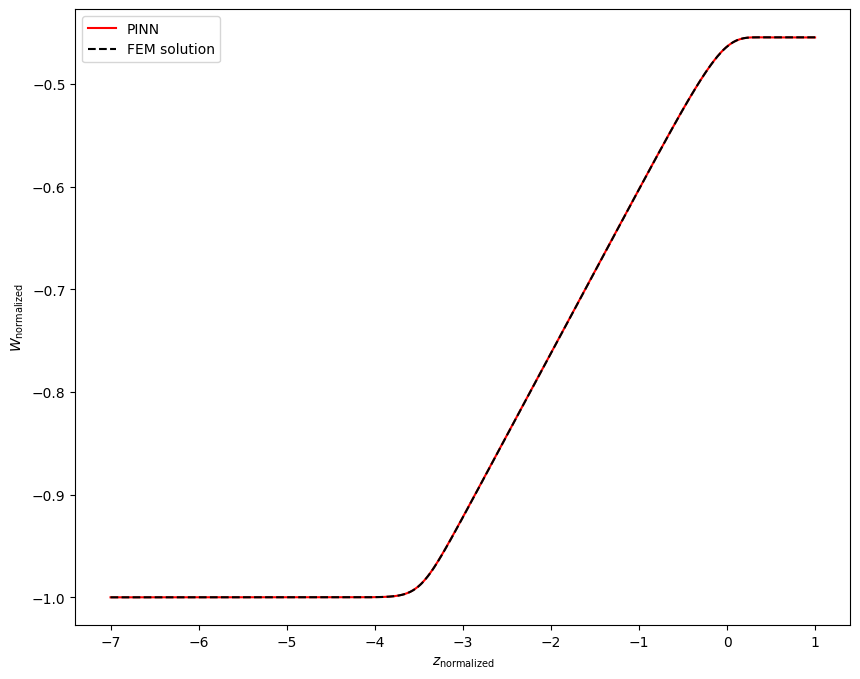


Epoch: 313000/400000
Loss: 0.04583550617098808
C_mean: -11.694612503051758
C_std: 0.018038081005215645
Loss ODE: 0.0065514701418578625
Loss z0: 0.0
Loss zf: 0.00017777085304260254
KL divergence: 3.7506327629089355


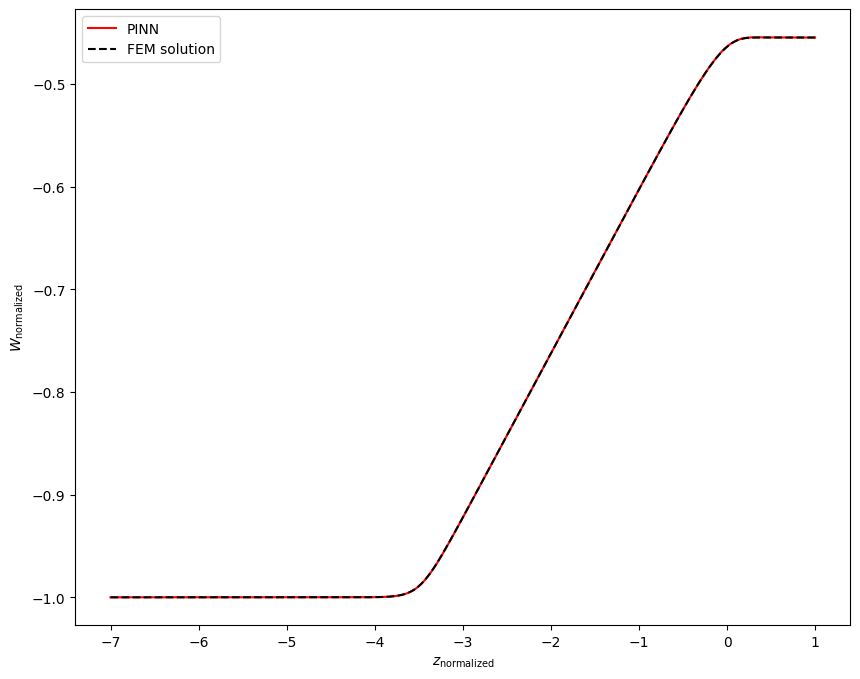


Epoch: 314000/400000
Loss: 0.057202525436878204
C_mean: -11.694714546203613
C_std: 0.018050512298941612
Loss ODE: 0.018945984542369843
Loss z0: 0.0
Loss zf: 7.56978988647461e-05
KL divergence: 3.7499561309814453


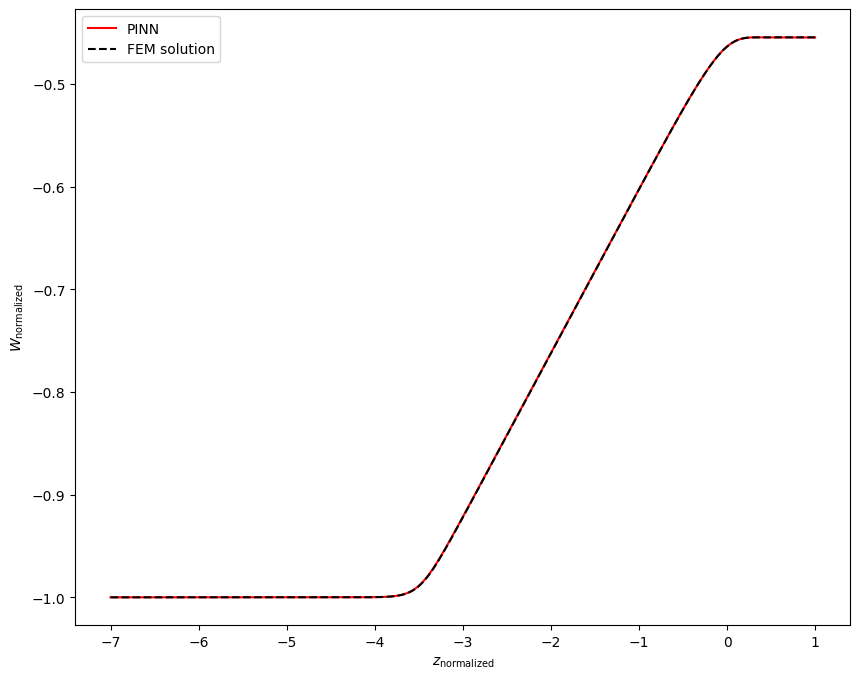


Epoch: 315000/400000
Loss: 0.05037004128098488
C_mean: -11.694592475891113
C_std: 0.018030386418104172
Loss ODE: 0.012328098528087139
Loss z0: 0.0
Loss zf: 5.313754081726074e-05
KL divergence: 3.751056671142578


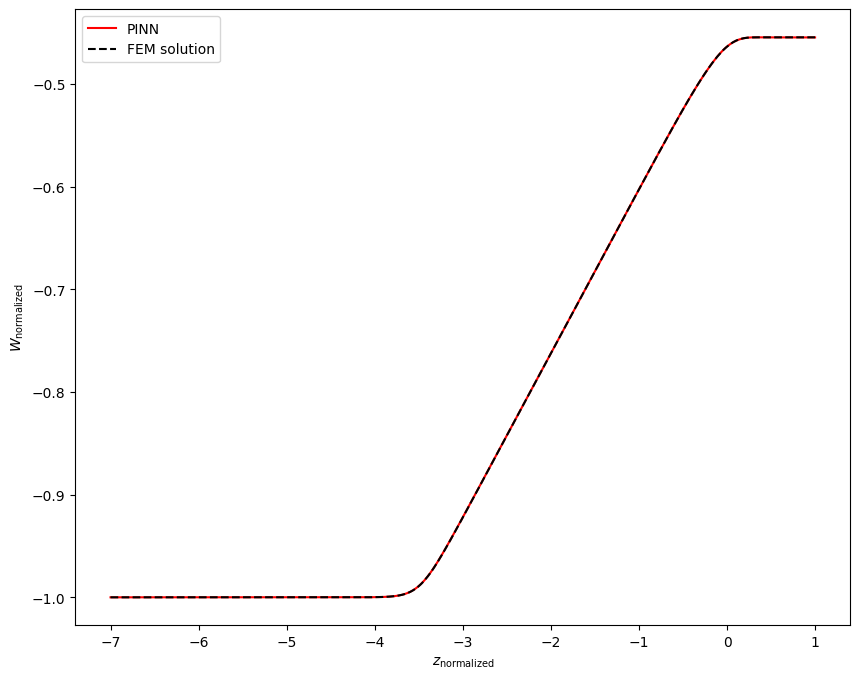


Epoch: 316000/400000
Loss: 0.04430346563458443
C_mean: -11.694466590881348
C_std: 0.01794830523431301
Loss ODE: 0.004598366562277079
Loss z0: 0.0
Loss zf: 0.0002149045467376709
KL divergence: 3.7556052207946777


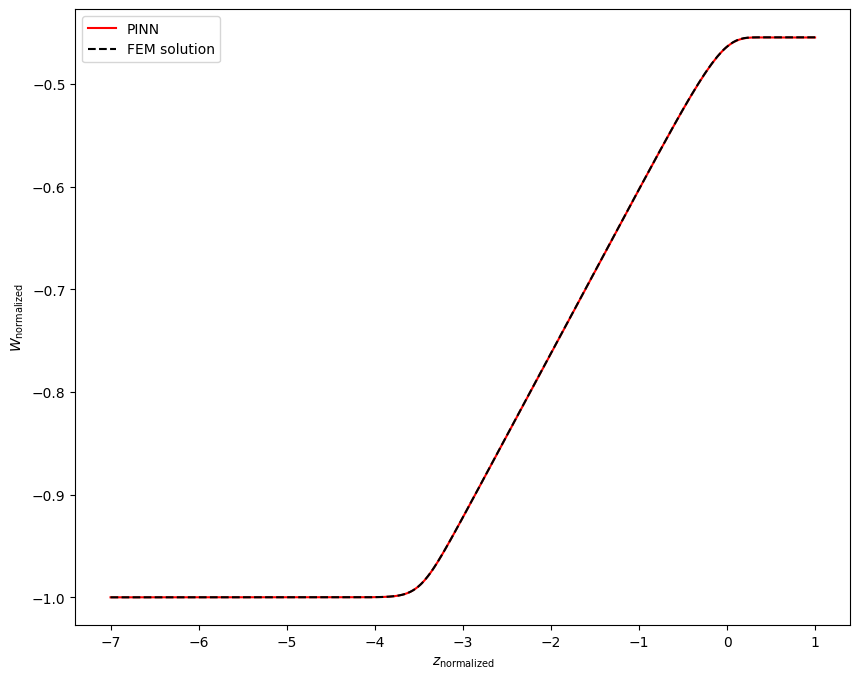


Epoch: 317000/400000
Loss: 0.05638942867517471
C_mean: -11.694520950317383
C_std: 0.01794986054301262
Loss ODE: 0.016660403460264206
Loss z0: 0.0
Loss zf: 0.0002173781394958496
KL divergence: 3.7555243968963623


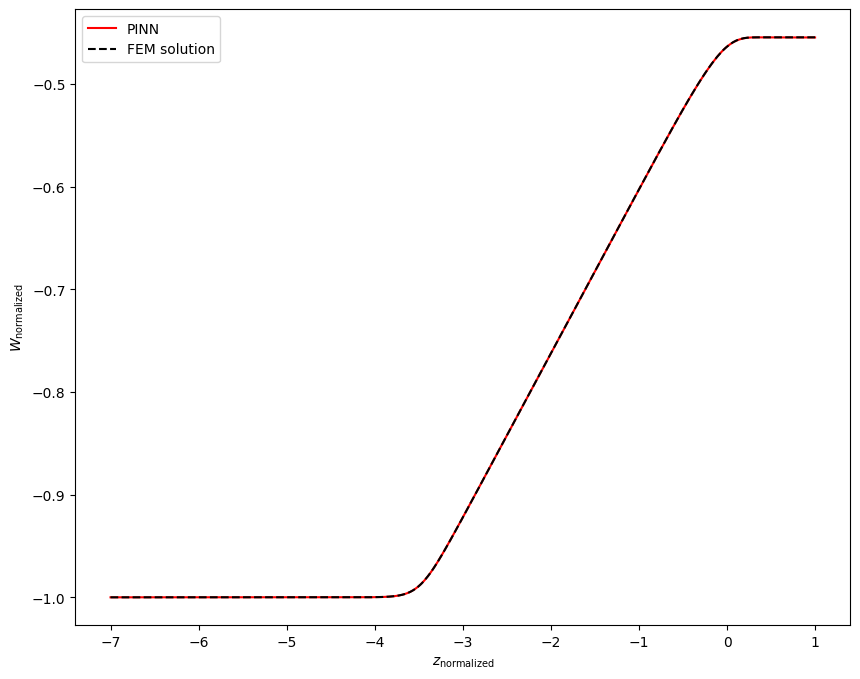


Epoch: 318000/400000
Loss: 0.06063130497932434
C_mean: -11.69455623626709
C_std: 0.01792643778026104
Loss ODE: 0.0189532358199358
Loss z0: 0.0
Loss zf: 0.00041097402572631836
KL divergence: 3.75683331489563


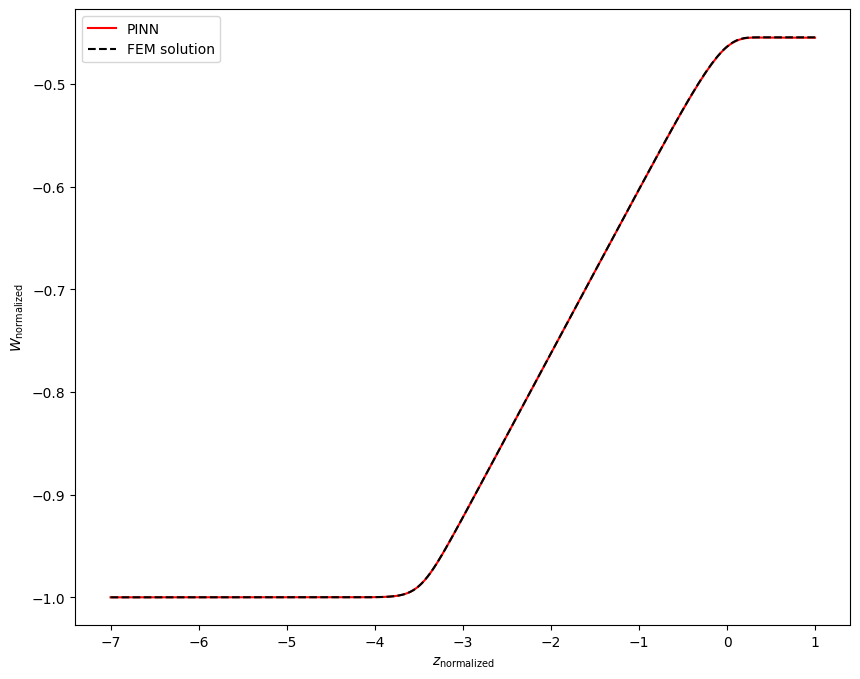


Epoch: 319000/400000
Loss: 0.060287851840257645
C_mean: -11.694784164428711
C_std: 0.01789579540491104
Loss ODE: 0.019936401396989822
Loss z0: 0.0
Loss zf: 0.0002765655517578125
KL divergence: 3.7585794925689697


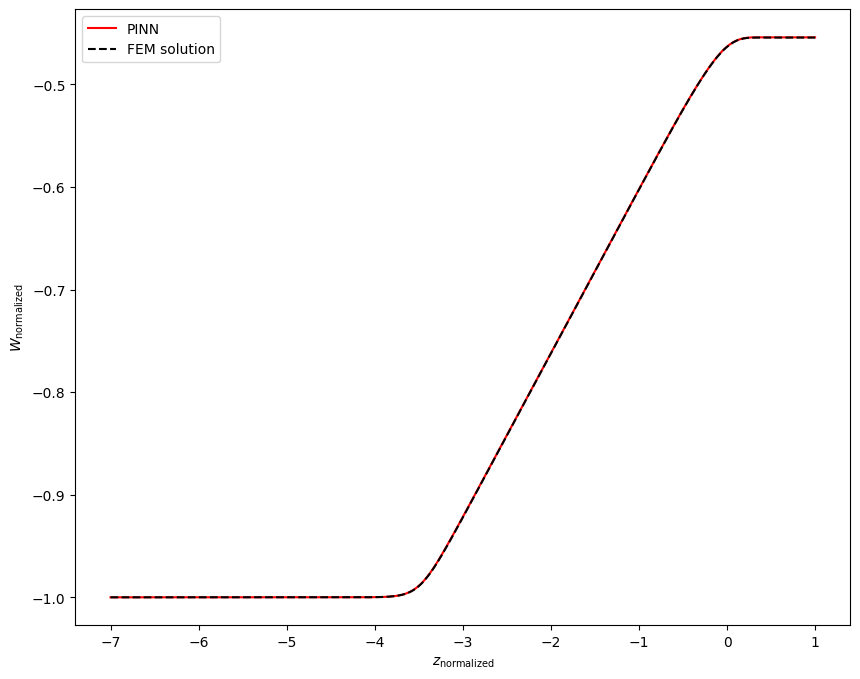


Epoch: 320000/400000
Loss: 0.05314139649271965
C_mean: -11.694562911987305
C_std: 0.01788654364645481
Loss ODE: 0.013255409896373749
Loss z0: 0.0
Loss zf: 0.0002295374870300293
KL divergence: 3.759061098098755


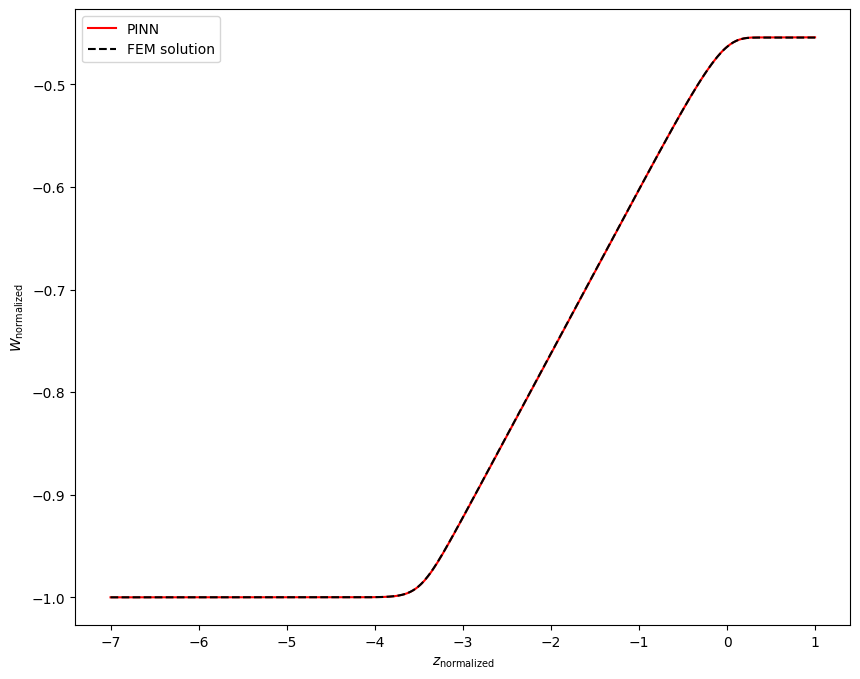


Epoch: 321000/400000
Loss: 0.04301714897155762
C_mean: -11.694633483886719
C_std: 0.01787555031478405
Loss ODE: 0.004486887715756893
Loss z0: 0.0
Loss zf: 9.334087371826172e-05
KL divergence: 3.7596852779388428


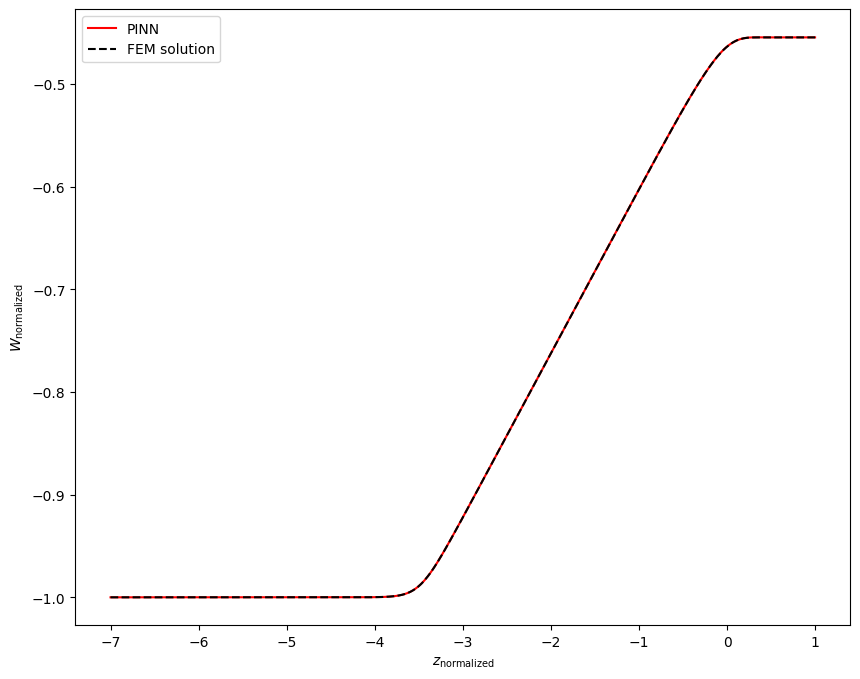


Epoch: 322000/400000
Loss: 0.056087784469127655
C_mean: -11.694571495056152
C_std: 0.017851851880550385
Loss ODE: 0.017871765419840813
Loss z0: 0.0
Loss zf: 6.058812141418457e-05
KL divergence: 3.7610137462615967


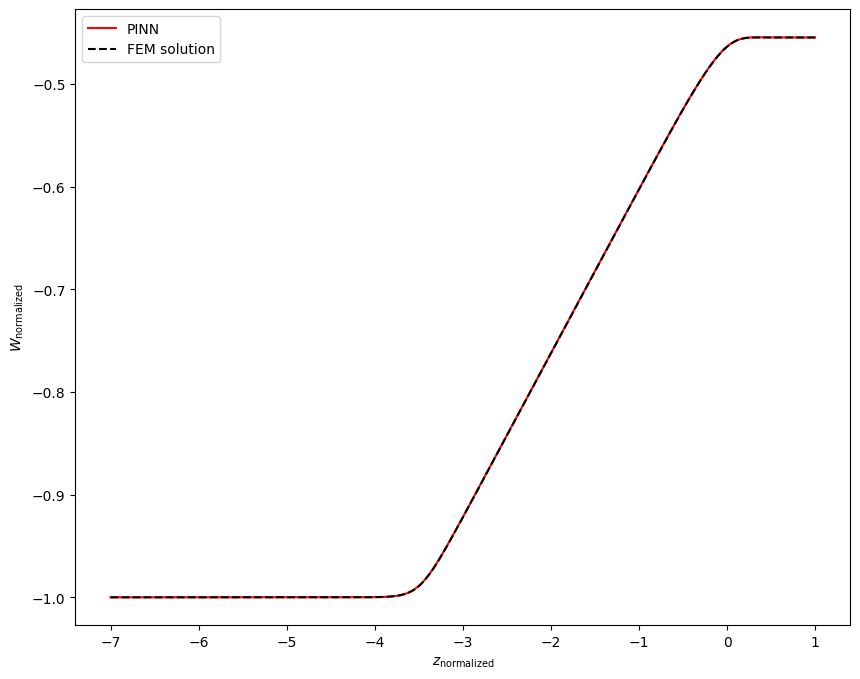


Epoch: 323000/400000
Loss: 0.07026712596416473
C_mean: -11.69461727142334
C_std: 0.017824899405241013
Loss ODE: 0.029695890843868256
Loss z0: 0.0
Loss zf: 0.00029459595680236816
KL divergence: 3.76252818107605


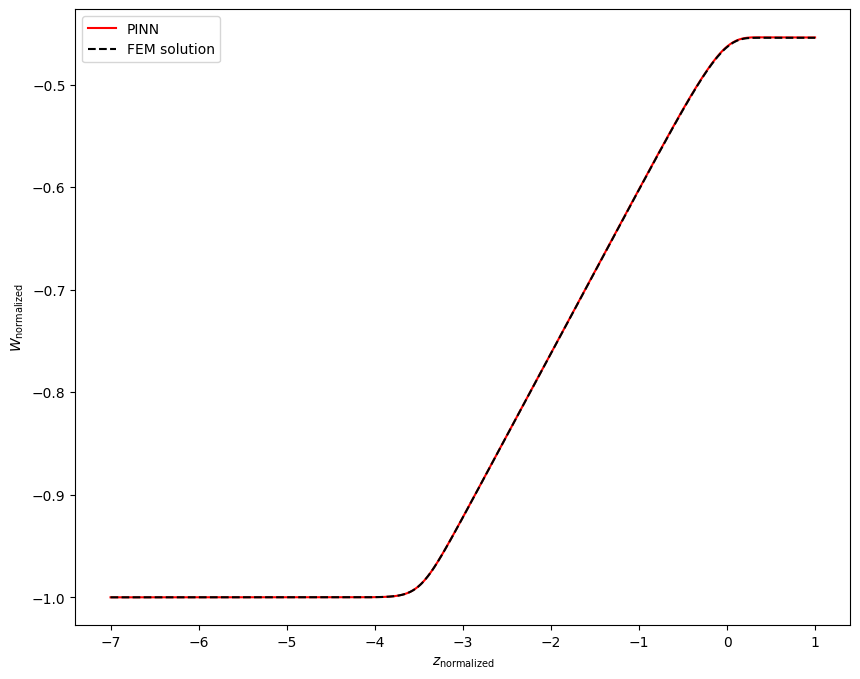


Epoch: 324000/400000
Loss: 0.0461161732673645
C_mean: -11.694626808166504
C_std: 0.01777150295674801
Loss ODE: 0.006004584487527609
Loss z0: 0.0
Loss zf: 0.00024563074111938477
KL divergence: 3.7655282020568848


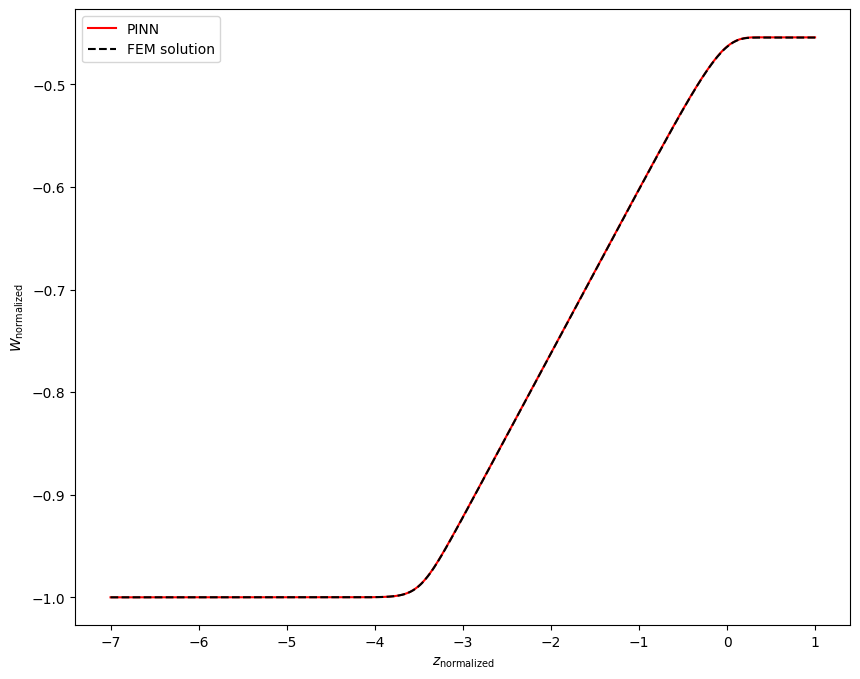


Epoch: 325000/400000
Loss: 0.04584573209285736
C_mean: -11.694692611694336
C_std: 0.01771651953458786
Loss ODE: 0.004860027227550745
Loss z0: 0.0
Loss zf: 0.0003299415111541748
KL divergence: 3.7686290740966797


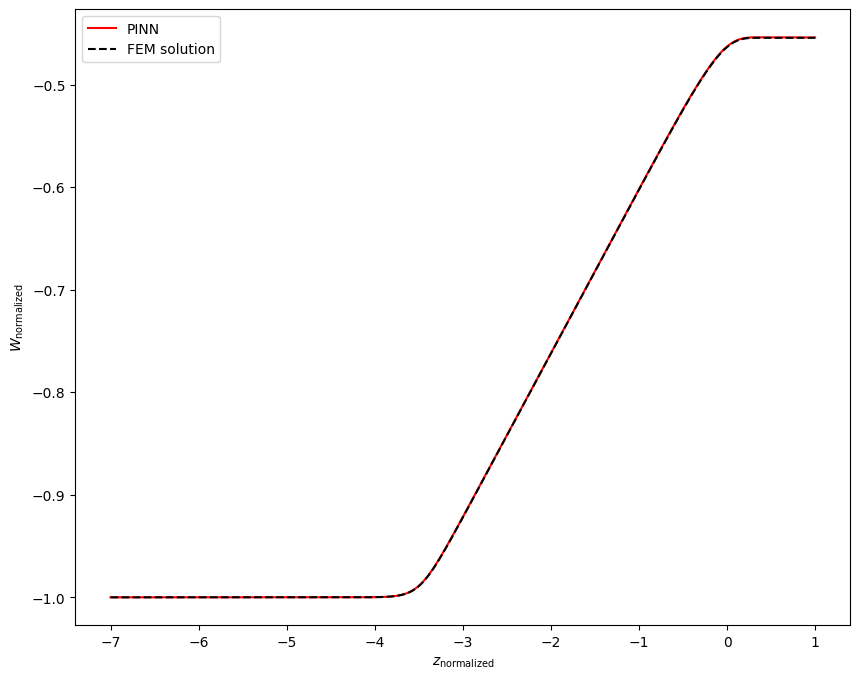


Epoch: 326000/400000
Loss: 0.045570503920316696
C_mean: -11.694507598876953
C_std: 0.017695974558591843
Loss ODE: 0.007782849483191967
Loss z0: 0.0
Loss zf: 9.000301361083984e-06
KL divergence: 3.7697651386260986


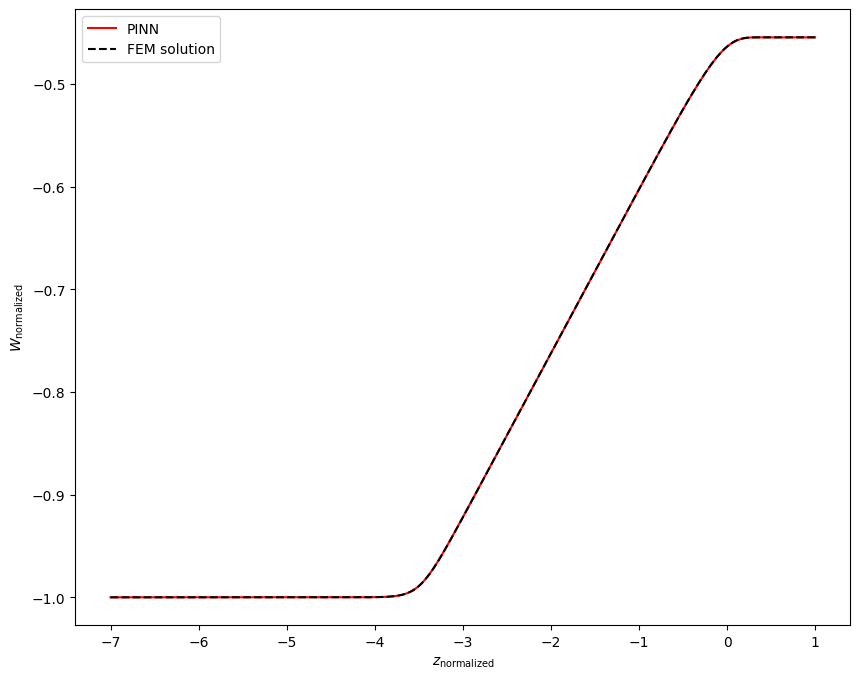


Epoch: 327000/400000
Loss: 0.052059195935726166
C_mean: -11.694433212280273
C_std: 0.01768621802330017
Loss ODE: 0.01365876104682684
Loss z0: 0.0
Loss zf: 6.973743438720703e-05
KL divergence: 3.77030611038208


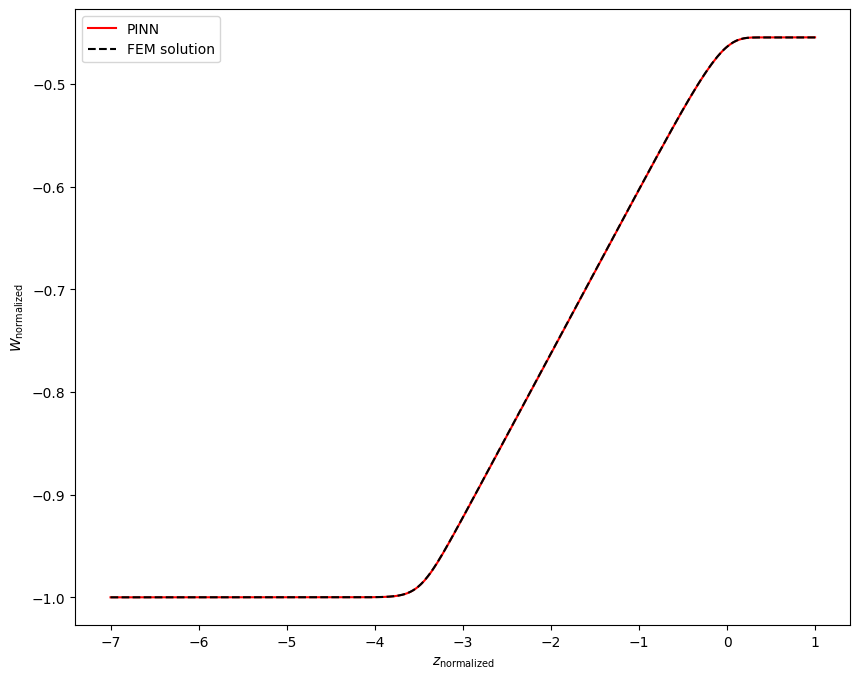


Epoch: 328000/400000
Loss: 0.056612394750118256
C_mean: -11.694584846496582
C_std: 0.0176603551954031
Loss ODE: 0.01880025491118431
Loss z0: 0.0
Loss zf: 9.417533874511719e-06
KL divergence: 3.771796703338623


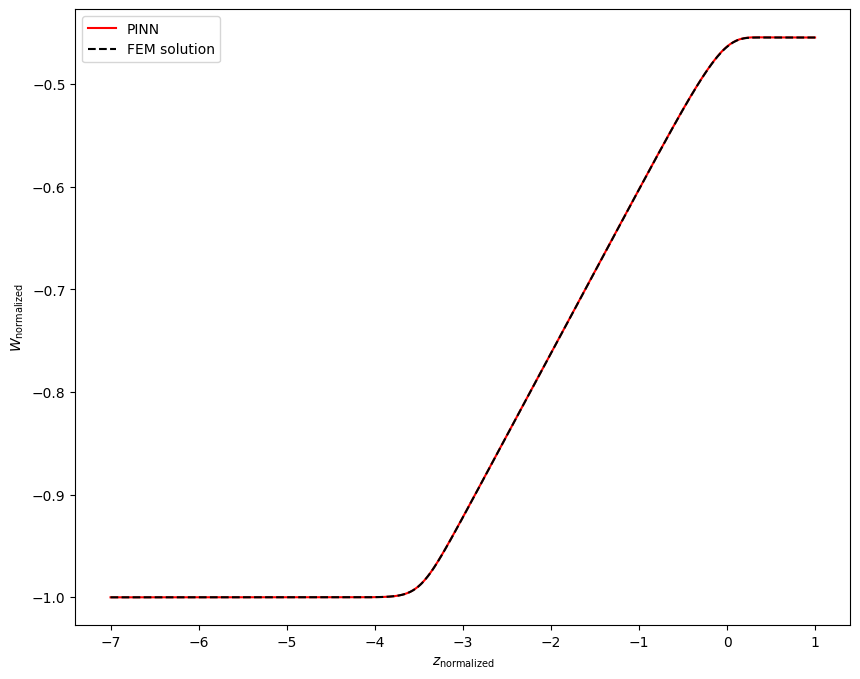


Epoch: 329000/400000
Loss: 0.05345471203327179
C_mean: -11.694600105285645
C_std: 0.017658594995737076
Loss ODE: 0.01531135942786932
Loss z0: 0.0
Loss zf: 4.2438507080078125e-05
KL divergence: 3.7718966007232666


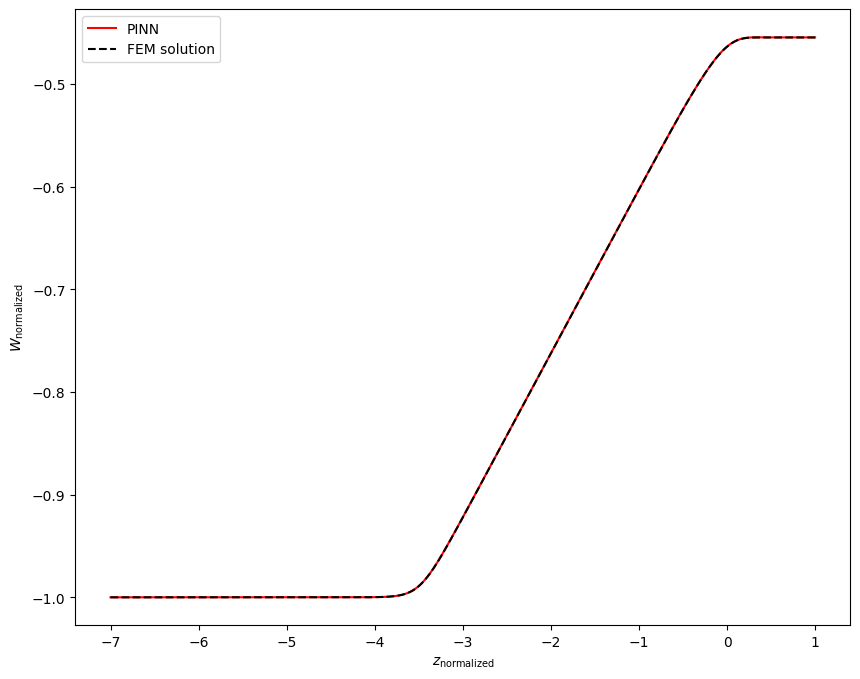


Epoch: 330000/400000
Loss: 0.04876236245036125
C_mean: -11.694457054138184
C_std: 0.017646271735429764
Loss ODE: 0.009936054237186909
Loss z0: 0.0
Loss zf: 0.00011005997657775879
KL divergence: 3.772570848464966


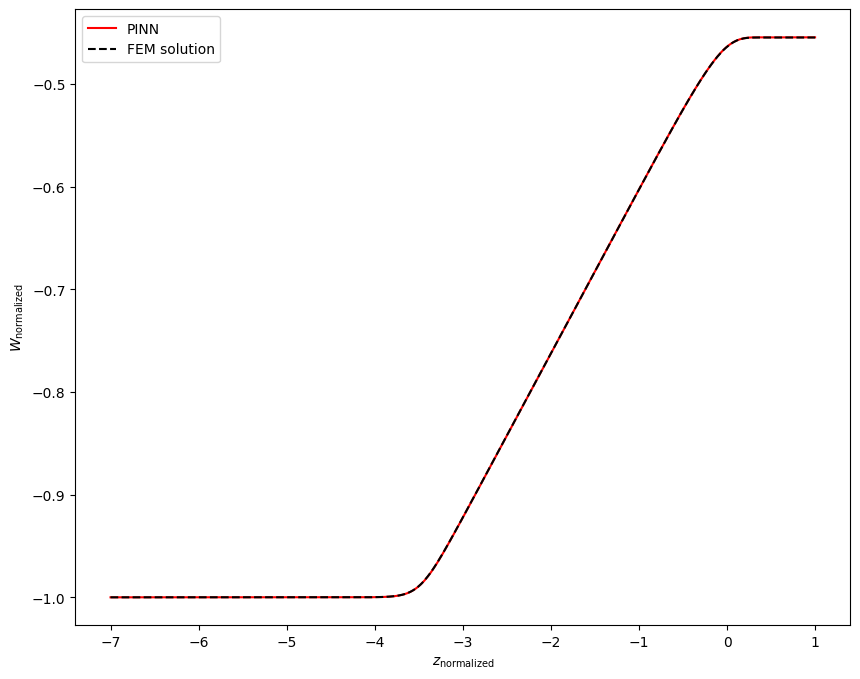


Epoch: 331000/400000
Loss: 0.07090625911951065
C_mean: -11.69442081451416
C_std: 0.017615804448723793
Loss ODE: 0.03227492421865463
Loss z0: 0.0
Loss zf: 8.884072303771973e-05
KL divergence: 3.7742929458618164


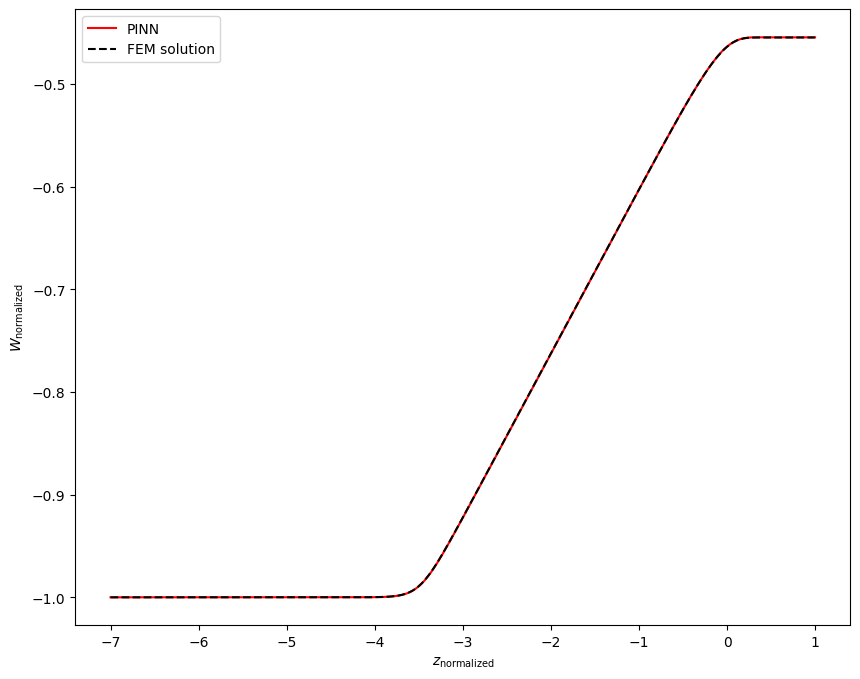


Epoch: 332000/400000
Loss: 0.04812668263912201
C_mean: -11.694489479064941
C_std: 0.017601387575268745
Loss ODE: 0.009693294763565063
Loss z0: 0.0
Loss zf: 6.821751594543457e-05
KL divergence: 3.7751212120056152


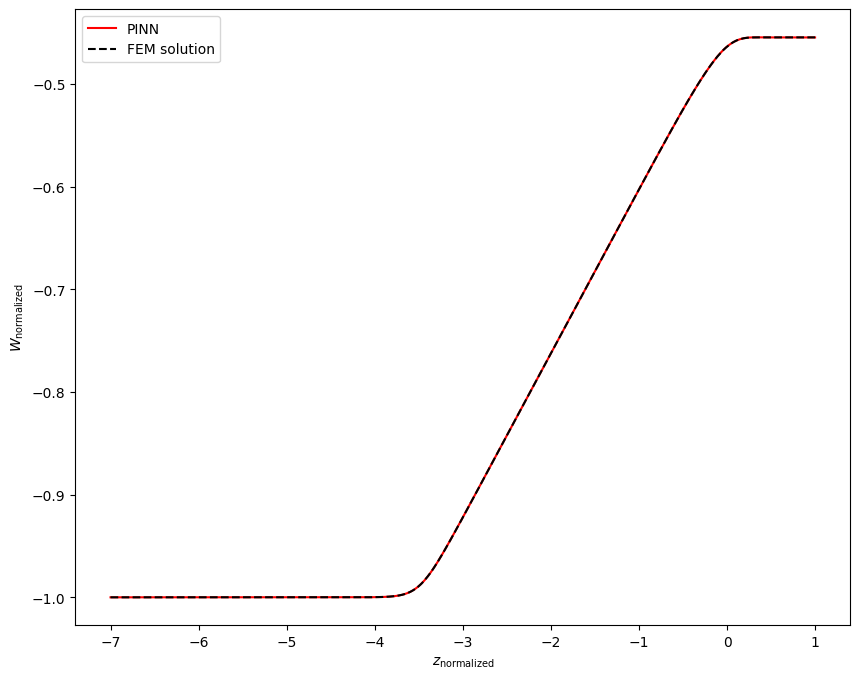


Epoch: 333000/400000
Loss: 0.0508025698363781
C_mean: -11.694358825683594
C_std: 0.017591947689652443
Loss ODE: 0.012944146990776062
Loss z0: 0.0
Loss zf: 1.0192394256591797e-05
KL divergence: 3.7756500244140625


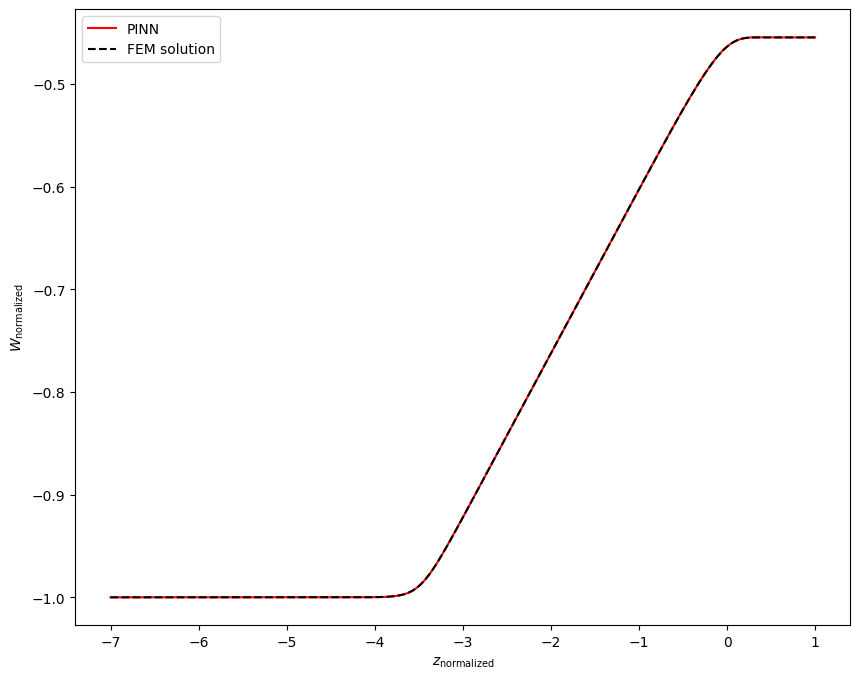


Epoch: 334000/400000
Loss: 0.05121024325489998
C_mean: -11.694467544555664
C_std: 0.01758917048573494
Loss ODE: 0.01183050125837326
Loss z0: 0.0
Loss zf: 0.0001621544361114502
KL divergence: 3.775820016860962


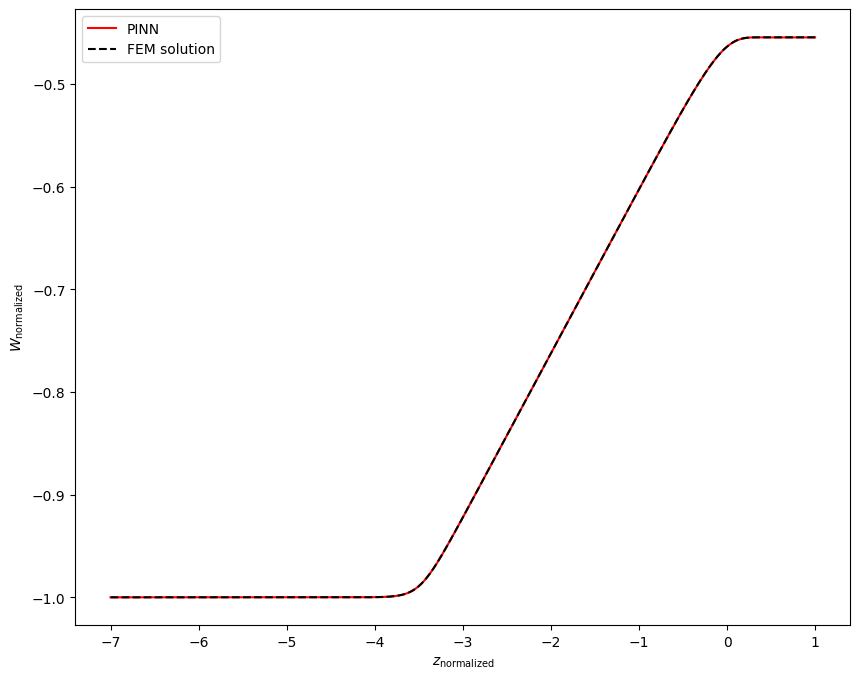


Epoch: 335000/400000
Loss: 0.06580950319766998
C_mean: -11.694451332092285
C_std: 0.017544008791446686
Loss ODE: 0.02716224640607834
Loss z0: 0.0
Loss zf: 8.633732795715332e-05
KL divergence: 3.7783889770507812


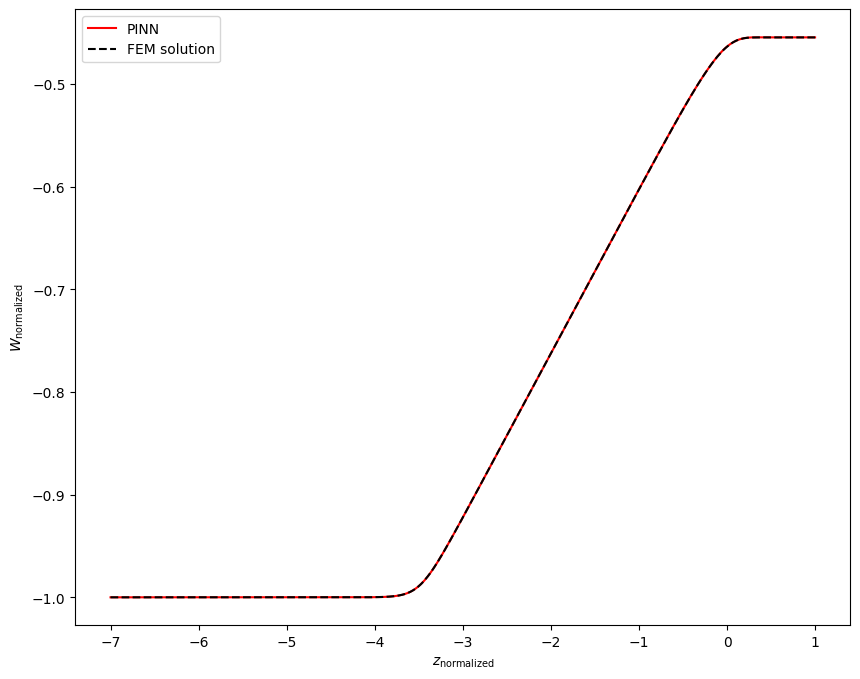


Epoch: 336000/400000
Loss: 0.046252064406871796
C_mean: -11.694381713867188
C_std: 0.01753440871834755
Loss ODE: 0.007772335782647133
Loss z0: 0.0
Loss zf: 6.905198097229004e-05
KL divergence: 3.778920888900757


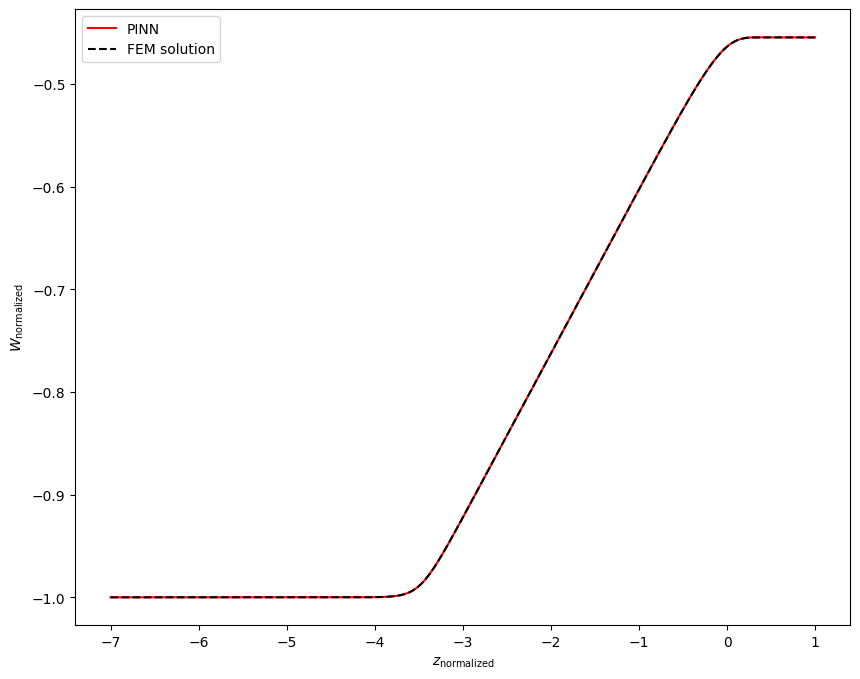


Epoch: 337000/400000
Loss: 0.05192814767360687
C_mean: -11.69451904296875
C_std: 0.01751699484884739
Loss ODE: 0.013519929721951485
Loss z0: 0.0
Loss zf: 6.0886144638061523e-05
KL divergence: 3.7799360752105713


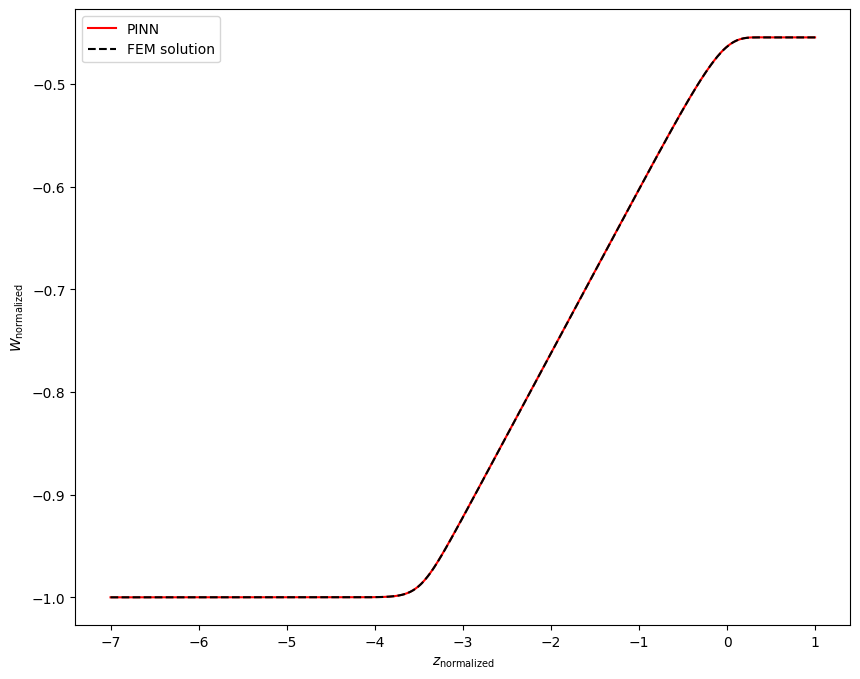


Epoch: 338000/400000
Loss: 0.04878125339746475
C_mean: -11.694486618041992
C_std: 0.017481990158557892
Loss ODE: 0.01087587047368288
Loss z0: 0.0
Loss zf: 8.612871170043945e-06
KL divergence: 3.781925678253174


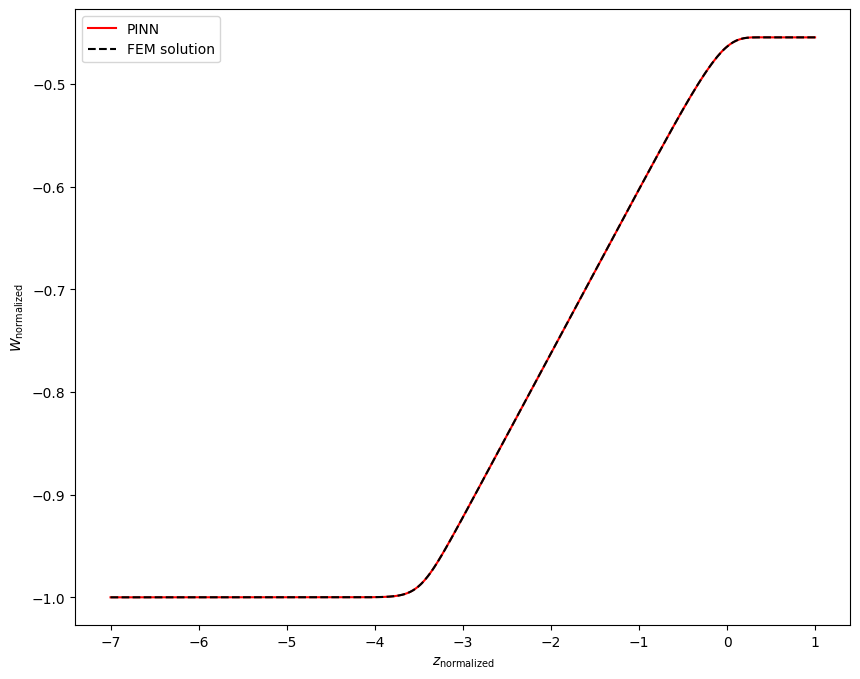


Epoch: 339000/400000
Loss: 0.054681725800037384
C_mean: -11.694451332092285
C_std: 0.01744909957051277
Loss ODE: 0.015567552298307419
Loss z0: 0.0
Loss zf: 0.00012761354446411133
KL divergence: 3.783803939819336


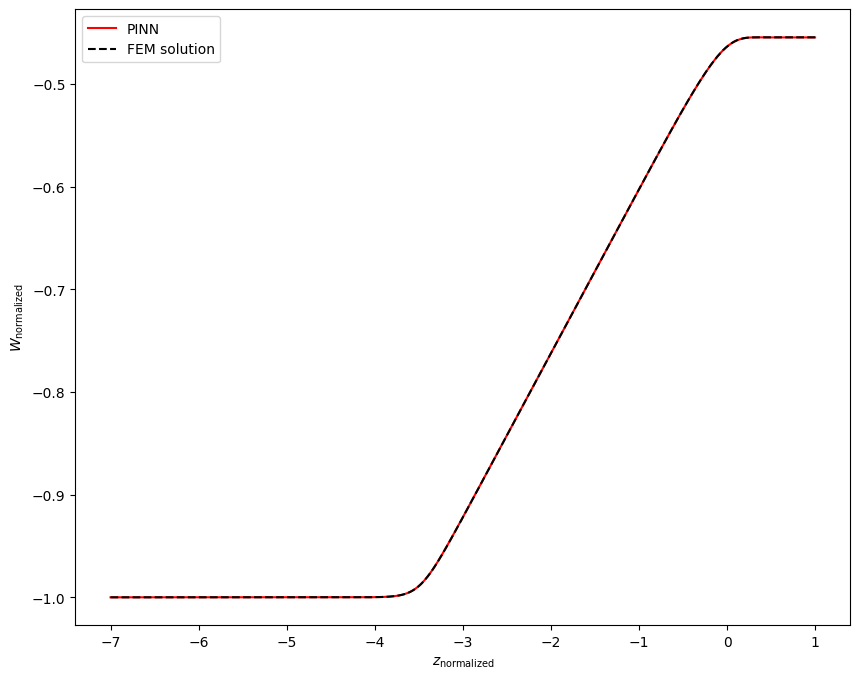


Epoch: 340000/400000
Loss: 0.06355956196784973
C_mean: -11.6944580078125
C_std: 0.01743529550731182
Loss ODE: 0.0253162644803524
Loss z0: 0.0
Loss zf: 3.972649574279785e-05
KL divergence: 3.7846035957336426


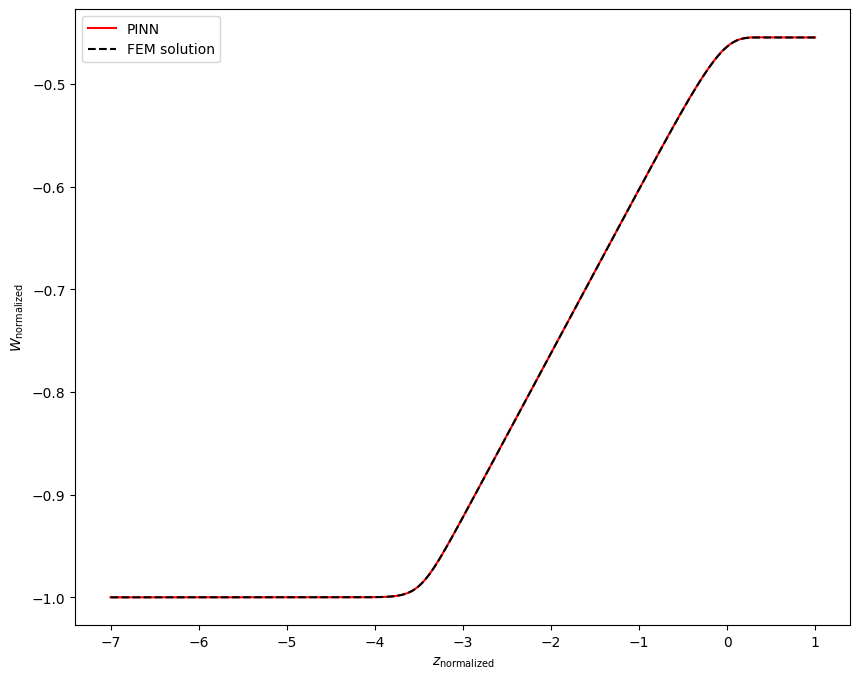


Epoch: 341000/400000
Loss: 0.045407697558403015
C_mean: -11.694478034973145
C_std: 0.017442427575588226
Loss ODE: 0.006557213608175516
Loss z0: 0.0
Loss zf: 0.00010085105895996094
KL divergence: 3.7841973304748535


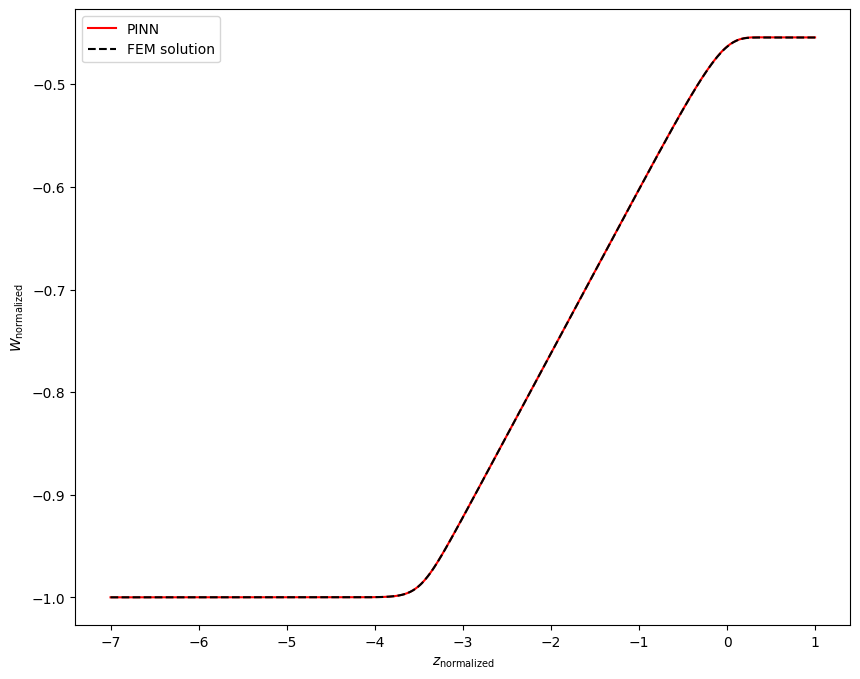


Epoch: 342000/400000
Loss: 0.043818045407533646
C_mean: -11.69443416595459
C_std: 0.017421217635273933
Loss ODE: 0.004831485450267792
Loss z0: 0.0
Loss zf: 0.00011324882507324219
KL divergence: 3.785407304763794


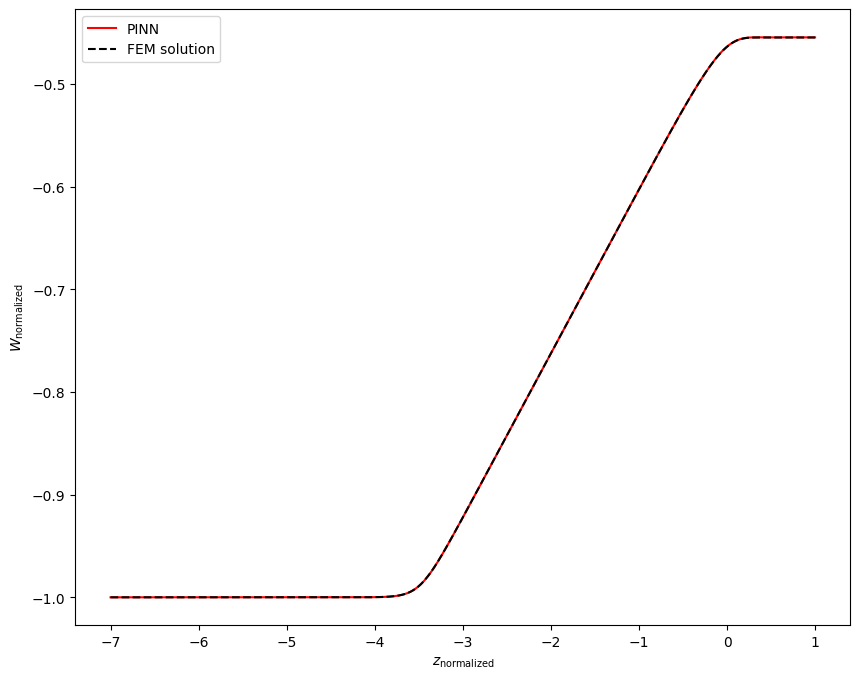


Epoch: 343000/400000
Loss: 0.045094721019268036
C_mean: -11.694463729858398
C_std: 0.01741967909038067
Loss ODE: 0.006519170477986336
Loss z0: 0.0
Loss zf: 7.206201553344727e-05
KL divergence: 3.7854928970336914


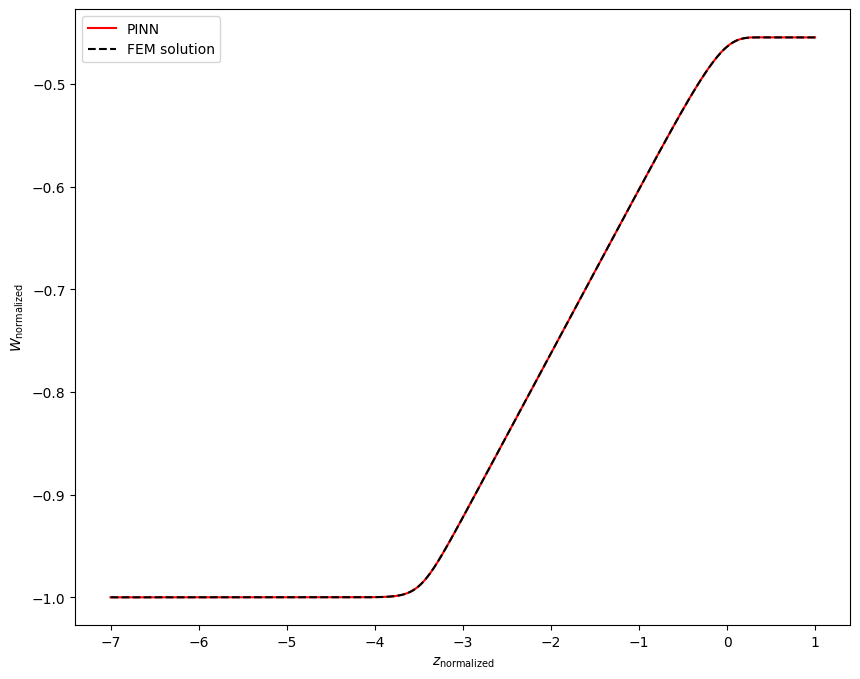


Epoch: 344000/400000
Loss: 0.04811231791973114
C_mean: -11.694429397583008
C_std: 0.01739993505179882
Loss ODE: 0.009635377675294876
Loss z0: 0.0
Loss zf: 6.10649585723877e-05
KL divergence: 3.7866291999816895


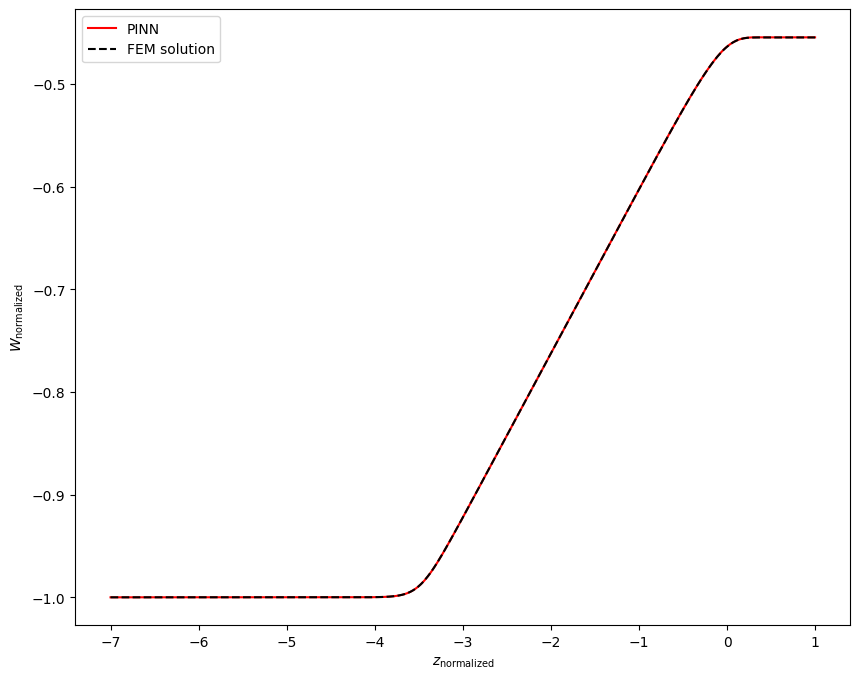


Epoch: 345000/400000
Loss: 0.04438038542866707
C_mean: -11.69444751739502
C_std: 0.017374109476804733
Loss ODE: 0.0056651076301932335
Loss z0: 0.0
Loss zf: 8.341670036315918e-05
KL divergence: 3.7881109714508057


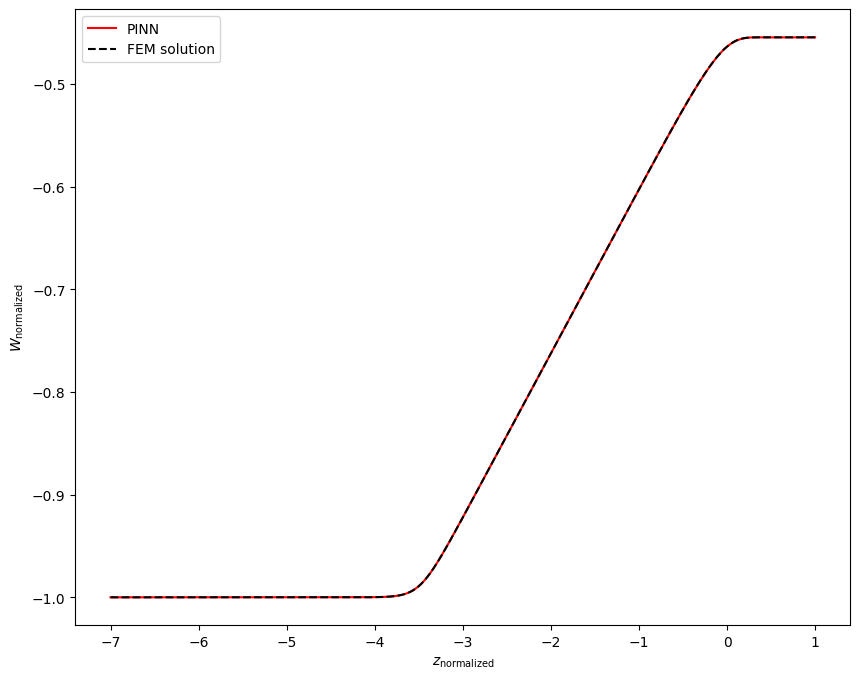


Epoch: 346000/400000
Loss: 0.048537760972976685
C_mean: -11.69441032409668
C_std: 0.01732231117784977
Loss ODE: 0.010153000243008137
Loss z0: 0.0
Loss zf: 4.738569259643555e-05
KL divergence: 3.791090726852417


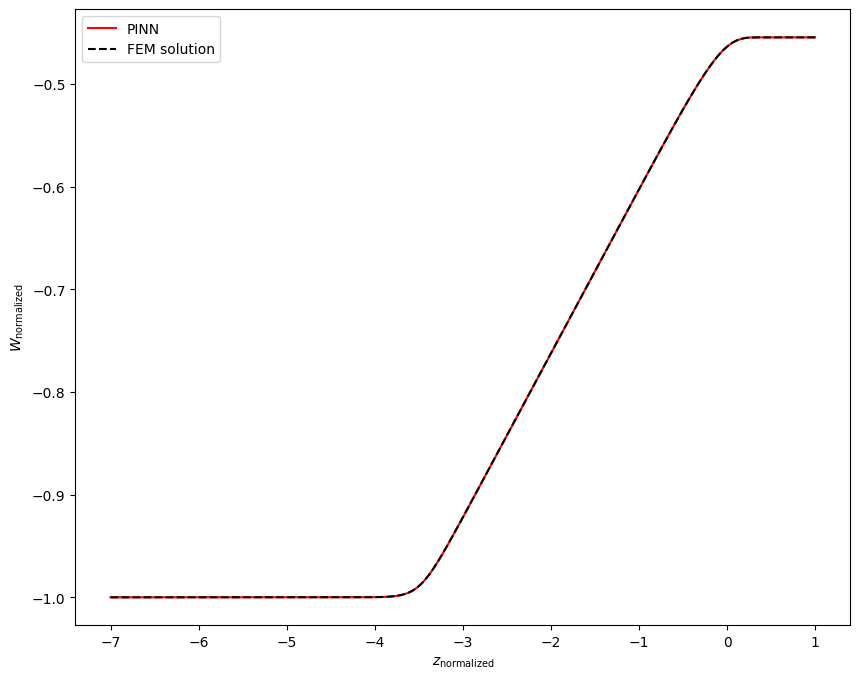


Epoch: 347000/400000
Loss: 0.06689058989286423
C_mean: -11.69432544708252
C_std: 0.017322557047009468
Loss ODE: 0.028825778514146805
Loss z0: 0.0
Loss zf: 1.5407800674438477e-05
KL divergence: 3.7910733222961426


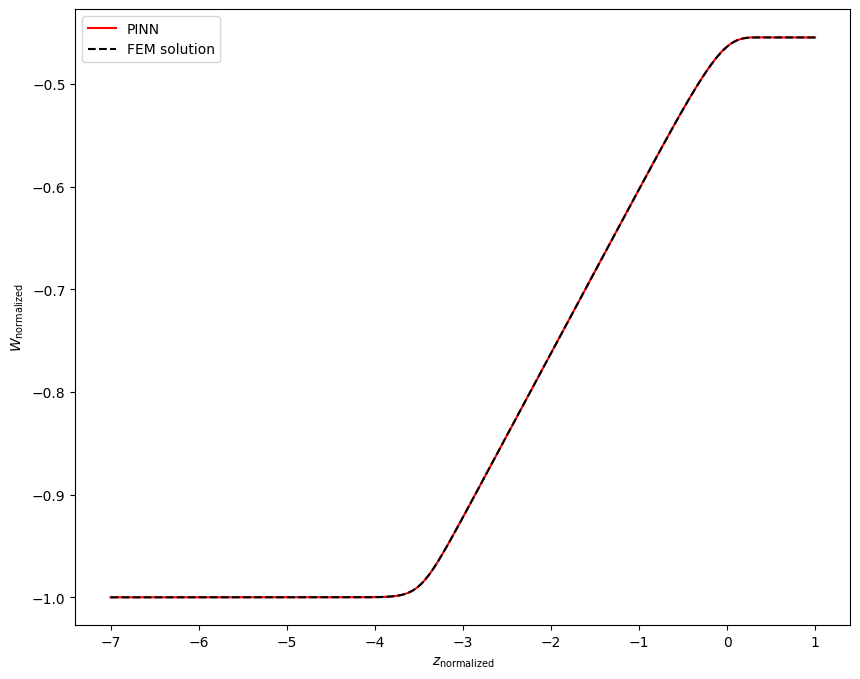


Epoch: 348000/400000
Loss: 0.047902803868055344
C_mean: -11.69435977935791
C_std: 0.017294229939579964
Loss ODE: 0.00943541619926691
Loss z0: 0.0
Loss zf: 5.40316104888916e-05
KL divergence: 3.7927072048187256


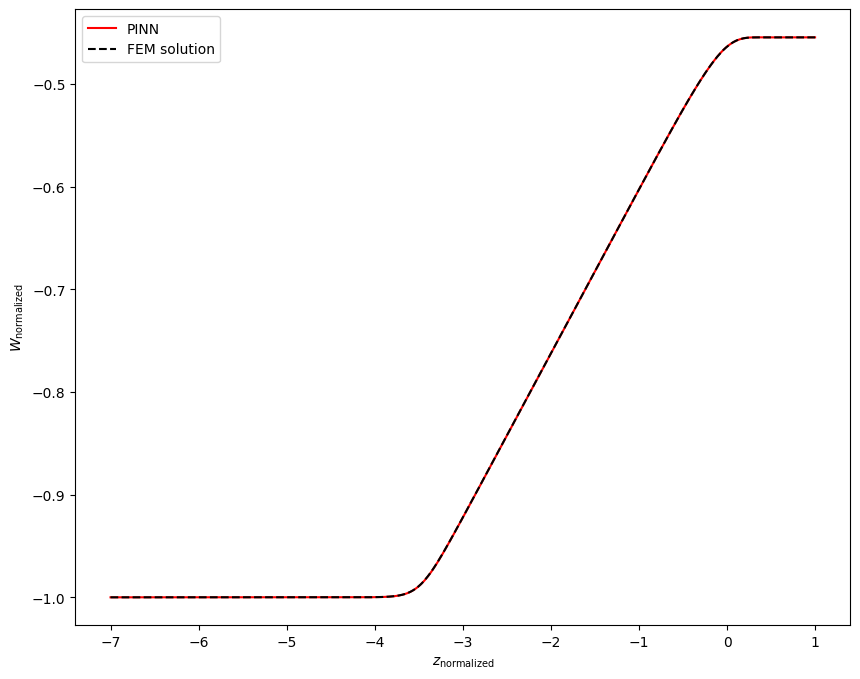


Epoch: 349000/400000
Loss: 0.05296330526471138
C_mean: -11.694482803344727
C_std: 0.01732105016708374
Loss ODE: 0.014648359268903732
Loss z0: 0.0
Loss zf: 4.032254219055176e-05
KL divergence: 3.7911720275878906


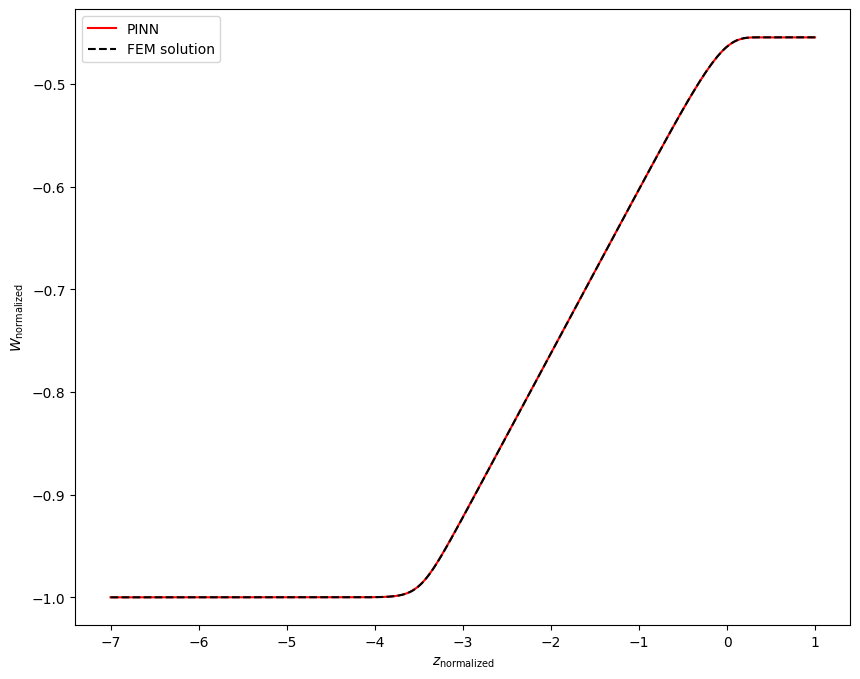


Epoch: 350000/400000
Loss: 0.043285537511110306
C_mean: -11.694429397583008
C_std: 0.017305860295891762
Loss ODE: 0.0035778554156422615
Loss z0: 0.0
Loss zf: 0.0001787245273590088
KL divergence: 3.792043685913086


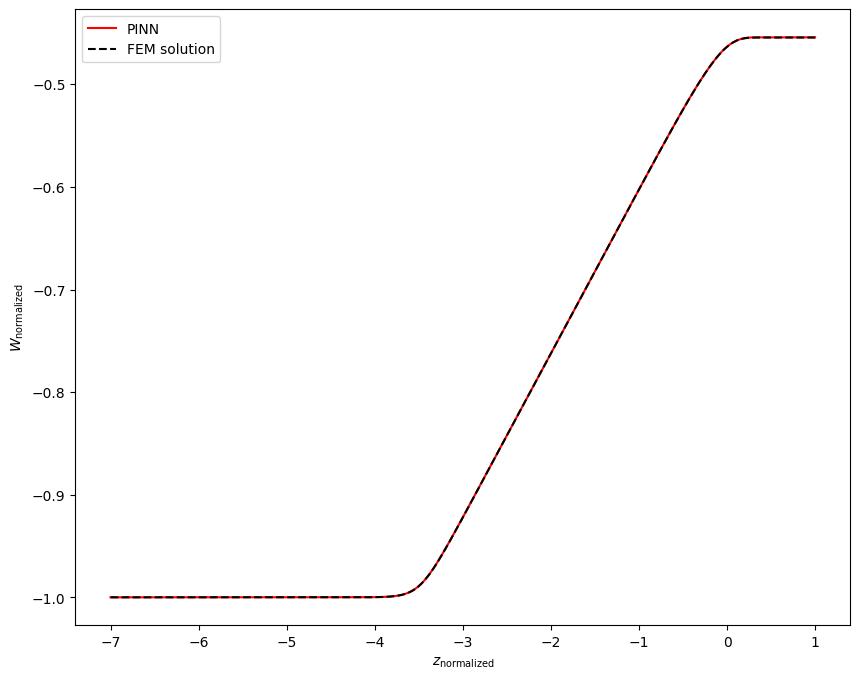


Epoch: 351000/400000
Loss: 0.046311475336551666
C_mean: -11.69427490234375
C_std: 0.017284104600548744
Loss ODE: 0.008111324161291122
Loss z0: 0.0
Loss zf: 2.6732683181762695e-05
KL divergence: 3.7932825088500977


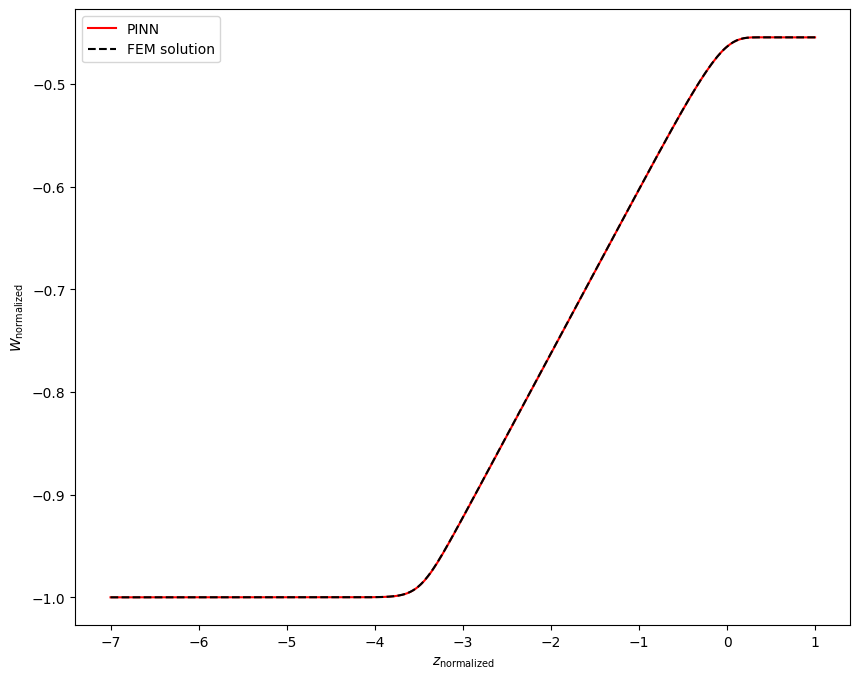


Epoch: 352000/400000
Loss: 0.06535949558019638
C_mean: -11.694448471069336
C_std: 0.017261525616049767
Loss ODE: 0.026186374947428703
Loss z0: 0.0
Loss zf: 0.0001226961612701416
KL divergence: 3.7946157455444336


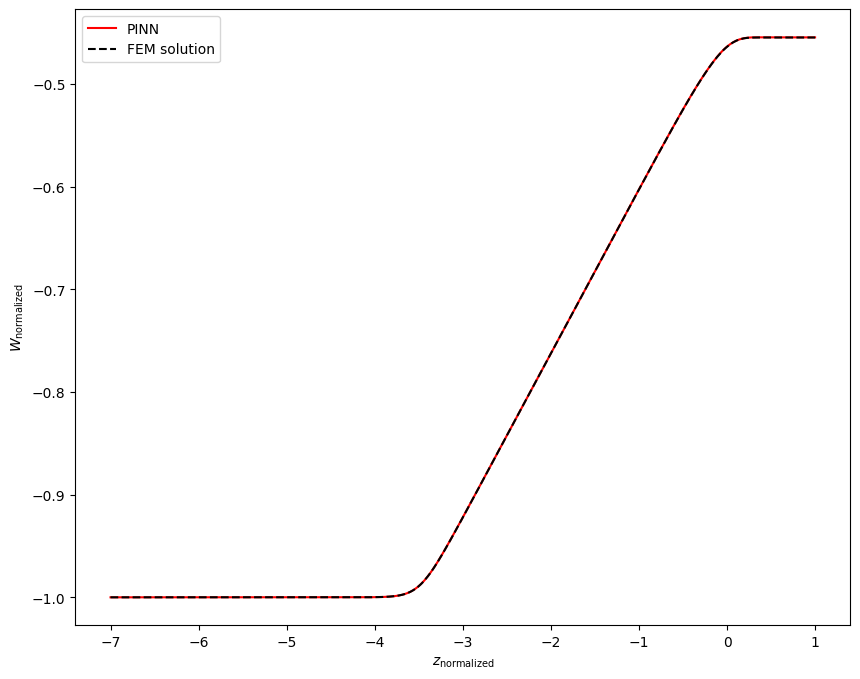


Epoch: 353000/400000
Loss: 0.06735436618328094
C_mean: -11.694389343261719
C_std: 0.017265483736991882
Loss ODE: 0.027043376117944717
Loss z0: 0.0
Loss zf: 0.00023671984672546387
KL divergence: 3.794379711151123


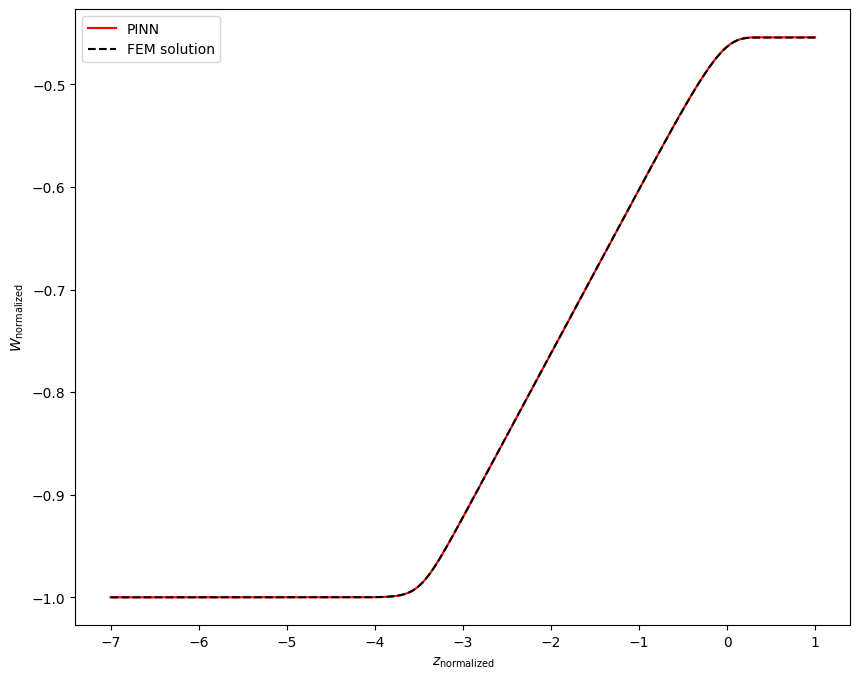


Epoch: 354000/400000
Loss: 0.06429655849933624
C_mean: -11.694337844848633
C_std: 0.01725764200091362
Loss ODE: 0.02419058233499527
Loss z0: 0.0
Loss zf: 0.00021576881408691406
KL divergence: 3.7948288917541504


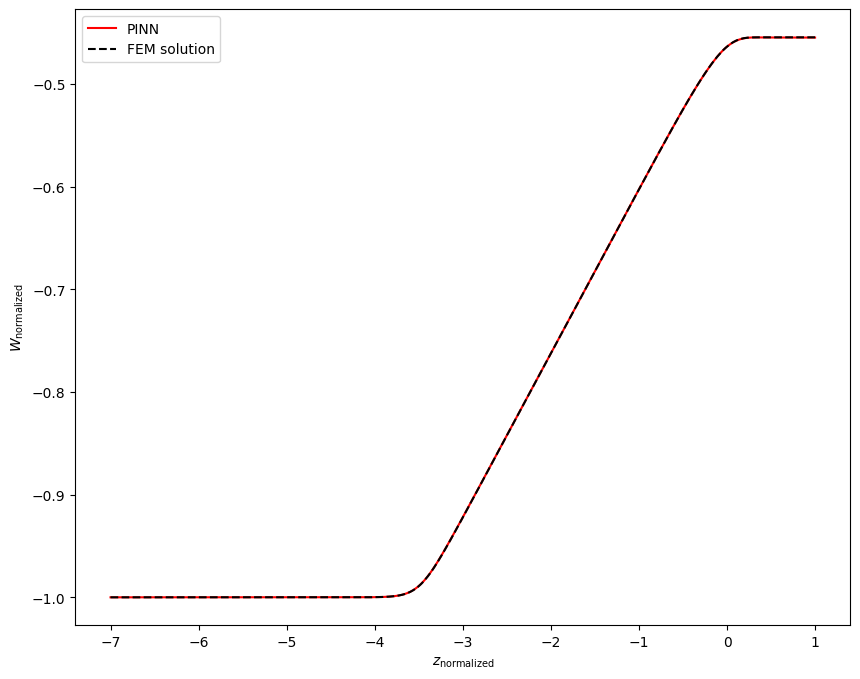


Epoch: 355000/400000
Loss: 0.043206557631492615
C_mean: -11.694437026977539
C_std: 0.017250243574380875
Loss ODE: 0.00516810268163681
Loss z0: 0.0
Loss zf: 8.58306884765625e-06
KL divergence: 3.795262336730957


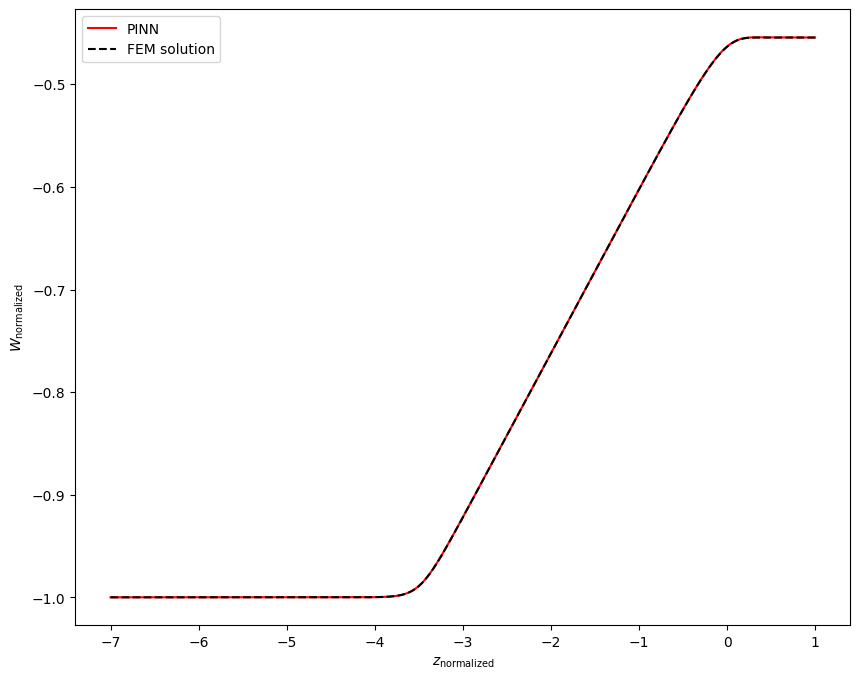


Epoch: 356000/400000
Loss: 0.06121958792209625
C_mean: -11.694437980651855
C_std: 0.017207782715559006
Loss ODE: 0.02247246541082859
Loss z0: 0.0
Loss zf: 7.697939872741699e-05
KL divergence: 3.7977328300476074


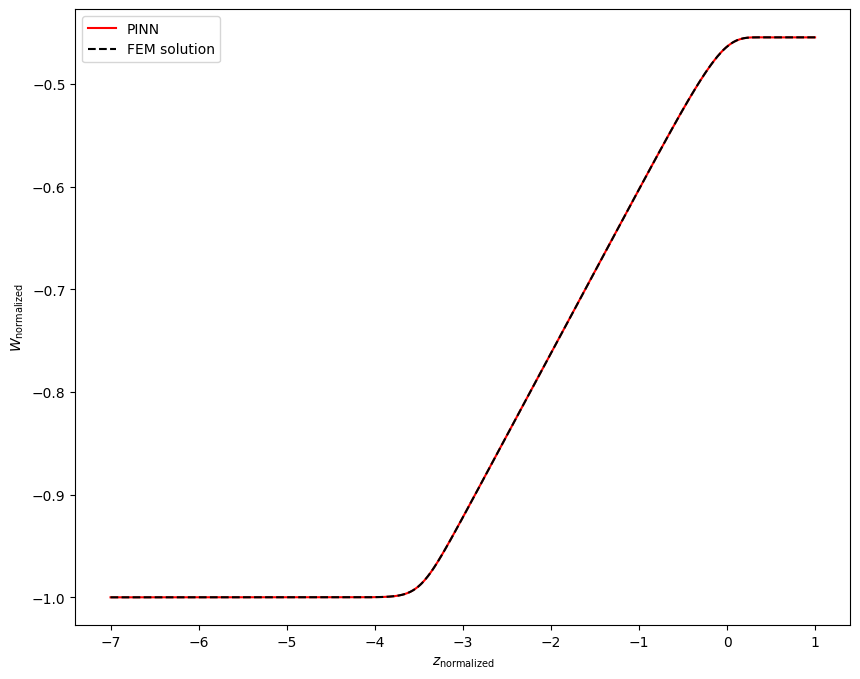


Epoch: 357000/400000
Loss: 0.05570346862077713
C_mean: -11.694443702697754
C_std: 0.017191577702760696
Loss ODE: 0.01764518953859806
Loss z0: 0.0
Loss zf: 7.152557373046875e-06
KL divergence: 3.798675298690796


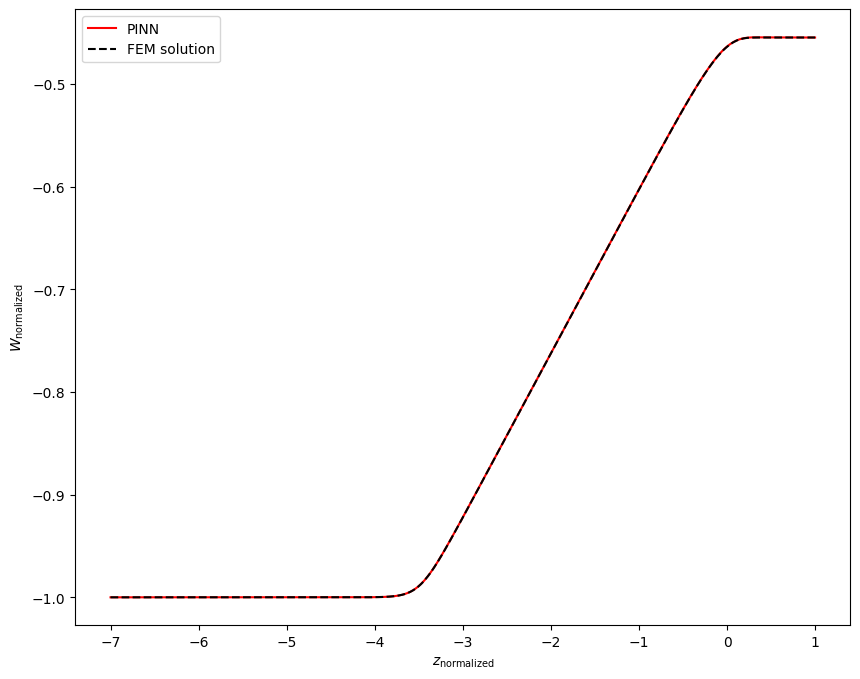


Epoch: 358000/400000
Loss: 0.04940425604581833
C_mean: -11.694379806518555
C_std: 0.01717887818813324
Loss ODE: 0.010768610052764416
Loss z0: 0.0
Loss zf: 6.416440010070801e-05
KL divergence: 3.7994003295898438


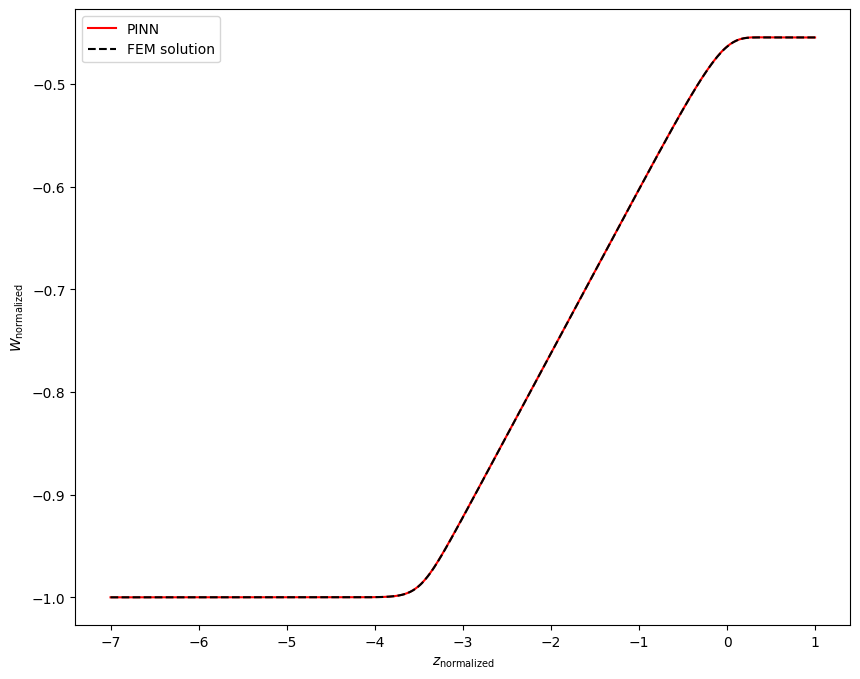


Epoch: 359000/400000
Loss: 0.048494793474674225
C_mean: -11.694302558898926
C_std: 0.01715928688645363
Loss ODE: 0.00979121495038271
Loss z0: 0.0
Loss zf: 6.982684135437012e-05
KL divergence: 3.8005311489105225


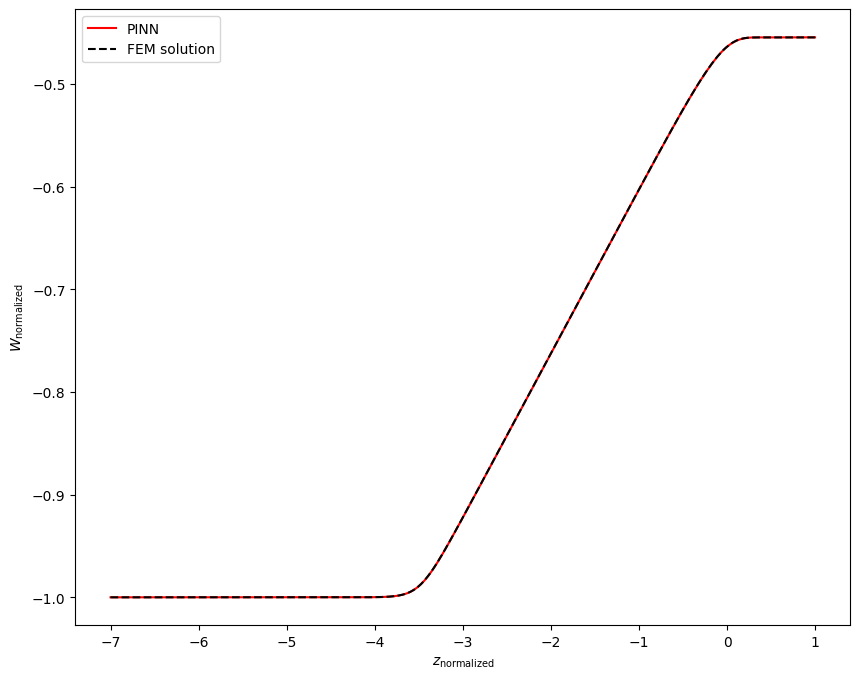


Epoch: 360000/400000
Loss: 0.046893633902072906
C_mean: -11.694365501403809
C_std: 0.017131062224507332
Loss ODE: 0.008184781298041344
Loss z0: 0.0
Loss zf: 6.86943531036377e-05
KL divergence: 3.8021912574768066


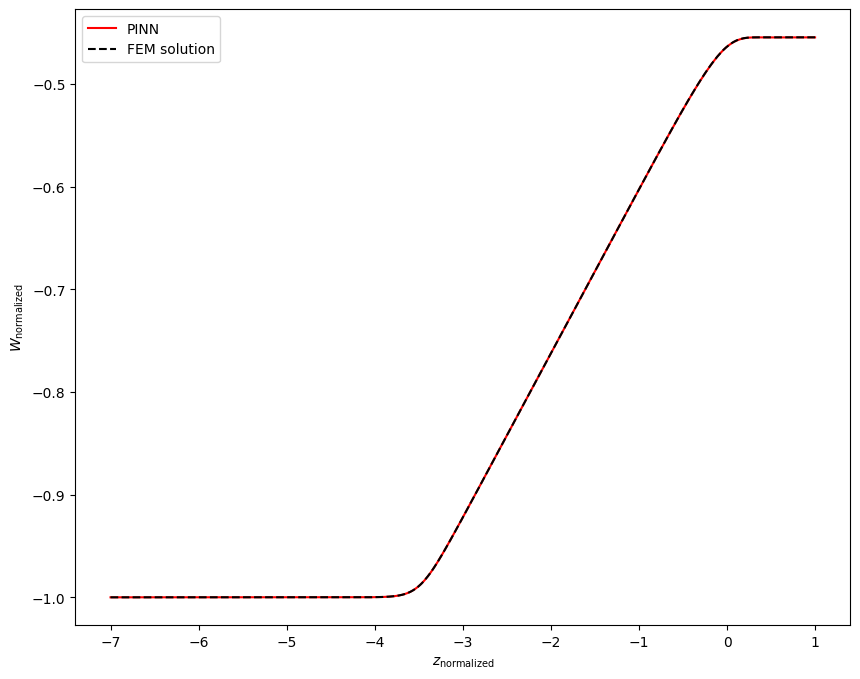


Epoch: 361000/400000
Loss: 0.04094083979725838
C_mean: -11.694404602050781
C_std: 0.01711389236152172
Loss ODE: 0.0027676213067024946
Loss z0: 0.0
Loss zf: 1.4126300811767578e-05
KL divergence: 3.8031954765319824


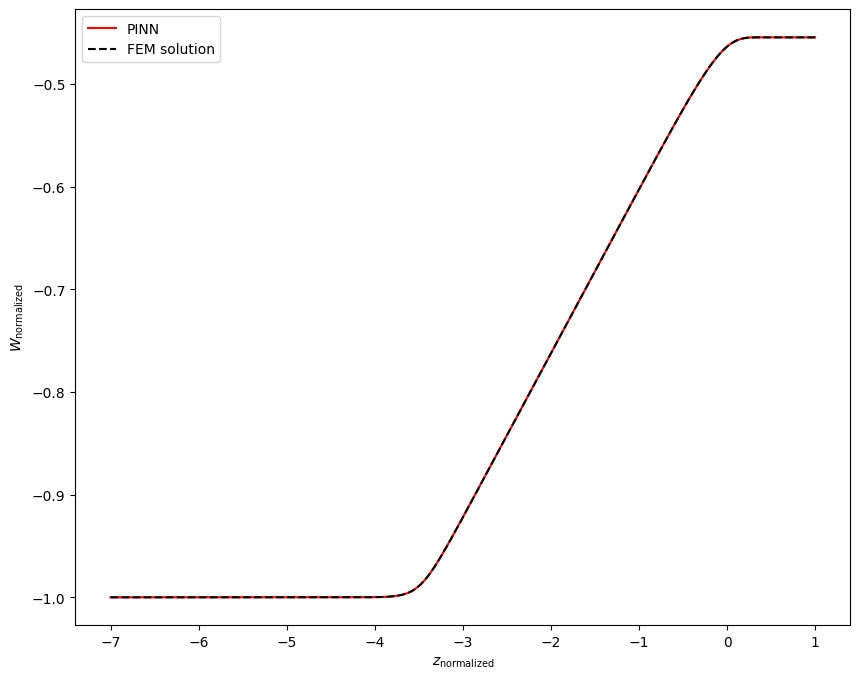


Epoch: 362000/400000
Loss: 0.042182788252830505
C_mean: -11.694406509399414
C_std: 0.017115896567702293
Loss ODE: 0.0035136232618242502
Loss z0: 0.0
Loss zf: 6.383657455444336e-05
KL divergence: 3.8030800819396973


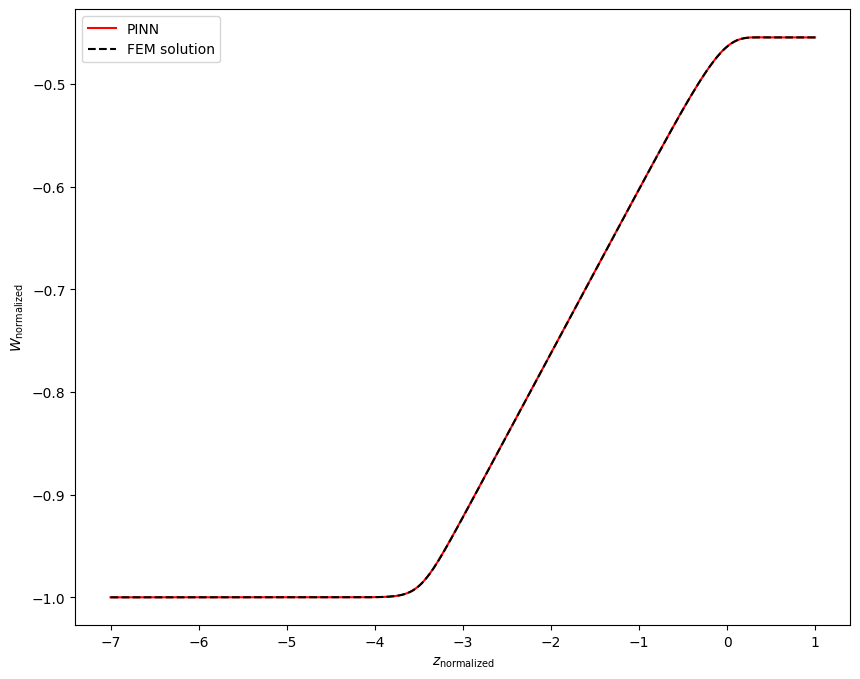


Epoch: 363000/400000
Loss: 0.046747129410505295
C_mean: -11.694303512573242
C_std: 0.017086096107959747
Loss ODE: 0.008193626068532467
Loss z0: 0.0
Loss zf: 5.054473876953125e-05
KL divergence: 3.8048055171966553


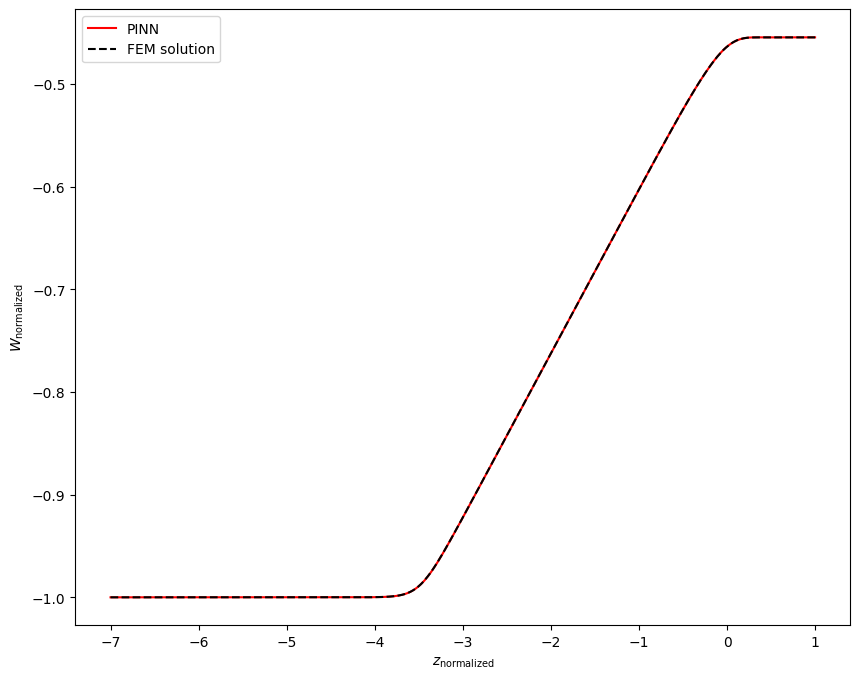


Epoch: 364000/400000
Loss: 0.06711981445550919
C_mean: -11.694339752197266
C_std: 0.017067590728402138
Loss ODE: 0.028698474168777466
Loss z0: 0.0
Loss zf: 3.62396240234375e-05
KL divergence: 3.805894374847412


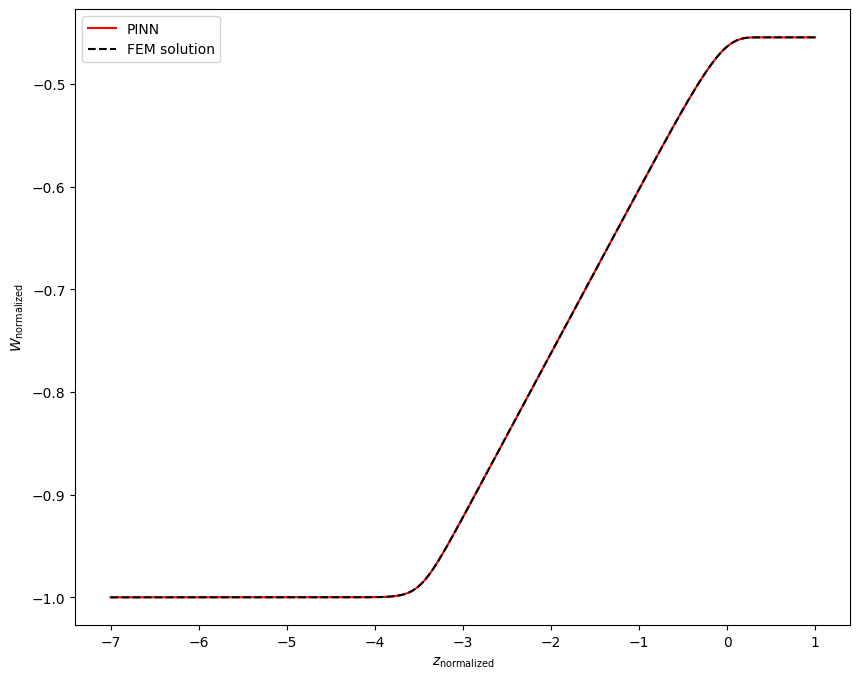


Epoch: 365000/400000
Loss: 0.05198267102241516
C_mean: -11.694491386413574
C_std: 0.017070302739739418
Loss ODE: 0.013203570619225502
Loss z0: 0.0
Loss zf: 7.215142250061035e-05
KL divergence: 3.8057587146759033


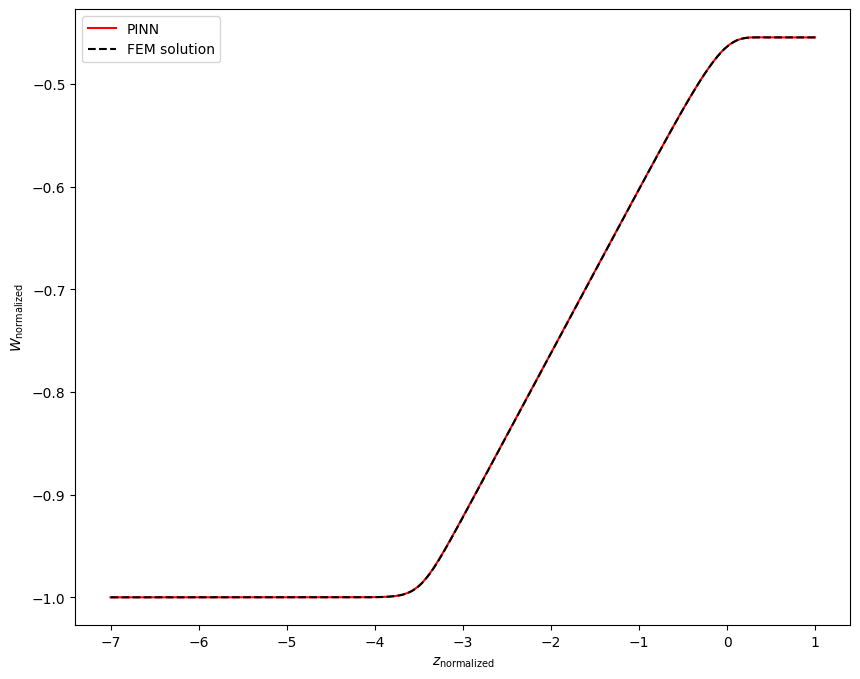


Epoch: 366000/400000
Loss: 0.04261191189289093
C_mean: -11.694321632385254
C_std: 0.01706399954855442
Loss ODE: 0.004231107886880636
Loss z0: 0.0
Loss zf: 3.197789192199707e-05
KL divergence: 3.806102752685547


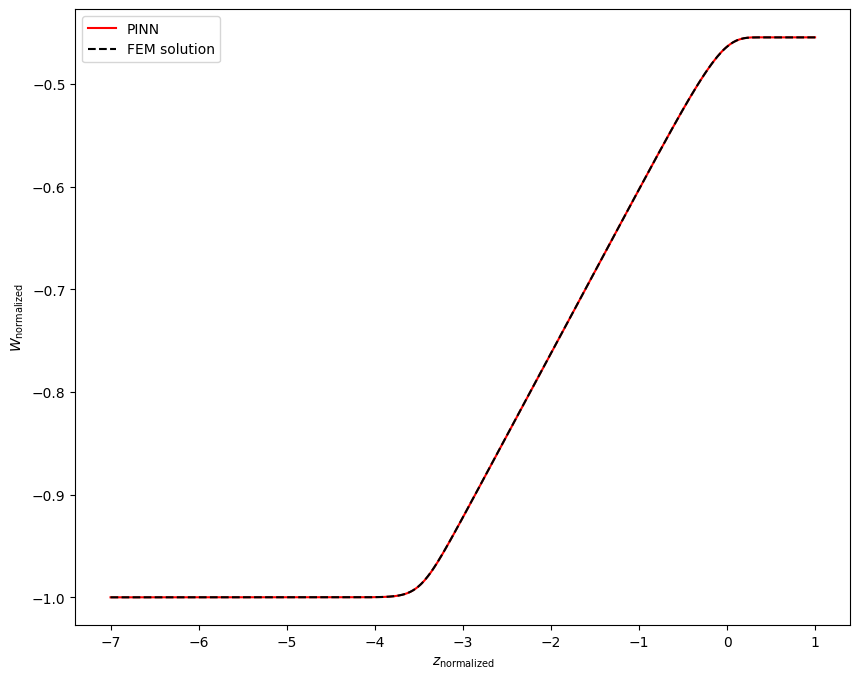


Epoch: 367000/400000
Loss: 0.048921167850494385
C_mean: -11.694355964660645
C_std: 0.017064662650227547
Loss ODE: 0.009106582961976528
Loss z0: 0.0
Loss zf: 0.00017538666725158691
KL divergence: 3.8060717582702637


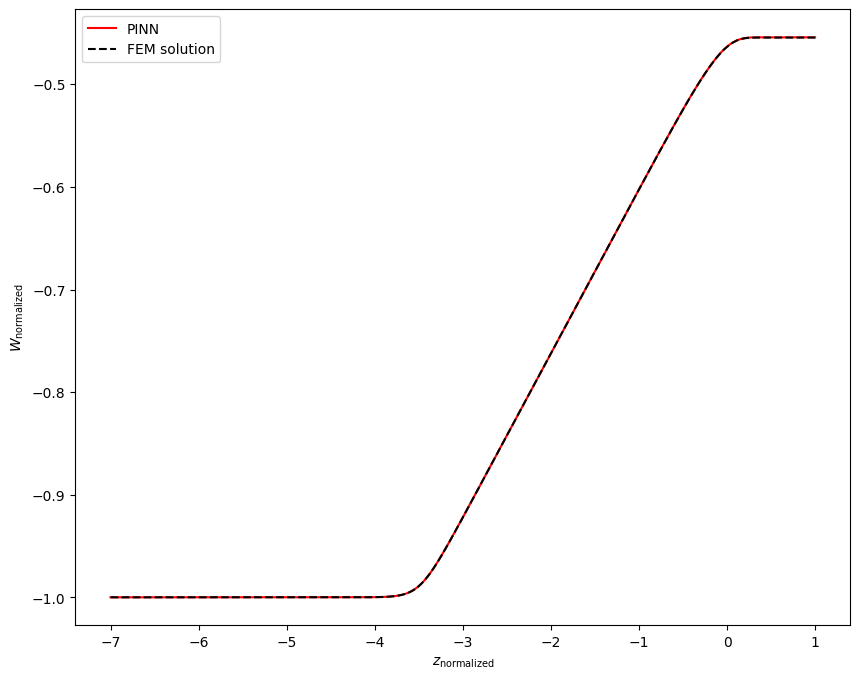


Epoch: 368000/400000
Loss: 0.04580597206950188
C_mean: -11.69430923461914
C_std: 0.017071262001991272
Loss ODE: 0.007744405418634415
Loss z0: 0.0
Loss zf: 4.76837158203125e-07
KL divergence: 3.8056797981262207


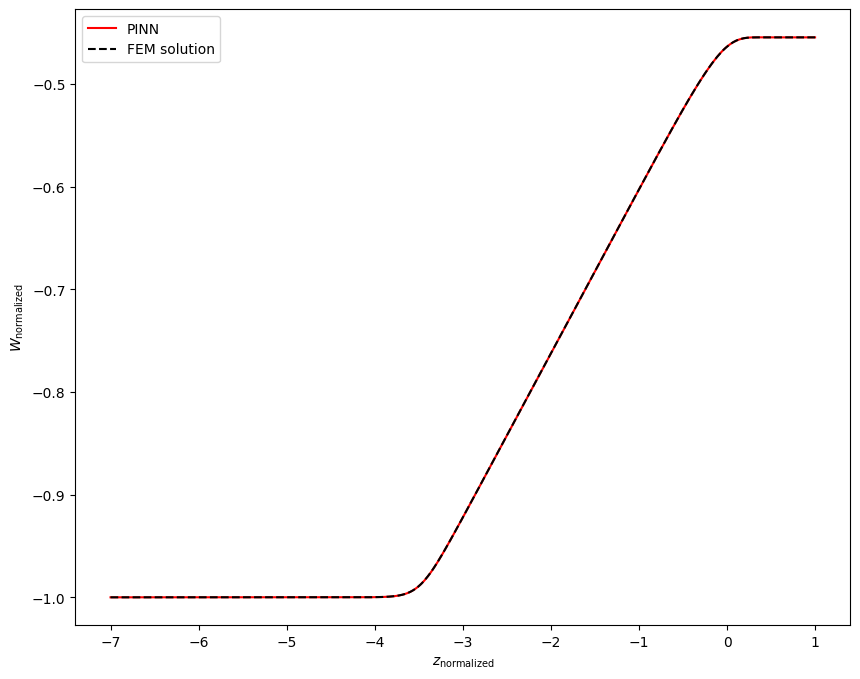


Epoch: 369000/400000
Loss: 0.05557240545749664
C_mean: -11.694459915161133
C_std: 0.017045317217707634
Loss ODE: 0.017267514020204544
Loss z0: 0.0
Loss zf: 2.327561378479004e-05
KL divergence: 3.80721378326416


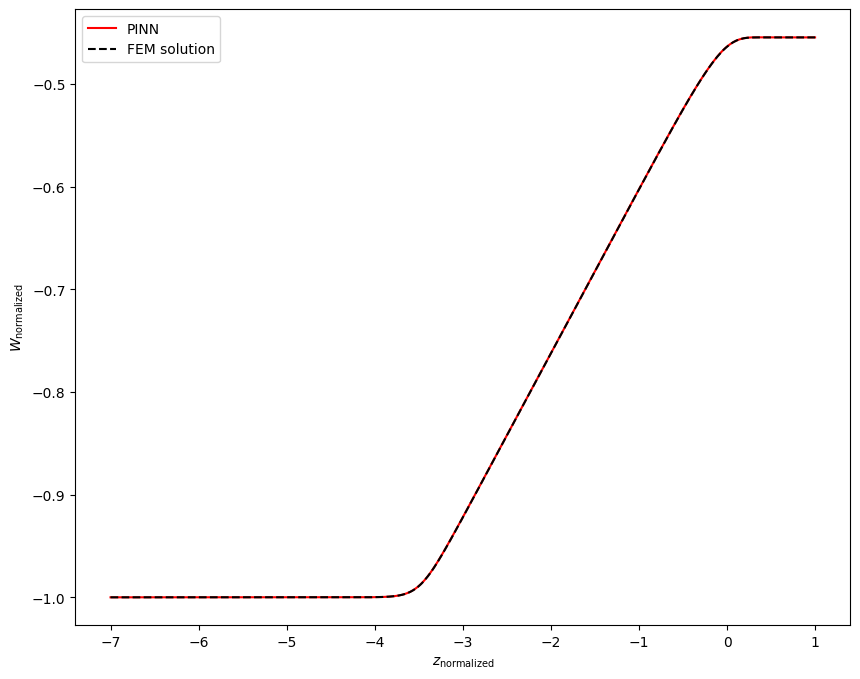


Epoch: 370000/400000
Loss: 0.044260237365961075
C_mean: -11.694378852844238
C_std: 0.01705675572156906
Loss ODE: 0.0050928001292049885
Loss z0: 0.0
Loss zf: 0.00011020898818969727
KL divergence: 3.806534767150879


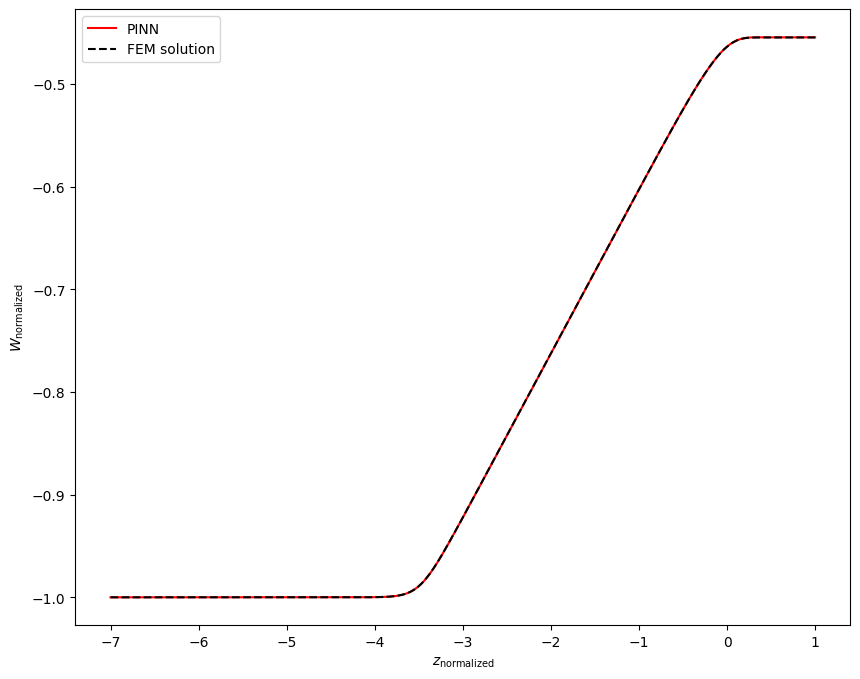


Epoch: 371000/400000
Loss: 0.04883931577205658
C_mean: -11.69421672821045
C_std: 0.017042020335793495
Loss ODE: 0.01075802557170391
Loss z0: 0.0
Loss zf: 7.450580596923828e-07
KL divergence: 3.8073837757110596


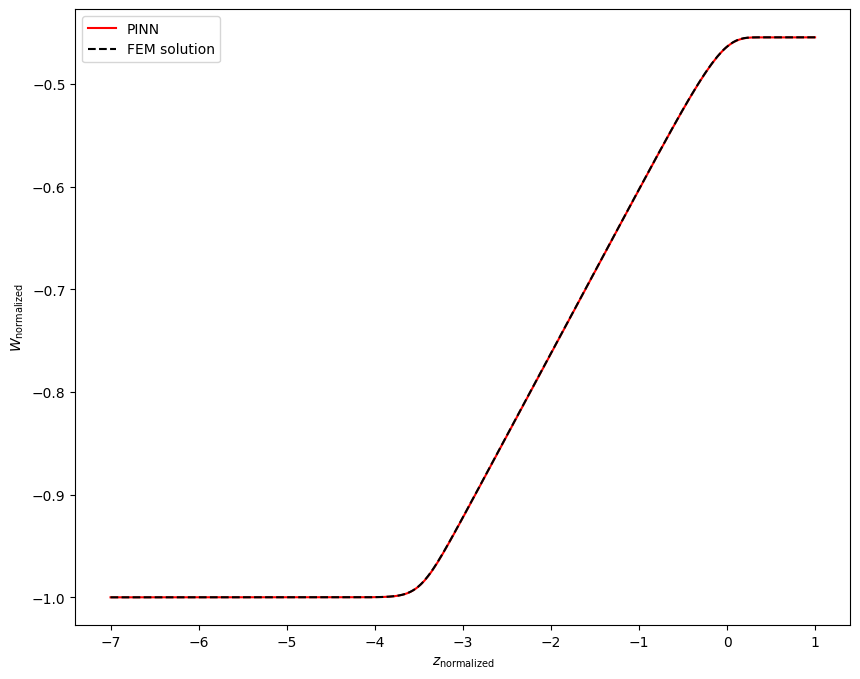


Epoch: 372000/400000
Loss: 0.05277986079454422
C_mean: -11.694352149963379
C_std: 0.01702677644789219
Loss ODE: 0.013477766886353493
Loss z0: 0.0
Loss zf: 0.00012192130088806152
KL divergence: 3.808288335800171


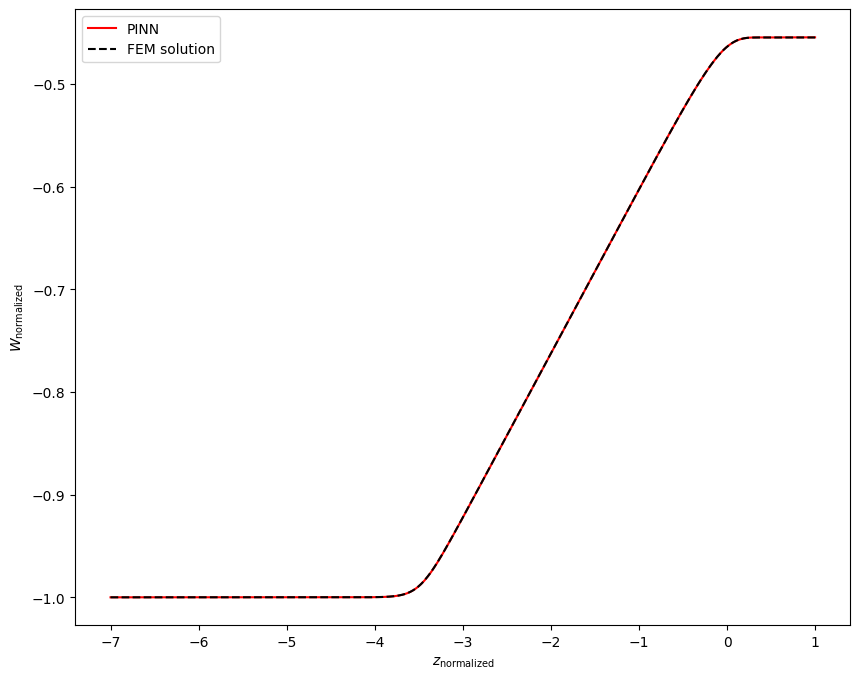


Epoch: 373000/400000
Loss: 0.04477318748831749
C_mean: -11.694361686706543
C_std: 0.017020223662257195
Loss ODE: 0.005986676085740328
Loss z0: 0.0
Loss zf: 6.99758529663086e-05
KL divergence: 3.808675527572632


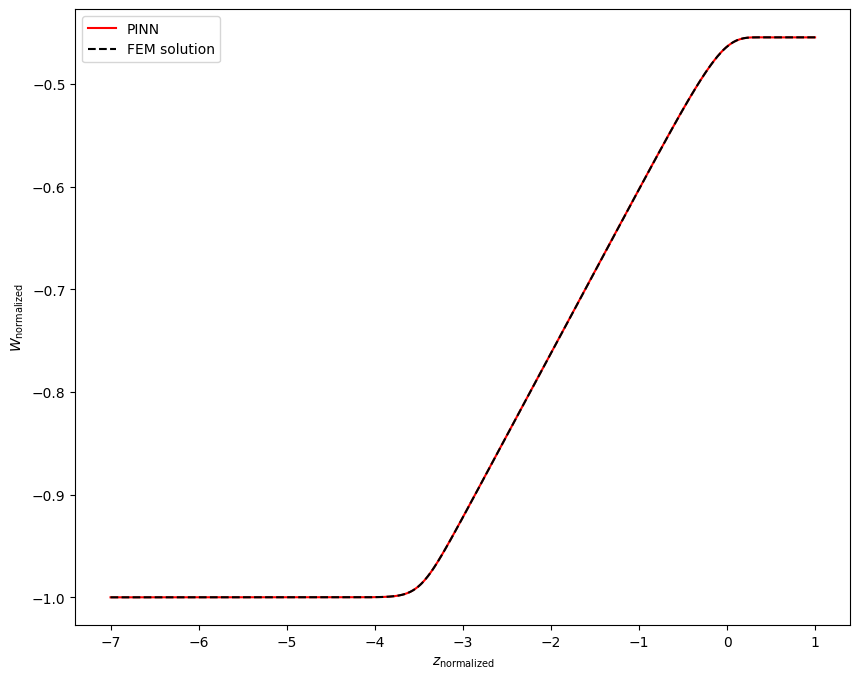


Epoch: 374000/400000
Loss: 0.04837300628423691
C_mean: -11.6943998336792
C_std: 0.016996847465634346
Loss ODE: 0.00948294997215271
Loss z0: 0.0
Loss zf: 7.894635200500488e-05
KL divergence: 3.8100593090057373


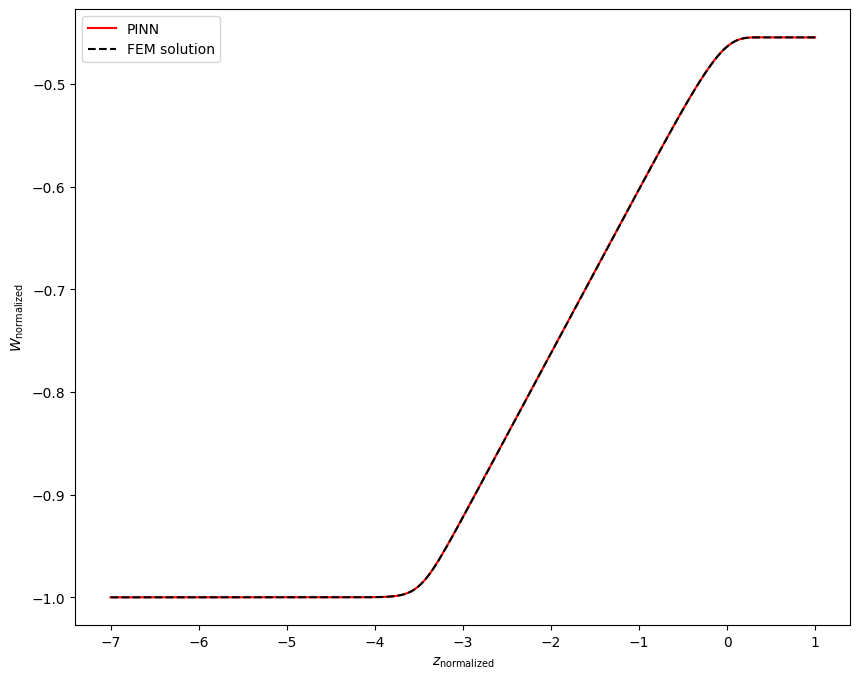


Epoch: 375000/400000
Loss: 0.049532920122146606
C_mean: -11.694436073303223
C_std: 0.016962172463536263
Loss ODE: 0.011163318529725075
Loss z0: 0.0
Loss zf: 2.485513687133789e-05
KL divergence: 3.8121049404144287


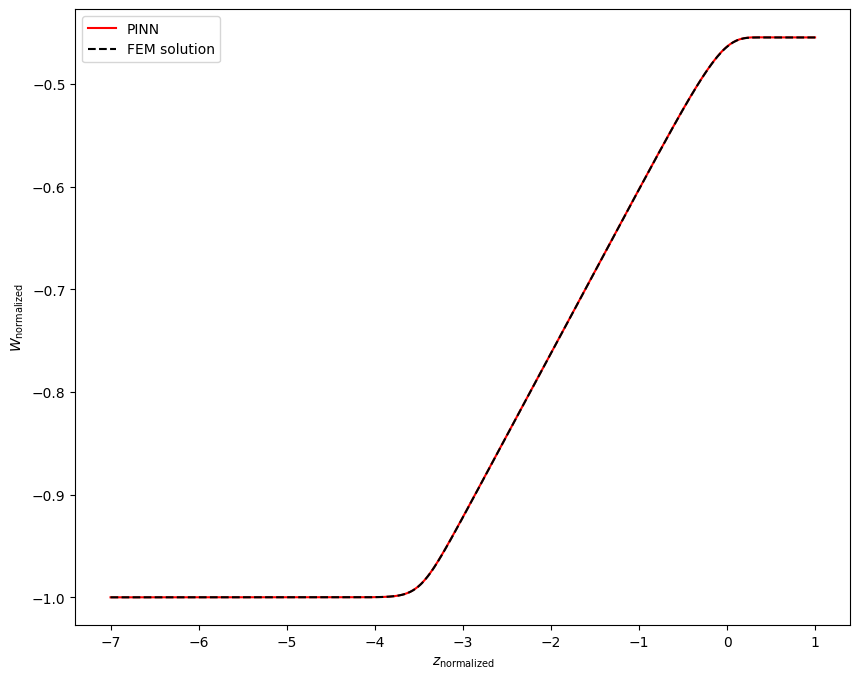


Epoch: 376000/400000
Loss: 0.04415642470121384
C_mean: -11.69433307647705
C_std: 0.016927313059568405
Loss ODE: 0.0056218793615698814
Loss z0: 0.0
Loss zf: 3.930926322937012e-05
KL divergence: 3.814145088195801


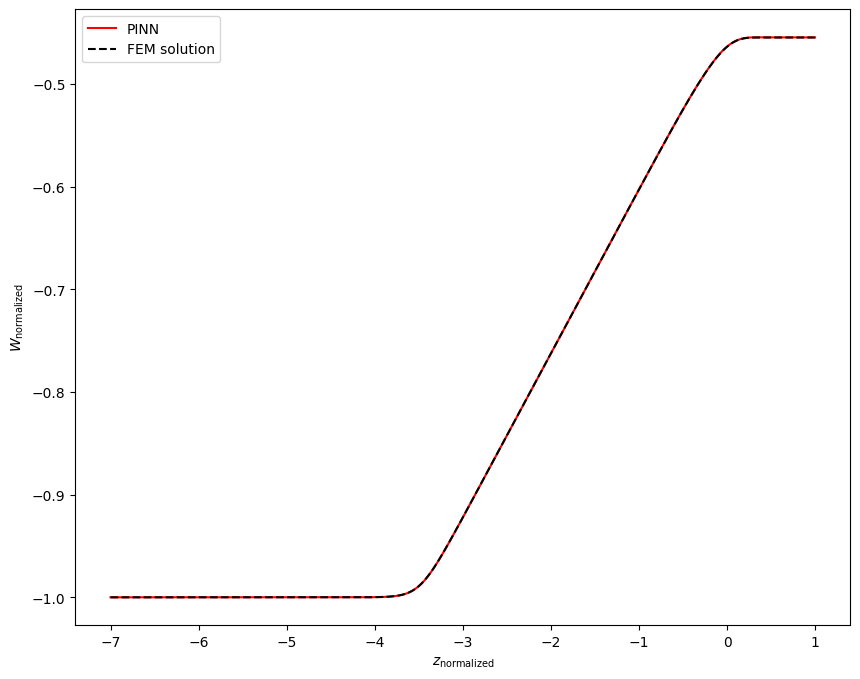


Epoch: 377000/400000
Loss: 0.04465460777282715
C_mean: -11.694217681884766
C_std: 0.016918128356337547
Loss ODE: 0.006433617323637009
Loss z0: 0.0
Loss zf: 7.420778274536133e-06
KL divergence: 3.814678192138672


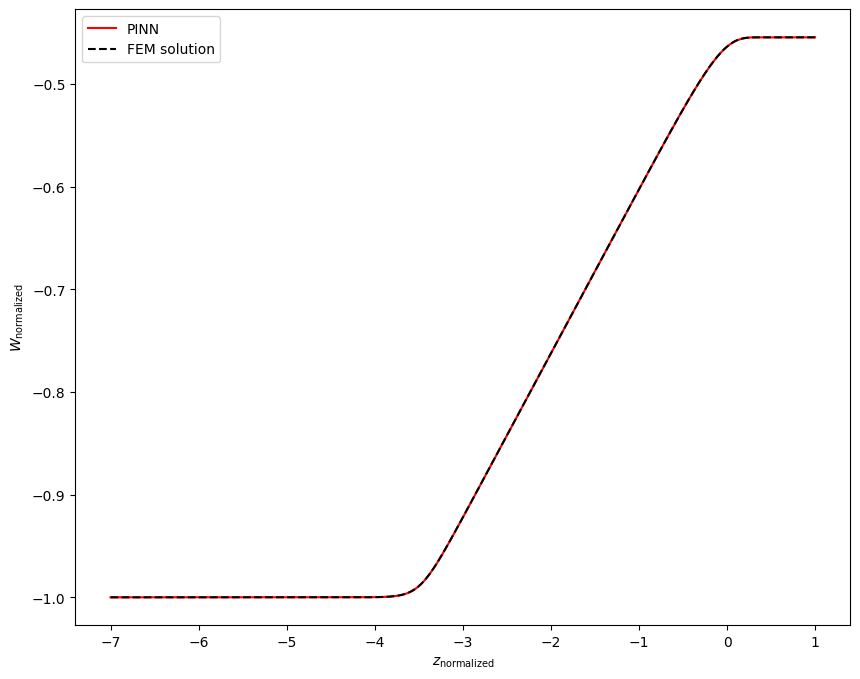


Epoch: 378000/400000
Loss: 0.06189534813165665
C_mean: -11.694303512573242
C_std: 0.01691468060016632
Loss ODE: 0.022184843197464943
Loss z0: 0.0
Loss zf: 0.00015616416931152344
KL divergence: 3.8148863315582275


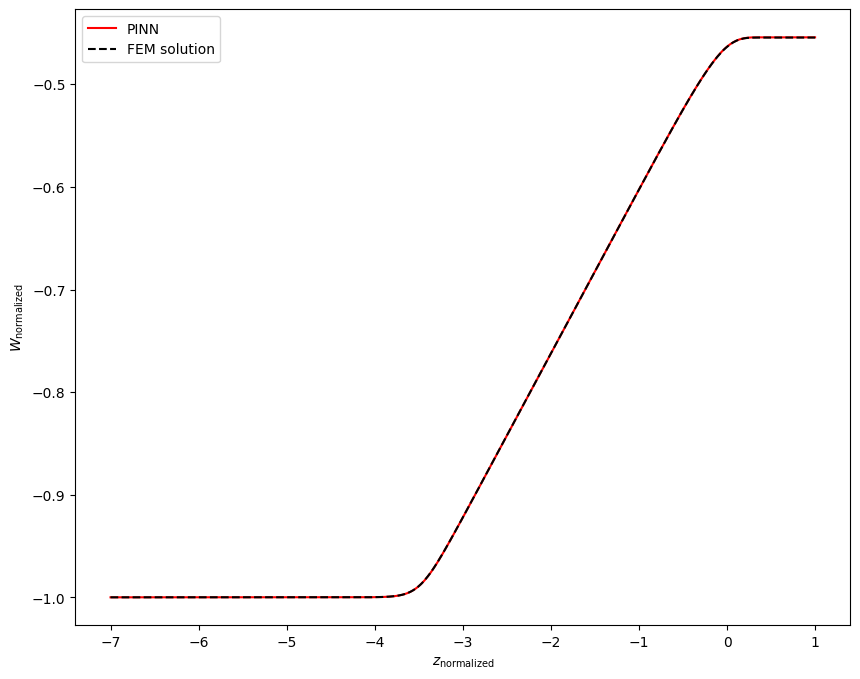


Epoch: 379000/400000
Loss: 0.04632679373025894
C_mean: -11.694310188293457
C_std: 0.016892381012439728
Loss ODE: 0.007623209152370691
Loss z0: 0.0
Loss zf: 5.415081977844238e-05
KL divergence: 3.8162074089050293


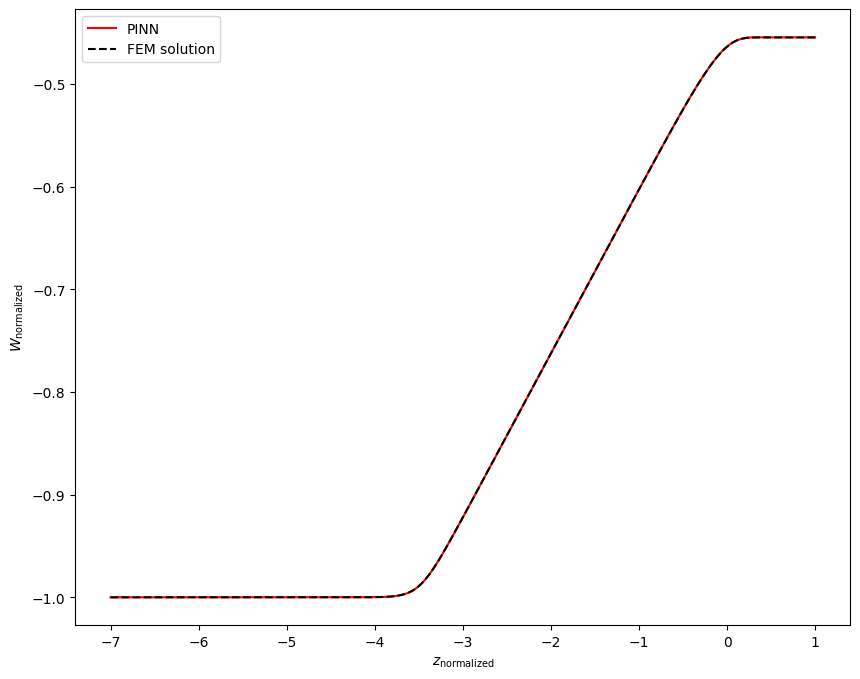


Epoch: 380000/400000
Loss: 0.046879880130290985
C_mean: -11.694246292114258
C_std: 0.01689176633954048
Loss ODE: 0.006729958578944206
Loss z0: 0.0
Loss zf: 0.00019875168800354004
KL divergence: 3.8162407875061035


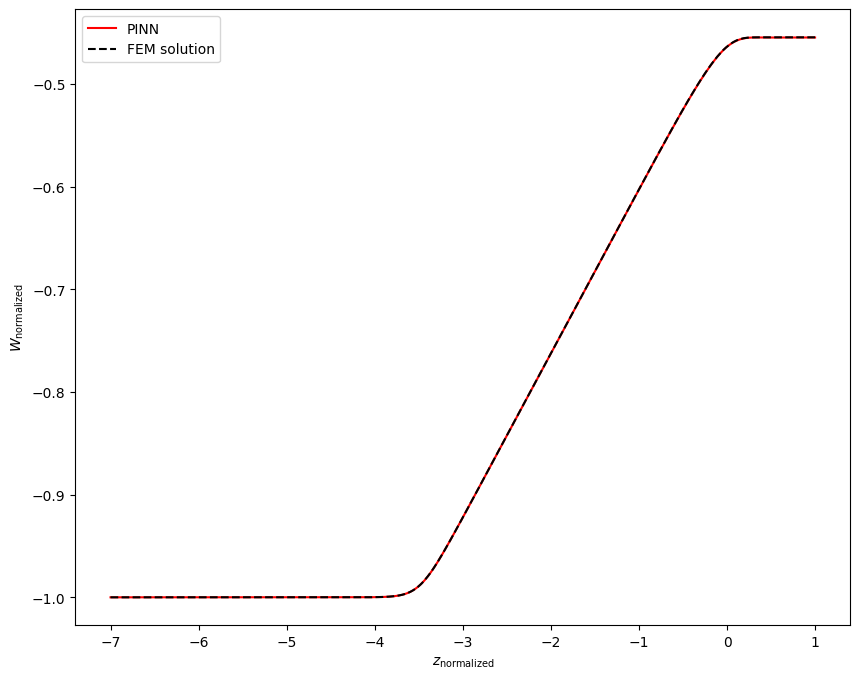


Epoch: 381000/400000
Loss: 0.05451439321041107
C_mean: -11.69426441192627
C_std: 0.016898175701498985
Loss ODE: 0.016151616349816322
Loss z0: 0.0
Loss zf: 2.041459083557129e-05
KL divergence: 3.8158633708953857


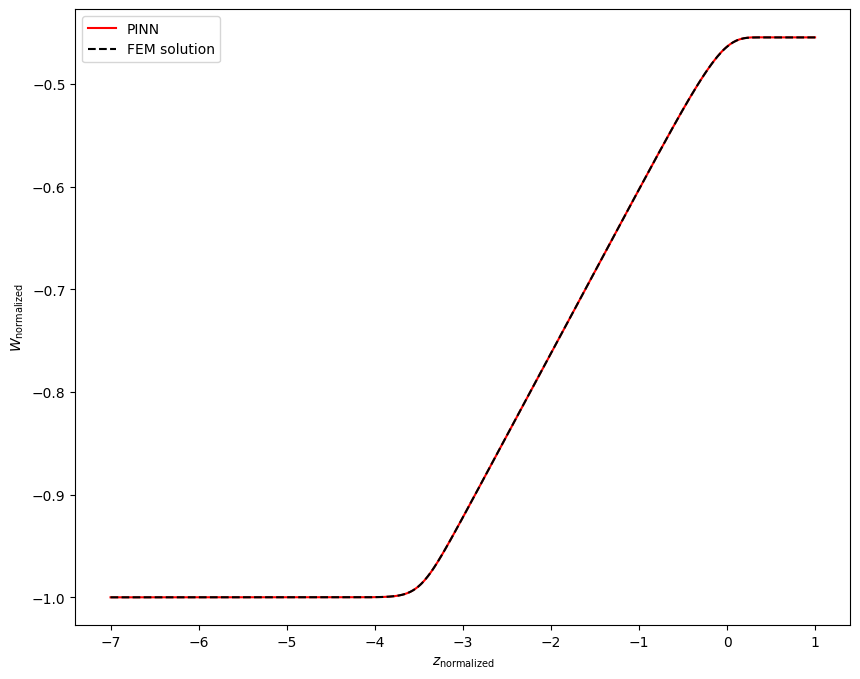


Epoch: 382000/400000
Loss: 0.0651494562625885
C_mean: -11.694371223449707
C_std: 0.016867250204086304
Loss ODE: 0.026771221309900284
Loss z0: 0.0
Loss zf: 2.0116567611694336e-05
KL divergence: 3.817707061767578


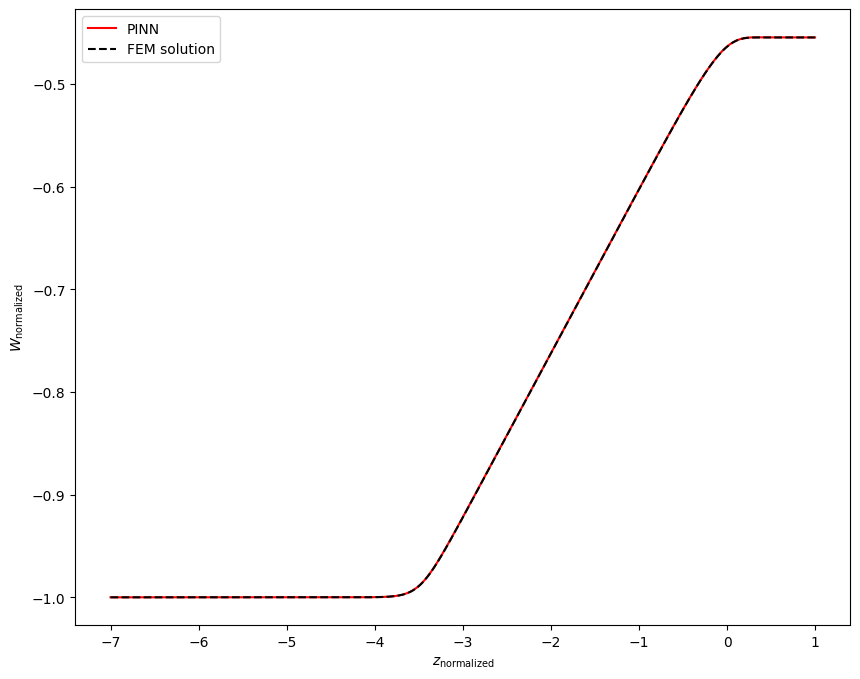


Epoch: 383000/400000
Loss: 0.041626449674367905
C_mean: -11.694263458251953
C_std: 0.016870616003870964
Loss ODE: 0.002935932017862797
Loss z0: 0.0
Loss zf: 5.155801773071289e-05
KL divergence: 3.8174939155578613


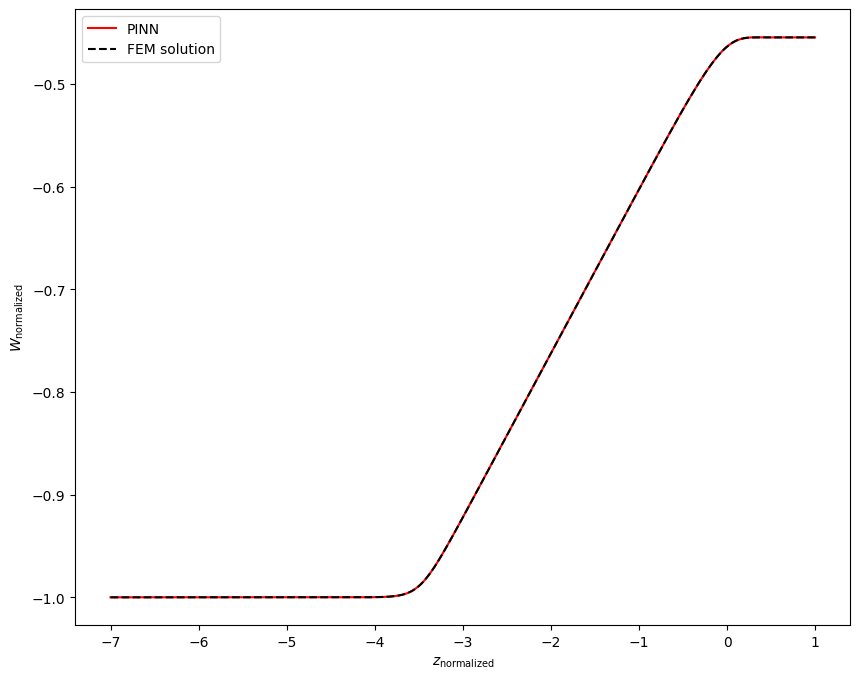


Epoch: 384000/400000
Loss: 0.05337238311767578
C_mean: -11.694405555725098
C_std: 0.016862545162439346
Loss ODE: 0.014351454563438892
Loss z0: 0.0
Loss zf: 8.410215377807617e-05
KL divergence: 3.817990779876709


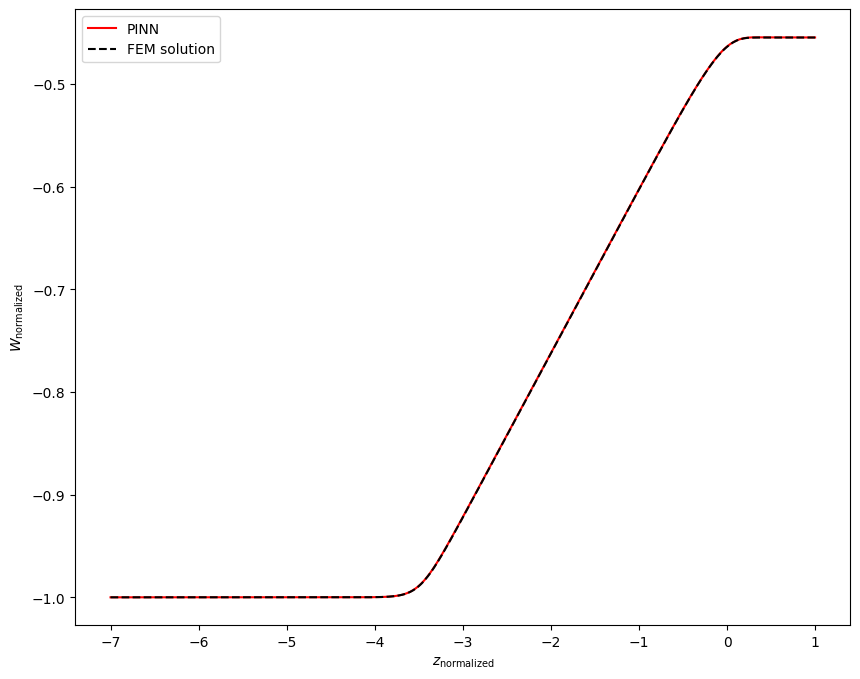


Epoch: 385000/400000
Loss: 0.05715978890657425
C_mean: -11.69437313079834
C_std: 0.01683410257101059
Loss ODE: 0.018641768023371696
Loss z0: 0.0
Loss zf: 3.212690353393555e-05
KL divergence: 3.8196749687194824


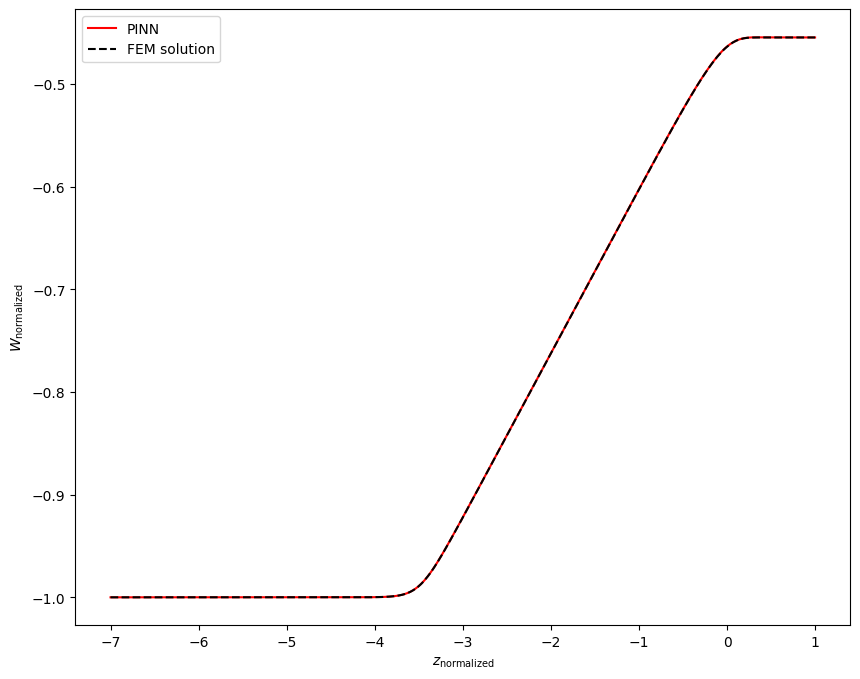


Epoch: 386000/400000
Loss: 0.04758908227086067
C_mean: -11.694395065307617
C_std: 0.016824284568428993
Loss ODE: 0.007900573313236237
Loss z0: 0.0
Loss zf: 0.00014859437942504883
KL divergence: 3.8202567100524902


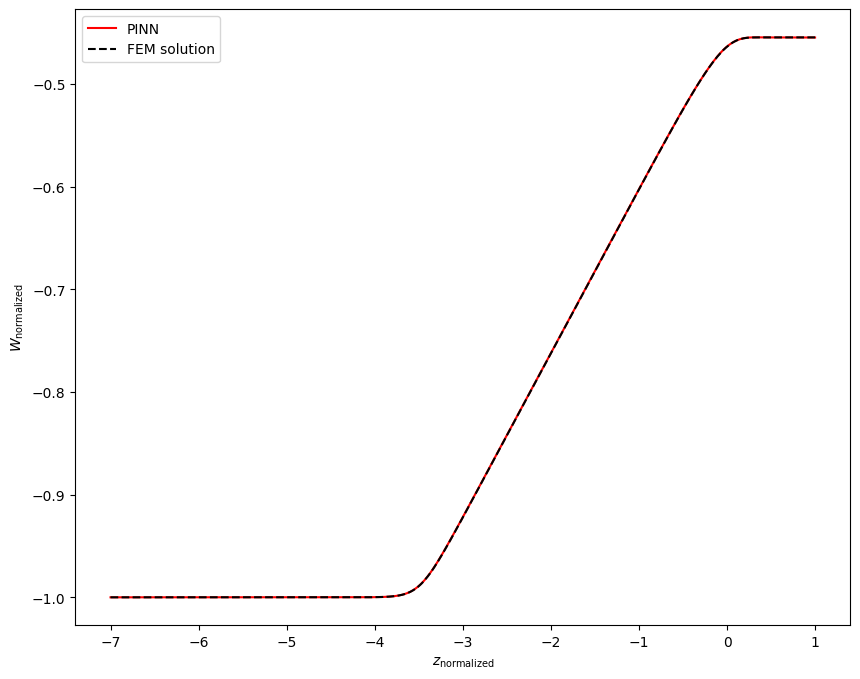


Epoch: 387000/400000
Loss: 0.04564572125673294
C_mean: -11.694326400756836
C_std: 0.016817700117826462
Loss ODE: 0.00741370115429163
Loss z0: 0.0
Loss zf: 2.562999725341797e-06
KL divergence: 3.820639133453369


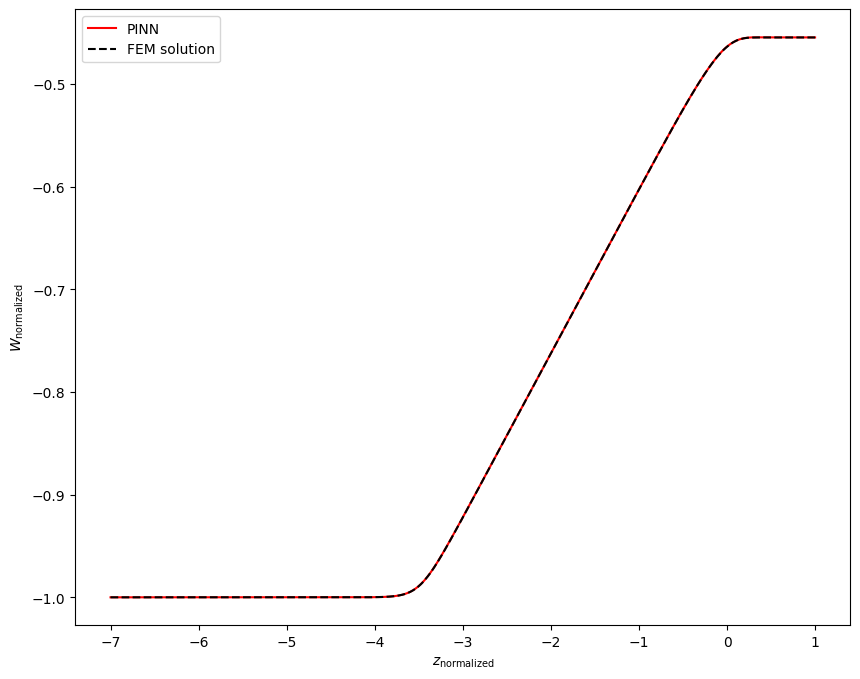


Epoch: 388000/400000
Loss: 0.041931550949811935
C_mean: -11.694291114807129
C_std: 0.016796566545963287
Loss ODE: 0.0034610687289386988
Loss z0: 0.0
Loss zf: 2.5153160095214844e-05
KL divergence: 3.821895122528076


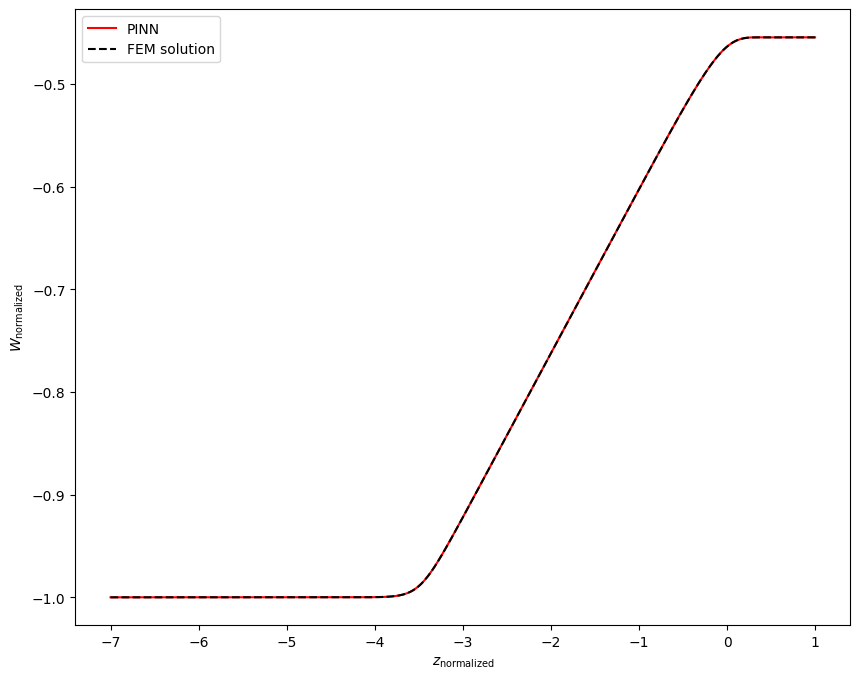


Epoch: 389000/400000
Loss: 0.04960692673921585
C_mean: -11.694243431091309
C_std: 0.016786029562354088
Loss ODE: 0.01093828584998846
Loss z0: 0.0
Loss zf: 4.4345855712890625e-05
KL divergence: 3.8225181102752686


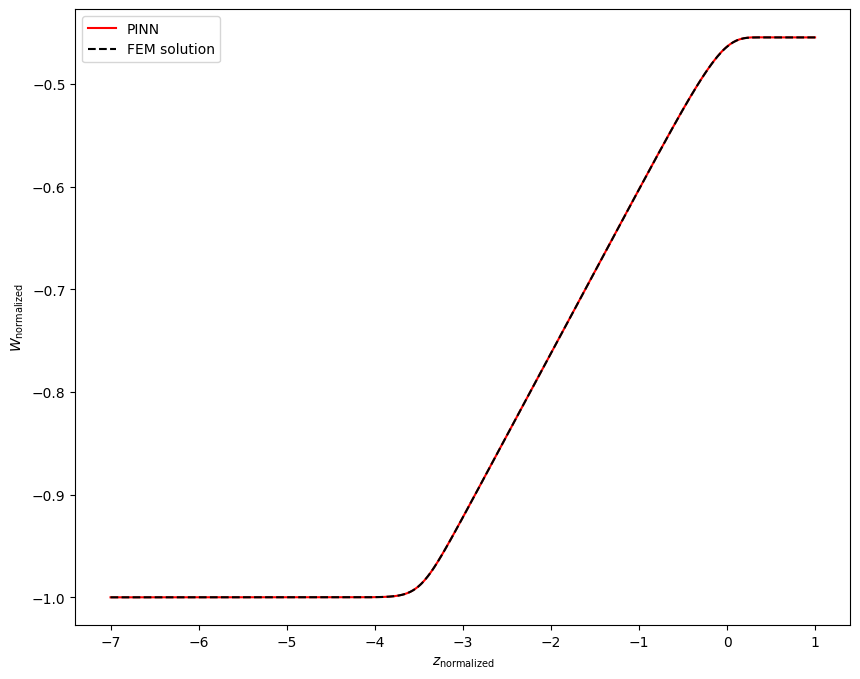


Epoch: 390000/400000
Loss: 0.04408814013004303
C_mean: -11.69437313079834
C_std: 0.016749683767557144
Loss ODE: 0.004624049179255962
Loss z0: 0.0
Loss zf: 0.00012171268463134766
KL divergence: 3.8246963024139404


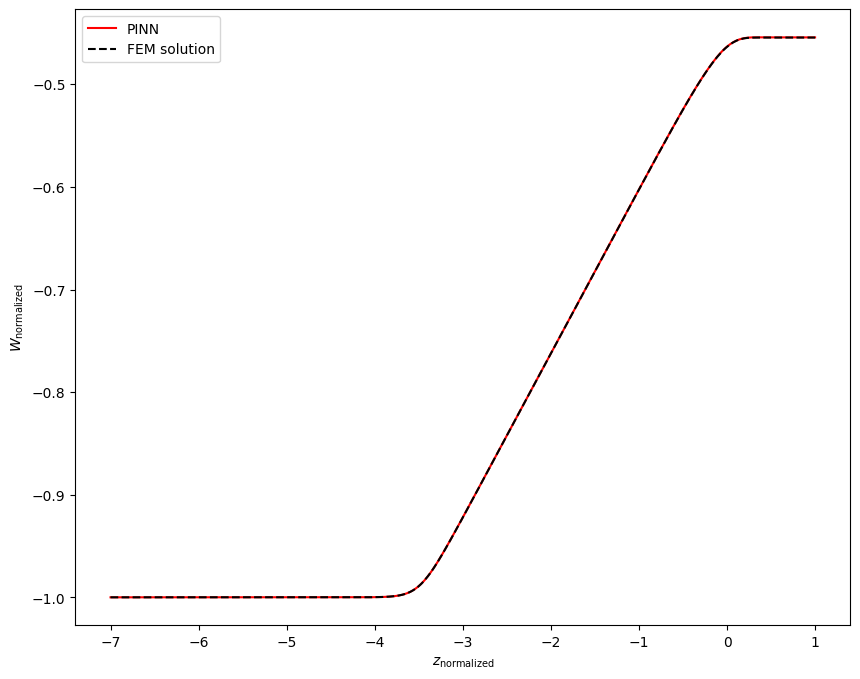


Epoch: 391000/400000
Loss: 0.045464374125003815
C_mean: -11.694305419921875
C_std: 0.016731753945350647
Loss ODE: 0.006439919117838144
Loss z0: 0.0
Loss zf: 7.668137550354004e-05
KL divergence: 3.8257641792297363


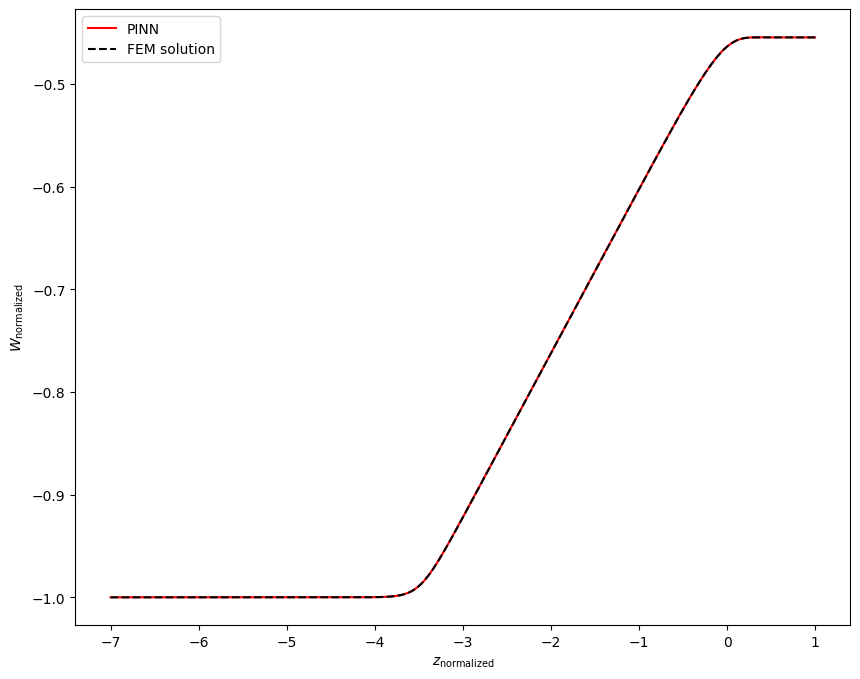


Epoch: 392000/400000
Loss: 0.05470994859933853
C_mean: -11.694242477416992
C_std: 0.016730789095163345
Loss ODE: 0.01621905341744423
Loss z0: 0.0
Loss zf: 2.327561378479004e-05
KL divergence: 3.8258140087127686


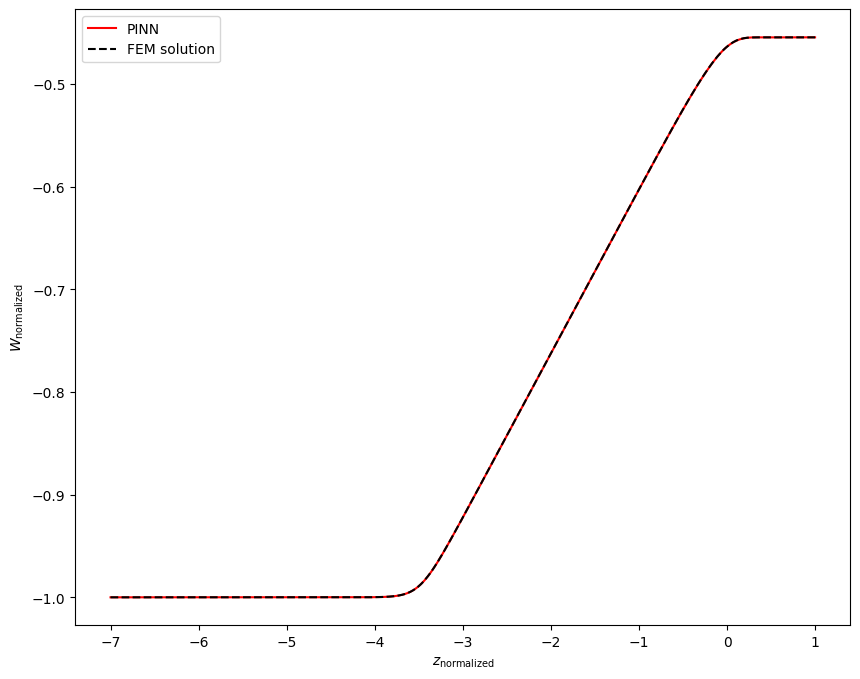


Epoch: 393000/400000
Loss: 0.04619570076465607
C_mean: -11.694232940673828
C_std: 0.016719676554203033
Loss ODE: 0.007026778068393469
Loss z0: 0.0
Loss zf: 9.042024612426758e-05
KL divergence: 3.826472282409668


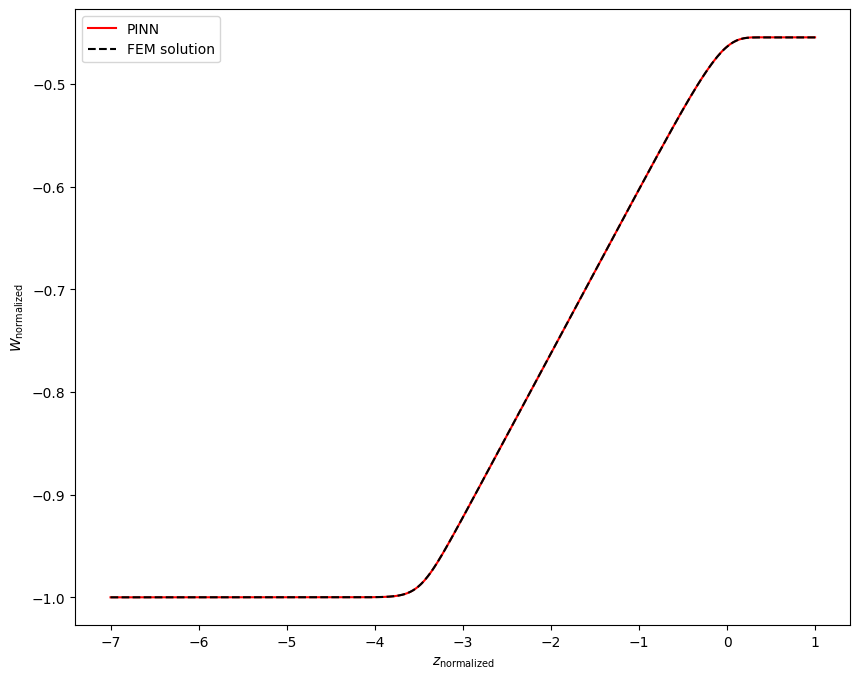


Epoch: 394000/400000
Loss: 0.06428524851799011
C_mean: -11.694171905517578
C_std: 0.01671759784221649
Loss ODE: 0.024673182517290115
Loss z0: 0.0
Loss zf: 0.00013461709022521973
KL divergence: 3.826589345932007


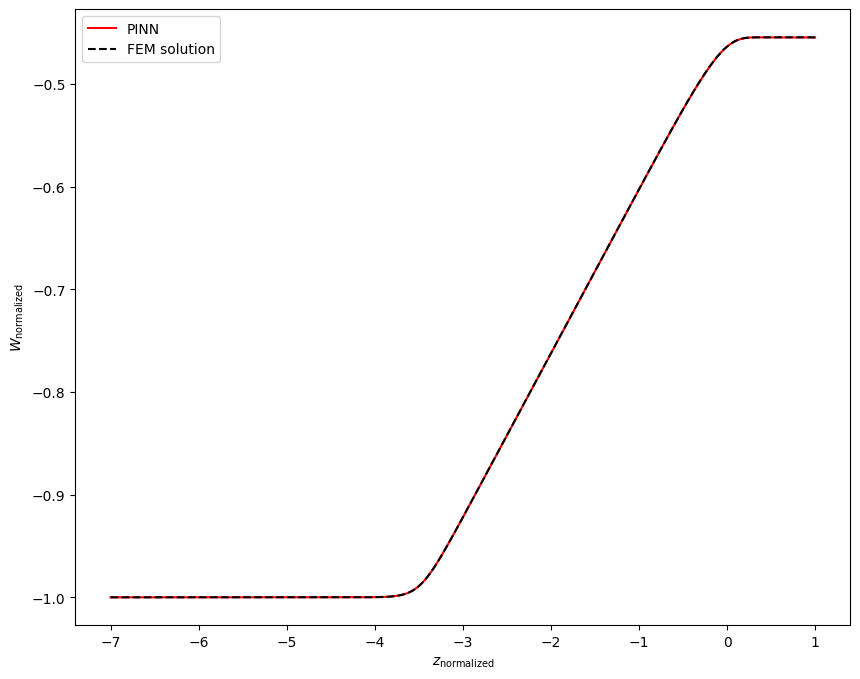


Epoch: 395000/400000
Loss: 0.06095701456069946
C_mean: -11.694246292114258
C_std: 0.016693133860826492
Loss ODE: 0.022306548431515694
Loss z0: 0.0
Loss zf: 3.698468208312988e-05
KL divergence: 3.8280622959136963


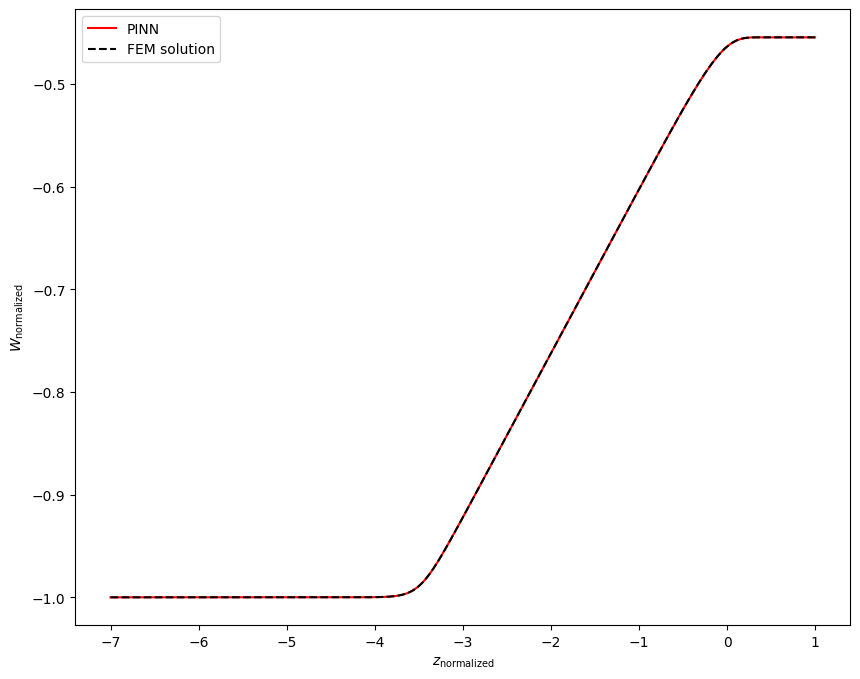


Epoch: 396000/400000
Loss: 0.0530381053686142
C_mean: -11.694295883178711
C_std: 0.01669284887611866
Loss ODE: 0.013223327696323395
Loss z0: 0.0
Loss zf: 0.00015339255332946777
KL divergence: 3.82808518409729


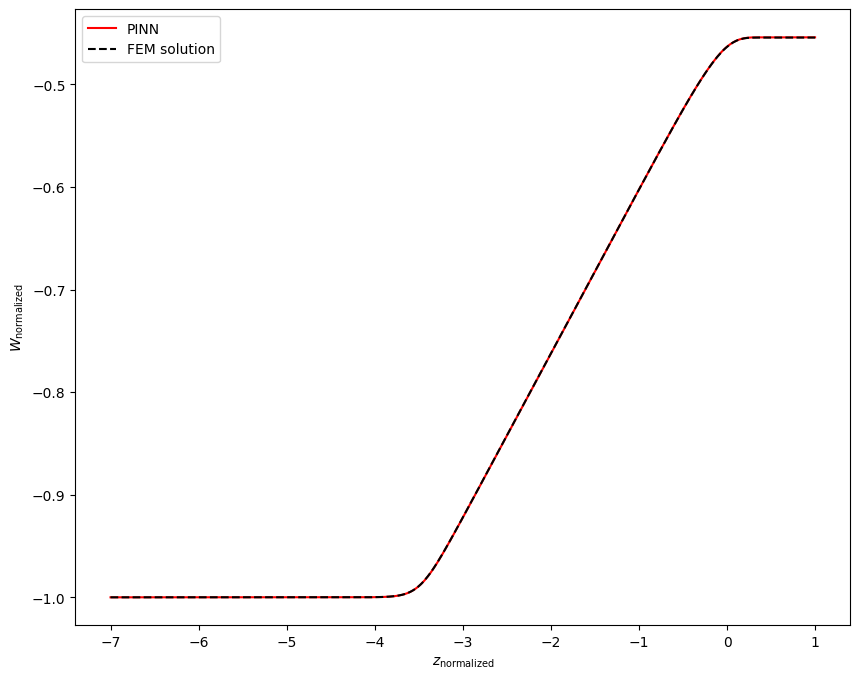


Epoch: 397000/400000
Loss: 0.04854815825819969
C_mean: -11.694351196289062
C_std: 0.016687465831637383
Loss ODE: 0.009977012872695923
Loss z0: 0.0
Loss zf: 2.8699636459350586e-05
KL divergence: 3.8284149169921875


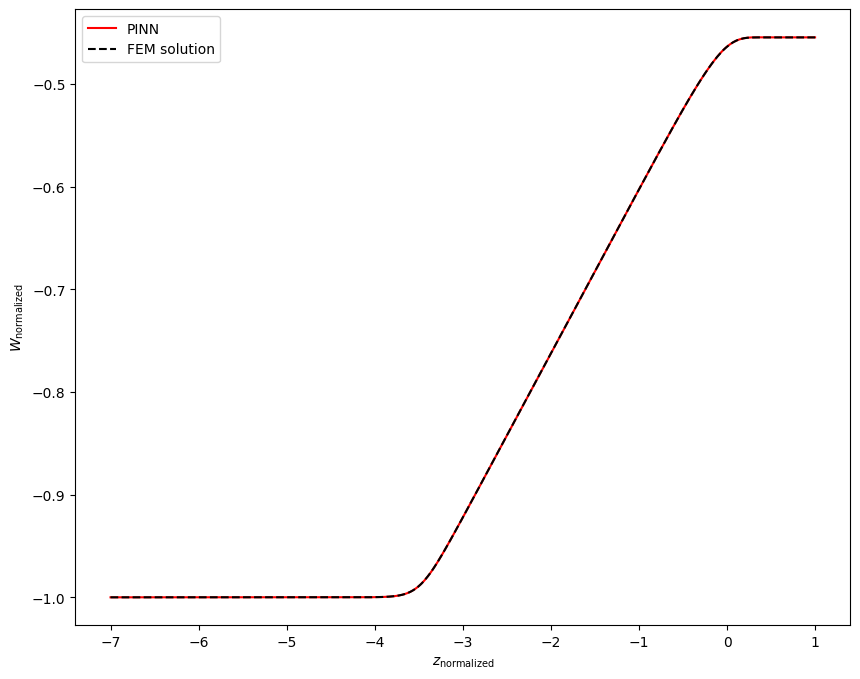


Epoch: 398000/400000
Loss: 0.060452789068222046
C_mean: -11.694412231445312
C_std: 0.01667199097573757
Loss ODE: 0.02035088650882244
Loss z0: 0.0
Loss zf: 0.00018084049224853516
KL divergence: 3.8293497562408447


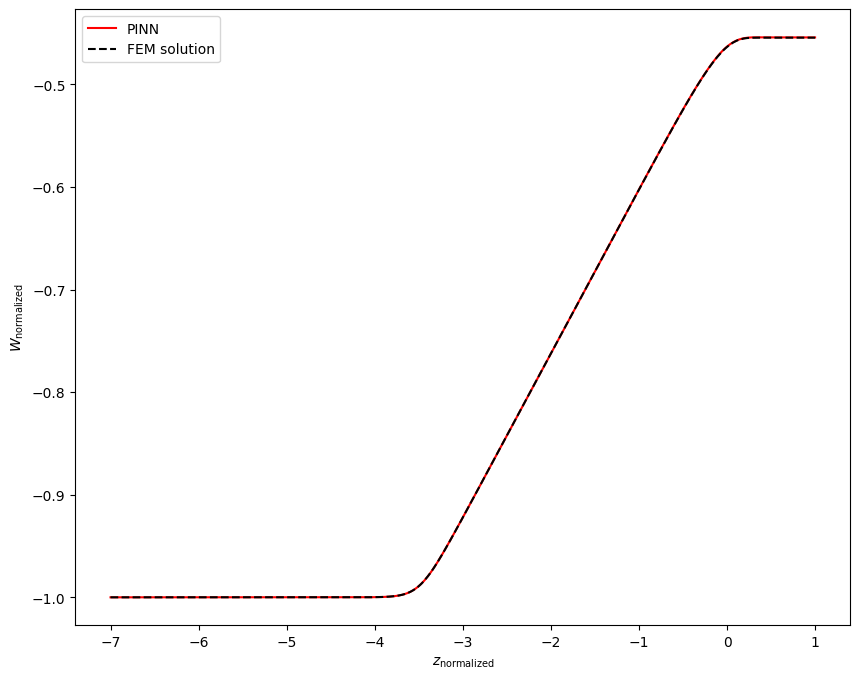


Epoch: 399000/400000
Loss: 0.04553120583295822
C_mean: -11.694319725036621
C_std: 0.016656789928674698
Loss ODE: 0.006989643909037113
Loss z0: 0.0
Loss zf: 2.390146255493164e-05
KL divergence: 3.8302547931671143


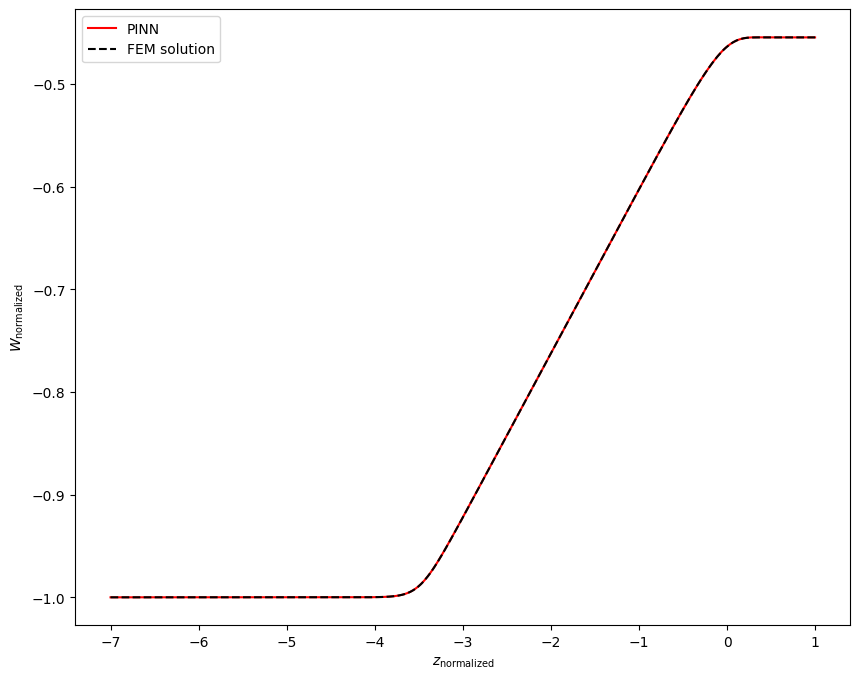


Epoch: 400000/400000
Loss: 0.04695221409201622
C_mean: -11.694265365600586
C_std: 0.016649307683110237
Loss ODE: 0.00727794598788023
Loss z0: 0.0
Loss zf: 0.0001367330551147461
KL divergence: 3.8306937217712402


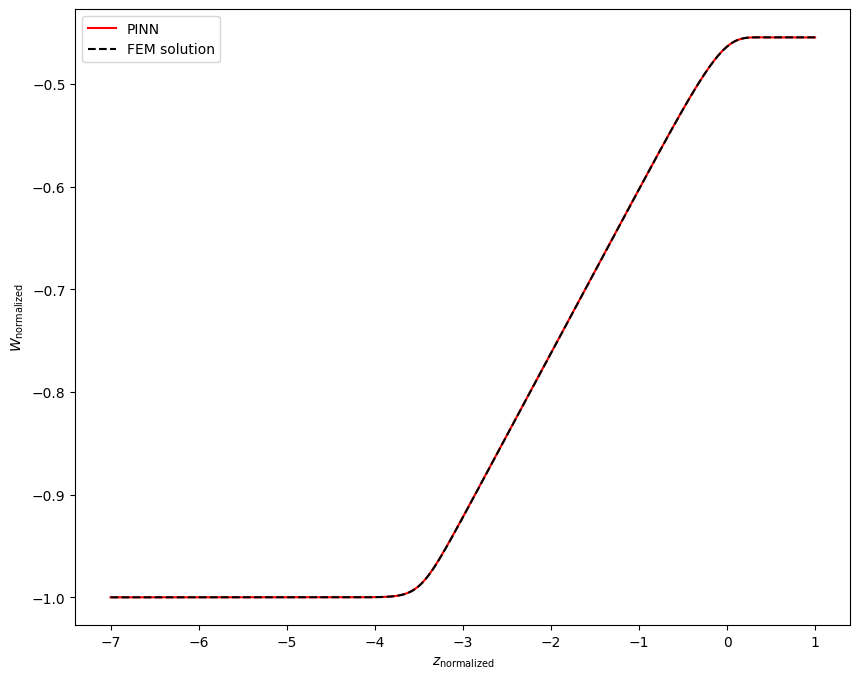

In [17]:
# We save the historical C and losses
train_loss_record = []

for k in range(1, epochs + 1):
    epoch_tf = tf.convert_to_tensor(k, dtype=tf.float32)
    loss_var = step(z_coloc, model, optm, epoch_tf)
    train_loss_record.append(loss_var)
    
    # Show output on the PINN
    if k % 1000 == 0:
        print('\nEpoch: {0}/{1}'.format(k, epochs))
        print('Loss: {0}'.format(loss_var[-1]))
        print('C_mean: {0}'.format(loss_var[0].numpy()))
        print('C_std: {0}'.format(loss_var[1].numpy()))
        print('Loss ODE: {0}'.format(loss_var[2]))
        print('Loss z0: {0}'.format(loss_var[3]))
        print('Loss zf: {0}'.format(loss_var[4]))
        print('KL divergence: {0}'.format(loss_var[5]))
        
        z_test = np.linspace(z0 / z_n, zf / z_n, 500)

        wt = model(z_test)

        plt.figure(figsize = (10,8))
        plt.plot(z_test, wt, 'r', label = 'PINN')
        plt.plot(sol.t/z_n, sol.y[0] / w_n, color='black', linestyle='--', label = r'FEM solution')
        plt.xlabel(r'$z_\mathrm{normalized}$') 
        plt.ylabel(r'$W_\mathrm{normalized}$') 
        plt.legend()
        plt.show()

In [18]:
model.save_weights('data/freeze-in-bayesian.weights.h5')

### Saving data for plots

In [19]:
# Extract historical C and losses
c_mean_history = [k[0].numpy() for k in train_loss_record]
c_std_history = [k[1].numpy() for k in train_loss_record]
total_loss_history = [k[-1] for k in train_loss_record]

np.savetxt("data/BayesianCmean.txt", c_mean_history)
np.savetxt("data/BayesianCstd.txt", c_std_history)
np.savetxt("data/BayesianLoss.txt", total_loss_history)